<h1><center> <font color = Green>Project Title: MARKET MIX MODELLING </font></center></h1>


### `TEAM MEMBERS`
1. Harikrishna Eluri
2. Vidya Kurada

## Problem Statement
Develop a `Market Mix Model` to observe the actual impact of different marketing variables over the last year. Based on the model understanding, recommend the optimal budget allocation for different marketing levers for the next year. The following `sub categories` that are under study for the capstone project.

1. __Camera Accessory__
2. __Home Audio__
3. __Gaming Accessory__

In [1]:
import warnings
warnings.filterwarnings('ignore')

## Section - 1: `Consumer Electronics Data` - Order Level

## 1. Loading and Basic Inspection of Data

In [2]:
# Load required libraries

# Basic Libraries
import numpy as np
import pandas as pd

# Basic Visualization Libraries
import matplotlib.pyplot as plt
from matplotlib.pyplot import xticks
import seaborn as sns
%matplotlib inline
pd.set_option('display.float_format','{:0.5f}'.format)


from sklearn.preprocessing import StandardScaler



In [3]:
class color:
   PURPLE = '\033[95m'
   CYAN = '\033[96m'
   DARKCYAN = '\033[36m'
   BLUE = '\033[94m'
   GREEN = '\033[92m'
   YELLOW = '\033[93m'
   RED = '\033[91m'
   BOLD = '\033[1m'
   UNDERLINE = '\033[4m'
   END = '\033[0m'

In [4]:
# Load the data
df_original = pd.read_csv('ConsumerElectronics.csv', na_values=['\\N',''])
# Let us make a copy of original data 
df_original_copy = df_original.copy()

In [5]:
# Def to inspect Data
def inspect_df(Dataframe,head_value):
    df = Dataframe
    print(color.BOLD+'Step 1: Peek into the data:'+color.END, '\n',df.head(head_value),'\n','\n')
    print(color.BOLD+'Step 2: Dimensions of the data:'+ color.END,'\n',df.shape,'\n','\n')
    print(color.BOLD+'Step 3: Columns with in data:'+ color.END,'\n',df.columns,'\n','\n')
    print(color.BOLD+'Step 4: Data Information: '+ color.END,'\n')
    print(df.info(),'\n','\n')
    print(color.BOLD+'Step 5: Descriptive Statistics of data:'+ color.END,' \n', df.describe())

In [6]:
# Calling Data Inspection function
inspect_df(df_original,5)

Step 1: Peek into the data: 
              fsn_id           order_date  Year  Month               order_id  \
0  ACCCX3S58G7B5F6P  2015-10-17 15:11:54  2015     10 3419300926147000.00000   
1  ACCCX3S58G7B5F6P  2015-10-19 10:07:22  2015     10 1420830839915200.00000   
2  ACCCX3S5AHMF55FV  2015-10-20 15:45:56  2015     10 2421912925714800.00000   
3  ACCCX3S5AHMF55FV  2015-10-14 12:05:15  2015     10 4416592101738400.00000   
4  ACCCX3S5AHMF55FV  2015-10-17 21:25:03  2015     10 4419525153426400.00000   

           order_item_id   gmv  units  deliverybdays  deliverycdays  \
0 3419300926147000.00000  6400      1            nan            nan   
1 1420830839915200.00000  6900      1            nan            nan   
2 2421912925714800.00000  1990      1            nan            nan   
3 4416592101738400.00000  1690      1            nan            nan   
4 4419525153426400.00000  1618      1            nan            nan   

  s1_fact.order_payment_type  sla                 cust_id  \
0

### 1.1 `Extracting Essential Data` from the given Consumer Electronics data Set
It is evident from the problem statement that we have to work only on 3 sub categories of products. The sub categories under study include:
1. Camera Accessory
2. Home Audio
3. Gaming Accessory

Let us extract these 3 sub categories of data from the existing data-frame provided and work with it further. In our data, the column that associates with the sub category is __`product_analytic_sub_category`__

In [7]:
# Extracting the required data frame
df = df_original.loc[(df_original['product_analytic_sub_category'] == 'CameraAccessory') |
                 (df_original['product_analytic_sub_category'] == 'HomeAudio') |
                 (df_original['product_analytic_sub_category'] == 'GamingAccessory')]

In [8]:
# Make a copy of the dataframe
df_copy = df.copy()

In [9]:
# Cross Check the sub categories in the extracted dataframe
df['product_analytic_sub_category'].unique()

array(['CameraAccessory', 'GamingAccessory', 'HomeAudio'], dtype=object)

### 1.3 Inspecting the Data Frame

In [10]:
# Inspecting the data frame after extraction
inspect_df(df,2)

Step 1: Peek into the data: 
              fsn_id           order_date  Year  Month               order_id  \
0  ACCCX3S58G7B5F6P  2015-10-17 15:11:54  2015     10 3419300926147000.00000   
1  ACCCX3S58G7B5F6P  2015-10-19 10:07:22  2015     10 1420830839915200.00000   

           order_item_id   gmv  units  deliverybdays  deliverycdays  \
0 3419300926147000.00000  6400      1            nan            nan   
1 1420830839915200.00000  6900      1            nan            nan   

  s1_fact.order_payment_type  sla                 cust_id  \
0                        COD    5  -1.01299130778588E+018   
1                        COD    7  -8.99032457905512E+018   

                  pincode product_analytic_super_category  \
0  -7.79175582905735E+018                              CE   
1   7.33541149097431E+018                              CE   

  product_analytic_category product_analytic_sub_category  \
0           CameraAccessory               CameraAccessory   
1           CameraAccesso

In [11]:
# Percentage of data we are working with
print('Percentage of data to work with under the desired 3 sub categories: ',
      round(100*df.shape[0]/df_original.shape[0],2))

Percentage of data to work with under the desired 3 sub categories:  34.34


#### Remarks: 
1. __We are left to work with only `34.34% of the ConsumerElectronics data` we are provided to work with__
2. __Columns like `deliverybdays`, `deliverycdays` have more null values__
3. __`deliverybdays` and `deliverycdays` have negative numbers to deal with.__ The features correspond to delay in delivery. We expect them to be either 0 or greater but not negative.
4. __`product_mrp` being 0 might relate to offers or free accesories provided.__ We still plan to make it atleast `Rs.1` since we want to see a distinction w.r.t gmv (GMV = 0 talks about offers). 
5. __`gmv`, our `response variable` is actually a numerical but was defined as non-null object.__ Converting the data type is essential to proceed with further numerical operations.
6. __Date columns also need data type conversions__


__*Note: These are only few of the observations. We keep changing our requirements with more understanding of data.*__

### 2. Pre-Processing Data 
Pre-Processing data is not a distinct process. We start performing basic pre-processing steps like
1. Removing Duplicates
2. Correcting Data Types
3. Dropping or imputing Null values
4. Correcting unexpected values

Also, as and when we need to impute certain features, we try to get a logically appropriate value after performing exploratory data analysis (EDA). Thus a few quick EDA steps are a part of pre-processing steps (if necessary) 

### 2.1 Dropping Duplicates

In [12]:
# Let us start with removing duplicates
df.drop_duplicates(keep = 'first', inplace = True)

In [13]:
# Look at how much percentage of data is left after removing the duplicates
print('Percentage of data left after removing duplicates',
     round(100 * df.shape[0]/df_copy.shape[0],2))

Percentage of data left after removing duplicates 93.36


__*Note: This percentage is out of the latest sub category dataset we are working with.*__ *`The original data is out of context for the remaining solution`* 

### 2.2. Correcting Data Types
__At this point, let us try to get data types of data corrected for further use.__ 
- As per the observation, we are converting data type for 
    - order_date 
    - order_id 
    - order_item_id 
    - gmv 
    - deliverybdays 
    - deliverycdays

In [14]:
# Encode Cust ID with UTF-8 to read more precisely
df.cust_id = df.cust_id.str.encode('utf-8').str.decode('ascii', 'ignore')

In [15]:
# Convert order_id, order_item_id to string
df['order_id'] = df['order_id'].astype('str')
df['order_item_id'] = df['order_item_id'].astype('str')

In [16]:
# Convert GMV to int
df['gmv'] = pd.to_numeric(df['gmv'], errors='coerce')

In [17]:
# Convert GMV to deliverybdays
df['deliverybdays'] = pd.to_numeric(df['deliverybdays'], errors='coerce')

In [18]:
# Convert GMV to deliverybdays
df['deliverycdays'] = pd.to_numeric(df['deliverycdays'], errors='coerce')

In [19]:
# Convert order_date to timestamp
df['order_date'] = pd.to_datetime(df['order_date'], format='%Y-%m-%d %H:%M:%S')

In [20]:
# Check the data types of Data
df.dtypes

fsn_id                                     object
order_date                         datetime64[ns]
Year                                        int64
Month                                       int64
order_id                                   object
order_item_id                              object
gmv                                       float64
units                                       int64
deliverybdays                             float64
deliverycdays                             float64
s1_fact.order_payment_type                 object
sla                                         int64
cust_id                                    object
pincode                                    object
product_analytic_super_category            object
product_analytic_category                  object
product_analytic_sub_category              object
product_analytic_vertical                  object
product_mrp                                 int64
product_procurement_sla                     int64


#### Remarks: Data types of all features (columns) are converted to their appropriate forms

### 2.3 Dropping or Imputing Null Values

In [21]:
# Check for NA values
print(round(100*(df.isnull().sum(axis=0)/len(df.index)),2).sort_values(ascending=False))

deliverycdays                     77.82000
deliverybdays                     77.82000
cust_id                           64.42000
gmv                                0.26000
order_date                         0.00000
Year                               0.00000
Month                              0.00000
order_id                           0.00000
order_item_id                      0.00000
units                              0.00000
product_procurement_sla            0.00000
product_mrp                        0.00000
s1_fact.order_payment_type         0.00000
sla                                0.00000
pincode                            0.00000
product_analytic_super_category    0.00000
product_analytic_category          0.00000
product_analytic_sub_category      0.00000
product_analytic_vertical          0.00000
fsn_id                             0.00000
dtype: float64


#### Remarks:
1. The columns with null values include:
    1. cust_id
    2. deliverycdays
    3. deliverybdays
    
    
2. Let us understand each one of them
    1. `cust_id` is unique customer id. Customer id's are generally important when we are doing customer level analysis and modeling. The present problem statement try and deal with `week level consolidated order information`. For the same reason, we find no point imputing or keeping the customer id column. We decide to `drop the customer id (cust_id) column`.
    2. `deliveryddays: Dispatch delay from warehouse`- This feature factors in to the cost of delivering the order which effects the profit share from the revenue. So, this can be one of the key factors effecting the gmv vs profit we get from marketing that product. 
    3. `deliverycdays: Dispatch delay to customer`- This feature also factors in similar cost as `deliveryddays`.
    4. We would like to think, having garbage values or nan mean having no delay. We decide to `imput ethese values with 0`.

In [22]:
# Dropping the Cust id
df.drop('cust_id', axis = 1, inplace = True)

In [23]:
# Let us replace the delivery delay in days columns with zero when there is a NaN value
# Note: This imputation suggests that empty cell means no delay
df.fillna(0, inplace = True)

In [24]:
#Re-Check the percentage of NA values 
print(round(100*(df.isnull().sum(axis=0)/len(df.index)),2).sort_values(ascending=False))

product_procurement_sla           0.00000
deliverybdays                     0.00000
order_date                        0.00000
Year                              0.00000
Month                             0.00000
order_id                          0.00000
order_item_id                     0.00000
gmv                               0.00000
units                             0.00000
deliverycdays                     0.00000
product_mrp                       0.00000
s1_fact.order_payment_type        0.00000
sla                               0.00000
pincode                           0.00000
product_analytic_super_category   0.00000
product_analytic_category         0.00000
product_analytic_sub_category     0.00000
product_analytic_vertical         0.00000
fsn_id                            0.00000
dtype: float64


#### Remarks: We were able to handle all the null values effectively.

### 2.4 Correcting Unexpected values in the data
- Let us have a look at `descriptive statistics` again. With this we want to verify whether there are any unexpected values present in the data. `For example: As we discussed earlier, deliverycdays or deliverybdays` cannot have negative values.

- So let us have a look at descriptive statistics and repalace or drop those values as appropriate.

In [25]:
# Having a look at data description to check the unexpected values
df.describe()

,Year,Month,gmv,units,deliverybdays,deliverycdays,sla,product_mrp,product_procurement_sla
count,528642.00000,528642.00000,528642.00000,528642.00000,528642.00000,528642.00000,528642.00000,528642.00000,528642.00000
mean,2015.57495,6.24016,1275.68454,1.02603,1.03365,1.19231,5.88886,2460.54205,2.53841
std,0.49435,3.67455,2426.88805,0.25671,2.18660,3.91645,2.69550,4656.14127,1.73317
min,2015.00000,1.00000,0.00000,1.00000,-73.00000,-859.00000,0.00000,0.00000,-1.00000
25%,2015.00000,3.00000,298.00000,1.00000,0.00000,0.00000,4.00000,700.00000,2.00000
50%,2016.00000,6.00000,549.00000,1.00000,0.00000,0.00000,6.00000,1199.00000,2.00000
75%,2016.00000,10.00000,1490.00000,1.00000,0.00000,0.00000,7.00000,2750.00000,3.00000
max,2016.00000,12.00000,148050.00000,39.00000,61.00000,72.00000,60.00000,180000.00000,15.00000


#### Remarks: 
- There are some inappropriate values like negative values in `deliverycdays` or `deliverybdays`.
- Also have 0 in MRP.
- We will check the percentage of such values in data and evaluate the data loss if deleted. Once we know the data loss percentage, let us drop or impute the rows appropriately


__Let us check__
1. How many values in `deliverycdays or deliverybdays` have negative values?
2. How many mrp values have zeros? Whether or not we deal with them? and how do we deal with them?
3. How many gmv values have zeros? Whether or not we deal with them? and how do we deal with them?
4. How to deal with negative values in product procurement sla (service level agreement) and zero in sla?
5. Are there any `gmv` values > `product mrp`? If so, how to deal with it?

*Note:* SLA (Service Level Agreement) deals with agreement on delivery date. At procurement level, it means how much time will the dealer take to deliver to the e-commerce company warehouse. This can be >=0 but cannot be negative. 

In [26]:
# Percentage of negative values in deliverycdays
print('Percentage of negative values in deliverycdays column: ',
      round(100*df[df['deliverycdays'] < 0].shape[0]/df.shape[0],4))

Percentage of negative values in deliverycdays column:  0.0019


In [27]:
# Percentage of negative values in deliverybdays
print('Percentage of negative values in deliverybdays column: ',
      round(100*df[df['deliverybdays'] < 0].shape[0]/df.shape[0],4))

Percentage of negative values in deliverybdays column:  0.0019


In [28]:
# Percentage of MRP values with zero
print('Percentage of zeros in MRP column: ',
      round(100*df[df['product_mrp'] == 0].shape[0]/df.shape[0],5))

Percentage of zeros in MRP column:  0.61289


In [29]:
# Percentage of GMV values with zeros
print('Percentage of zeros in MRP column: ',
      round(100*df[df['gmv'] == 0].shape[0]/df.shape[0],5))

Percentage of zeros in MRP column:  0.37152


In [30]:
# Percentage of GMV values > MRP Values
print('Percentage of zeros in MRP column: ',
      round(100*df[(df['gmv']/df['units']) > df['product_mrp']].shape[0]/df.shape[0],2))

Percentage of zeros in MRP column:  2.97


In [31]:
# Percentage of procurement sla in negative
print('Percentage of negative values in procurement sla column: ',
      round(100*df[df['product_procurement_sla'] < 0].shape[0]/df.shape[0],4))

Percentage of negative values in procurement sla column:  2.6854


In [32]:
# Percentage of procurement sla as zero
print('Percentage of negative values in  sla column: ',
      round(100*df[df['sla'] == 0].shape[0]/df.shape[0],4))

Percentage of negative values in  sla column:  0.2355


#### Remarks:  Let us clean the following columns
1. Remove the columns with negative deliverycdays and deliveryddays. Those are spam values with very low drop rate
2. Mark Product MRP == 0 as 1 because `gmv migh be 0 if there is an offer`. But `MRP (Original value a product can be sold) cannot be equal to 0`. So let us replace MRP = 0 with MRP = 1
3. Replace `procurement sla values negative to zero`
4. Replace `GMV > MRP values to GMV = MRP`

In [33]:
#1. Removing the columns with negative values of deliveryddays and deliverycdays
df = df.loc[(df['deliverybdays'] >= 0) | (df['deliverycdays'] >= 0)]

In [34]:
#2. Replace 0 in MRP with 1
df['product_mrp'].replace({0:1}, inplace = True)

In [35]:
#3. Replace negative values in procurement sla with ......
df['product_procurement_sla'].replace({-1:0}, inplace = True)

In [36]:
# Checking the values where gmv is greater than product MRP
df[['gmv','product_mrp','units']].loc[df['gmv']/df['units'] > df['product_mrp']].head()

,gmv,product_mrp,units
511,38839.00000,34980,1
512,30155.00000,24696,1
818,450.00000,405,1
819,900.00000,405,2
820,380.00000,285,1


In [37]:
#4. Replace GMV > MRP to GMV = MRP
df['gmv'].loc[(df['gmv']/df['units']) > df['product_mrp']] = df['product_mrp'].loc[(df['gmv']/df['units']) > df['product_mrp']]

In [38]:
# Cross Check whether the replacement is correct or not
df[['product_mrp','gmv']].loc[818]

product_mrp   405.00000
gmv           405.00000
Name: 818, dtype: float64

In [39]:
df[['product_mrp','gmv']].head()

,product_mrp,gmv
0,7190,6400.00000
1,7190,6900.00000
2,2099,1990.00000
3,2099,1690.00000
4,2099,1618.00000


In [40]:
# Let us recheck the descriptive statistics
df.describe()

,Year,Month,gmv,units,deliverybdays,deliverycdays,sla,product_mrp,product_procurement_sla
count,528632.00000,528632.00000,528632.00000,528632.00000,528632.00000,528632.00000,528632.00000,528632.00000,528632.00000
mean,2015.57495,6.24020,1268.81665,1.02602,1.03471,1.20438,5.88887,2460.53043,2.56526
std,0.49435,3.67457,2414.99284,0.25665,2.17122,2.52528,2.69552,4656.13554,1.68523
min,2015.00000,1.00000,0.00000,1.00000,0.00000,0.00000,0.00000,1.00000,0.00000
25%,2015.00000,3.00000,294.00000,1.00000,0.00000,0.00000,4.00000,700.00000,2.00000
50%,2016.00000,6.00000,549.00000,1.00000,0.00000,0.00000,6.00000,1199.00000,2.00000
75%,2016.00000,10.00000,1490.00000,1.00000,0.00000,0.00000,7.00000,2750.00000,3.00000
max,2016.00000,12.00000,148050.00000,39.00000,61.00000,72.00000,60.00000,180000.00000,15.00000


#### Remarks:
1. So far, We have performed `basic pre-processing of ConsumerElectronics Data Set`.
2. We have more data sets that talk about
    1. Weather in the Onterio Region
    2. Media Expenditure information
    3. NPS Scores
    4. Special Offer Days and so on
3. These are the datasets that need to be integrated with the existing order data set at date and weekly level respectively.


As a next step: Let us perform some EDA to identify the important KPI's.

### 2.5 Filter the desired one year data

In [41]:
# Step 1: Filter the dates out
def date_filter(dataframe, column_name):
    start_date = pd.to_datetime('2015-07-01')
    end_date = pd.to_datetime('2016-06-30')
    mask = (dataframe[column_name] >= start_date) & (dataframe[column_name] <= end_date)
    dataframe = dataframe.loc[mask]
    dataframe.sort_values(by =['order_date'], inplace = True)
    return(dataframe)

In [42]:
df = date_filter(df,'order_date')

In [43]:
# inspecting the dataframe
inspect_df(df,5)

Step 1: Peek into the data: 
                    fsn_id          order_date  Year  Month     order_id  \
1391518  ACCE5FQXQNRRGYNJ 2015-07-01 03:35:02  2015      7  165165918.0   
1382668  ACCDZUBWYAPHJCNB 2015-07-01 08:19:18  2015      7  165181041.0   
1407040  ACCEFUJRZ5ZCJKYT 2015-07-01 09:02:59  2015      7  165187825.0   
1361916  ACCDHHF4FKFMYS7Z 2015-07-01 09:06:16  2015      7  165188299.0   
1371610  ACCDRKG3H7PJRG4T 2015-07-01 10:15:48  2015      7  165204036.0   

        order_item_id        gmv  units  deliverybdays  deliverycdays  \
1391518   209727476.0  385.00000      1        0.00000        0.00000   
1382668   209744697.0 1999.00000      1        0.00000        0.00000   
1407040   209752531.0 2249.00000      1        0.00000        0.00000   
1361916   209753076.0  428.00000      1        0.00000        0.00000   
1371610   209771258.0 3040.00000      1        0.00000        0.00000   

        s1_fact.order_payment_type  sla                 pincode  \
1391518      

### 3. `Brief Exploratory Data Analysis` on Order Level - Raw Data
Before adding KPI's (features) of any sort. It is essential to perform some EDA to understand the data characterestic.
1. In our case, our problem statement demands that we divide the data into sub category data
2. Let us have a basic 2 part analysis of existing KPI's from raw data in two parts
    1. For Entire Data (Univariate Analysis)
    2. w.r.t Sub Categories (Bivariate Analysis)
    
__*Note: We will go through EDA in steps*__

#### Step 1: Studying `MRP VS GMV` across all products

In [44]:
# Making a temp variable with list price 
df['listed_price'] = df['gmv']/df['units']

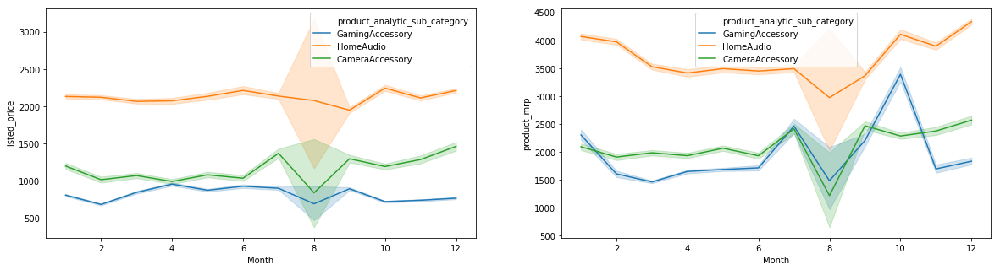

In [45]:
# Study MRP VS Unit listed Price Columns
plt.figure(figsize=(20,5))
plt.subplot(1,2,1)
sns.lineplot(data=df, x='Month', y= 'listed_price', hue='product_analytic_sub_category')

plt.subplot(1,2,2)
sns.lineplot(data=df, x='Month', y= 'product_mrp', hue='product_analytic_sub_category')
plt.show()

#### Remarks for Step 1:  
The plots are an attempt to study how MRP and GMV per unit prices range across months. The following insights should help us think of possible KPI's.
##### PART - 1
1. For all the categories, Unit MRP range is always higher than the Unit Listed Price.
2. Since listed price is a directly related to GMV. We decide to make a column with `discount from MRP`.
3. Also in 10th month, `GamingAccessory` has been given a lot of discounts. This is the kind of trend we want to capture in discount column

##### PART - 2
4. Also understand that, we need week numbers for converting data to that level as supposed in problem statement. So we need to derive `week number` as well.
5. It is also safe to derive `days` as a KPI so that we can understand the effect of different days if any.

#### Step 2: Studying `deliverycdays and deliverybdays` w.r.t sla (Service Level Agreement)
SLA actually talks about the promised delivery date. Deleverydays talk about delay in the same. We want to factor at what sla the delay usually happens. 

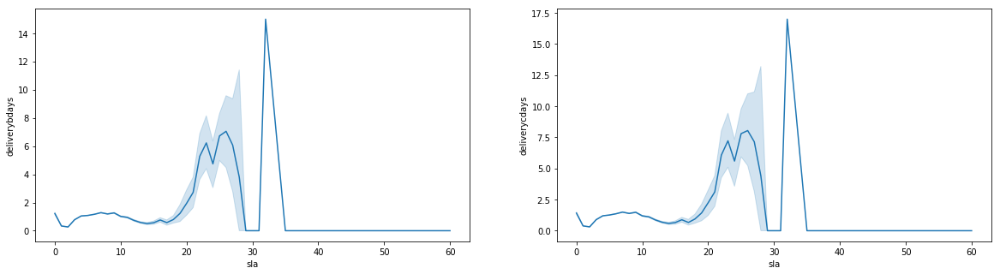

In [46]:
# Study MRP VS Unit listed Price Columns
plt.figure(figsize=(20,5))
plt.subplot(1,2,1)
sns.lineplot(data=df, x='sla', y= 'deliverybdays')

plt.subplot(1,2,2)
sns.lineplot(data=df, x='sla', y= 'deliverycdays')
plt.show()

#### Remarks for Step 2:
1. This suggests that sla (delivery promised) in 20-40 days range has much delay. Equally from consumer or procurement sides of it.
2. For this reason, we want to capture the `delivery status (delay, early or as expected) as a column`.
3. This might help in understanding the gmv captured for those products
4. Along with these, let us get features like `paydays` and `special days`

__*Note: We will continue an elaborate EDA once all features are derived and all data are integrated*__

### 4. Common Feature Engineering for all Sub Categories (Order Level Data)
Feature engineering is nothing but transforming raw data into meaningfull information. For our work, we perform feature engineering in 3 stages.

#### PART - 1
1. Deriving `Date Features in order level data` (Consumer Electronics data / Working Data)
2. Deriving `good KPI's` (Key Performance Indexes) for  data set


All this is done in `phases simultaneous with pre-processing and exploratory data analysis (EDA) if required`.

### PART - 1
### 4.1 Deriving `Date Features`
So far the available information is all daily and order level. But we want to estimate market mix models at weekly level. Also, we have information on `pay days available and special days` available with us. In order to integrate all this information and analyse the daily, weekly and monthly level metrics. We engineer the following date information.
1. Only `Date feature` (Reducing the date+time level information to dates)
2. `Day of the date feature` (To study the effect of weekday or weekend on purchase behaviour)
3. `Month Feature`
4. `Flag Pay Days:` Salary pay days for the customers
5. `Flag Special Sale dates:` Flag the days when there are discounted sales

__*Note: All these features may not help in final estimation. These are helpful in EDA to engineer better KPI's*__

In [47]:
#1. Only Date Feature
df['date'] = df['order_date'].dt.date

In [48]:
# Convert object data type of date to string
df['date'] = df['date'].astype('str')

In [49]:
# Day of the Date Feature
df['day'] = df['order_date'].dt.day

In [50]:
# Month Feature
df['hour'] = df['order_date'].dt.hour

In [51]:
# Add pay day based on 1st and 15th day of a month
df['pay_day'] = df['day'].apply(lambda x: 1 if x ==1 | x==15 else 0)

In [52]:
# create special sale day dates
special_sale_dates_list= ['2015-07-18', '2015-07-19', '2015-08-15','2015-08-16', 
                          '2015-08-17', '2015-09-28', '2015-09-29','2015-09-30', 
                          '2015-10-15', '2015-10-16', '2015-10-17','2015-11-07', 
                          '2015-11-08', '2015-11-09', '2015-11-10','2015-11-11', 
                          '2015-11-12', '2015-11-13', '2015-11-14','2015-12-25', 
                          '2015-12-26', '2015-12-27', '28-12-2015','2015-12-29', 
                          '2015-12-30', '2015-12-31', '2016-01-01','2016-01-02', 
                          '2016-01-03', '2016-01-20', '2016-01-21','2016-01-22',
                          '2016-02-01', '2016-02-02', '2016-02-20','2016-02-21', 
                          '2016-03-14', '2016-03-15', '2016-03-07','2016-03-08', 
                          '2016-03-09', '2016-05-25', '2016-05-26','2016-05-27']

df['special_sale_dates'] = df['date'].apply(lambda x: 1 if x in special_sale_dates_list else 0)

In [53]:
# check for the above data output
df['special_sale_dates'].describe()

count   527338.00000
mean         0.17770
std          0.38226
min          0.00000
25%          0.00000
50%          0.00000
75%          0.00000
max          1.00000
Name: special_sale_dates, dtype: float64

####  Re-Assigning Week Numbers
1. In the current use case, week number is analogous to `time t in the time series data sets`. 
2. Also week number of july 2015 should be less than week number of jan 2016 to have a time series ability

So, Let us work on following modifications in week numbers
1. Filter the data. with dates mentioned
2. Assign week numbers according to the time of year
3. Separate the data into 2 year parts (2015 amd 2016)
4. Reassign 2015 week numbers starting with 1 and continue into 2016 with jan having continuation week numbers from december 2015

In [54]:
# Week Number
df['week_number'] = df['order_date'].dt.week

In [55]:
# Cross Check the filter
df[['order_date','date','week_number']].head(2)

,order_date,date,week_number
1391518,2015-07-01 03:35:02,2015-07-01,27
1382668,2015-07-01 08:19:18,2015-07-01,27


In [56]:
df[['order_date','date','week_number']].tail(2)

,order_date,date,week_number
1238667,2016-06-29 23:58:38,2016-06-29,26
1343764,2016-06-29 23:58:47,2016-06-29,26


__Remarks:__ 
1. We can see that, week number started in 2015 with 27 and ended in january with 26.
2. It is evident that week numbers are assigned according to the calender year (Jan - Dec).
3. We need to `modify that to a continuous number in time series t`

In [57]:
# Check the week number uniques
df['week_number'].unique()

array([27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43,
       44, 45, 46, 47, 48, 49, 50, 51, 52, 53,  1,  2,  3,  4,  5,  6,  7,
        8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24,
       25, 26])

In [58]:
# Cross Check whether week numbers are continuously flowing into 2016
df['date'].loc[df['week_number'] == 53].unique()

array(['2015-12-28', '2015-12-29', '2015-12-30', '2015-12-31',
       '2016-01-01', '2016-01-02', '2016-01-03'], dtype=object)

__*Note:*__ *This helps to understand whether the week is broken suddenly at 31 dec 2015. Since we consider lag variables as features. Seasonality is ectremely inportant. (Basically all weeks should have 7 days)*

In [59]:
# Reorder the week numbers to our specific calender (July 2015-June 2016)
dict_week_reorder = {}
k = 1
for i in range(27,54):
    dict_week_reorder[i] = k
    k = k+1
for i in range(1,27):
    dict_week_reorder[i] = k
    k = k+1

In [60]:
df['week_number'].replace(dict_week_reorder, inplace = True)

In [61]:
# Cross Check the week number reorder
df[['order_date','date','week_number']].head(2)

,order_date,date,week_number
1391518,2015-07-01 03:35:02,2015-07-01,1
1382668,2015-07-01 08:19:18,2015-07-01,1


In [62]:
# Cross Check the week number reorder
df[['order_date','date','week_number']].tail(2)

,order_date,date,week_number
1238667,2016-06-29 23:58:38,2016-06-29,53
1343764,2016-06-29 23:58:47,2016-06-29,53


### 4.2  Deriving KPI's from Consumer Electronics Data Set
Consumer electronic dataset has order level data of GMV's. Except MRP, there is no other feature that directly talks about discounts offered or delivery time which are factors that associate directly with the response variable GMV. For the same reason, we wanted better KPI's from existing data. Let us get started with few easily understandable KPI's such as:
1. `Discount Rate`: Extracting difference between MRP and GMV per unit
2. `Delivery time`: SLA - total Delay - Procurement SLA (Basically promised deadline - all delays in procurement and delivery)
3. `Slot the delivery time`


In future, as and when we come across other good KPI's with EDA, we add them up to the stack of KPI's derived.

In [63]:
# Create discount_rate variable
#-------------------------------------------------------------------------------------
# Note: 1. MRP is in unit level
#       2. So, convert GMV to unit level and then substact it
#       3. To convert GMV to unit level, divide GMV by no of units sold
df['discount_rate'] = (df['product_mrp'] - (df['listed_price']))/df['product_mrp']

In [64]:
# Create delivery_time variable
#-------------------------------------------------------------------------------------
# Note: This feature explains whether the delivery happened within or beyond the sla promised.
#       1. If we delivered on time, delivery_time_extra = 0
#       2. If we delivered with in the time, delivery_time_extra > 0 (Early Delivery)
#       3. If we took more time than promised, delivery_time_extra < 0 (Late Delivery)
df['delivery_time_extra'] = df['sla'] - (df['deliverybdays']
                                        +df['deliverycdays']
                                        +df['product_procurement_sla'])

In [65]:
# Create delivery_time_status column (Convert Delivery time to categorical variable)
#--------------------------------------------------------------------------------------
def delivery_fun(x):
    if x==0:
        return 'on time'
    elif x>0:
        return 'early delivery'
    else:
        return 'late delivery'
    
df['delivery_time_status'] = df['delivery_time_extra'].apply(delivery_fun)

In [66]:
df.columns

Index(['fsn_id', 'order_date', 'Year', 'Month', 'order_id', 'order_item_id',
       'gmv', 'units', 'deliverybdays', 'deliverycdays',
       's1_fact.order_payment_type', 'sla', 'pincode',
       'product_analytic_super_category', 'product_analytic_category',
       'product_analytic_sub_category', 'product_analytic_vertical',
       'product_mrp', 'product_procurement_sla', 'listed_price', 'date', 'day',
       'hour', 'pay_day', 'special_sale_dates', 'week_number', 'discount_rate',
       'delivery_time_extra', 'delivery_time_status'],
      dtype='object')

### Remarks:
1. So far, we engineered features at order level
2. The KPI's include
    1. Date KPI's like week numbers, special dates and pay days
    2. Monetary KPI's like discount
    3. Logistic KPI's like Delivery times
    

__*Note:*__ *At this point, we will keep all the dependent KPI's like delivery time as well as delivery satus. These are helpful for an intuitive EDA. But before modeling, we will remove all dependent (collinear) KPI's and only keep a few that help model better.*

__*Note: The above KPI's are same across all categories, so we derived them on the complete consumer data set. Further, the KPI's are product sub category specific, hence we plan to do it on each product category separately*__

### 5. Working with Each Sub Category data distinctly

As we comprehend from the problem statement, We want to study 3 product sub categories including `CameraAccessory`, `HomeAudio` and `GamingAccessory` separately to understand their market shares. There should be different models made for sub categories. Let us re-iterate the necessary steps involved at sub category level. 
1. `Pre-Processing using outlier treatment:` It is practical to handle outliers for each subcategory distinctly
2. `KPI's at Category Level:` KPI's like product premiumness should be designed at subcategory level

__Let us separate the data into 3 sub categories data sets.__

In [67]:
# Refer to the product sub categories
df['product_analytic_sub_category'].unique()

array(['GamingAccessory', 'HomeAudio', 'CameraAccessory'], dtype=object)

In [68]:
df.columns

Index(['fsn_id', 'order_date', 'Year', 'Month', 'order_id', 'order_item_id',
       'gmv', 'units', 'deliverybdays', 'deliverycdays',
       's1_fact.order_payment_type', 'sla', 'pincode',
       'product_analytic_super_category', 'product_analytic_category',
       'product_analytic_sub_category', 'product_analytic_vertical',
       'product_mrp', 'product_procurement_sla', 'listed_price', 'date', 'day',
       'hour', 'pay_day', 'special_sale_dates', 'week_number', 'discount_rate',
       'delivery_time_extra', 'delivery_time_status'],
      dtype='object')

In [69]:
# Separate the data frames as per sub categories
df_GamingAccessory = df[df['product_analytic_sub_category'] == 'GamingAccessory']
df_HomeAudio       = df[df['product_analytic_sub_category'] == 'HomeAudio']
df_CameraAccessory = df[df['product_analytic_sub_category'] == 'CameraAccessory']

In [70]:
# For reference post outlier treatment
shape_gaming = df_GamingAccessory.shape
shape_home = df_HomeAudio.shape
shape_camera = df_CameraAccessory.shape

In [71]:
df_GamingAccessory.columns

Index(['fsn_id', 'order_date', 'Year', 'Month', 'order_id', 'order_item_id',
       'gmv', 'units', 'deliverybdays', 'deliverycdays',
       's1_fact.order_payment_type', 'sla', 'pincode',
       'product_analytic_super_category', 'product_analytic_category',
       'product_analytic_sub_category', 'product_analytic_vertical',
       'product_mrp', 'product_procurement_sla', 'listed_price', 'date', 'day',
       'hour', 'pay_day', 'special_sale_dates', 'week_number', 'discount_rate',
       'delivery_time_extra', 'delivery_time_status'],
      dtype='object')

### 5.1 Outlier Treatment:
1. It is well known that outlers have an `effect on coeffcient estimates in linear regression algorithm`. 
2. We plan to remove our outliers. Each `sub category will have it's own set of outliers`. 
3. Choice of percentiles and outlier treatment will be different for different sub categories.

#### Basing on which feature, do we perform outlier treatment?
1. Our aim is to reduce the effect of outliers on our `weekly gross merchandise value`
2. To do so, I would like to choose few continuous features that might have a substantial impact on GMV
3. The continuous features involved are `product_mrp` and `listed_price`
4. Product_mrp is a nominam head in the data. 
5. `GMV` is directly influenced by `listed price`.
6. let us treat the outliers on the basis of `listed price`

__Note:__ After outlier treatment, we will make sure atleast 70% of original data is left to work with

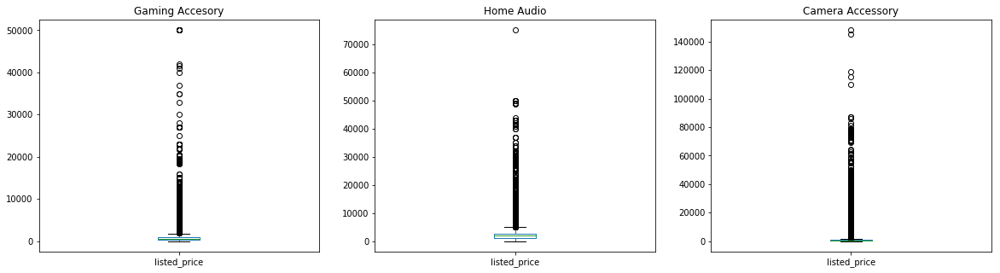

In [72]:
# Box plots of listed price before outlier treatment
plt.figure(figsize=(20,5))
# Gaming Accesory
plt.subplot(1,3,1)
df_GamingAccessory['listed_price'].plot(kind='box', title = 'Gaming Accesory')
# Home Audio
plt.subplot(1,3,2)
df_HomeAudio['listed_price'].plot(kind='box', title = 'Home Audio')
# Camera Accessory
plt.subplot(1,3,3)
df_CameraAccessory['listed_price'].plot(kind='box', title = 'Camera Accessory')
plt.show()


__Remarks:__ 
1. Outliers evidently share alarge part in the data. So an outlier treatment is essential. 
2. We will play around with several other percentiles and decide cut offs for each category distinctly.
3. An important observation is that `Ourliers are present only in higher percentile` side of the listed price

#### Level 1: Outlier treatment

In [73]:
# Percentile wise distribution
df_percentiles = pd.DataFrame([df_GamingAccessory['listed_price'].quantile(np.linspace(.01, 1, 99, 0), 'lower'),
                              df_HomeAudio['listed_price'].quantile(np.linspace(.01, 1, 99, 0), 'lower'),
                              df_CameraAccessory['listed_price'].quantile(np.linspace(.01, 1, 99, 0), 'lower')], 
                              index = ['Gaming', 'Home Audio', 'Camera']).T

In [74]:
df_percentiles.head(5)

,Gaming,Home Audio,Camera
0.01000,99.00000,249.00000,1.00000
0.02000,135.00000,350.00000,130.00000
0.03000,140.00000,399.00000,149.00000
0.04000,145.00000,430.00000,166.00000
0.05000,148.00000,450.00000,170.00000


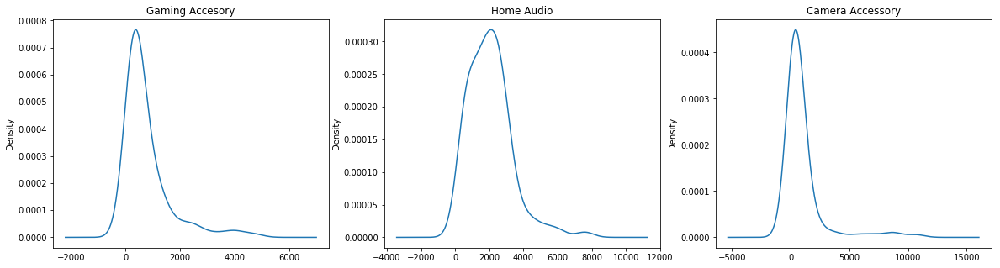

In [75]:
# Density plots of listed price before outlier treatment
plt.figure(figsize=(20,5))
# Gaming Accesory
plt.subplot(1,3,1)
df_percentiles['Gaming'].plot(kind='density', title = 'Gaming Accesory')
# Home Audio
plt.subplot(1,3,2)
df_percentiles['Home Audio'].plot(kind='density', title = 'Home Audio')
# Camera Accessory
plt.subplot(1,3,3)
df_percentiles['Camera'].plot(kind='density', title = 'Camera Accessory')
plt.show()



#### Remarks:
1. From the percentile chart as well as the density plots, it is clearly evident that `the outliers are at > 90 percentile`
2. Owning to this analysis, we will keep the cut off percentile at 90 percentile upper cutoff.
3. For `Camera Accesory`, we will keep a lower cut off of 0.01 or 1 percentile.

In [76]:
# Gaming Accesory
df_GamingAccessory = df_GamingAccessory[df_GamingAccessory['listed_price'] < 
                                        df_GamingAccessory['listed_price'].quantile(0.9)]
# Home Audio
df_HomeAudio = df_HomeAudio[df_HomeAudio['listed_price'] < 
                            df_HomeAudio['listed_price'].quantile(0.9)]

# Camera Accessory
df_CameraAccessory = df_CameraAccessory[(df_CameraAccessory['listed_price'] < 
                           df_CameraAccessory['listed_price'].quantile(0.9))
                            & (df_CameraAccessory['listed_price'] >=
                           df_CameraAccessory['listed_price'].quantile(0.02))]

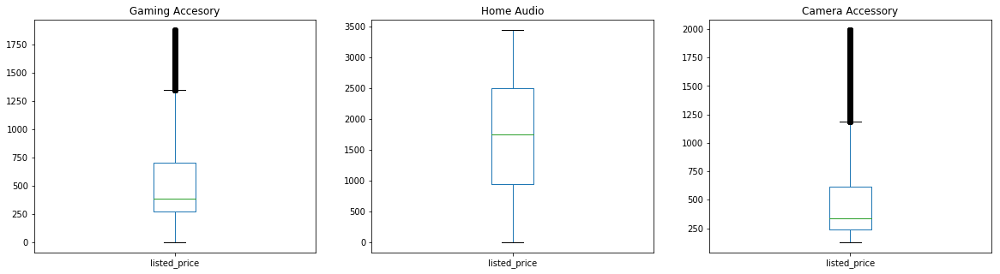

In [77]:
# Box plots of listed price after outlier treatment
plt.figure(figsize=(20,5))
# Gaming Accesory
plt.subplot(1,3,1)
df_GamingAccessory['listed_price'].plot(kind='box', title = 'Gaming Accesory')
# Home Audio
plt.subplot(1,3,2)
df_HomeAudio['listed_price'].plot(kind='box', title = 'Home Audio')
# Camera Accessory
plt.subplot(1,3,3)
df_CameraAccessory['listed_price'].plot(kind='box', title = 'Camera Accessory')
plt.show()



#### Remarks:
1. 90 Percentile Outlier treatment so far only helped with completely cleaning the `home audio products`
2. We plan to iterate the same outlier treatment again for `Gaming Accesories` and `Camera Accesories` untill they clean up.

#### Level 2: Outlier treatment

In [78]:
# Percentile wise distribution
df_percentiles1 = pd.DataFrame([df_GamingAccessory['listed_price'].quantile(np.linspace(.01, 1, 99, 0), 'lower'),
                              df_HomeAudio['listed_price'].quantile(np.linspace(.01, 1, 99, 0), 'lower'),
                              df_CameraAccessory['listed_price'].quantile(np.linspace(.01, 1, 99, 0), 'lower')], 
                              index = ['Gaming', 'Home Audio', 'Camera']).T

In [79]:
df_percentiles1.tail(15)

,Gaming,Home Audio,Camera
0.85000,998.00000,2699.00000,869.00000
0.86000,999.00000,2699.00000,890.00000
0.87000,1049.00000,2750.00000,928.00000
0.88000,1099.00000,2799.00000,960.00000
0.89000,1117.00000,2855.00000,999.00000
0.90000,1149.00000,2899.00000,1000.00000
0.91000,1189.00000,2948.00000,1060.00000
0.92000,1206.00000,2975.00000,1099.00000
0.93000,1272.00000,2999.00000,1195.00000
0.94000,1325.00000,2999.00000,1250.00000


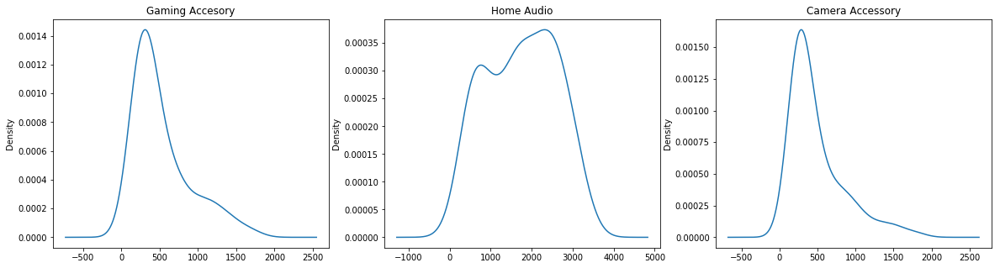

In [80]:
# Density plots of listed price before outlier treatment
plt.figure(figsize=(20,5))
# Gaming Accesory
plt.subplot(1,3,1)
df_percentiles1['Gaming'].plot(kind='density', title = 'Gaming Accesory')
# Home Audio
plt.subplot(1,3,2)
df_percentiles1['Home Audio'].plot(kind='density', title = 'Home Audio')
# Camera Accessory
plt.subplot(1,3,3)
df_percentiles1['Camera'].plot(kind='density', title = 'Camera Accessory')
plt.show()



#### Remarks:
1. From the percentile chart as well as the density plots 0.01 or 1 percentile. We decided 2 distinct cut offs for `Camera` and `Gaming` accesories each. From density plots, cut offs are:
2. `Gaming Accesories at 80 percentile` and `Camera at 80 percentile`

In [81]:
# Gaming Accesory
df_GamingAccessory = df_GamingAccessory[df_GamingAccessory['listed_price'] < 
                                        df_GamingAccessory['listed_price'].quantile(0.8)]

# Camera Accessory
df_CameraAccessory = df_CameraAccessory[(df_CameraAccessory['listed_price'] < 
                           df_CameraAccessory['listed_price'].quantile(0.8))]

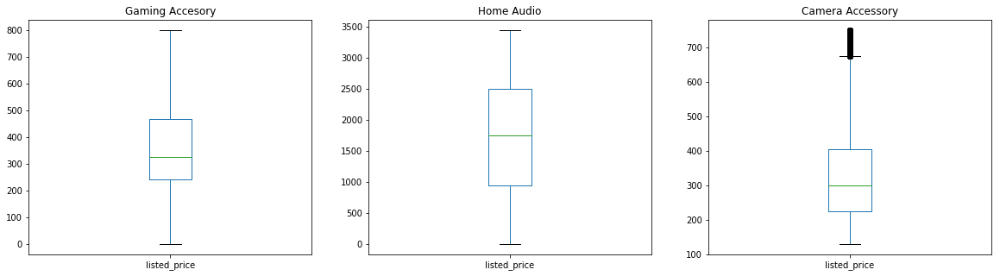

In [82]:
# Box plots of listed price after outlier treatment
plt.figure(figsize=(20,5))
# Gaming Accesory
plt.subplot(1,3,1)
df_GamingAccessory['listed_price'].plot(kind='box', title = 'Gaming Accesory')
# Home Audio
plt.subplot(1,3,2)
df_HomeAudio['listed_price'].plot(kind='box', title = 'Home Audio')
# Camera Accessory
plt.subplot(1,3,3)
df_CameraAccessory['listed_price'].plot(kind='box', title = 'Camera Accessory')
plt.show()



In [83]:
# Percentage Data left to work after outlier treatment
print('Percent data left in gaming after outlier treatment:',100*df_GamingAccessory.shape[0]/shape_gaming[0])
print('Percent data left in home audio after outlier treatment:',100*df_HomeAudio.shape[0]/shape_home[0])
print('Percent data left in camera after outlier treatment:',100*df_CameraAccessory.shape[0]/shape_camera[0])

Percent data left in gaming after outlier treatment: 71.46376796269469
Percent data left in home audio after outlier treatment: 89.99124851614692
Percent data left in camera after outlier treatment: 70.42242141597131


### 5.2 Making of Product Premiumness KPI
Product premiumness is a concept in new age marketing.Quality, provenance, fineness and genuineness are some of the characteristics that define a premium 'indulgent' product from a standard mainstream brand. Product premiumness is generally reflected in price. 
- For example: If `3 mobiles have same specification with 3 completely different price points`. The highest priced mobile is actually making a statement of it's own in terms of it's premiumness. Like Apple do all the time.

In the present problem, we want to make a KPI using `similar concept but with a slightly different assumption`. We do not have same product (like mobile) but same sub - category. 
- For Example: Across all camera subcategories (lens, covers), we want to group these individual groups into clusters depending on the price range they have. 
- We use `MRP, No of units sold and List Pricing` to estimate product premiumness KPI.

#### Steps involved in computing `Product Premiumness`
1. Get `MRP`, `List Pricing` and `Units` out
2. Cluster the Data
3. Perform one hot encoding of the Product Premiumness

__*Assumption:* We will take k=3 to cluster product premiumness__

__*Note: We have to estimate this KPI distinctly for all 3 sub categories*__

In [84]:
# Function for product premiumness
from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans


def product_premium(dataframe):
    df = dataframe[['units','listed_price','product_mrp']]
    index_num = list(df.index)
    standard_scaler = StandardScaler()
    df = standard_scaler.fit_transform(df)
    kmeans = KMeans(n_clusters=3, random_state = 40).fit(df)
    cluster_model = kmeans.fit(df) 
    dataframe = pd.concat([dataframe, pd.Series(cluster_model.labels_, index = index_num)], axis=1)
    dataframe.rename(columns = {0:'Product Premiumness'}, inplace = True)
    return(dataframe)    

In [85]:
df_GamingAccessory.shape

(135168, 29)

In [86]:
# Design and Add the KPI product  premiumness to the dataset
df_GamingAccessory = product_premium(df_GamingAccessory)
df_HomeAudio = product_premium(df_HomeAudio)
df_CameraAccessory = product_premium(df_CameraAccessory)

In [87]:
df_GamingAccessory.shape

(135168, 30)

In [88]:
df_GamingAccessory.columns

Index(['fsn_id', 'order_date', 'Year', 'Month', 'order_id', 'order_item_id',
       'gmv', 'units', 'deliverybdays', 'deliverycdays',
       's1_fact.order_payment_type', 'sla', 'pincode',
       'product_analytic_super_category', 'product_analytic_category',
       'product_analytic_sub_category', 'product_analytic_vertical',
       'product_mrp', 'product_procurement_sla', 'listed_price', 'date', 'day',
       'hour', 'pay_day', 'special_sale_dates', 'week_number', 'discount_rate',
       'delivery_time_extra', 'delivery_time_status', 'Product Premiumness'],
      dtype='object')

In [89]:
df_GamingAccessory['Product Premiumness'].value_counts()

1    92444
0    42591
2      133
Name: Product Premiumness, dtype: int64

### 5.3 Converting Categorical features to dummies to retain the features in weekly data

In [90]:
# Function for get dummies
list_dummies = ['delivery_time_status', 's1_fact.order_payment_type','Product Premiumness']
list_new_dummies = []
def dummies(dataframe, list_dummies):
    for i in list_dummies:
        dataframe[i.upper()] = dataframe[i]
    dataframe = pd.get_dummies(dataframe, columns = list_dummies)
    return(dataframe)

In [91]:
# Creating Dummies for all Sub categories
df_GamingAccessory = dummies(df_GamingAccessory, list_dummies)
df_HomeAudio       = dummies(df_HomeAudio, list_dummies)
df_CameraAccessory = dummies(df_CameraAccessory, list_dummies)

In [92]:
df_HomeAudio.columns

Index(['fsn_id', 'order_date', 'Year', 'Month', 'order_id', 'order_item_id',
       'gmv', 'units', 'deliverybdays', 'deliverycdays', 'sla', 'pincode',
       'product_analytic_super_category', 'product_analytic_category',
       'product_analytic_sub_category', 'product_analytic_vertical',
       'product_mrp', 'product_procurement_sla', 'listed_price', 'date', 'day',
       'hour', 'pay_day', 'special_sale_dates', 'week_number', 'discount_rate',
       'delivery_time_extra', 'DELIVERY_TIME_STATUS',
       'S1_FACT.ORDER_PAYMENT_TYPE', 'PRODUCT PREMIUMNESS',
       'delivery_time_status_early delivery',
       'delivery_time_status_late delivery', 'delivery_time_status_on time',
       's1_fact.order_payment_type_COD', 's1_fact.order_payment_type_Prepaid',
       'Product Premiumness_0', 'Product Premiumness_1',
       'Product Premiumness_2'],
      dtype='object')

### 6. Transforming Order level Data to Weekly Level
1. As per the problem statement, we cosolidate our order level data to week level data as follows.
2. In future, after integrating all the data sets, we might happen to 
    - Add KPI's
    - Drop KPI's
3. While assigning week numbers here, we cannot do that by using standard time series resample technique since we want to have different aggregating function for different columns.
4. To proceed further, we will assign week numbers from order dates to the data first and then build the weekly dataframe further
    


### 6.1 Defining Aggregate Functions 
1. Each feature at order level signifies distinctly. 
2. For this reason, we cannot transform all daily level features using same aggregate function. 
3. For that reason, we are specifying the respective aggregate functions for each of them specifically

__*Note:*__ `The encoded features should have an aggregate function of percentage. Since it is not available, after performing group by action, we convert the values in the respective features to percentages from sums`.

In [93]:
# Grouping For all Categories in common
dict_agg_functions = {
                      'gmv':'sum', 
                      'units':'sum', 
                      'order_id':'count', 
                      'order_item_id': 'count',
                      'product_mrp':'sum',
                      'pay_day':'max',
                      'special_sale_dates':'max',
                      'discount_rate': 'mean',
                      'delivery_time_status_early delivery': 'sum',
                      'delivery_time_status_late delivery': 'sum',
                      'delivery_time_status_on time':'sum',
                      's1_fact.order_payment_type_COD':'sum',
                      's1_fact.order_payment_type_Prepaid':'sum',
                      'Product Premiumness_0':'sum',
                      'Product Premiumness_1': 'sum',
                      'Product Premiumness_2': 'sum',
                      'Month': 'min'
                      }

#### Making Product Specific Aggregate functions

### 6.2 Transforming to Weekly level Data:



In [94]:
# Convert to weeks using week numbers
weekly_game = df_GamingAccessory.groupby('week_number').agg(dict_agg_functions)
weekly_audio = df_HomeAudio.groupby('week_number').agg(dict_agg_functions)
weekly_camera = df_CameraAccessory.groupby('week_number').agg(dict_agg_functions)

In [95]:
weekly_game.tail(2)

,gmv,units,order_id,order_item_id,product_mrp,pay_day,special_sale_dates,discount_rate,delivery_time_status_early delivery,delivery_time_status_late delivery,delivery_time_status_on time,s1_fact.order_payment_type_COD,s1_fact.order_payment_type_Prepaid,Product Premiumness_0,Product Premiumness_1,Product Premiumness_2,Month
week_number,,,,,,,,,,,,,,,,,
52,791886.25035,2199,2114,2114,1787853,0,0,0.46733,407.00000,1674.00000,33.00000,1781.00000,333.00000,620.00000,1494.00000,0,6
53,328812.25029,894,858,858,689347,0,0,0.44867,178.00000,674.00000,6.00000,736.00000,122.00000,268.00000,590.00000,0,6


In [96]:
weekly_game.tail(2)

,gmv,units,order_id,order_item_id,product_mrp,pay_day,special_sale_dates,discount_rate,delivery_time_status_early delivery,delivery_time_status_late delivery,delivery_time_status_on time,s1_fact.order_payment_type_COD,s1_fact.order_payment_type_Prepaid,Product Premiumness_0,Product Premiumness_1,Product Premiumness_2,Month
week_number,,,,,,,,,,,,,,,,,
52,791886.25035,2199,2114,2114,1787853,0,0,0.46733,407.00000,1674.00000,33.00000,1781.00000,333.00000,620.00000,1494.00000,0,6
53,328812.25029,894,858,858,689347,0,0,0.44867,178.00000,674.00000,6.00000,736.00000,122.00000,268.00000,590.00000,0,6


In [97]:
weekly_game.columns

Index(['gmv', 'units', 'order_id', 'order_item_id', 'product_mrp', 'pay_day',
       'special_sale_dates', 'discount_rate',
       'delivery_time_status_early delivery',
       'delivery_time_status_late delivery', 'delivery_time_status_on time',
       's1_fact.order_payment_type_COD', 's1_fact.order_payment_type_Prepaid',
       'Product Premiumness_0', 'Product Premiumness_1',
       'Product Premiumness_2', 'Month'],
      dtype='object')

### 6.3: Transforming Aggregates of Encoded Features from Sum to Percentage

In [98]:
def agg_transformation(dataframe, column_list):
    dataframe_copy = dataframe.copy()
    for i in column_list:
        dataframe[i] = 100*dataframe[i]/dataframe_copy[column_list].sum(axis = 1)
    return(dataframe)

In [99]:
# For Delivery Status
list_delivery  = ['delivery_time_status_early delivery', 
                 'delivery_time_status_late delivery', 
                 'delivery_time_status_on time']
weekly_game    = agg_transformation(weekly_game, list_delivery)
weekly_audio   = agg_transformation(weekly_audio,list_delivery)
weekly_camera  = agg_transformation(weekly_camera,list_delivery)

# For Order Payment Time
list_payment   = ['s1_fact.order_payment_type_COD', 's1_fact.order_payment_type_Prepaid']
weekly_game    = agg_transformation(weekly_game, list_payment)
weekly_audio   = agg_transformation(weekly_audio,list_payment)
weekly_camera  = agg_transformation(weekly_camera,list_payment)

# For Product Premiumness
list_premiumness = ['Product Premiumness_0', 'Product Premiumness_1','Product Premiumness_2']
weekly_game    = agg_transformation(weekly_game, list_premiumness)
weekly_audio   = agg_transformation(weekly_audio,list_premiumness)
weekly_camera  = agg_transformation(weekly_camera,list_premiumness)

In [100]:
# Checking whether the operations are successfull
weekly_game[list_premiumness].head()

,Product Premiumness_0,Product Premiumness_1,Product Premiumness_2
week_number,,,
1,27.77778,72.22222,0.00000
2,53.26548,46.73452,0.00000
3,27.69750,72.30250,0.00000
4,31.88952,68.11048,0.00000
5,25.08929,66.60714,0.07500


### Remarks:
Pivoting the data to weekly data will make few unnecessary transformations in data. A few of them are
1. Columns like month, year and day are summed up. We have to __`drop` them but we shall do it after EDA__
2. At this point, we will do __`Columns like pay_day and sales_day are summed up. We have to convert them to binary`__
3. Re caliberate the data to their weekly aggregates using respective functions
4. For encoded data sets, we successfully transformed the aggregation metric to percentage from sum. 


## SECTION 2
### 7 Cleaning and  Aggregating Weather Data
`Weather data is at date level` while available `consumer electronics data is at order level`. It is not very straight forward to merge these datasets. Let us do it in a sequential manner
#### PART - 1
1. Load Weather Data
2. Combine 2015 and 2016 weather data
3. Extract the required weather data from july 2015 - june 2016
4. Inspecting the combined data set
5. Pre-process the weather data

#### PART -2 
6. Aggregating using average the weather data to weekly level


### PART - 1
### 7.1 Loading Weather Dataset

In [101]:
climate_2015 = pd.read_csv('ONTARIO-2015.csv', skiprows=range(0,23)) 
climate_2016 = pd.read_csv('ONTARIO-2016.csv', skiprows=range(0,23))

# Saving original copies as duplicates
climate_2015_copy = climate_2015.copy()
climate_2016_copy = climate_2016.copy()

In [102]:
# 1.2 Inspecting the head Data Frames
climate_2015.head(2)

,Date/Time,Year,Month,Day,Data Quality,Max Temp (°C),Max Temp Flag,Min Temp (°C),Min Temp Flag,Mean Temp (°C),...,Total Snow (cm),Total Snow Flag,Total Precip (mm),Total Precip Flag,Snow on Grnd (cm),Snow on Grnd Flag,Dir of Max Gust (10s deg),Dir of Max Gust Flag,Spd of Max Gust (km/h),Spd of Max Gust Flag
0,2015-01-01,2015,1,1,†,0.00000,NaN,-8.50000,NaN,-4.30000,...,0.00000,NaN,0.00000,NaN,0.00000,NaN,nan,nan,nan,nan
1,2015-01-02,2015,1,2,†,3.00000,NaN,-3.00000,NaN,0.00000,...,0.00000,NaN,0.00000,NaN,0.00000,NaN,nan,nan,nan,nan


In [103]:
climate_2016.head(2)

,Date/Time,Year,Month,Day,Data Quality,Max Temp (°C),Max Temp Flag,Min Temp (°C),Min Temp Flag,Mean Temp (°C),...,Total Snow (cm),Total Snow Flag,Total Precip (mm),Total Precip Flag,Snow on Grnd (cm),Snow on Grnd Flag,Dir of Max Gust (10s deg),Dir of Max Gust Flag,Spd of Max Gust (km/h),Spd of Max Gust Flag
0,2016-01-01,2016,1,1,NaN,nan,NaN,nan,NaN,nan,...,nan,NaN,nan,NaN,nan,NaN,nan,nan,nan,nan
1,2016-01-02,2016,1,2,NaN,nan,NaN,nan,NaN,nan,...,nan,NaN,nan,NaN,nan,NaN,nan,nan,nan,nan


### 7.2 Combine 2015 and 2016 data 

In [104]:
# We have been given entire 2015 and 2016 climate data information. 
# Let us combine both of them into one single merged weather file.
df_climate = pd.concat([climate_2015, climate_2016], ignore_index = True)

In [105]:
# Verify the size of the 2 data sets together, that should be 366+365 = 731
df_climate.shape # Verified

(731, 27)

### 7.3 Extract the one year weather data between July 2015 - June 2016

In [106]:
# Verify whether date column is date or not
print('Data Type before Conversion to datetime is: ',df_climate['Date/Time'].dtype)

# Convert to date column
df_climate['Date/Time'] = pd.to_datetime(df_climate['Date/Time'], format='%Y-%m-%d')

Data Type before Conversion to datetime is:  object


In [107]:
# Apply filter and extract climate data between july 2015 and june 2016
start_date = pd.to_datetime('2015-07-01')
end_date = pd.to_datetime('2016-06-30')
mask = (df_climate['Date/Time'] >= start_date) & (df_climate['Date/Time'] <= end_date)
df_climate = df_climate.loc[mask]

In [108]:
# Verify the data set
df_climate['Date/Time'].tail()

542   2016-06-26
543   2016-06-27
544   2016-06-28
545   2016-06-29
546   2016-06-30
Name: Date/Time, dtype: datetime64[ns]

In [109]:
df_climate.rename(columns={'Date/Time':'date'},inplace=True)

### 7.4 Inspecting the climate dataset

In [110]:
# Info() of the climate data 
df_climate.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 366 entries, 181 to 546
Data columns (total 27 columns):
date                         366 non-null datetime64[ns]
Year                         366 non-null int64
Month                        366 non-null int64
Day                          366 non-null int64
Data Quality                 215 non-null object
Max Temp (°C)                208 non-null float64
Max Temp Flag                7 non-null object
Min Temp (°C)                191 non-null float64
Min Temp Flag                24 non-null object
Mean Temp (°C)               191 non-null float64
Mean Temp Flag               24 non-null object
Heat Deg Days (°C)           191 non-null float64
Heat Deg Days Flag           24 non-null object
Cool Deg Days (°C)           191 non-null float64
Cool Deg Days Flag           24 non-null object
Total Rain (mm)              215 non-null float64
Total Rain Flag              7 non-null object
Total Snow (cm)              215 non-null float64
Total S

#### Remarks: The data-set is largely sparse. We can clearly see
1. 4 Columns are empty with column names being the following. We consider dropping those columns
    1. Dir of Max Gust (10s deg)
    2. Dir of Max Gust Flag
    3. Spd of Max Gust (km/h)
    4. Spd of Max Gust Flag


2. All Flag columns have very sparse data. Flag columns with sparse data include
    1. Max Temp Flag
    2. Min Temp Flag
    3. Mean Temp Flag
    4. Heat Deg Days Flag
    5. Cool Deg Days Flag
    6. Total Rain Flag
    7. Total Snow Flag
    8. Total Precip Flag
    9. Snow on Grnd Flag

### 7.5 Pre-Processing the weather data

In [111]:
# 1. Let us drop the null columns 
df_climate.drop(['Dir of Max Gust (10s deg)', 
                 'Dir of Max Gust Flag',
                 'Spd of Max Gust (km/h)',
                 'Spd of Max Gust Flag' ], axis = 1, inplace = True)

In [112]:
# 2.a Check what values are present in flag columns
remaining_flag_list = ['Max Temp Flag', 'Min Temp Flag','Mean Temp Flag',
                       'Heat Deg Days Flag', 'Cool Deg Days Flag', 'Total Rain Flag',
                       'Total Snow Flag', 'Total Precip Flag', 'Snow on Grnd Flag']

dict_unique_flags = {}
for i in remaining_flag_list:
    dict_unique_flags[i] = df_climate[i].unique()

In [113]:
dict_unique_flags

{'Max Temp Flag': array([nan, 'M'], dtype=object),
 'Min Temp Flag': array([nan, 'M'], dtype=object),
 'Mean Temp Flag': array([nan, 'M'], dtype=object),
 'Heat Deg Days Flag': array([nan, 'M'], dtype=object),
 'Cool Deg Days Flag': array([nan, 'M'], dtype=object),
 'Total Rain Flag': array([nan, 'T'], dtype=object),
 'Total Snow Flag': array([nan, 'T'], dtype=object),
 'Total Precip Flag': array([nan, 'T'], dtype=object),
 'Snow on Grnd Flag': array([nan, 'T'], dtype=object)}

#### Remarks: 
1. All flags are either `NaN` or `M - Missing` or `T - Trace`.
2. We are planning to drop these columns at this time as they are very less in number suggesting no repeated drastic weather changes.
3. This suggests that the climate is more or less within the regular conditions of the region
4. Allowing us to neglect the extreme conditions and respective flags.
5. We drop the flag variables

In [114]:
# Dropping the flag columns
df_climate.drop(remaining_flag_list, axis = 1, inplace = True)

In [115]:
# Dropping min max temperature features
#df_climate.drop(['Max Temp (°C)','Min Temp (°C)'], axis = 1, inplace = True)

In [116]:
# Check the number of columns left
df_climate.columns

Index(['date', 'Year', 'Month', 'Day', 'Data Quality', 'Max Temp (°C)',
       'Min Temp (°C)', 'Mean Temp (°C)', 'Heat Deg Days (°C)',
       'Cool Deg Days (°C)', 'Total Rain (mm)', 'Total Snow (cm)',
       'Total Precip (mm)', 'Snow on Grnd (cm)'],
      dtype='object')

In [117]:
# Check shape
df_climate.shape

(366, 14)

In [118]:
# Check for column wise NA values
print(round(100*(df_climate.isnull().sum(axis=0)/len(df_climate.index)),2).sort_values(ascending=False))

Cool Deg Days (°C)   47.81000
Heat Deg Days (°C)   47.81000
Mean Temp (°C)       47.81000
Min Temp (°C)        47.81000
Max Temp (°C)        43.17000
Snow on Grnd (cm)    41.26000
Total Precip (mm)    41.26000
Total Snow (cm)      41.26000
Total Rain (mm)      41.26000
Data Quality         41.26000
Day                   0.00000
Month                 0.00000
Year                  0.00000
date                  0.00000
dtype: float64


__Remarks:__ Though there are sizeable missing values across key columns, we have retained them as we do weekly grouping and we will be ignoring these missing values while doing mean claculations

In [119]:
# Extract week from the date column
# Week Number
df_climate['week_number'] = df_climate['date'].dt.week

In [120]:
df_climate.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 366 entries, 181 to 546
Data columns (total 15 columns):
date                  366 non-null datetime64[ns]
Year                  366 non-null int64
Month                 366 non-null int64
Day                   366 non-null int64
Data Quality          215 non-null object
Max Temp (°C)         208 non-null float64
Min Temp (°C)         191 non-null float64
Mean Temp (°C)        191 non-null float64
Heat Deg Days (°C)    191 non-null float64
Cool Deg Days (°C)    191 non-null float64
Total Rain (mm)       215 non-null float64
Total Snow (cm)       215 non-null float64
Total Precip (mm)     215 non-null float64
Snow on Grnd (cm)     215 non-null float64
week_number           366 non-null int64
dtypes: datetime64[ns](1), float64(9), int64(4), object(1)
memory usage: 45.8+ KB


In [121]:
df_climate.head(2)

,date,Year,Month,Day,Data Quality,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),week_number
181,2015-07-01,2015,7,1,†,24.50000,17.00000,20.80000,0.00000,2.80000,0.00000,0.00000,0.00000,0.00000,27
182,2015-07-02,2015,7,2,†,24.00000,14.00000,19.00000,0.00000,1.00000,0.00000,0.00000,0.00000,0.00000,27


In [122]:
# Reorder the week numbers to our specific calender (July 2015-June 2016)
df_climate['week_number'].replace(dict_week_reorder, inplace = True)

### Remarks:

1. All columns that are not important are largely cleaned in the climate dataset.
2. But there are still many columns with a large number of Nan's
3. While making the dataframe week level, we will ignore the Nan's and take the average or aggregate of remaining values to compute week level data.
4. `Note: Data is so sparse that we cannot impute values hence ignoring them`

### 7.6 Converting Data into weekly level
While converting this data to weekly level, we will use average as a aggregator. This is because climate data will not hold meaning if we sum it up.

In [123]:
# Convert daily data into weekly
weekly_climate=df_climate.groupby('week_number').mean()

In [124]:
weekly_climate.head()

,Year,Month,Day,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
week_number,,,,,,,,,,,,
1,2015.00000,7.00000,3.00000,25.50000,13.20000,19.36000,0.10000,1.46000,0.00000,0.00000,0.00000,0.00000
2,2015.00000,7.00000,9.00000,24.83333,15.33333,20.10000,0.28333,2.38333,4.41667,0.00000,4.41667,0.00000
3,2015.00000,7.00000,16.00000,28.75000,17.58333,23.18333,0.00000,5.18333,1.40000,0.00000,1.40000,0.00000
4,2015.00000,7.00000,23.00000,29.75000,16.60000,23.06000,0.00000,5.06000,0.90000,0.00000,0.90000,0.00000
5,2015.00000,7.28571,21.14286,31.58333,17.50000,24.56667,0.00000,6.56667,4.63333,0.00000,4.63333,0.00000


### 7.7 Cross Checking Whether Week Numbers are Synchronous so far

In [125]:
# Rough Work to understand week allocation to week numbers in consumer electronics data
dict_dates_in_each_week = {}
week_uniques = list(weekly_game.index)
for i in week_uniques:
    dict_dates_in_each_week[i] = list(df_CameraAccessory['date'].loc[df_CameraAccessory['week_number'] == i].unique())

In [126]:
# Rough Work to understand week allocation to week numbers in climate data
dict_dates_in_each_week_climate = {}
weekly_uniques = list(weekly_climate.index)
for i in weekly_uniques:
    dict_dates_in_each_week_climate[i] = list(df_climate['date'].loc[df_climate['week_number'] == i].unique())

In [127]:
# Cross Checking whether the days with in each week are same for both climate and 
dict_dates_in_each_week[53]

['2016-06-27', '2016-06-28', '2016-06-29']

In [128]:
dict_dates_in_each_week_climate[53]

[numpy.datetime64('2016-06-27T00:00:00.000000000'),
 numpy.datetime64('2016-06-28T00:00:00.000000000'),
 numpy.datetime64('2016-06-29T00:00:00.000000000'),
 numpy.datetime64('2016-06-30T00:00:00.000000000')]

__Remarks:__ This ensure that the week data is synchronous without loss of information while transforming daily data to weekly level

## SECTION 3
### 8:  NSP Scores
Let us have a look at the brief description of these files are
1. NPS Score: Proxy to 'Voice of the customer'

#### These 2 data sets are at higher level i.e.. monthly. We have to extrapolate them to weekly level to integarte with the remaining data sets. The steps involved are:
1. Loading the datasets
2. Inspecting the data sets
3. Pre-Processing the data sets
4. Converting them to weekly sets

### 8.1: Load the files:


In [129]:
# Parsing the Excel File with Multiple sheets
xls = pd.ExcelFile('Media data and other information.xlsx')

In [130]:
# Parsing the xls sheet with Monthly NPS Scores
df_NPS = xls.parse('Monthly NPS Score', skiprows=1, index_col = None, na_values=['NA'])

#### Remarks: We will follow steps 2-4 on one data set at a time

### 8.2 Inspecting Data with Pre-Processing

In [131]:
# Check the Head
df_NPS.head()

,Unnamed: 0,July'15,Aug'15,Sept'15,Oct'15,Nov'15,Dec'15,Jan'16,Feb'16,Mar'16,Apr'16,May'16,June'16
0,NPS,54.59959,59.98710,46.92542,44.39839,47.00000,45.80000,47.09303,50.32741,49.02055,51.82761,47.30695,50.51669
1,Stock Index,1177.00000,1206.00000,1101.00000,1210.00000,1233.00000,1038.00000,1052.00000,1222.00000,1015.00000,1242.00000,1228.00000,1194.00000


In [132]:
# let us just transpose the data
df_NPS.rename(columns={'Unnamed: 0':'Month Index'}, inplace=True)
df_NPS.set_index('Month Index', inplace = True)
df_NPS = df_NPS.T

In [133]:
# Check the Head
df_NPS.head(12)

Month Index,NPS,Stock Index
July'15,54.59959,1177.00000
Aug'15,59.98710,1206.00000
Sept'15,46.92542,1101.00000
Oct'15,44.39839,1210.00000
Nov'15,47.00000,1233.00000
Dec'15,45.80000,1038.00000
Jan'16,47.09303,1052.00000
Feb'16,50.32741,1222.00000
Mar'16,49.02055,1015.00000
Apr'16,51.82761,1242.00000


In [134]:
# Check the columns
df_NPS.columns

Index(['NPS', 'Stock Index'], dtype='object', name='Month Index')

In [135]:
# Rename Index to month numbers
df_NPS.rename(index = {"July'15":'7/15',"Aug'15":'8/15',"Sept'15":'9/15',"Oct'15":'10/15',
                       "Nov'15":'11/15',"Dec'15":'12/15',"Jan'16":'1/16',"Feb'16":'2/16',"Mar'16":'3/16',
                       "Apr'16":'4/16', "May'16":'5/16',"June'16":'6/16'}, inplace=True)

In [136]:
# Check the header
df_NPS.head(2)

Month Index,NPS,Stock Index
7/15,54.59959,1177.00000
8/15,59.98710,1206.00000


### 8.3: Converting Data to Weekly level : 
1. To make the transformation synchronous to the previous data sets. We have to use the following steps
    1. Make NPS data to daily level
    2. Add week numbers to it like we did earlier
    3. Group by week numbers
    
__*Important:* This exercise ensures each week has same days across dataframes__    

*__Note: The data should have same value across weeks as month__*

In [137]:
# Change the data type of month to datetime
df_NPS.index = pd.to_datetime(df_NPS.index, format = '%m/%y' )

In [138]:
# Info on data types
df_NPS.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 12 entries, 2015-07-01 to 2016-06-01
Data columns (total 2 columns):
NPS            12 non-null float64
Stock Index    12 non-null float64
dtypes: float64(2)
memory usage: 288.0 bytes


In [139]:
df_NPS.tail(12)

Month Index,NPS,Stock Index
2015-07-01,54.59959,1177.00000
2015-08-01,59.98710,1206.00000
2015-09-01,46.92542,1101.00000
2015-10-01,44.39839,1210.00000
2015-11-01,47.00000,1233.00000
2015-12-01,45.80000,1038.00000
2016-01-01,47.09303,1052.00000
2016-02-01,50.32741,1222.00000
2016-03-01,49.02055,1015.00000
2016-04-01,51.82761,1242.00000


In [140]:
df_NPS.index

DatetimeIndex(['2015-07-01', '2015-08-01', '2015-09-01', '2015-10-01',
               '2015-11-01', '2015-12-01', '2016-01-01', '2016-02-01',
               '2016-03-01', '2016-04-01', '2016-05-01', '2016-06-01'],
              dtype='datetime64[ns]', freq=None)

In [141]:
# Add a dummy row with month index 2016-07-01. This helps dividing the month data into 53 weeks as required
#dummy_row = pd.DataFrame({ 'Month Index': [pd.to_datetime('2016-07-01'), pd.to_datetime('2015-06-28')] ,
#                          'NPS': [50.516687,54.6],
#                         'Stock Index': [1194.0,1177.0]}, index = [0,1])

In [142]:
# Add a dummy row with month index 2016-07-01. This helps dividing the month data into 53 weeks as required
dummy_row = pd.DataFrame({ 'Month Index': [pd.to_datetime('2016-06-30')] ,
                          'NPS': [50.516687],
                          'Stock Index': [1194.0]}, index = [0])

In [143]:
dummy_row.set_index('Month Index', inplace = True)

In [144]:
df_NPS = pd.concat([df_NPS,dummy_row])

In [145]:
# Check the size
df_NPS.shape

(13, 2)

In [146]:
# Check the dataframe
df_NPS.tail()

Month Index,NPS,Stock Index
2016-03-01,49.02055,1015.00000
2016-04-01,51.82761,1242.00000
2016-05-01,47.30695,1228.00000
2016-06-01,50.51669,1194.00000
2016-06-30,50.51669,1194.00000


#### 8.3.1 Convert Data to Daily Level

In [147]:
df_NPS_daily=df_NPS.resample('d').pad()

In [148]:
df_NPS_daily.head()

Month Index,NPS,Stock Index
2015-07-01,54.59959,1177.00000
2015-07-02,54.59959,1177.00000
2015-07-03,54.59959,1177.00000
2015-07-04,54.59959,1177.00000
2015-07-05,54.59959,1177.00000


In [149]:
df_NPS_daily['date'] = df_NPS_daily.index

#### 8.3.2 Adding Group Numbers

In [150]:
# Extract week from the date column
# Week Number
df_NPS_daily['week_number'] = df_NPS_daily['date'].dt.week

In [151]:
df_NPS_daily.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 366 entries, 2015-07-01 to 2016-06-30
Freq: D
Data columns (total 4 columns):
NPS            366 non-null float64
Stock Index    366 non-null float64
date           366 non-null datetime64[ns]
week_number    366 non-null int64
dtypes: datetime64[ns](1), float64(2), int64(1)
memory usage: 14.3 KB


In [152]:
df_NPS_daily.tail(2)

Month Index,NPS,Stock Index,date,week_number
2016-06-29,50.51669,1194.00000,2016-06-29,26
2016-06-30,50.51669,1194.00000,2016-06-30,26


In [153]:
# Reorder the week numbers to our specific calender (July 2015-June 2016)
df_NPS_daily['week_number'].replace(dict_week_reorder, inplace = True)

#### 8.3.3 Making it to Group level Using Week Number

In [154]:
weekly_NPS = df_NPS_daily.groupby('week_number').max()

In [155]:
# Check the header
weekly_NPS.shape

(53, 3)

### 8.4 Cross Checking Whether Week Numbers are Synchronous so far with Other Data Sets

In [156]:
# Rough Work to understand week allocation to week numbers in NPS data
dict_dates_in_each_week_nps = {}
weekly_uniques = list(weekly_NPS.index)
for i in weekly_uniques:
    dict_dates_in_each_week_nps[i] = list(df_NPS_daily['date'].loc[df_NPS_daily['week_number'] == i].unique())

In [157]:
# Cross Checking whether the days with in each week are same for both climate and 
dict_dates_in_each_week[1]

['2015-07-03']

In [158]:
dict_dates_in_each_week_climate[10]

[numpy.datetime64('2015-08-31T00:00:00.000000000'),
 numpy.datetime64('2015-09-01T00:00:00.000000000'),
 numpy.datetime64('2015-09-02T00:00:00.000000000'),
 numpy.datetime64('2015-09-03T00:00:00.000000000'),
 numpy.datetime64('2015-09-04T00:00:00.000000000'),
 numpy.datetime64('2015-09-05T00:00:00.000000000'),
 numpy.datetime64('2015-09-06T00:00:00.000000000')]

In [159]:
dict_dates_in_each_week_nps[10]

[numpy.datetime64('2015-08-31T00:00:00.000000000'),
 numpy.datetime64('2015-09-01T00:00:00.000000000'),
 numpy.datetime64('2015-09-02T00:00:00.000000000'),
 numpy.datetime64('2015-09-03T00:00:00.000000000'),
 numpy.datetime64('2015-09-04T00:00:00.000000000'),
 numpy.datetime64('2015-09-05T00:00:00.000000000'),
 numpy.datetime64('2015-09-06T00:00:00.000000000')]

#### Remarks:
1. We successfully completed dividing the data into week level from month level.
2. This can be easily attached to other dataframes

## SECTION 4:
### 9. MARKET SPEND DATA
Let us work the similar course of action on market spend also. Process will look similar to 
1. Loading and Inspecting data
2. Approach to divide market spent according to weeks
2. Process data for transformation steps
3. Transform data
4. Create Add stocks

### Market Spend Assumptions and Approach
1. One of the main assumptions that we take in market spend is: `Total Investment is equal for all sub categories`
2. __For Example: For month July 2015, Each of subcategies have equal amount of total investment. This means__
    - Total investment on `CameraAccessory`: `17.06 Cr`
    - Total investment on `HomeAudio`: `17.06 Cr`
    - Total investment on `GamingAccessory`: `17.06 Cr` like wise

##### Note: Creating Add stocks is a very big process to deal with

### 9.1 Load, Inspect and Pre-Process the data-frame

In [160]:
# Parsing the xls sheet with Media Investment Details
df_spending = xls.parse('Media Investment', skiprows=2, index_col = None, na_values=['NA'])

In [161]:
df_spending.head()

,Unnamed: 0,Year,Month,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other
0,nan,2015.00000,7.00000,17.06178,0.21533,2.53301,7.41427,0.00093,1.32728,0.54725,5.02370,nan,nan
1,nan,2015.00000,8.00000,5.06431,0.00644,1.27807,1.06333,0.00001,0.12924,0.07368,2.51353,nan,nan
2,nan,2015.00000,9.00000,96.25438,3.87950,1.35653,62.78765,0.61029,16.37999,5.03827,6.20215,nan,nan
3,nan,2015.00000,10.00000,170.15630,6.14471,12.62248,84.67253,3.44407,24.37178,6.97371,31.92701,nan,nan
4,nan,2015.00000,11.00000,51.21622,4.22063,1.27547,14.17212,0.16863,19.56157,6.59577,5.22203,nan,nan


In [162]:
df_spending.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16 entries, 0 to 15
Data columns (total 13 columns):
Unnamed: 0           0 non-null float64
Year                 12 non-null float64
Month                12 non-null float64
Total Investment     12 non-null float64
TV                   13 non-null float64
Digital              12 non-null float64
Sponsorship          12 non-null float64
Content Marketing    12 non-null float64
Online marketing     12 non-null float64
 Affiliates          12 non-null float64
SEM                  12 non-null float64
Radio                3 non-null float64
Other                3 non-null float64
dtypes: float64(13)
memory usage: 1.7 KB


#### Remarks: `Unnamed: 0`, `Radio` and `Others` have very less data. We decide to drop it.

In [163]:
# Dropping the high Nan Columns 
df_spending.drop(['Unnamed: 0','Radio', 'Other'], axis = 1, inplace = True)

In [164]:
# Have a look at the data frame
df_spending.head()

,Year,Month,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM
0,2015.00000,7.00000,17.06178,0.21533,2.53301,7.41427,0.00093,1.32728,0.54725,5.02370
1,2015.00000,8.00000,5.06431,0.00644,1.27807,1.06333,0.00001,0.12924,0.07368,2.51353
2,2015.00000,9.00000,96.25438,3.87950,1.35653,62.78765,0.61029,16.37999,5.03827,6.20215
3,2015.00000,10.00000,170.15630,6.14471,12.62248,84.67253,3.44407,24.37178,6.97371,31.92701
4,2015.00000,11.00000,51.21622,4.22063,1.27547,14.17212,0.16863,19.56157,6.59577,5.22203


In [165]:
# Verifying whether total investment sums up to the investments given
df_spending.loc[:,'TV':'SEM'].sum(axis = 1)

0     17.06178
1      5.06431
2     96.25438
3    170.15630
4     51.21622
5    106.74531
6     44.40600
7     48.05200
8     83.20908
9     56.84824
10    71.97000
11    42.65194
12     0.00000
13     0.00000
14     0.00000
15    18.54900
dtype: float64

In [166]:
# Remove the last 

### 9.2 Approach to distribute market spent to weeks
1. In NPS data, we took same NPS value acroos weeks in a month. But that is because stock prices can vary between a range with mean across all days of a month. 
2. `In case of market spent, companies distribute the spend across weeks differently`
3. Infact the spent this week actually effects the revenue next week or the coming in most cases.
4. But due to our limitations with data given. __We assume that__

<h3><center> $Spent \propto revenue$ </centre> </h3>

__Where:__ 
    - `Spent: market Spent the current week`
    - `Revenue: Revenue or GMV of the same week`

5. In order to imitate the expenditure pattern as revenues. We will extract the distribution of monthly revenues week wise and compute the spent.
6. __For Example: If revenue for week 1 in july is 20% of the total month. Then market spend on TV that week is 20% of monthly spend__

Let us get started with extracting revenue distributions.

##### Note: Each sub-category will have different revenues. hence the market spend ratios are also different accordingly

#### Step 1: Extracting Revenue (GMV) distributions for each sub category 
Equation is:
<h3><center> $distribution_{week} = \frac{GMV_{week}}{GMV_{month}} $</centre> </h3>

__Where:__
- $distribution_{week}$: Distribution of gross merchendise per week
- $GMV_{week}$ and $GMV_{month}$: Gross Merchendise Value (Revenue) per week and month respectively

The steps involve:
1. taking weekly data of all 3 categories independently
2. Grouping by Month
3. Taking the average

In [167]:
# Compute Monthly GMV and Make it a Dict 
# for Game
monthly_gmv_game = weekly_game.groupby('Month')['gmv'].sum()
dict_monthly_gmv_game = monthly_gmv_game.to_dict()

# for Audio
monthly_gmv_audio = weekly_audio.groupby('Month')['gmv'].sum()
dict_monthly_gmv_audio = monthly_gmv_audio.to_dict()

# for Camera
monthly_gmv_camera = weekly_camera.groupby('Month')['gmv'].sum()
dict_monthly_gmv_camera = monthly_gmv_camera.to_dict()

In [168]:
# Create a dummy for monthly revenue
# Game
weekly_game['monthly gmv'] = weekly_game['Month']
# Assign Monthly revenue Values
weekly_game['monthly gmv'].replace(dict_monthly_gmv_game, inplace = True)

# Audio
weekly_audio['monthly gmv'] = weekly_audio['Month']
# Assign Monthly revenue Values
weekly_audio['monthly gmv'].replace(dict_monthly_gmv_audio, inplace = True)

# Camera
weekly_camera['monthly gmv'] = weekly_camera['Month']
# Assign Monthly revenue Values
weekly_camera['monthly gmv'].replace(dict_monthly_gmv_camera, inplace = True)

In [169]:
# Create the distribution column using the dummies
weekly_game['weekly gmv distribution'] = round(weekly_game['gmv']/weekly_game['monthly gmv'],4)
weekly_audio['weekly gmv distribution'] = round(weekly_audio['gmv']/weekly_audio['monthly gmv'],4)
weekly_camera['weekly gmv distribution'] = round(weekly_camera['gmv']/weekly_camera['monthly gmv'],4)

#### Cross Check the data whether distributed correctly or not

In [170]:
weekly_game[['Month','monthly gmv', 'gmv', 'weekly gmv distribution']].head(6)

,Month,monthly gmv,gmv,weekly gmv distribution
week_number,,,,
1,7,2836621.35920,7497.00000,0.00260
2,7,2836621.35920,1066498.00000,0.37600
3,7,2836621.35920,671297.35920,0.23670
4,7,2836621.35920,625901.00000,0.22070
5,7,2836621.35920,465428.00000,0.16410
6,8,633084.50000,791.00000,0.00120


### 9.3 Dividing the Market Spend into Weekly Data
Before we assign distributions to the data. We have to convert monthly level market spend data to weekly level. __`The process is exactly same as the NPS process we did`__

#### 9.3.1 Essential Data Pre Processing

In [171]:
# Check the Data Heading
df_spending.head()

,Year,Month,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM
0,2015.00000,7.00000,17.06178,0.21533,2.53301,7.41427,0.00093,1.32728,0.54725,5.02370
1,2015.00000,8.00000,5.06431,0.00644,1.27807,1.06333,0.00001,0.12924,0.07368,2.51353
2,2015.00000,9.00000,96.25438,3.87950,1.35653,62.78765,0.61029,16.37999,5.03827,6.20215
3,2015.00000,10.00000,170.15630,6.14471,12.62248,84.67253,3.44407,24.37178,6.97371,31.92701
4,2015.00000,11.00000,51.21622,4.22063,1.27547,14.17212,0.16863,19.56157,6.59577,5.22203


In [172]:
 df_spending['date'] = pd.to_datetime(df_spending[['Year', 'Month']].assign(Day=1))

In [173]:
df_spending.tail(5)

,Year,Month,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,date
11,2016.00000,6.00000,42.83422,1.66272,1.42076,25.04854,0.04508,7.97130,2.76802,3.73552,2016-06-01
12,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,NaT
13,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,NaT
14,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,NaT
15,nan,nan,nan,18.54900,nan,nan,nan,nan,nan,nan,NaT


In [174]:
# Since we do not have any data in the last rows, Let us just drop the rows
df_spending.dropna(axis = 0, how = 'any', inplace = True)

#### 9.3.2 Converting the monthly data into daily level

In [175]:
# Feed into dummy row
columns_dummy_row = list(df_spending.columns)
dict_dummy_row = {}
for i in columns_dummy_row:
    dict_dummy_row[i] = df_spending.loc[11,i]

In [176]:
dict_dummy_row['date'] = pd.to_datetime('2016-06-30')

In [177]:
dict_dummy_row

{'Year': 2016.0,
 'Month': 6.0,
 'Total Investment': 42.83421642531141,
 'TV': 1.6627168830166317,
 'Digital': 1.4207605065642244,
 'Sponsorship': 25.048540773496338,
 'Content Marketing': 0.04508062521139925,
 'Online marketing': 7.97129986621861,
 ' Affiliates': 2.7680230607624554,
 'SEM': 3.7355159778409486,
 'date': Timestamp('2016-06-30 00:00:00')}

In [178]:
# Add a dummy row with month index 2016-07-01. This helps dividing the month data into 53 weeks as required
dummy_row = pd.DataFrame(dict_dummy_row, index = [0])

In [179]:
# Resetting the indexes as essential
dummy_row.set_index('date', inplace = True)
df_spending.set_index('date', inplace = True)

In [180]:
df_spending = pd.concat([df_spending,dummy_row])

In [181]:
# Check the size
df_spending.shape

(13, 10)

In [182]:
# Check the dataframe
df_spending.tail()

,Year,Month,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM
date,,,,,,,,,,
2016-03-01,2016.00000,3.00000,100.02462,9.30000,2.10000,41.59000,0.37000,18.43782,6.21767,5.19359
2016-04-01,2016.00000,4.00000,56.84824,5.20520,0.87189,24.30835,0.03488,16.51451,5.69346,4.21996
2016-05-01,2016.00000,5.00000,78.05700,1.37000,0.77000,31.68000,0.79000,23.65000,6.80000,6.91000
2016-06-01,2016.00000,6.00000,42.83422,1.66272,1.42076,25.04854,0.04508,7.97130,2.76802,3.73552
2016-06-30,2016.00000,6.00000,42.83422,1.66272,1.42076,25.04854,0.04508,7.97130,2.76802,3.73552


#### 9.3.3 Convert Data to Daily Level

In [183]:
df_spending_daily=df_spending.resample('d').pad()

In [184]:
df_spending_daily.head()

,Year,Month,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM
date,,,,,,,,,,
2015-07-01,2015.00000,7.00000,17.06178,0.21533,2.53301,7.41427,0.00093,1.32728,0.54725,5.02370
2015-07-02,2015.00000,7.00000,17.06178,0.21533,2.53301,7.41427,0.00093,1.32728,0.54725,5.02370
2015-07-03,2015.00000,7.00000,17.06178,0.21533,2.53301,7.41427,0.00093,1.32728,0.54725,5.02370
2015-07-04,2015.00000,7.00000,17.06178,0.21533,2.53301,7.41427,0.00093,1.32728,0.54725,5.02370
2015-07-05,2015.00000,7.00000,17.06178,0.21533,2.53301,7.41427,0.00093,1.32728,0.54725,5.02370


In [185]:
df_spending_daily['date'] = df_NPS_daily.index

#### 9.3.4 Adding Group Numbers

In [186]:
# Extract week from the date column
# Week Number
df_spending_daily['week_number'] = df_spending_daily['date'].dt.week

In [187]:
df_spending_daily.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 366 entries, 2015-07-01 to 2016-06-30
Freq: D
Data columns (total 12 columns):
Year                 366 non-null float64
Month                366 non-null float64
Total Investment     366 non-null float64
TV                   366 non-null float64
Digital              366 non-null float64
Sponsorship          366 non-null float64
Content Marketing    366 non-null float64
Online marketing     366 non-null float64
 Affiliates          366 non-null float64
SEM                  366 non-null float64
date                 366 non-null datetime64[ns]
week_number          366 non-null int64
dtypes: datetime64[ns](1), float64(10), int64(1)
memory usage: 37.2 KB


In [188]:
df_spending_daily.tail(2)

,Year,Month,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,date,week_number
date,,,,,,,,,,,,
2016-06-29,2016.00000,6.00000,42.83422,1.66272,1.42076,25.04854,0.04508,7.97130,2.76802,3.73552,2016-06-29,26
2016-06-30,2016.00000,6.00000,42.83422,1.66272,1.42076,25.04854,0.04508,7.97130,2.76802,3.73552,2016-06-30,26


In [189]:
# Reorder the week numbers to our specific calender (July 2015-June 2016)
df_spending_daily['week_number'].replace(dict_week_reorder, inplace = True)

#### 9.3.5 Making it to Group level Using Week Number

In [190]:
weekly_spend = df_spending_daily.groupby('week_number').max()

In [191]:
# Check the header
weekly_spend.head()

,Year,Month,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,date
week_number,,,,,,,,,,,
1,2015.00000,7.00000,17.06178,0.21533,2.53301,7.41427,0.00093,1.32728,0.54725,5.02370,2015-07-05
2,2015.00000,7.00000,17.06178,0.21533,2.53301,7.41427,0.00093,1.32728,0.54725,5.02370,2015-07-12
3,2015.00000,7.00000,17.06178,0.21533,2.53301,7.41427,0.00093,1.32728,0.54725,5.02370,2015-07-19
4,2015.00000,7.00000,17.06178,0.21533,2.53301,7.41427,0.00093,1.32728,0.54725,5.02370,2015-07-26
5,2015.00000,8.00000,17.06178,0.21533,2.53301,7.41427,0.00093,1.32728,0.54725,5.02370,2015-08-02


### 9.4: Convert the Market Spends according to the weekly revenue distributions
1. So far, we extracted the `GMV` distribution (proportion) across the weeks per month from `week level sub category data`. 
2. To re-iterate, we computed the gmv share in a week w.r.t month
3. Also converted the Spend Data into week level.
4. Now, we have to `distribute market spend share according to proportions of GMV per month` using the derived distributions.

*__Note:__ Since revenue (GMV) share is different for different subcategory of products. We make 3 dataframes out of market spend*

#### 9.4.1 Extract the revenue spend distribution rows from weekly sub category data

In [192]:
# For Gaming Category
revenue_spend_game =  weekly_game['weekly gmv distribution']
# For Audio
revenue_spend_audio =  weekly_audio['weekly gmv distribution']
# For Camera 
revenue_spend_camera =  weekly_camera['weekly gmv distribution']

In [193]:
index_audio = list(revenue_spend_audio.index)
index_camera = list(revenue_spend_camera.index)

#### 9.4.2 Converting Market Spends to their respective week Distributions

In [194]:
# Revenue Spend  Game array
revenue_spend_game_array =  revenue_spend_game.values.reshape(53,1)
revenue_spend_audio_array =  revenue_spend_audio.values.reshape(50,1)
revenue_spend_camera_array =  revenue_spend_camera.values.reshape(52,1)

In [195]:
# Weekly spend game
weekly_spend_game = weekly_spend.copy()
game_array = np.array(weekly_spend_game.loc[:,'Total Investment':'SEM'])
weekly_spend_game.loc[:,'Total Investment':'SEM'] = revenue_spend_game_array*game_array

In [196]:
# Weekly spend audio
weekly_spend_audio = weekly_spend.loc[index_audio,:].copy()
audio_array = np.array(weekly_spend_audio.loc[:,'Total Investment':'SEM'])
weekly_spend_audio.loc[:,'Total Investment':'SEM'] = revenue_spend_audio_array*audio_array

In [197]:
# Weekly spend audio
weekly_spend_camera = weekly_spend.loc[index_camera,:].copy()
camera_array = np.array(weekly_spend_camera.loc[:,'Total Investment':'SEM'])
weekly_spend_camera.loc[:,'Total Investment':'SEM'] = revenue_spend_camera_array*camera_array

In [198]:
print(revenue_spend_camera_array.shape)
print(camera_array.shape)

(52, 1)
(52, 8)


#### 9.4.3 Resolving Week Issue
1. From the above datasets, it is evident that, consumer electronics data at weekly level has missing weeks
    - Audio has 3 missing weeks
    - Camera has 1 missing week
2. For computational purpose, weekly spends (market spends) are also revised to the same data set indexes.
3. But weekly market spends are eventually used for adstock computation
4. This is a time series solution and expects the time t between 2 rows to be constant. 
5. In order to deal with that issue, we are adding rows with zeros in the missing weeks

In [199]:
weekly_spend.columns

Index(['Year', 'Month', 'Total Investment', 'TV', 'Digital', 'Sponsorship',
       'Content Marketing', 'Online marketing', ' Affiliates', 'SEM', 'date'],
      dtype='object')

In [200]:
weekly_spend_camera.head(5)

,Year,Month,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,date
week_number,,,,,,,,,,,
1,2015.00000,7.00000,0.04436,0.00056,0.00659,0.01928,0.00000,0.00345,0.00142,0.01306,2015-07-05
2,2015.00000,7.00000,4.42753,0.05588,0.65732,1.92400,0.00024,0.34443,0.14201,1.30365,2015-07-12
3,2015.00000,7.00000,4.59985,0.05805,0.68290,1.99889,0.00025,0.35783,0.14754,1.35439,2015-07-19
4,2015.00000,7.00000,4.89673,0.06180,0.72697,2.12790,0.00027,0.38093,0.15706,1.44180,2015-07-26
5,2015.00000,8.00000,3.09330,0.03904,0.45924,1.34421,0.00017,0.24064,0.09922,0.91080,2015-08-02


In [201]:
for i in list(weekly_spend.index):
    # For Audio
    if i not in list(weekly_spend_audio.index):
        weekly_spend_audio.loc[i,['Year','Month','date']] = weekly_spend.loc[i,['Year','Month','date']]
    

# Fill the rest with zeros
# For Audio
weekly_spend_audio.fillna(0, inplace = True)
# Sort by index
weekly_spend_audio.sort_index(inplace = True)


In [202]:
for i in list(weekly_spend.index):
    # For Camera
    if i not in list(weekly_spend_camera.index):
        weekly_spend_camera.loc[i,['Year','Month','date']] = weekly_spend.loc[i,['Year','Month','date']]


# Fill the rest with zeros

# For Camera
weekly_spend_camera.fillna(0, inplace = True)
# Sort by index
weekly_spend_camera.sort_index(inplace = True)




In [203]:
weekly_spend_camera.head(10)

,Year,Month,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,date
week_number,,,,,,,,,,,
1,2015.00000,7.00000,0.04436,0.00056,0.00659,0.01928,0.00000,0.00345,0.00142,0.01306,2015-07-05
2,2015.00000,7.00000,4.42753,0.05588,0.65732,1.92400,0.00024,0.34443,0.14201,1.30365,2015-07-12
3,2015.00000,7.00000,4.59985,0.05805,0.68290,1.99889,0.00025,0.35783,0.14754,1.35439,2015-07-19
4,2015.00000,7.00000,4.89673,0.06180,0.72697,2.12790,0.00027,0.38093,0.15706,1.44180,2015-07-26
5,2015.00000,8.00000,3.09330,0.03904,0.45924,1.34421,0.00017,0.24064,0.09922,0.91080,2015-08-02
6,2015.00000,8.00000,0.01266,0.00002,0.00320,0.00266,0.00000,0.00032,0.00018,0.00628,2015-08-09
7,2015.00000,8.00000,0.00203,0.00000,0.00051,0.00043,0.00000,0.00005,0.00003,0.00101,2015-08-16
8,2015.00000,8.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,2015-08-23
9,2015.00000,8.00000,0.00253,0.00000,0.00064,0.00053,0.00000,0.00006,0.00004,0.00126,2015-08-30


### 9.5 Cross Checking Whether Week Numbers are Synchronous  with Other Data Sets

In [204]:
dict_dates_in_each_week_spend = {}
weekly_uniques = list(weekly_spend.index)
for i in weekly_uniques:
    dict_dates_in_each_week_spend[i] = list(df_spending_daily['date'].loc[df_spending_daily['week_number'] == i].unique())

In [205]:
# Cross Checking whether the days with in each week are same for both climate and 
dict_dates_in_each_week[1]

['2015-07-03']

In [206]:
dict_dates_in_each_week_climate[10]

[numpy.datetime64('2015-08-31T00:00:00.000000000'),
 numpy.datetime64('2015-09-01T00:00:00.000000000'),
 numpy.datetime64('2015-09-02T00:00:00.000000000'),
 numpy.datetime64('2015-09-03T00:00:00.000000000'),
 numpy.datetime64('2015-09-04T00:00:00.000000000'),
 numpy.datetime64('2015-09-05T00:00:00.000000000'),
 numpy.datetime64('2015-09-06T00:00:00.000000000')]

In [207]:
dict_dates_in_each_week_nps[10]

[numpy.datetime64('2015-08-31T00:00:00.000000000'),
 numpy.datetime64('2015-09-01T00:00:00.000000000'),
 numpy.datetime64('2015-09-02T00:00:00.000000000'),
 numpy.datetime64('2015-09-03T00:00:00.000000000'),
 numpy.datetime64('2015-09-04T00:00:00.000000000'),
 numpy.datetime64('2015-09-05T00:00:00.000000000'),
 numpy.datetime64('2015-09-06T00:00:00.000000000')]

In [208]:
dict_dates_in_each_week_spend[10]

[numpy.datetime64('2015-08-31T00:00:00.000000000'),
 numpy.datetime64('2015-09-01T00:00:00.000000000'),
 numpy.datetime64('2015-09-02T00:00:00.000000000'),
 numpy.datetime64('2015-09-03T00:00:00.000000000'),
 numpy.datetime64('2015-09-04T00:00:00.000000000'),
 numpy.datetime64('2015-09-05T00:00:00.000000000'),
 numpy.datetime64('2015-09-06T00:00:00.000000000')]

#### Remarks:
1. We successfully completed dividing the data into week level from month level.
2. This can be easily attached to other dataframes

### 10. Add Stock Creation 
1. Add stock creation involves time series lagged data creation. For that reason we set the index to date
2. Split each media feature into a different dataframe
3. Create lag Variable for each Add stocks
4. Add weights to the lags
5. Take moving average if necessary

#### 10.1 Set date as index for weekly level spend each dataframe

In [209]:
# Extract media features like TV , Online Marketing columns into a list
media_list = list(weekly_spend.loc[:,'TV':'SEM'])
media_list

['TV',
 'Digital',
 'Sponsorship',
 'Content Marketing',
 'Online marketing',
 ' Affiliates',
 'SEM']

In [210]:
weekly_spend_game.columns

Index(['Year', 'Month', 'Total Investment', 'TV', 'Digital', 'Sponsorship',
       'Content Marketing', 'Online marketing', ' Affiliates', 'SEM', 'date'],
      dtype='object')

#### Split each media feature into a different DataFrame

In [211]:
# Function for Split Each DataFrame into independent media data frames
def dataframe_split(dataframe, col_list):
    dummy_dataframe = {}
    for i in col_list:
        dummy_dataframe[i] = dataframe[i]
    return(dummy_dataframe)

In [212]:
split_game         = dataframe_split(weekly_spend_game,media_list)
game_TV            = split_game['TV']
game_digital       = split_game['Digital']
game_sponsorship   = split_game['Sponsorship']
game_content       = split_game['Content Marketing']
game_online        = split_game['Online marketing']
game_affiliates    = split_game[' Affiliates']
game_sem           = split_game['SEM']


In [213]:
split_audio         = dataframe_split(weekly_spend_audio,media_list)
audio_TV            = split_audio['TV']
audio_digital       = split_audio['Digital']
audio_sponsorship   = split_audio['Sponsorship']
audio_content       = split_audio['Content Marketing']
audio_online        = split_audio['Online marketing']
audio_affiliates    = split_audio[' Affiliates']
audio_sem           = split_audio['SEM']

In [214]:
split_camera         = dataframe_split(weekly_spend_camera,media_list)
camera_TV            = split_camera['TV']
camera_digital       = split_camera['Digital']
camera_sponsorship   = split_camera['Sponsorship']
camera_content       = split_camera['Content Marketing']
camera_online        = split_camera['Online marketing']
camera_affiliates    = split_camera[' Affiliates']
camera_sem           = split_camera['SEM']

In [215]:
# Cross Checking a random dataframe for correctness of values
camera_content.head(2)

week_number
1   0.00000
2   0.00024
Name: Content Marketing, dtype: float64

In [216]:
weekly_spend_camera['Content Marketing'].head(2)

week_number
1   0.00000
2   0.00024
Name: Content Marketing, dtype: float64

#### 10.2 Add Stock Creation: 
The next series of steps involved in add stock creation are
1. Adding Lag features with weights
2. Making add stock feature from that


The following weights and lags are used to compute add stocks in the dataframe
![alt text](LagsandWeights.png "Lags and Weights Data")

In [217]:
def addstock_variable_creation(series_x, required_lag, weights):
    addstock_df = pd.DataFrame([], index = series_x.index)
    for i in range(required_lag, -1,-1):
        addstock_df.loc[:,i] = weights[i]*series_x.values.reshape(-1,1)
        
    
    temp_dict = {}
    temp_dict_sum ={}
    for i in list(addstock_df.index):
        k = 0
        if i <= required_lag:
            temp_dict[i] = np.array(addstock_df.loc[1:i+1,i-1:])
            temp_dict_sum[i] = np.diag(temp_dict[i]).sum()
        else:
            temp_dict[i] = np.array(addstock_df.loc[i-required_lag:i,:])
            temp_dict_sum[i] = np.diag(temp_dict[i]).sum()
    
    addstock_df['add_stock'] = pd.DataFrame.from_dict(temp_dict_sum, orient='index')
    temp_col = list(range(0,required_lag+1))
    temp_col = temp_col + ['add_stock']
    addstock_df = addstock_df[temp_col]

    return(addstock_df)

In [218]:
# Lags and weights for each media
tv_param            = {'lag': 5, 'w':{0:1, 1:0.6, 2:0.36,3:0.21,4:0.1296,5:0.78 }}
digital_param       = {'lag': 6, 'w': {0:1,1:0.43, 2:0.185, 3:0.07951,  4:0.03419, 5:.0147,  6:0.00632}}
sponsorship_param   = {'lag': 6, 'w': {0:1,1:0.31, 2:0.096,  3:0.02979, 4:0.00924, 5:0.00286,6:0.00089}}
content_param       = {'lag': 8, 'w': {0:1,1:0.31, 2:0.096,  3:0.02979, 4:0.00924, 5:0.00286,6:0.00089, 
                                       7:0.00028, 8:0.00009}}
online_param        = {'lag': 4, 'w': {0:1,1:0.43, 2:0.185,  3:0.951,   4:0.03419}}
affiliates_param    = {'lag': 4, 'w': {0:1,1:0.31, 2:0.096,  3:0.02979, 4:0.00924}}
sem_param           = {'lag': 4, 'w': {0:1,1:0.42, 2:0.176,  3:0.07409, 4:0.03112}}

__Note:__ We have refered on net for weekly lags and weights and approximated for each variables as the exact categories and level of detail is not available on net
1. Weekly weights are source from:
https://clutch.co/agencies/resources/how-consumers-view-advertising-survey-2017
2. Weekly lags are sourced from
https://medium.com/@Marko_Mi/advertising-adstock-theory-85cc9e26ea0e

In [219]:
game_TV.head()

week_number
1   0.00056
2   0.08096
3   0.05097
4   0.04752
5   0.03534
Name: TV, dtype: float64

In [220]:
### Add stock creation TV
game_TV_add_stock          = addstock_variable_creation(game_TV,tv_param['lag'], tv_param['w'])
audio_TV_add_stock         = addstock_variable_creation(audio_TV,tv_param['lag'], tv_param['w'])
camera_TV_add_stock        = addstock_variable_creation(camera_TV,tv_param['lag'], tv_param['w'])

# Change the adstock column name
game_TV_add_stock.rename(columns={'add_stock':'add_stock_TV'},inplace=True)
audio_TV_add_stock.rename(columns={'add_stock':'add_stock_TV'},inplace=True)
camera_TV_add_stock.rename(columns={'add_stock':'add_stock_TV'},inplace=True)
# Drop unwanted columns
drop_columns_TV = [0,1,2,3,4,5]
game_TV_add_stock.drop(drop_columns_TV,axis=1,inplace=True)
audio_TV_add_stock.drop(drop_columns_TV,axis=1,inplace=True)
camera_TV_add_stock.drop(drop_columns_TV,axis=1,inplace=True)

In [221]:
# Add Stock Creation digital
game_digital_add_stock           = addstock_variable_creation(game_digital,digital_param['lag'], digital_param['w'])
audio_digital_add_stock         = addstock_variable_creation(audio_digital,digital_param['lag'], digital_param['w'])
camera_digital_add_stock        = addstock_variable_creation(camera_digital,digital_param['lag'], digital_param['w'])
# Change the adstock column name
game_digital_add_stock.rename(columns={'add_stock':'add_stock_digital'},inplace=True)
audio_digital_add_stock.rename(columns={'add_stock':'add_stock_digital'},inplace=True)
camera_digital_add_stock.rename(columns={'add_stock':'add_stock_digital'},inplace=True)
# Drop unwanted columns
drop_columns_digital = [0,1,2,3,4,5,6]
game_digital_add_stock.drop(drop_columns_digital,axis=1,inplace=True)
audio_digital_add_stock.drop(drop_columns_digital,axis=1,inplace=True)
camera_digital_add_stock.drop(drop_columns_digital,axis=1,inplace=True)

In [222]:
# Add stock Creation sponsorship
game_sponsorship_add_stock     = addstock_variable_creation(game_sponsorship,sponsorship_param['lag'], sponsorship_param['w'])
audio_sponsorship_add_stock    = addstock_variable_creation(audio_sponsorship,sponsorship_param['lag'], sponsorship_param['w'])
camera_sponsorship_add_stock   = addstock_variable_creation(camera_sponsorship,sponsorship_param['lag'], sponsorship_param['w'])
# Change the adstock column name
game_sponsorship_add_stock.rename(columns={'add_stock':'add_stock_sponsorship'},inplace=True)
audio_sponsorship_add_stock.rename(columns={'add_stock':'add_stock_sponsorship'},inplace=True)
camera_sponsorship_add_stock.rename(columns={'add_stock':'add_stock_sponsorship'},inplace=True)
# Drop unwanted columns
drop_columns_sponsorship = [0,1,2,3,4,5,6]
game_sponsorship_add_stock.drop(drop_columns_sponsorship,axis=1,inplace=True)
audio_sponsorship_add_stock.drop(drop_columns_sponsorship,axis=1,inplace=True)
camera_sponsorship_add_stock.drop(drop_columns_sponsorship,axis=1,inplace=True)

In [223]:
# Add Stock Creation content
game_content_add_stock   = addstock_variable_creation(game_content,content_param['lag'], content_param['w'])
audio_content_add_stock  = addstock_variable_creation(audio_content,content_param['lag'], content_param['w'])
camera_content_add_stock = addstock_variable_creation(camera_content,content_param['lag'], content_param['w'])
# Change the adstock column name
game_content_add_stock.rename(columns={'add_stock':'add_stock_content'},inplace=True)
audio_content_add_stock.rename(columns={'add_stock':'add_stock_content'},inplace=True)
camera_content_add_stock.rename(columns={'add_stock':'add_stock_content'},inplace=True)
# Drop unwanted columns
drop_columns_content = [0,1,2,3,4,5,6,7,8]
game_content_add_stock.drop(drop_columns_content,axis=1,inplace=True)
audio_content_add_stock.drop(drop_columns_content,axis=1,inplace=True)
camera_content_add_stock.drop(drop_columns_content,axis=1,inplace=True)

In [224]:
# Add Stock Creation online
game_online_add_stock   = addstock_variable_creation(game_online,online_param['lag'], online_param['w'])
audio_online_add_stock  = addstock_variable_creation(audio_online,online_param['lag'], online_param['w'])
camera_online_add_stock = addstock_variable_creation(camera_online,online_param['lag'], online_param['w'])
# Change the adstock column name
game_online_add_stock.rename(columns={'add_stock':'add_stock_online'},inplace=True)
audio_online_add_stock.rename(columns={'add_stock':'add_stock_online'},inplace=True)
camera_online_add_stock.rename(columns={'add_stock':'add_stock_online'},inplace=True)
# Drop unwanted columns
drop_columns_online = [0,1,2,3,4]
game_online_add_stock.drop(drop_columns_online,axis=1,inplace=True)
audio_online_add_stock.drop(drop_columns_online,axis=1,inplace=True)
camera_online_add_stock.drop(drop_columns_online,axis=1,inplace=True)

In [225]:
# Add Stock Creation affiliates
game_affiliates_add_stock    = addstock_variable_creation(game_affiliates,affiliates_param['lag'], affiliates_param['w'])
audio_affiliates_add_stock   = addstock_variable_creation(audio_affiliates,affiliates_param['lag'], affiliates_param['w'])
camera_affiliates_add_stock  = addstock_variable_creation(camera_affiliates,affiliates_param['lag'], affiliates_param['w'])
# Change the adstock column name
game_affiliates_add_stock.rename(columns={'add_stock':'add_stock_affiliates'},inplace=True)
audio_affiliates_add_stock.rename(columns={'add_stock':'add_stock_affiliates'},inplace=True)
camera_affiliates_add_stock.rename(columns={'add_stock':'add_stock_affiliates'},inplace=True)
# Drop unwanted columns
drop_columns_affiliates = [0,1,2,3,4]
game_affiliates_add_stock.drop(drop_columns_affiliates,axis=1,inplace=True)
audio_affiliates_add_stock.drop(drop_columns_affiliates,axis=1,inplace=True)
camera_affiliates_add_stock.drop(drop_columns_affiliates,axis=1,inplace=True)

In [226]:
# Add Stock Creation sem
game_sem_add_stock        = addstock_variable_creation(game_sem,sem_param['lag'], sem_param['w'])
audio_sem_add_stock       = addstock_variable_creation(audio_sem,sem_param['lag'], sem_param['w'])
camera_sem_add_stock      = addstock_variable_creation(camera_sem,sem_param['lag'], sem_param['w'])
# Change the adstock column name
game_sem_add_stock.rename(columns={'add_stock':'add_stock_SEM'},inplace=True)
audio_sem_add_stock.rename(columns={'add_stock':'add_stock_SEM'},inplace=True)
camera_sem_add_stock.rename(columns={'add_stock':'add_stock_SEM'},inplace=True)
# Drop unwanted columns
drop_columns_sem = [0,1,2,3,4]
game_sem_add_stock.drop(drop_columns_sem,axis=1,inplace=True)
audio_sem_add_stock.drop(drop_columns_sem,axis=1,inplace=True)
camera_sem_add_stock.drop(drop_columns_sem,axis=1,inplace=True)

In [227]:
# To cross Check
game_sponsorship_add_stock.head(2)

,add_stock_sponsorship
week_number,
1,0.01928
2,2.79374


##### Remarks: Add Stocks are created successfully

In [228]:
from functools import reduce
dfs_game = [game_TV_add_stock,game_digital_add_stock,game_sponsorship_add_stock,game_content_add_stock,game_online_add_stock,game_affiliates_add_stock,game_sem_add_stock]
dfs_audio = [audio_TV_add_stock,audio_digital_add_stock,audio_sponsorship_add_stock,audio_content_add_stock,audio_online_add_stock,audio_affiliates_add_stock,audio_sem_add_stock]
dfs_camera = [camera_TV_add_stock,camera_digital_add_stock,camera_sponsorship_add_stock,camera_content_add_stock,camera_online_add_stock,camera_affiliates_add_stock,camera_sem_add_stock]
def merge_fun(x,y):
    return pd.merge(x,y, how='outer', left_on='week_number', right_on='week_number')

adstocks_game = reduce(merge_fun, dfs_game)
adstocks_audio = reduce(merge_fun, dfs_audio)
adstocks_camera = reduce(merge_fun, dfs_camera)

In [229]:
adstocks_game.head(2)

,add_stock_TV,add_stock_digital,add_stock_sponsorship,add_stock_content,add_stock_online,add_stock_affiliates,add_stock_SEM
week_number,,,,,,,
1,0.00056,0.00659,0.01928,0.00000,0.00345,0.00142,0.01306
2,0.08130,0.95525,2.79374,0.00035,0.50054,0.20621,1.89440


## SECTION 5
### 11.1 Exploratory Data Analysis on entire order level data

We perform data visualization to understand the data. The stages included in data visualization are:
1. Understanding the `data distributions`:     
2. Segmented Univariate Analysis `w.r.t GMV:` 
3. `Bi-variate Analysis:` Include `Scatter Plots` that we perform before the modeling to understand `multi-collinearity`.
4. Compare data across weeks for different years, product categories and draw insights

In [230]:
import matplotlib

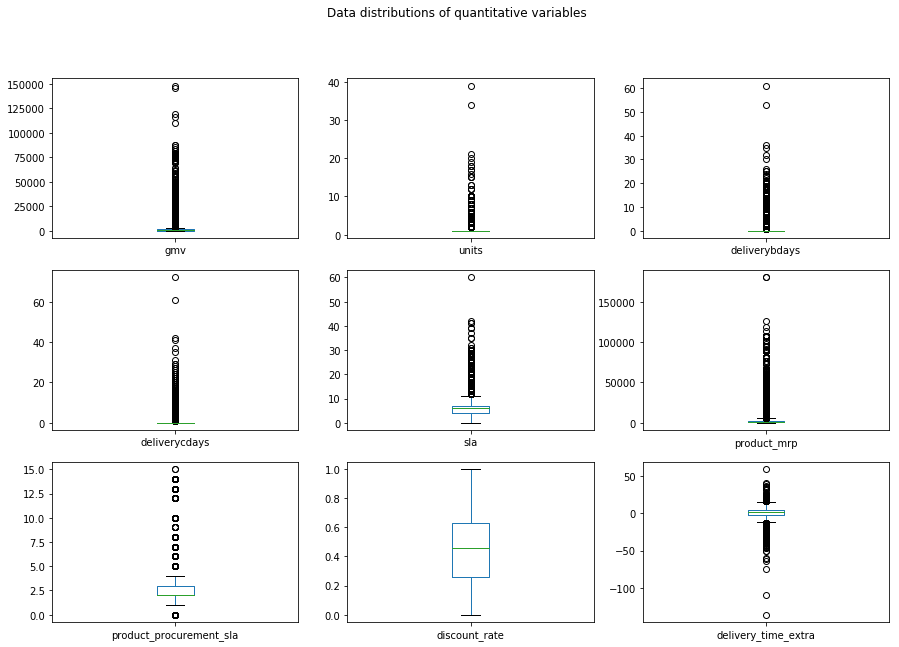

In [231]:
# Understanding of data distributions
df_count = df[['gmv','units','deliverybdays','deliverycdays','sla','product_mrp','product_procurement_sla','discount_rate','delivery_time_extra']]
# plot the distributions
df_count.plot(kind='box',subplots=True,layout=(3,3),sharex=False,figsize=(15,10), title="Data distributions of quantitative variables")
plt.show()

__Observation:__ Continuous variables have significant variance in data

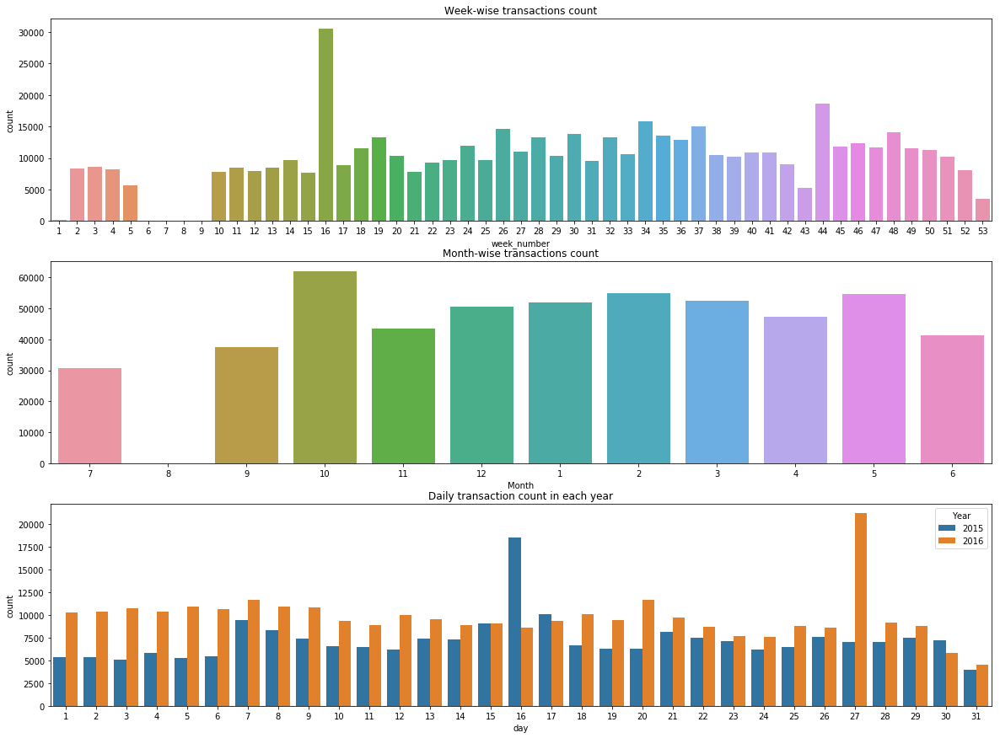

In [232]:
# Check for week_number wise transaction count

plt.figure(figsize=(20,15))  # Figure Size
# Week Wise Data
plt.subplot(3, 1, 1)
ax=sns.countplot(x='week_number', data=df)
ax.set_axisbelow(True)
plt.title("Week-wise transactions count")

# Month Wise
plt.subplot(3, 1, 2)
sns.countplot(x='Month', data=df, order = [7,8,9,10,11,12,1,2,3,4,5,6])
plt.title("Month-wise transactions count")

# Day Wise
plt.subplot(3, 1, 3)
sns.countplot(x='day', hue= 'Year', data=df)
plt.title("Daily transaction count in each year")
plt.show()
plt.show()

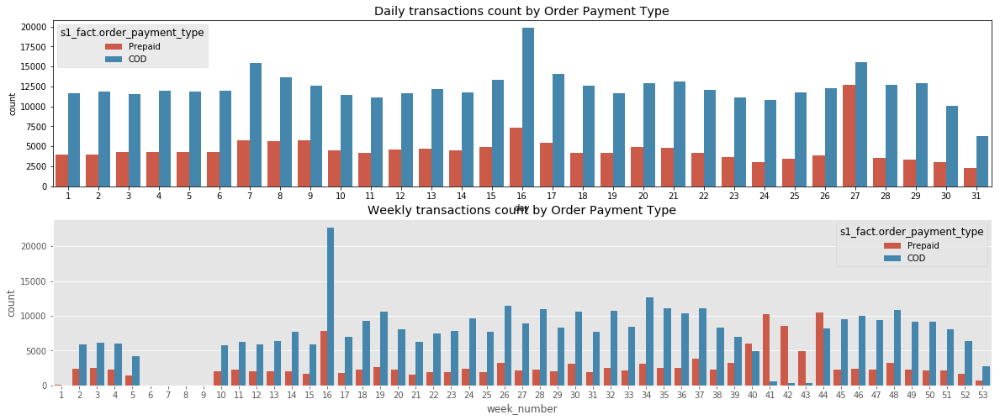

In [233]:
# Check for transactions by day and payment type
plt.figure(figsize=(20,8))  # Figure Size

plt.subplot(2, 1, 1)
matplotlib.style.use('ggplot')
sns.countplot(x='day', hue= 's1_fact.order_payment_type', data=df)
plt.title("Daily transactions count by Order Payment Type")

plt.subplot(2, 1, 2)
sns.countplot(x='week_number', hue= 's1_fact.order_payment_type', data=df)
plt.title("Weekly transactions count by Order Payment Type")


plt.show()

In [234]:
# Check year-wise aggregate GMV
round(df.groupby('Year').gmv.sum().sort_values(ascending=False)/1000000,0)

Year
2016   363.00000
2015   306.00000
Name: gmv, dtype: float64

In [235]:
# Check year-wise proportion of aggregate GMV
subtotal=df.groupby('Year').gmv.sum()
round(100*subtotal/df.gmv.sum(),1).sort_values(ascending=False)

Year
2016   54.30000
2015   45.70000
Name: gmv, dtype: float64

In [236]:
# Check year-wise proportion of aggregate transactions
subtotal=df.groupby('Year').gmv.count()
round(100*subtotal/df.gmv.count(),1).sort_values(ascending=False)

Year
2016   57.40000
2015   42.60000
Name: gmv, dtype: float64

__Observation:__ 2016 has the better aggregate GMV worth of 363 million compared to 306 million worth in 2015, which largely supported by a higher transaction count of 57% compared to 42.6% in 2015

In [237]:
# Check proportion of GMV by product_analytic_vertical
subtotal = df.groupby('product_analytic_vertical').gmv.sum()
round(100*subtotal/df.gmv.sum(),2).sort_values(ascending=False).head(5)

product_analytic_vertical
HomeAudioSpeaker   29.39000
Lens               16.98000
GamePad             9.32000
GamingHeadset       4.77000
Binoculars          4.07000
Name: gmv, dtype: float64

__Observation:__ Top five product categories have contributed to ~65% of total GMV

In [238]:
# check proportion of GMV by product_analytic_category
round(100*df.groupby('product_analytic_category').gmv.sum()/df.gmv.sum(),1).sort_values(ascending=False)

product_analytic_category
CameraAccessory      39.10000
EntertainmentSmall   37.10000
GamingHardware       23.80000
Name: gmv, dtype: float64

In [239]:
# check proportion of GMV by product_analytic_sub_category

round(100*df.groupby('product_analytic_sub_category').gmv.count()/df.gmv.count(),1).sort_values(ascending=False)

product_analytic_sub_category
CameraAccessory   42.20000
GamingAccessory   35.90000
HomeAudio         21.90000
Name: gmv, dtype: float64

__Observation:__ with 42% of total transactions, camera accessories contributed to 39% of total GMV

In [240]:
# check proportion of GMV by s1_fact.order_payment_type
round(100*df.groupby('s1_fact.order_payment_type').gmv.sum()/df.gmv.sum(),1).sort_values(ascending=False)

s1_fact.order_payment_type
COD       66.00000
Prepaid   34.00000
Name: gmv, dtype: float64

__Observation:__ 66% of sales are of COD type, while the rest are prepaid sales

In [241]:
# check proportion of GMV by delivery_time_status
round(100*df.groupby('delivery_time_status').gmv.sum()/df.gmv.sum(),1).sort_values(ascending=False)

delivery_time_status
early delivery   60.50000
late delivery    32.50000
on time           7.00000
Name: gmv, dtype: float64

__Observation:__ Early deliveries are highest at 60% compared to late deliveries poportion of 32% and ontime deliveries of 7%

In [242]:
# check proportion of GMV by delivery_time_status and Year
round(100*df.groupby(['delivery_time_status','Year']).gmv.sum()/df.gmv.sum(),1).sort_values(ascending=False)

delivery_time_status  Year
early delivery        2015   34.40000
                      2016   26.10000
late delivery         2016   25.00000
                      2015    7.50000
on time               2015    3.80000
                      2016    3.10000
Name: gmv, dtype: float64

__Observation:__ Of the 32.5% late deliveries, majority of them are in 2016

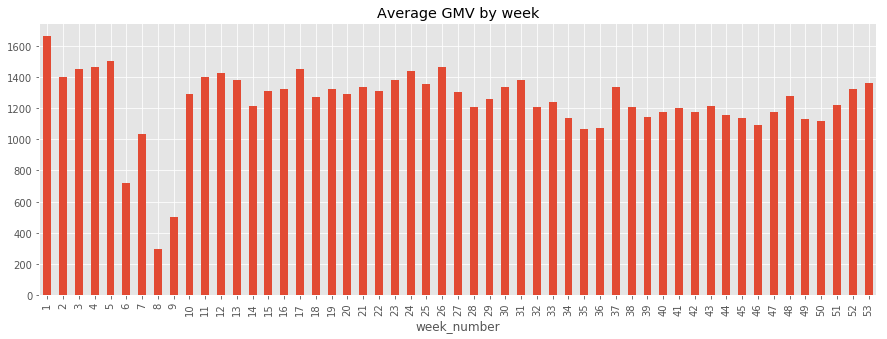

In [243]:
# Check for week_number wise average sales
matplotlib.style.use('ggplot')
plt.figure(figsize=(15,5))
df_plt = df.groupby('week_number').gmv.mean()
ax=df_plt.plot(kind='bar')
plt.title("Average GMV by week")
ax.yaxis.grid(True)

__Observation:__ On an average GMV appears less volatile across weeks, except during 6-9th weeks

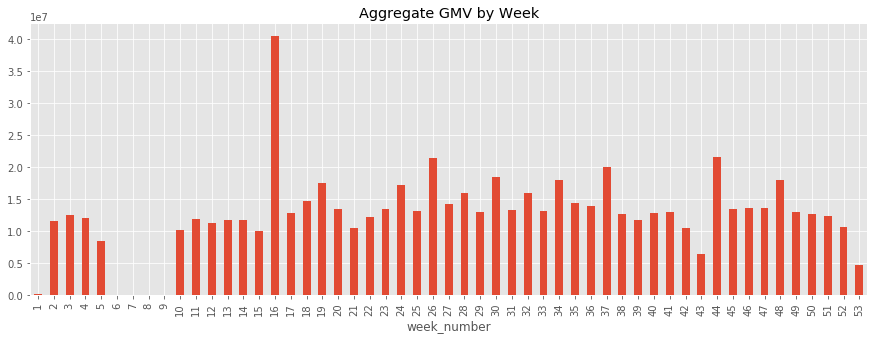

In [244]:
# Check for week_number wise aggregate sales
plt.figure(figsize=(15,5))
df_plt = df.groupby('week_number').gmv.sum()
ax=df_plt.plot(kind='bar')
plt.title("Aggregate GMV by Week")
ax.yaxis.grid(True)

<Figure size 1080x360 with 0 Axes>

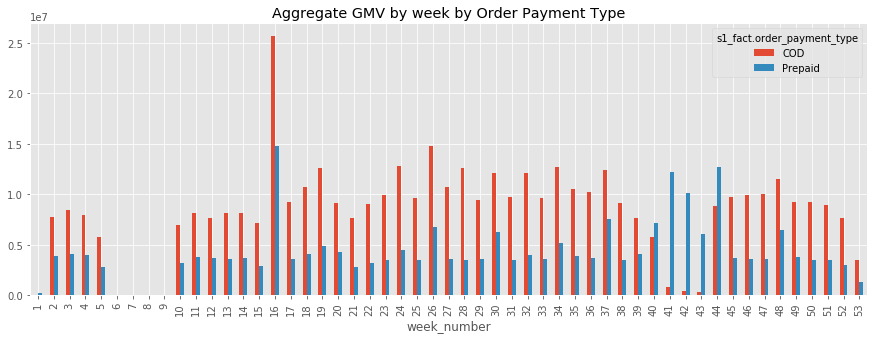

In [245]:
# Check for week_number wise aggregate sales by payment type
plt.figure(figsize=(15,5))
df_plt = df.groupby(['week_number','s1_fact.order_payment_type']).gmv.sum().unstack()
ax=df_plt.plot(kind='bar',figsize=(15,5))
plt.title("Aggregate GMV by week by Order Payment Type")
ax.yaxis.grid(True)

<Figure size 1080x360 with 0 Axes>

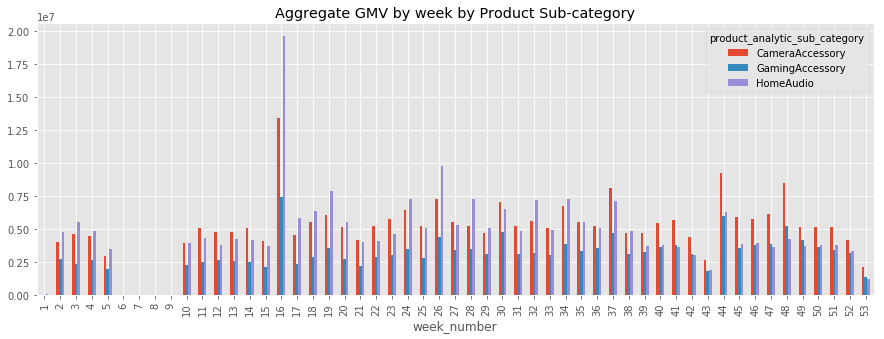

In [246]:
# Check for week_number wise aggregate sales by product_analytic_sub_category
plt.figure(figsize=(15,5))
df_plt = df.groupby(['week_number','product_analytic_sub_category']).gmv.sum().unstack()
ax=df_plt.plot(kind='bar',figsize=(15,5))
plt.title("Aggregate GMV by week by Product Sub-category")
ax.yaxis.grid(True)

<Figure size 1080x360 with 0 Axes>

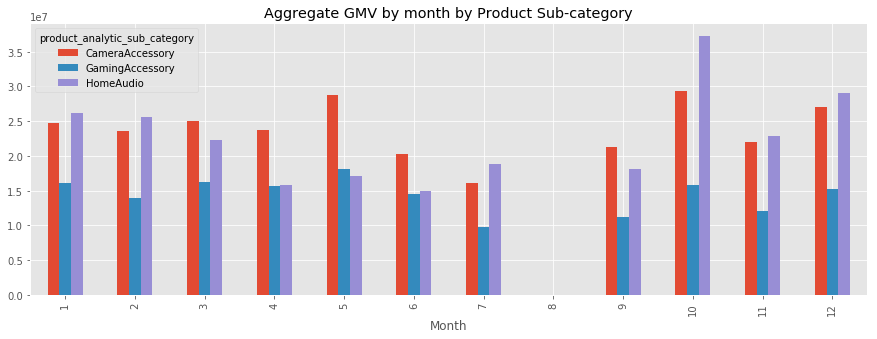

In [247]:
# Check for month wise aggregate sales by product_analytic_sub_category
plt.figure(figsize=(15,5))
df_plt = df.groupby(['Month','product_analytic_sub_category']).gmv.sum().unstack()
ax=df_plt.plot(kind='bar',figsize=(15,5))
plt.title("Aggregate GMV by month by Product Sub-category")
ax.yaxis.grid(True)

<Figure size 360x360 with 0 Axes>

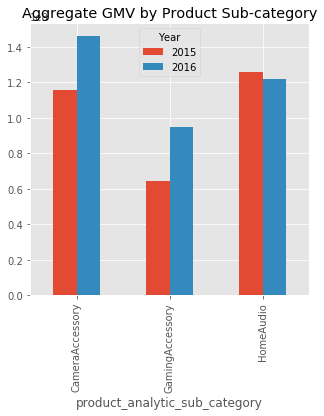

In [248]:
# Check for year wise aggregate sales by product_analytic_sub_category
plt.figure(figsize=(5,5))
df_plt = df.groupby(['product_analytic_sub_category','Year']).gmv.sum().unstack()
ax=df_plt.plot(kind='bar',figsize=(5,5))
plt.title("Aggregate GMV by Product Sub-category")
ax.yaxis.grid(True)

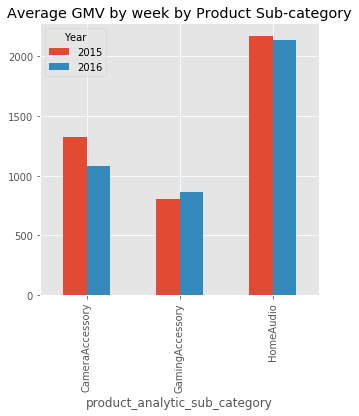

In [249]:
# Check for year wise average sales by product_analytic_sub_category

df_plt = df.groupby(['product_analytic_sub_category','Year']).gmv.mean().unstack()
ax=df_plt.plot(kind='bar',figsize=(5,5))
plt.title("Average GMV by week by Product Sub-category")
ax.yaxis.grid(True)

<Figure size 1080x360 with 0 Axes>

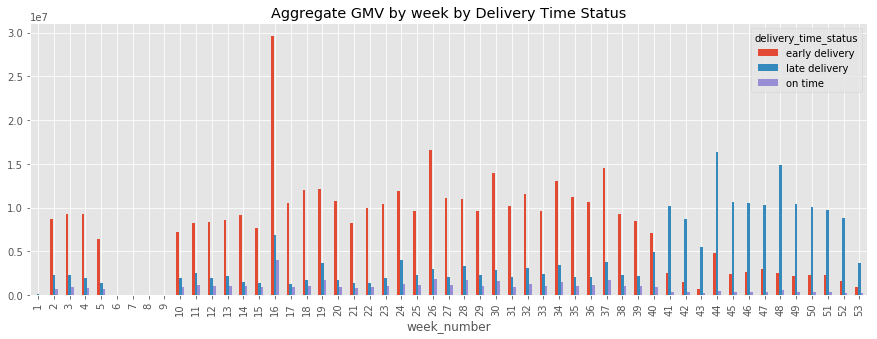

In [250]:
# Check for week_number wise aggregate sales by delivery time status
plt.figure(figsize=(15,5))
df_plt = df.groupby(['week_number','delivery_time_status']).gmv.sum().unstack()
ax=df_plt.plot(kind='bar',figsize=(15,5))
plt.title("Aggregate GMV by week by Delivery Time Status")
ax.yaxis.grid(True)

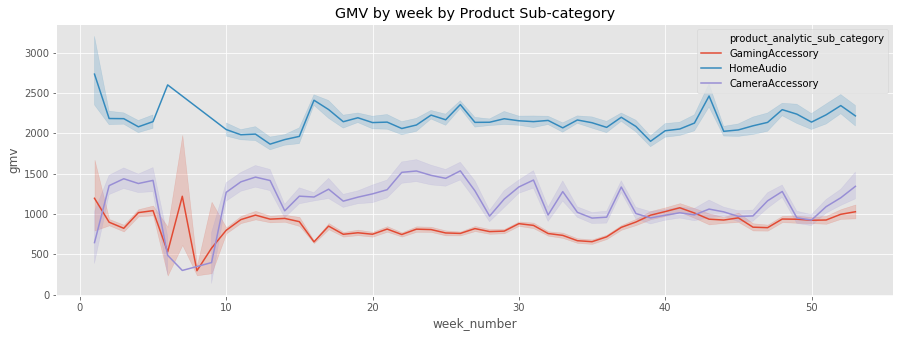

In [251]:
import seaborn as sns
# Plot all sales for all three products
plt.figure(figsize=(15,5))
plt.title("GMV by week by Product Sub-category")
sns.lineplot(data=df, x='week_number', y='gmv', hue='product_analytic_sub_category')

__Observation:__ Home Audio sales are much higher across weeks, followed by Camera Accessories and Gaming Accessories

<Figure size 1080x360 with 0 Axes>

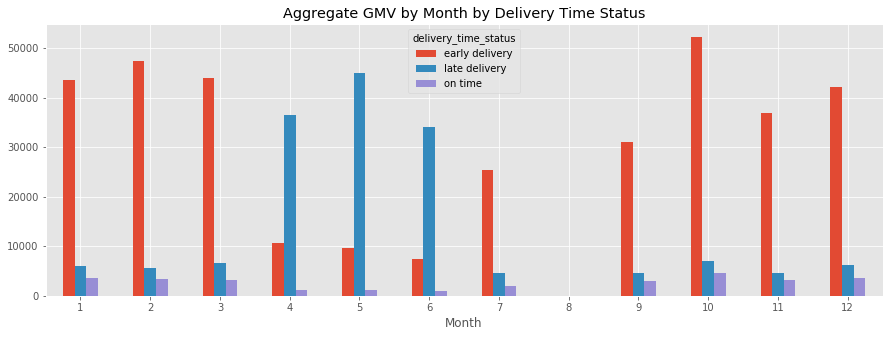

In [252]:
# Check for month wise aggregate units by delivery time status
plt.figure(figsize=(15,5))
df_plt = df.groupby(['Month','delivery_time_status']).units.sum().unstack()
ax=df_plt.plot(kind='bar',figsize=(15,5), rot=False)
plt.title("Aggregate GMV by Month by Delivery Time Status")
ax.yaxis.grid(True)

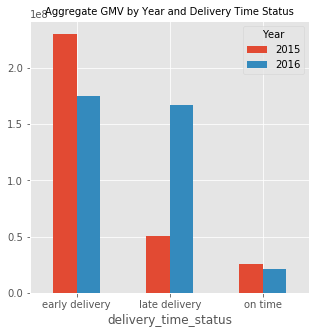

In [253]:
# Check for year wise aggregate gmv by delivery time status
df_plt = df.groupby(['delivery_time_status','Year']).gmv.sum().unstack()
ax=df_plt.plot(kind='bar',figsize=(5,5), rot=False)
plt.title("Aggregate GMV by Year and Delivery Time Status", fontsize=10)
ax.yaxis.grid(True)

__Observation:__ Though early deliveries' gmv is highest, ontime delvieries are reltively small. Late deliveries are highest in 2016

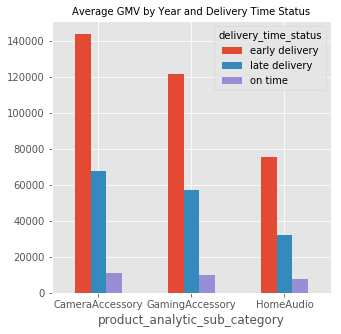

In [254]:
# Plot transaction count by delivery status for each product category
df_plt = df.groupby(['product_analytic_sub_category','delivery_time_status']).units.count().unstack()
ax=df_plt.plot(kind='bar',figsize=(5,5), rot=False)
plt.title("Average GMV by Year and Delivery Time Status", fontsize=10)
ax.yaxis.grid(True)

__Observation:__ All type of deliveries are comparable across three product categories. Late deliveries are present across three categories at comparable proportions

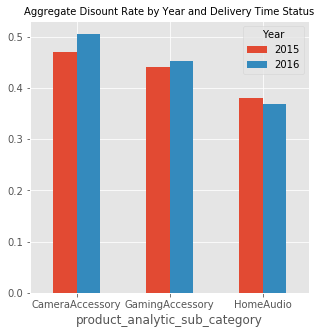

In [255]:
# Plot average discount rate by product categories
df_plt = df.groupby(['product_analytic_sub_category','Year']).discount_rate.mean().unstack()
ax=df_plt.plot(kind='bar',figsize=(5,5), rot=False)
plt.title("Aggregate Disount Rate by Year and Delivery Time Status", fontsize=10)
ax.yaxis.grid(True)

__Observation:__ Discount rates in 2015 are low compared to 2016 for both Camera and Gaming accessories, while home audio products have a relatively high discount rate in 2015 compared to 2016

#### Key Take aways from EDA using transaction level data

1. ~65% of the GMV generated from top five products
2. HomeAudioSpeaker and Lens are the two major product categories, contributing 29.39% and 16.98% to the total GMV, resectively
3. 2016 has the better aggregate GMV worth of 363 million compared to 306 million worth in 2015
4. October month has the highest transaction and sales, while August month has very few transactions and lowest GMV
5. CameraAccessory, HomeAudio and GamingAccessory have sales proportions as 39.1%, 37.1% and 23.8%, respectively
6. 66% of sales are of COD type, while the rest are prepaid sales
7. 32.5% of GMV is generated through late deliveries and majority of these sales are happend during 2016
8. Late deliveries are highest and suddenly increased sine week 41 and they continued till the end of week 53 
9. COD and prepayment sales are uniform across all weeks. However, sales during week 41 to 44 are mostly prepaid sales
10. Discount rates in 2015 are low compared to 2016 for both Camera and Gaming accessories, while home audio products have a relatively high discount rate in 2015 compared to 2016

### 11.2 EDA on Gaming Accessory data set

gmv                           AxesSubplot(0.125,0.749828;0.352273x0.130172)
units                      AxesSubplot(0.547727,0.749828;0.352273x0.130172)
deliverybdays                 AxesSubplot(0.125,0.593621;0.352273x0.130172)
deliverycdays              AxesSubplot(0.547727,0.593621;0.352273x0.130172)
sla                           AxesSubplot(0.125,0.437414;0.352273x0.130172)
product_mrp                AxesSubplot(0.547727,0.437414;0.352273x0.130172)
product_procurement_sla       AxesSubplot(0.125,0.281207;0.352273x0.130172)
discount_rate              AxesSubplot(0.547727,0.281207;0.352273x0.130172)
delivery_time_extra              AxesSubplot(0.125,0.125;0.352273x0.130172)
dtype: object

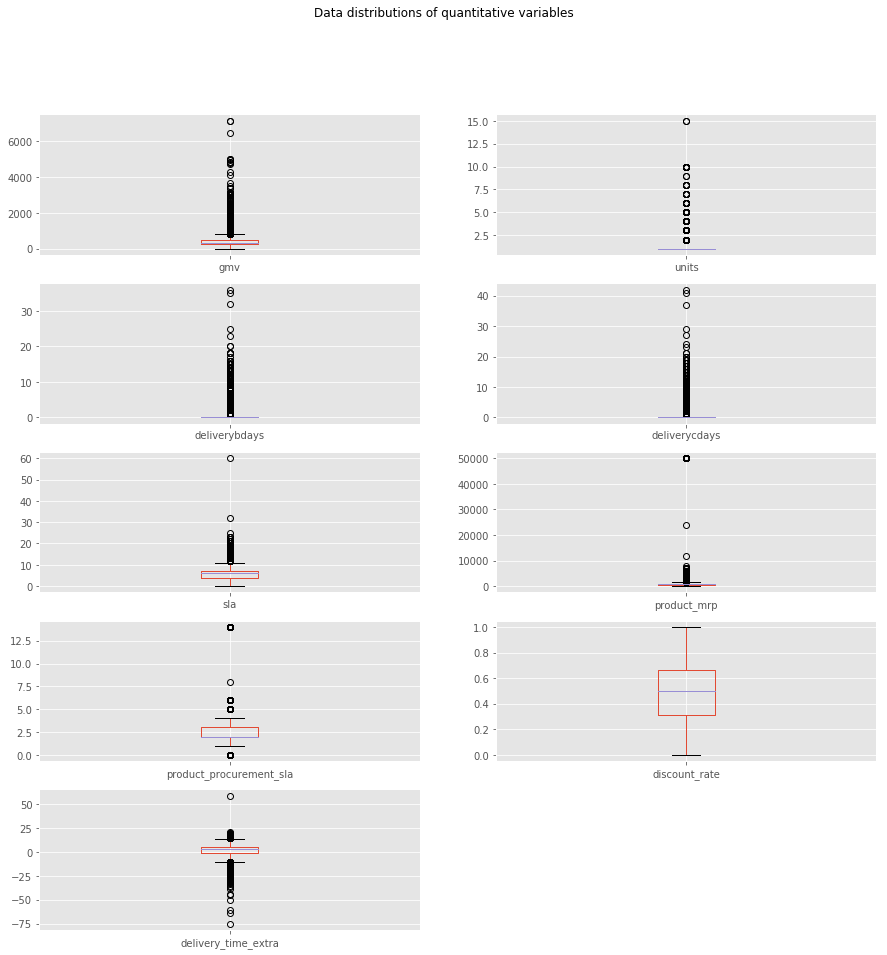

In [256]:
# Understanding of data distributions
df_GamingAccessory_count = df_GamingAccessory[['gmv','units','deliverybdays','deliverycdays','sla','product_mrp','product_procurement_sla','discount_rate','delivery_time_extra']]
# plot the distributions
df_GamingAccessory_count.plot(kind='box',subplots=True,layout=(5,2),sharex=False,figsize=(15,15), title="Data distributions of quantitative variables")

In [257]:
df_GamingAccessory.dtypes

fsn_id                                         object
order_date                             datetime64[ns]
Year                                            int64
Month                                           int64
order_id                                       object
order_item_id                                  object
gmv                                           float64
units                                           int64
deliverybdays                                 float64
deliverycdays                                 float64
sla                                             int64
pincode                                        object
product_analytic_super_category                object
product_analytic_category                      object
product_analytic_sub_category                  object
product_analytic_vertical                      object
product_mrp                                     int64
product_procurement_sla                         int64
listed_price                

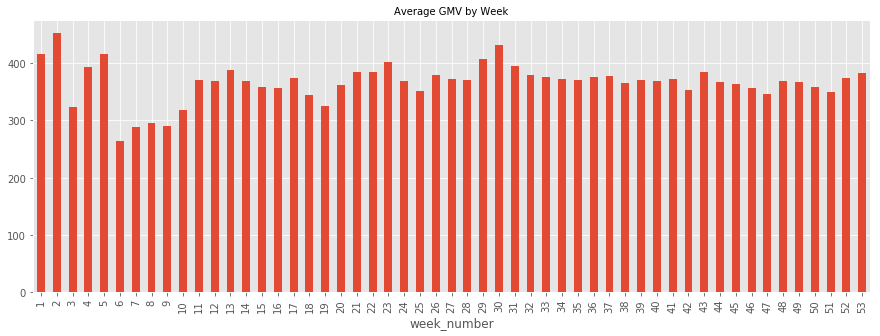

In [258]:
# Plot average GMV by week
plt.figure(figsize=(15,5))
df_plt = df_GamingAccessory.groupby('week_number').gmv.mean()
ax=df_plt.plot(kind='bar')
plt.title("Average GMV by Week", fontsize=10)
ax.yaxis.grid(True)

__Observation:__ Average sales across weeks is comparable

In [259]:
# Check year-wise proportion of aggregate GMV
subtotal=df_GamingAccessory.groupby('Year').gmv.sum()
round(100*subtotal/df_GamingAccessory.gmv.sum(),1).sort_values(ascending=False)

Year
2016   58.50000
2015   41.50000
Name: gmv, dtype: float64

In [260]:
# check proportion of GMV by product_analytic_category
round(100*df_GamingAccessory.groupby('product_analytic_vertical').gmv.sum()/df_GamingAccessory.gmv.sum(),1).sort_values(ascending=False)

product_analytic_vertical
GamingHeadset           33.00000
GamePad                 23.20000
GamingMouse             20.60000
GamingMemoryCard         6.20000
TVOutCableAccessory      4.10000
GamingAccessoryKit       3.90000
GamingMousePad           3.00000
GamingKeyboard           2.60000
JoystickGamingWheel      1.40000
GamingAdapter            1.40000
GamingSpeaker            0.40000
MotionController         0.10000
GamingGun                0.00000
GamingChargingStation    0.00000
CoolingPad               0.00000
Name: gmv, dtype: float64

__Observation:__ 58.5%  of sales occured during 2016. Top three product categories contributed to 76% of total GMV

In [261]:
# check proportion of GMV by product premiumness
round(100*df_GamingAccessory.groupby('PRODUCT PREMIUMNESS').gmv.sum()/df_GamingAccessory.gmv.sum(),1).sort_values(ascending=False)

PRODUCT PREMIUMNESS
1   50.80000
0   49.00000
2    0.20000
Name: gmv, dtype: float64

__Observation:__ GMV by Product premiumness is almost equally distributed between cluster 0 and 1.

In [262]:
# check proportion of GMV by s1_fact.order_payment_type
round(100*df_GamingAccessory.groupby('S1_FACT.ORDER_PAYMENT_TYPE').gmv.sum()/df_GamingAccessory.gmv.sum(),1).sort_values(ascending=False)

S1_FACT.ORDER_PAYMENT_TYPE
COD       77.20000
Prepaid   22.80000
Name: gmv, dtype: float64

__Observation:__ 77% of sales are in the form of COD

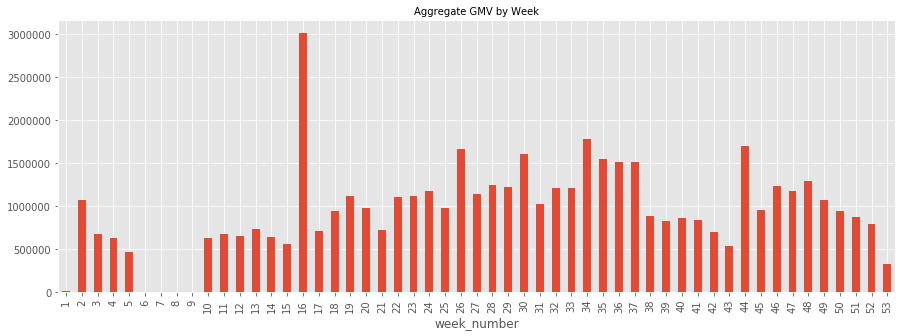

In [263]:
# Check for week_number wise aggregate sales
plt.figure(figsize=(15,5))
df_GamingAccessory_plt = df_GamingAccessory.groupby('week_number').gmv.sum()
ax=df_GamingAccessory_plt.plot(kind='bar')
plt.title("Aggregate GMV by Week", fontsize=10)
ax.yaxis.grid(True)

__Observation:__ Aggregate sales appears very volatile across years

<Figure size 1080x360 with 0 Axes>

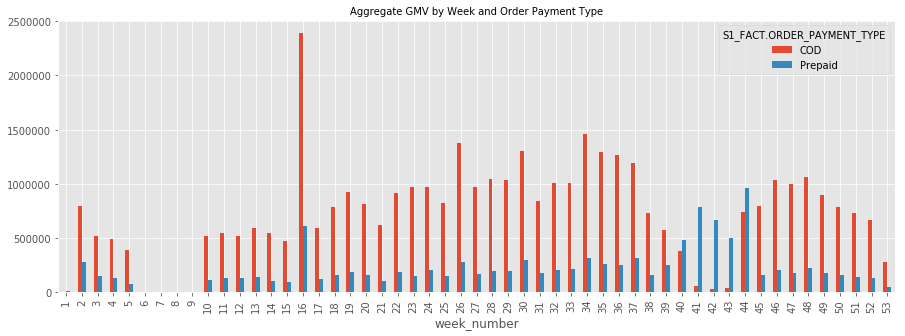

In [264]:
# Check for week_number wise aggregate sales by payment type
plt.figure(figsize=(15,5))
df_GamingAccessory_plt = df_GamingAccessory.groupby(['week_number','S1_FACT.ORDER_PAYMENT_TYPE']).gmv.sum().unstack()
ax=df_GamingAccessory_plt.plot(kind='bar',figsize=(15,5))
plt.title("Aggregate GMV by Week and Order Payment Type", fontsize=10)
ax.yaxis.grid(True)

<Figure size 1080x360 with 0 Axes>

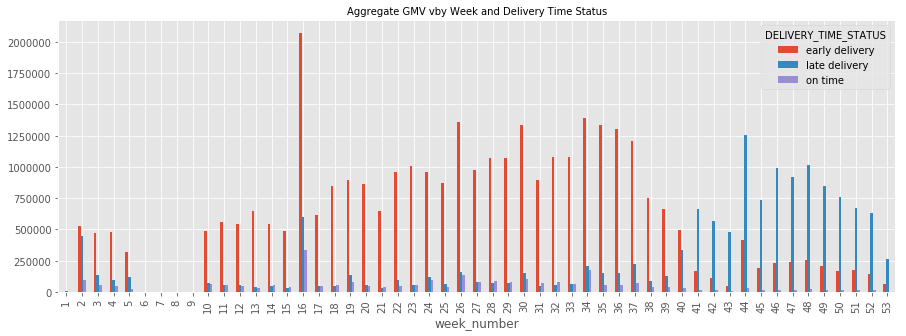

In [265]:
# Check for week_number wise aggregate sales by delivery time status
plt.figure(figsize=(15,5))
df_GamingAccessory_plt = df_GamingAccessory.groupby(['week_number','DELIVERY_TIME_STATUS']).gmv.sum().unstack()
ax=df_GamingAccessory_plt.plot(kind='bar',figsize=(15,5))
plt.title("Aggregate GMV vby Week and Delivery Time Status", fontsize=10)
ax.yaxis.grid(True)

__Observation:__ Sales from late deliviers observed during the last 13 weeks of the analysis period

<Figure size 1080x360 with 0 Axes>

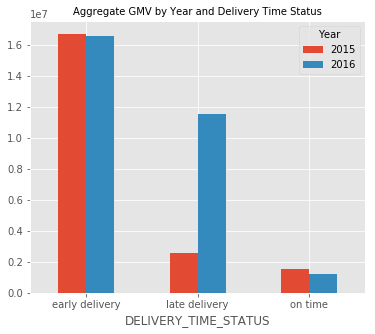

In [266]:
# Check for year wise aggregate gmv by delivery time status
plt.figure(figsize=(15,5))
df_GamingAccessory_plt = df_GamingAccessory.groupby(['DELIVERY_TIME_STATUS','Year']).gmv.sum().unstack()
ax=df_GamingAccessory_plt.plot(kind='bar',figsize=(6,5), rot=False)
plt.title("Aggregate GMV by Year and Delivery Time Status", fontsize=10)
ax.yaxis.grid(True)

#### Key Observations
1. Average sales across weeks are more or less same. However, aggregate sales varies across weeks. 58.5% of sales occured during 2016. Top three product categories contributed to 76% of total GMV
2. GMV by Product premiumness is almost equally distributed between cluster 0 and 1.
3. 77% of sales are in the form of COD
4. Sales from late deliviers observed during the last 13 weeks of the analysis period
5. Sales through early and on-time delivers are comparable across 2015 and 2016, while late deliveries are increased by almost 6 times

### 11.3 HomeAudio Data Set

gmv                           AxesSubplot(0.125,0.749828;0.352273x0.130172)
units                      AxesSubplot(0.547727,0.749828;0.352273x0.130172)
deliverybdays                 AxesSubplot(0.125,0.593621;0.352273x0.130172)
deliverycdays              AxesSubplot(0.547727,0.593621;0.352273x0.130172)
sla                           AxesSubplot(0.125,0.437414;0.352273x0.130172)
product_mrp                AxesSubplot(0.547727,0.437414;0.352273x0.130172)
product_procurement_sla       AxesSubplot(0.125,0.281207;0.352273x0.130172)
discount_rate              AxesSubplot(0.547727,0.281207;0.352273x0.130172)
delivery_time_extra              AxesSubplot(0.125,0.125;0.352273x0.130172)
dtype: object

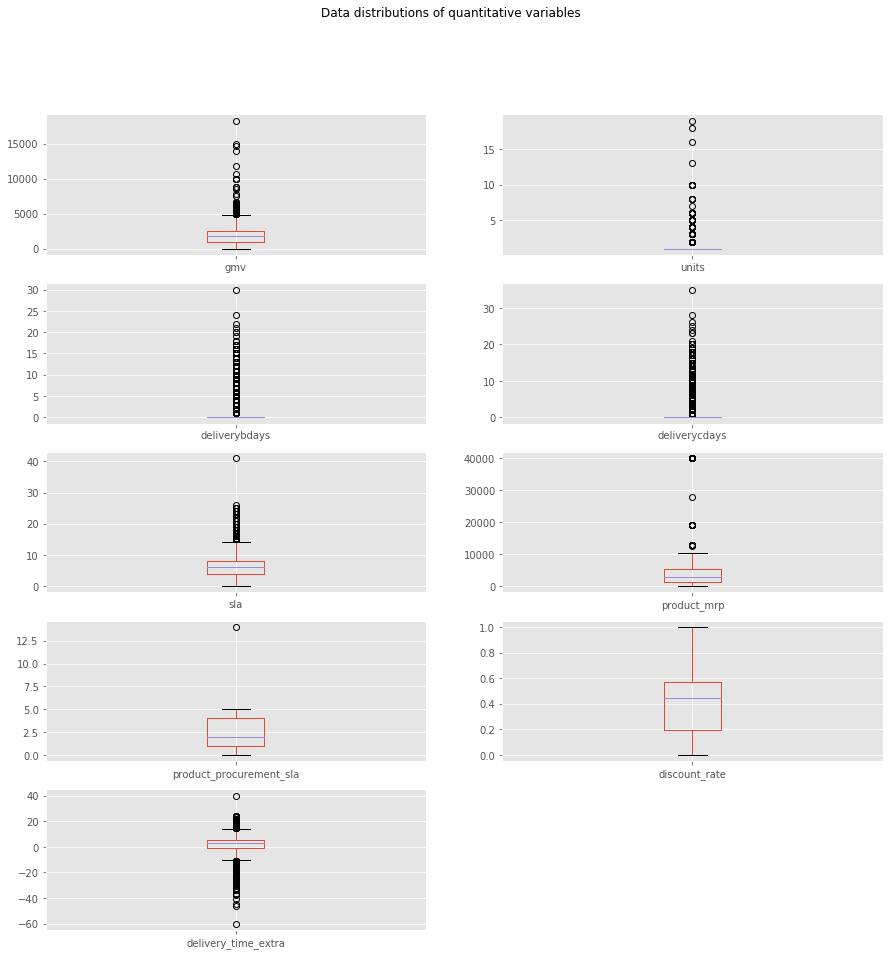

In [267]:
# Understanding of data distributions
df_HomeAudio_count = df_HomeAudio[['gmv','units','deliverybdays','deliverycdays','sla','product_mrp','product_procurement_sla','discount_rate','delivery_time_extra']]
# plot the distributions
df_HomeAudio_count.plot(kind='box',subplots=True,layout=(5,2),sharex=False,figsize=(15,15), title="Data distributions of quantitative variables")

__Observation:__ Data is very parse across contrinuous variables

In [268]:
# Check year-wise proportion of aggregate GMV
subtotal=df_HomeAudio.groupby('Year').gmv.sum()
round(100*subtotal/df_HomeAudio.gmv.sum(),1).sort_values(ascending=False)

Year
2016   50.00000
2015   50.00000
Name: gmv, dtype: float64

In [269]:
# check proportion of GMV by product_analytic_category
round(100*df_HomeAudio.groupby('product_analytic_vertical').gmv.sum()/df_HomeAudio.gmv.sum(),1).sort_values(ascending=False)

product_analytic_vertical
HomeAudioSpeaker   82.80000
FMRadio            12.40000
BoomBox             1.70000
VoiceRecorder       1.30000
HiFiSystem          0.90000
Dock                0.60000
DockingStation      0.20000
SoundMixer          0.00000
DJController        0.00000
Name: gmv, dtype: float64

__Observation:__ Sales are evenly distributed between 2015 and 2016. Top two product categories are contributing to 95% of total sales

In [270]:
# check proportion of GMV by s1_fact.order_payment_type
round(100*df_HomeAudio.groupby('S1_FACT.ORDER_PAYMENT_TYPE').gmv.sum()/df_HomeAudio.gmv.sum(),1).sort_values(ascending=False)

S1_FACT.ORDER_PAYMENT_TYPE
COD       78.10000
Prepaid   21.90000
Name: gmv, dtype: float64

__Observation:__ 78% of sales are in the form COD payment type

In [271]:
# check proportion of GMV by delivery_time_status
round(100*df_HomeAudio.groupby('DELIVERY_TIME_STATUS').gmv.sum()/df_HomeAudio.gmv.sum(),1).sort_values(ascending=False)

DELIVERY_TIME_STATUS
early delivery   61.00000
late delivery    31.30000
on time           7.60000
Name: gmv, dtype: float64

In [272]:
# check proportion of GMV by delivery_time_status and Year
round(100*df_HomeAudio.groupby(['DELIVERY_TIME_STATUS','Year']).gmv.sum()/df_HomeAudio.gmv.sum(),1).sort_values(ascending=False)

DELIVERY_TIME_STATUS  Year
early delivery        2015   37.00000
                      2016   24.10000
late delivery         2016   22.50000
                      2015    8.80000
on time               2015    4.20000
                      2016    3.50000
Name: gmv, dtype: float64

__Observation:__ 31% of sales are coming from late deliveries and 22.5% of these late deliveries are occured in 2016

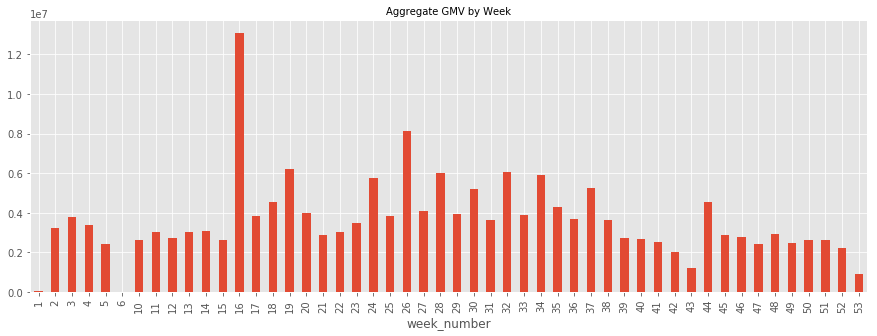

In [273]:
# Check for week_number wise aggregate sales
plt.figure(figsize=(15,5))
df_HomeAudio_plt = df_HomeAudio.groupby('week_number').gmv.sum()
ax=df_HomeAudio_plt.plot(kind='bar')
plt.title("Aggregate GMV by Week", fontsize=10)
ax.yaxis.grid(True)

__Observation:__ Aggregate sales are varying across weeks and are high during special sales days

<Figure size 1080x360 with 0 Axes>

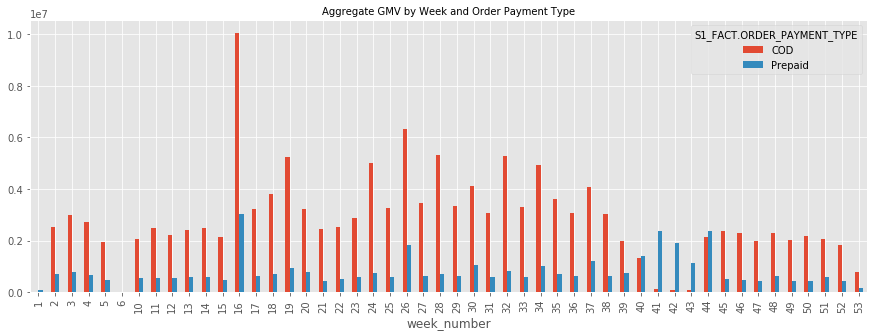

In [274]:
# Check for week_number wise aggregate sales by payment type
plt.figure(figsize=(15,5))
df_HomeAudio_plt = df_HomeAudio.groupby(['week_number','S1_FACT.ORDER_PAYMENT_TYPE']).gmv.sum().unstack()
ax=df_HomeAudio_plt.plot(kind='bar',figsize=(15,5))
plt.title("Aggregate GMV by Week and Order Payment Type", fontsize=10)
ax.yaxis.grid(True)

__Observation:__ Prepaid sales are uniform across weeks, while COD sales are varying across weeks

<Figure size 1080x360 with 0 Axes>

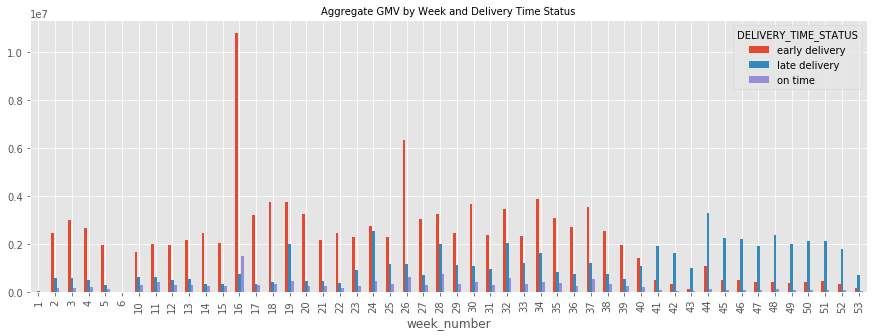

In [275]:
# Check for week_number wise aggregate sales by delivery time status
plt.figure(figsize=(15,5))
df_HomeAudio_plt = df_HomeAudio.groupby(['week_number','DELIVERY_TIME_STATUS']).gmv.sum().unstack()
ax=df_HomeAudio_plt.plot(kind='bar',figsize=(15,5))
plt.title("Aggregate GMV by Week and Delivery Time Status", fontsize=10)
ax.yaxis.grid(True)

__Observation:__ Late deliviers are in the range of normal deliveries and are happend mostly during the last 13 weeks of the analysis preiod

<Figure size 1080x360 with 0 Axes>

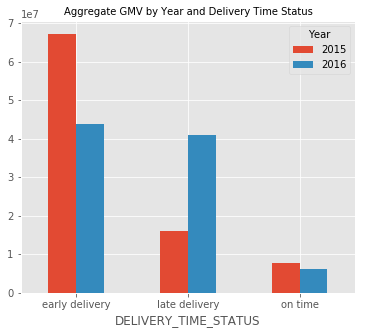

In [276]:
# Check for year wise aggregate gmv by delivery time status
plt.figure(figsize=(15,5))
df_HomeAudio_plt = df_HomeAudio.groupby(['DELIVERY_TIME_STATUS','Year']).gmv.sum().unstack()
ax=df_HomeAudio_plt.plot(kind='bar',figsize=(6,5), rot=False)
plt.title("Aggregate GMV by Year and Delivery Time Status", fontsize=10)
ax.yaxis.grid(True)

__Observation:__ Early deliveries dropped in 2016 due to increase in late deliveries. On-time deliveries are also slightly decreased in 2016

<Figure size 1080x360 with 0 Axes>

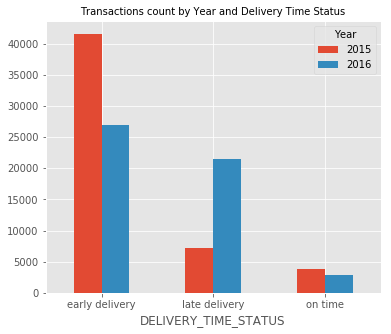

In [277]:
# Check for year wise units count by delivery time status
plt.figure(figsize=(15,5))
df_HomeAudio_plt = df_HomeAudio.groupby(['DELIVERY_TIME_STATUS','Year']).units.count().unstack()
ax=df_HomeAudio_plt.plot(kind='bar',figsize=(6,5), rot=False)
plt.title("Transactions count by Year and Delivery Time Status", fontsize=10)
ax.yaxis.grid(True)

<Figure size 1080x360 with 0 Axes>

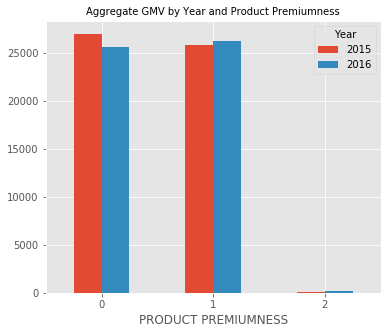

In [278]:
# Check for year wise units count by delivery time status
plt.figure(figsize=(15,5))
df_HomeAudio_plt = df_HomeAudio.groupby(['PRODUCT PREMIUMNESS','Year']).units.sum().unstack()
ax=df_HomeAudio_plt.plot(kind='bar',figsize=(6,5), rot=False)
plt.title("Aggregate GMV by Year and Product Premiumness", fontsize=10)
ax.yaxis.grid(True)

#### Key Observations
1. Sales are evenly distributed between 2015 and 2016. Top two product categories are contributing to 95% of total sales
2. 78% of sales are in the form COD payment type
3. 31% of sales are coming from late deliveries and 22.5% of these late deliveries are occured in 2016
4. Aggregate sales are varying across weeks and are high during special sales days
5. Prepaid sales are uniform across weeks, while COD sales are varying across weeks
6.  Late deliviers are in the range of normal deliveries and are happend mostly during the last 13 weeks of the analysis preiod
7. Early deliveries dropped in 2016 due to increase in late deliveries. On-time deliveries are also slightly decreased in 2016
8. Sales through product premiumness 0 and 1 are mostly equally distributed

### 11.4 EDA on Camera Accessories Data Set

In [279]:
# Check year-wise proportion of aggregate GMV
subtotal=df_CameraAccessory.groupby('Year').gmv.sum()
round(100*subtotal/df_CameraAccessory.gmv.sum(),1).sort_values(ascending=False)

Year
2016   59.70000
2015   40.30000
Name: gmv, dtype: float64

__Observation:__ Majority of sales are happend in 2016

In [280]:
# check proportion of GMV by product_analytic_category
round(100*df_CameraAccessory.groupby('product_analytic_vertical').gmv.sum()/df_CameraAccessory.gmv.sum(),1).sort_values(ascending=False)

product_analytic_vertical
Flash                  22.30000
CameraBattery          19.00000
CameraTripod           16.70000
Lens                   12.90000
CameraBatteryCharger    7.80000
Filter                  6.00000
Binoculars              4.70000
CameraBag               4.60000
CameraRemoteControl     3.50000
Strap                   0.90000
CameraAccessory         0.90000
CameraMount             0.30000
Telescope               0.20000
CameraMicrophone        0.00000
CameraEyeCup            0.00000
CameraBatteryGrip       0.00000
FlashShoeAdapter        0.00000
ReflectorUmbrella       0.00000
Softbox                 0.00000
Name: gmv, dtype: float64

__Observation:__ ~80% of GMV is contributed nby top five product categories

In [281]:
# check proportion of GMV by s1_fact.order_payment_type
round(100*df_CameraAccessory.groupby('S1_FACT.ORDER_PAYMENT_TYPE').gmv.sum()/df_CameraAccessory.gmv.sum(),1).sort_values(ascending=False)

S1_FACT.ORDER_PAYMENT_TYPE
COD       71.20000
Prepaid   28.80000
Name: gmv, dtype: float64

__Observation:__ Sales are largely in the form of COD (71%)

In [282]:
# check proportion of GMV by delivery_time_status
round(100*df_CameraAccessory.groupby('DELIVERY_TIME_STATUS').gmv.sum()/df_CameraAccessory.gmv.sum(),1).sort_values(ascending=False)

DELIVERY_TIME_STATUS
early delivery   67.00000
late delivery    28.10000
on time           4.90000
Name: gmv, dtype: float64

In [283]:
# check proportion of GMV by delivery_time_status and Year
round(100*df_CameraAccessory.groupby(['DELIVERY_TIME_STATUS','Year']).gmv.sum()/df_CameraAccessory.gmv.sum(),1).sort_values(ascending=False)

DELIVERY_TIME_STATUS  Year
early delivery        2015   34.30000
                      2016   32.70000
late delivery         2016   24.70000
                      2015    3.30000
on time               2015    2.70000
                      2016    2.20000
Name: gmv, dtype: float64

__Observation:__ 67% of sales are came from early deliveries, followed by 28% from late deliveries and the rest from on-time deliveries. Early deliveries are comparable between 2015 and 2016, while late deliveries are largely happend in 2016

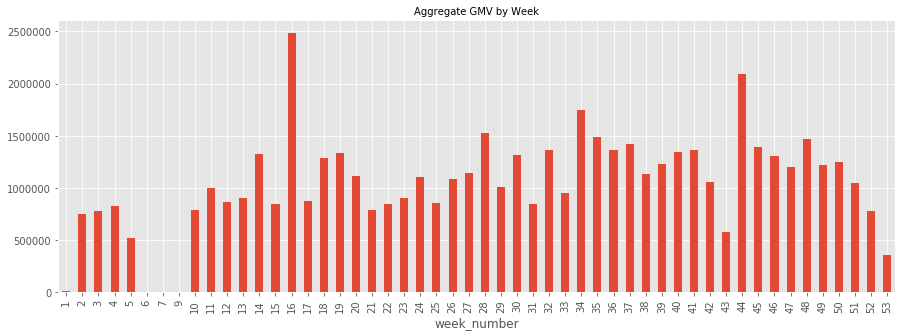

In [284]:
# Check for week_number wise aggregate sales
plt.figure(figsize=(15,5))
df_CameraAccessory_plt = df_CameraAccessory.groupby('week_number').gmv.sum()
ax=df_CameraAccessory_plt.plot(kind='bar')
plt.title("Aggregate GMV by Week", fontsize=10)
ax.yaxis.grid(True)

__Observation:__ Sales in early weeks are relatively low, while sales picked up during special sale days

<Figure size 1080x360 with 0 Axes>

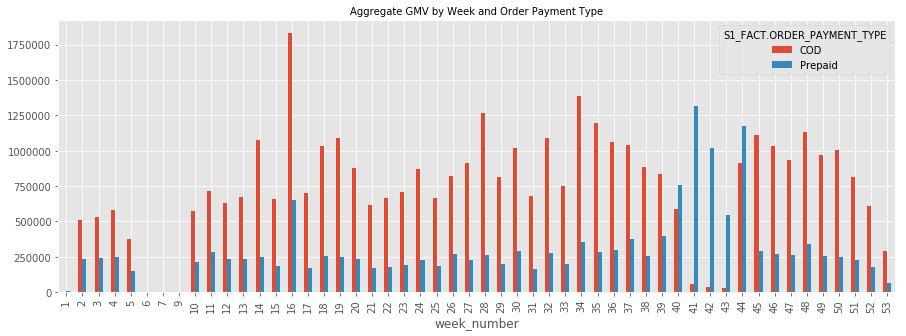

In [285]:
# Check for week_number wise aggregate sales by payment type
plt.figure(figsize=(15,5))
df_CameraAccessory_plt = df_CameraAccessory.groupby(['week_number','S1_FACT.ORDER_PAYMENT_TYPE']).gmv.sum().unstack()
ax=df_CameraAccessory_plt.plot(kind='bar',figsize=(15,5))
plt.title("Aggregate GMV by Week and Order Payment Type", fontsize=10)
ax.yaxis.grid(True)

__Observation:__ Across weeks prepaid sales are more or less comparable, except during 40-44 weeks. While, COD sales are very volatile across weeks.

<Figure size 1080x360 with 0 Axes>

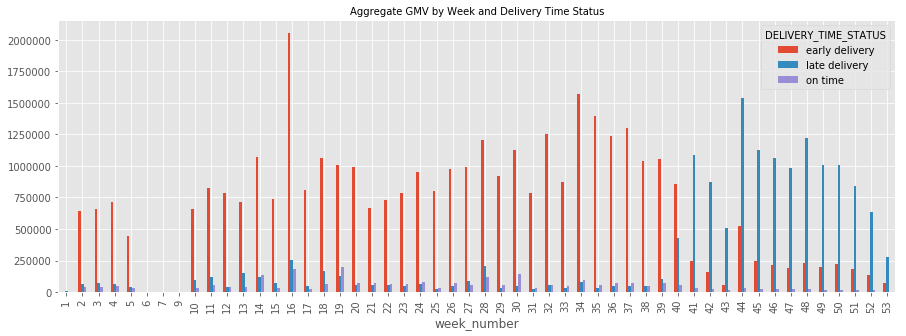

In [286]:
# Check for week_number wise aggregate sales by delivery time status
plt.figure(figsize=(15,5))
df_CameraAccessory_plt = df_CameraAccessory.groupby(['week_number','DELIVERY_TIME_STATUS']).gmv.sum().unstack()
ax=df_CameraAccessory_plt.plot(kind='bar',figsize=(15,5))
plt.title("Aggregate GMV by Week and Delivery Time Status", fontsize=10)
ax.yaxis.grid(True)

__Observation:__ Sales from late deliviers observed during the last 13 weeks of the analysis period

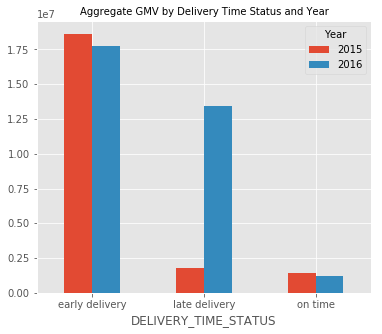

In [287]:
# Check for year wise aggregate gmv by delivery time status
df_CameraAccessory_plt = df_CameraAccessory.groupby(['DELIVERY_TIME_STATUS','Year']).gmv.sum().unstack()
ax=df_CameraAccessory_plt.plot(kind='bar',figsize=(6,5), rot=False)
plt.title("Aggregate GMV by Delivery Time Status and Year", fontsize=10)
ax.yaxis.grid(True)

__Observation:__ Sales through on time and early deliveries are comparable across years. However, late deliveries are significantly high in 2016

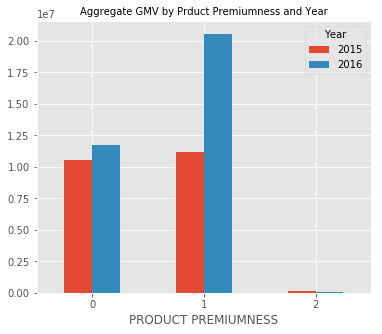

In [288]:
# Check for year wise aggregate gmv by Product premiumness
df_CameraAccessory_plt = df_CameraAccessory.groupby(['PRODUCT PREMIUMNESS','Year']).gmv.sum().unstack()
ax=df_CameraAccessory_plt.plot(kind='bar',figsize=(6,5), rot=False)
plt.title("Aggregate GMV by Prduct Premiumness and Year", fontsize=10)
ax.yaxis.grid(True)

__Observation:__ Sales through product premiumness 1 almost doubled in 2016, while it is a small growth for product premiumness 0

#### Key Observations
1. ~60% of camera accessories sales are happend in 2016. ~80% of GMV is contributed by top five product categories
2. 71% of sales GMV drawn from COD sales
3. 67% of sales are came from early deliveries, followed by 28% from late deliveries and the rest from on-time deliveries. Early deliveries are comparable between 2015 and 2016, while late deliveries are largely happend in 2016
4. Sales in early weeks are relatively low, while sales picked up during special sale days
5. Across weeks prepaid sales are more or less comparable, except during 40-44 weeks. While, COD sales are very volatile across weeks.
6. Sales from late deliviers observed during the last 13 weeks of the analysis period
7. Sales through on time and early deliveries are comparable across years. However, late deliveries are significantly high in 2016
8. Sales through product premiumness 1 almost doubled in 2016, while it is a small growth for product premiumness 0

### 11.5 EDA on Weather Data

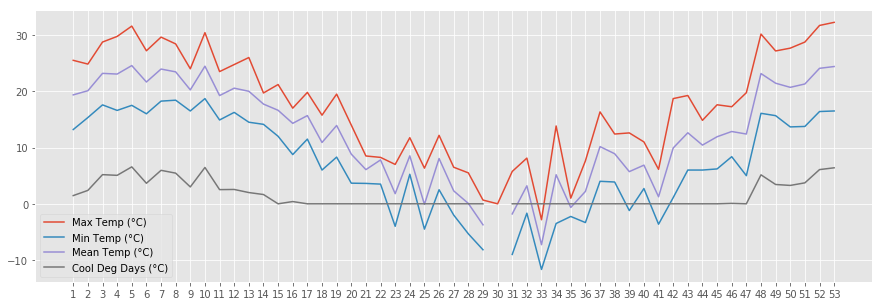

In [289]:
# Check for week_number wise transaction count
matplotlib.style.use('ggplot')
fig = plt.figure(figsize=(15,5))
plt.plot('Max Temp (°C)', data=weekly_climate)
plt.plot('Min Temp (°C)', data=weekly_climate)
plt.plot('Mean Temp (°C)',data=weekly_climate)
plt.plot('Cool Deg Days (°C)',data=weekly_climate)
plt.xticks(weekly_climate.index)
plt.legend()
plt.show()

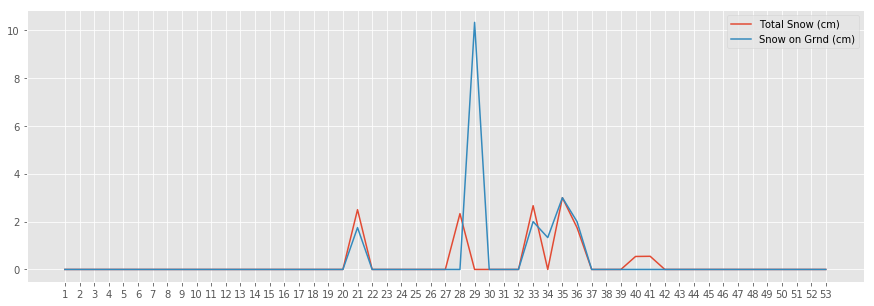

In [290]:
fig = plt.figure(figsize=(15,5))
plt.plot('Total Snow (cm)', data=weekly_climate)
plt.plot('Snow on Grnd (cm)', data=weekly_climate)
plt.xticks(weekly_climate.index)
plt.legend()
plt.show()

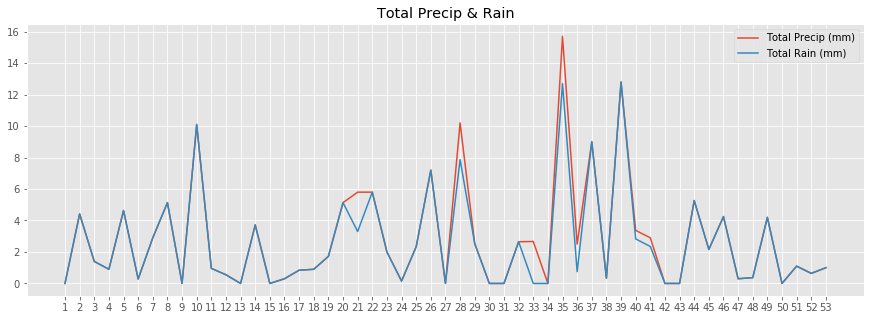

In [291]:
fig = plt.figure(figsize=(15,5))
plt.plot('Total Precip (mm)', data=weekly_climate)
plt.plot('Total Rain (mm)', data=weekly_climate)
plt.xticks(weekly_climate.index)
plt.title("Total Precip & Rain")
plt.legend()
plt.show()

### 11.6 EDA on Investments and NPS

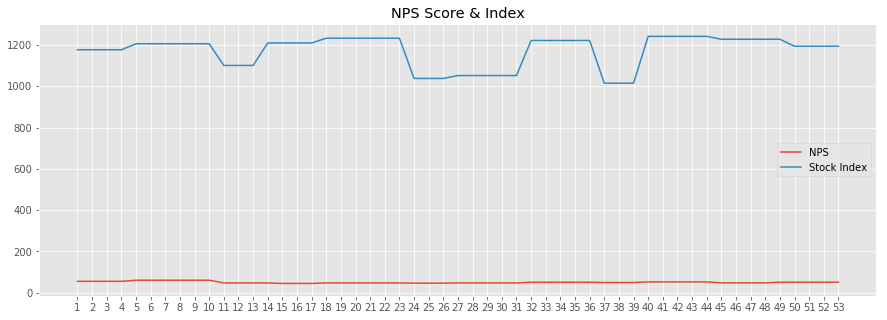

In [292]:
# Plot NPS and Stock Index scores
fig = plt.figure(figsize=(15,5))
plt.plot('NPS', data=weekly_NPS)
plt.plot('Stock Index', data=weekly_NPS)
plt.title("NPS Score & Index")
plt.legend()
plt.xticks(weekly_NPS.index)
plt.show()

__Observation:__ There is no much insight based on above plot as these two values appear more static in nature

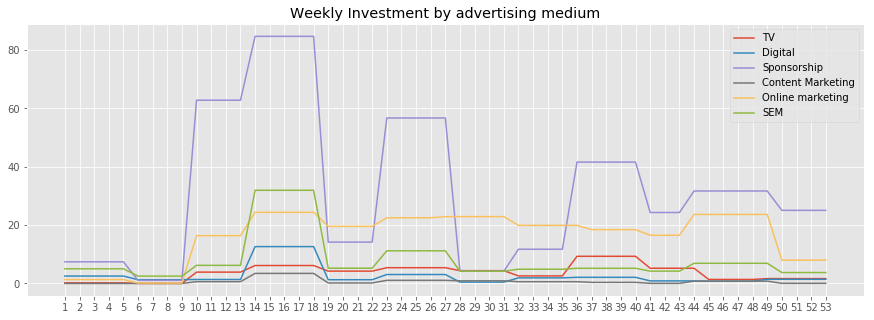

In [293]:
fig = plt.figure(figsize=(15,5))
#plt.plot('Total Investment', data=weekly_spend)
plt.plot('TV', data=weekly_spend)
plt.plot('Digital', data=weekly_spend)
plt.plot('Sponsorship', data=weekly_spend)
plt.plot('Content Marketing', data=weekly_spend)
plt.plot('Online marketing', data=weekly_spend)
plt.plot('SEM', data=weekly_spend)
plt.xticks(weekly_spend.index)
plt.legend()
plt.title("Weekly Investment by advertising medium")
plt.show()

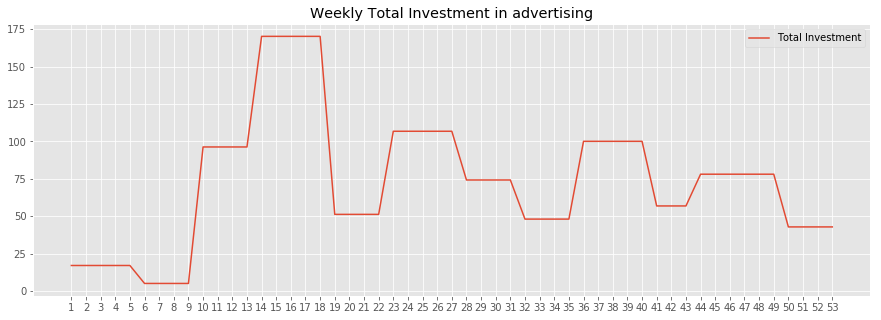

In [294]:
fig = plt.figure(figsize=(15,5))
plt.plot('Total Investment', data=weekly_spend)
plt.xticks(weekly_spend.index)
plt.legend()
plt.title("Weekly Total Investment in advertising")
plt.show()

__Oservation:__ Sponsorship medium attracted the most investment, followed by online marketing. However, investment in online marketing is more stable across weeks, while investment in sponsorship is significantly varies across years. It is very high in initial weeks and decreased in mid and later weeks of the analysis period

## SECTION 6
### 12. Making Final Data Frames for Modeling
Since we are working on 3 sub categories distinctly, we will have 3 dataframes formed out of 4 data sets each. 
1. 3 Category data Sets are for `Home Audio`, `Camera Accessory` and `Gaming Accesory`
2. Each data set include a combination of 4 internal and external features from `Consumer Data`, `Weather`, `NPS Scores` and `add stocks`
3. Each of these are transformed to weekly level to work with data sets

### 12.1 Joining the Data Frames

In [295]:
from functools import reduce
# Combine all data frames
def merge_fun(x,y):
    return pd.merge(x,y, how='outer', left_on='week_number', right_on='week_number')
    

In [296]:
# DataFrames to combine
df_audio = [weekly_audio, weekly_climate,weekly_NPS, adstocks_audio]
df_game  = [weekly_game, weekly_climate,weekly_NPS, adstocks_game]
df_camera = [weekly_camera, weekly_climate,weekly_NPS, adstocks_camera]

df_combined_audio = reduce(merge_fun, df_audio)
df_combined_game  = reduce(merge_fun, df_game)
df_combined_camera = reduce(merge_fun, df_camera)

In [297]:
df_combined_audio.columns

Index(['gmv', 'units', 'order_id', 'order_item_id', 'product_mrp', 'pay_day',
       'special_sale_dates', 'discount_rate',
       'delivery_time_status_early delivery',
       'delivery_time_status_late delivery', 'delivery_time_status_on time',
       's1_fact.order_payment_type_COD', 's1_fact.order_payment_type_Prepaid',
       'Product Premiumness_0', 'Product Premiumness_1',
       'Product Premiumness_2', 'Month_x', 'monthly gmv',
       'weekly gmv distribution', 'Year', 'Month_y', 'Day', 'Max Temp (°C)',
       'Min Temp (°C)', 'Mean Temp (°C)', 'Heat Deg Days (°C)',
       'Cool Deg Days (°C)', 'Total Rain (mm)', 'Total Snow (cm)',
       'Total Precip (mm)', 'Snow on Grnd (cm)', 'NPS', 'Stock Index', 'date',
       'add_stock_TV', 'add_stock_digital', 'add_stock_sponsorship',
       'add_stock_content', 'add_stock_online', 'add_stock_affiliates',
       'add_stock_SEM'],
      dtype='object')

### 12.2 Dropping Categorical Columns:
1. In previous work, we handled encoding the essential categorical features also
2. We did not drop a single feature since they might be useful for EDA
3. Since EDA is performed and data is gettinmg model ready, we choose to drop all unnecessary features like `Categorical Non Numerical Data`, `Id's` and like wise

In [298]:
column_list = ['date','Month_y','Month_x', 'Year','Day', 
               'weekly gmv distribution','monthly gmv', 'order_id','order_item_id']

# Dropping Columns
df_combined_audio.drop(column_list, axis = 1, inplace = True)
df_combined_game.drop(column_list, axis = 1, inplace = True)
df_combined_camera.drop(column_list, axis = 1, inplace = True)

In [299]:
# Inspecting the dataframes
inspect_df(df_combined_audio,2)

Step 1: Peek into the data: 
                       gmv      units   product_mrp  pay_day  \
week_number                                                   
1             74949.00000   34.00000  141267.00000  0.00000   
2           3217857.13309 1932.00000 5536967.00000  0.00000   

             special_sale_dates  discount_rate  \
week_number                                      
1                       0.00000        0.40828   
2                       0.00000        0.33923   

             delivery_time_status_early delivery  \
week_number                                        
1                                       29.41176   
2                                       82.53138   

             delivery_time_status_late delivery  delivery_time_status_on time  \
week_number                                                                     
1                                      64.70588                       5.88235   
2                                      13.17992                 

### 12.3 Cleaning the Dataframes (Filling null values with 0)

In [300]:
# Compute Null Values in data
null_percent_audio = round(100*df_combined_audio.isnull().sum(axis=1)/len(df_combined_audio.index),2).sort_values(ascending=False)
null_percent_game = round(100*df_combined_game.isnull().sum(axis=1)/len(df_combined_game.index),2).sort_values(ascending=False)
null_percent_camera = round(100*df_combined_camera.isnull().sum(axis=1)/len(df_combined_camera.index),2).sort_values(ascending=False)

# Print the percentage of null values in audio
print('Percent null values in audio')
print(null_percent_audio[null_percent_audio>0])

# Print the percentage of null values in camera
print('Percent null values in camera')
print(null_percent_camera[null_percent_camera>0])

# Print the percentage of null values in game
print('Percent null values in game')
print(null_percent_game[null_percent_game>0])

Percent null values in audio
week_number
9    26.42000
8    26.42000
7    26.42000
30    7.55000
dtype: float64
Percent null values in camera
week_number
8    26.42000
30    7.55000
dtype: float64
Percent null values in game
week_number
30   7.55000
dtype: float64


__Remarks:__ 
1. It is evident that there are no values in few weeks particularly 7,8,9 and 30.
2. This confirms our knowledge through EDA 
    1. No Marketing budject in 7,8,9 weeks and no effective revenue
    2. Weather is extremely cool in 30th week resulting in no effective revenue
3. __We will fill them with 0 as a value__

In [301]:
# Fill NAs with zero
df_combined_audio.fillna(0,inplace=True)
df_combined_game.fillna(0, inplace = True)
df_combined_camera.fillna(0, inplace = True)

In [302]:
# Compute Null Values in data
null_percent_audio = round(100*df_combined_audio.isnull().sum(axis=1)/len(df_combined_audio.index),2).sort_values(ascending=False)
null_percent_game = round(100*df_combined_game.isnull().sum(axis=1)/len(df_combined_game.index),2).sort_values(ascending=False)
null_percent_camera = round(100*df_combined_camera.isnull().sum(axis=1)/len(df_combined_camera.index),2).sort_values(ascending=False)

# Print the percentage of null values in audio
print('Percent null values in audio')
print(null_percent_audio[null_percent_audio>0])

# Print the percentage of null values in camera
print('Percent null values in camera')
print(null_percent_camera[null_percent_camera>0])

# Print the percentage of null values in game
print('Percent null values in game')
print(null_percent_game[null_percent_game>0])

Percent null values in audio
Series([], dtype: float64)
Percent null values in camera
Series([], dtype: float64)
Percent null values in game
Series([], dtype: float64)


## Section:  Modelling
There are 15 models to be computed in total. It is essential to have a modeling road map to understand the code ahead.
Broad outline is
1. We will run the code `Sub-Category wise:`
    1. Outlier Analysis (Box plot) (Common for all Models)
    2. Scatter Plots (Common for all Models)
    3. Collinearity Analysis (Heat Map) (Common for all models)
    4. Train Test Split (Different for all 5 Models)
    5. Scaling (Different for all 5 models)
    6. Feature Selection (Different for all models)
    7. Modeling (Different for all 5 models) 


__*Note: Models include linear regression, multiplicative, koyck, distributed lag and multiplicative distributed lag*__

<h1><center> Home Audio </center></h1>

### 13. `Models for Home Audio`

In [303]:
# Our dataframe is df_combined_audio
df_combined_audio.columns

Index(['gmv', 'units', 'product_mrp', 'pay_day', 'special_sale_dates',
       'discount_rate', 'delivery_time_status_early delivery',
       'delivery_time_status_late delivery', 'delivery_time_status_on time',
       's1_fact.order_payment_type_COD', 's1_fact.order_payment_type_Prepaid',
       'Product Premiumness_0', 'Product Premiumness_1',
       'Product Premiumness_2', 'Max Temp (°C)', 'Min Temp (°C)',
       'Mean Temp (°C)', 'Heat Deg Days (°C)', 'Cool Deg Days (°C)',
       'Total Rain (mm)', 'Total Snow (cm)', 'Total Precip (mm)',
       'Snow on Grnd (cm)', 'NPS', 'Stock Index', 'add_stock_TV',
       'add_stock_digital', 'add_stock_sponsorship', 'add_stock_content',
       'add_stock_online', 'add_stock_affiliates', 'add_stock_SEM'],
      dtype='object')

### Univariate and Bivariate Analysis of Continuous Data
1. This analysis is typically performed for continuous features only. So we choose only a few features to do it
2. Selected features include `gmv`, `discount_rate`, `All add stocks`

####  Box Plots: To check Outliers

In [304]:
import matplotlib
column_list = ['gmv', 'product_mrp','discount_rate','add_stock_TV',
               'add_stock_digital', 'add_stock_sponsorship', 'add_stock_content',
               'add_stock_online', 'add_stock_affiliates', 'add_stock_SEM']

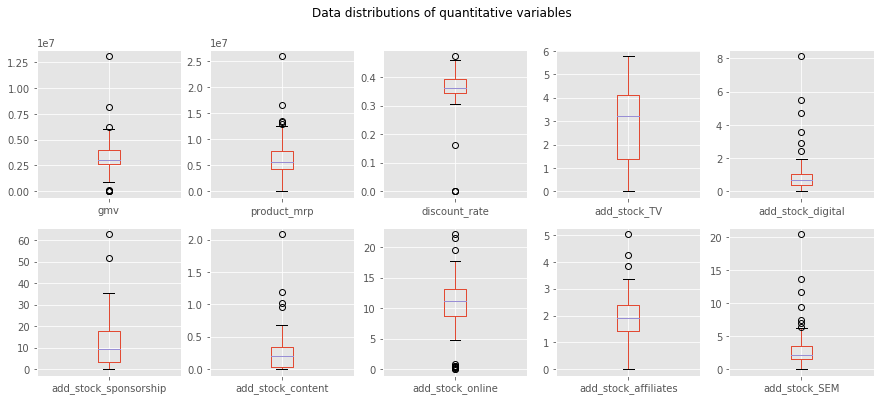

In [305]:
df_combined_audio[column_list].plot(kind='box',subplots=True,layout=(2,5),
                                    sharex=False,figsize=(15,6), 
                                    title="Data distributions of quantitative variables")
plt.show()

#### Remarks: 
1. Since we handled outliers at order level, outliers do exist but not prolific.
2. A few assumptions that we took on add stocks might be influencing as outliers. 
3. We have only 53 data points and we dont have the leverage to remove some as outliers anymore.
4. So, let us go ahead with the data at hand

####  Scatter Plots (Bivariate Relationship among continuous data) 

<Figure size 720x720 with 0 Axes>

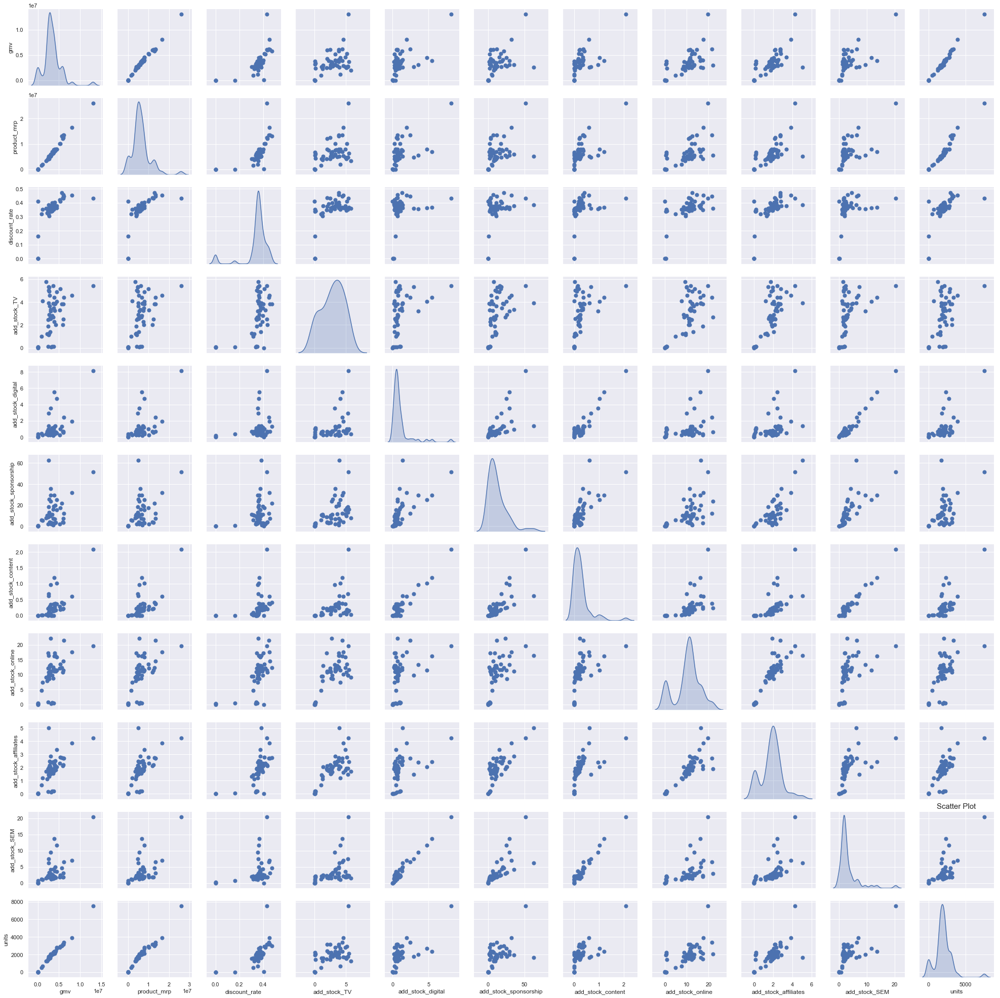

In [306]:
# Draw scatter plot
plt.figure(figsize=(10,10))
sns.set(style="darkgrid")
ax=sns.pairplot(df_combined_audio[column_list+['units']],diag_kind ='kde',
               plot_kws=dict(s=50, edgecolor="b", linewidth=1),diag_kws=dict(shade=True))

plt.title('Scatter Plot',   fontsize=15)
#ax.set_xticklabels(ax.(), rotation=65, ha="right",weight="bold",fontsize=15)


plt.show()

#### Remarks:
1. All add stocks have some linear relationship with number of units sold. `Add stocks are collinear to units sold`
2. GMV has linearity with `discount`, `units` and `MRP`. 
3. We can understand GMV linearity with `units` because that has a direct relationship.
4. GMV has linear relationship with add stocks from TV, content, online and affiliates mainly
5. With in add stocks, a few collinearities exist.

We will study them while looking at correlation heat map. It is easy to figure out relationships there

####  Heat-Map (Bivariate Relationship among continuous data) 
1. While doing this, we ignored weather components as they are not continuous values.

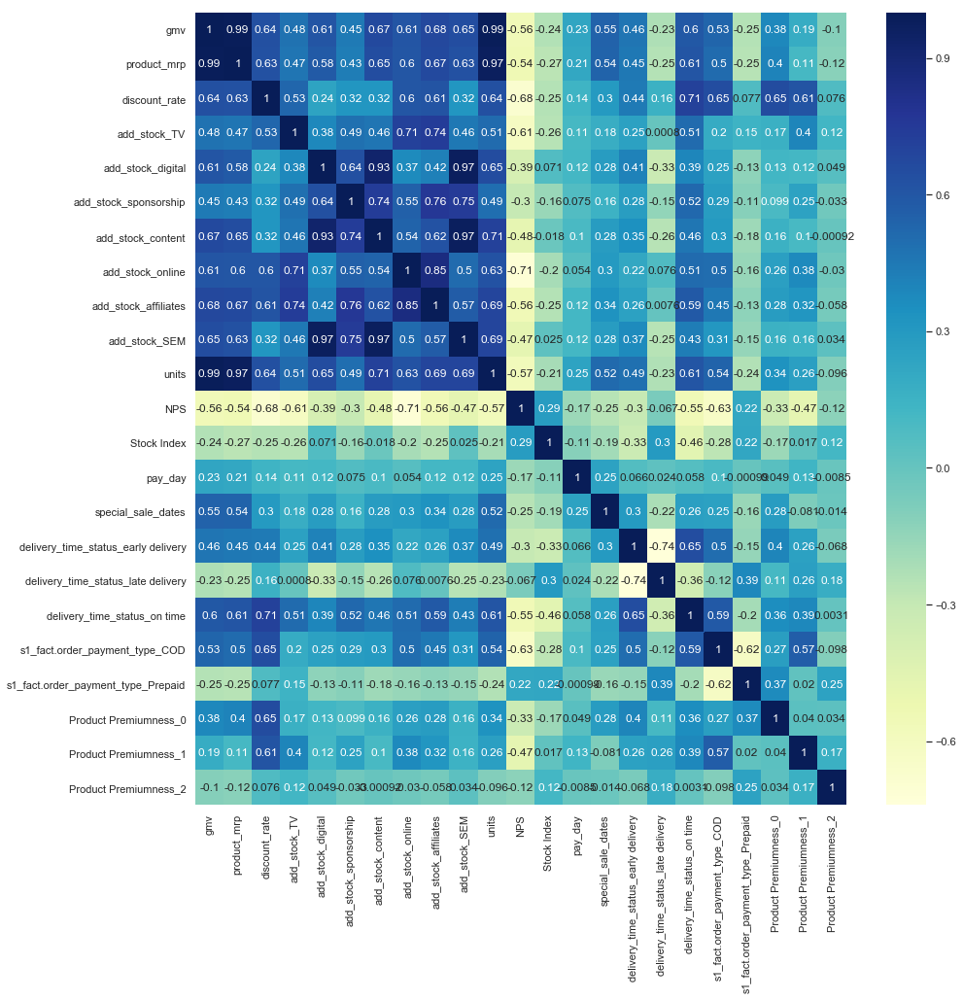

In [307]:
# Check correlation heatmap
plt.figure(figsize=(15,15))
sns.heatmap(df_combined_audio[column_list+['units','NPS','Stock Index','pay_day','special_sale_dates',
'delivery_time_status_early delivery','delivery_time_status_late delivery', 'delivery_time_status_on time',
's1_fact.order_payment_type_COD', 's1_fact.order_payment_type_Prepaid','Product Premiumness_0', 'Product Premiumness_1',
'Product Premiumness_2']].corr(), 
            annot=True, cmap='YlGnBu')

#### Remarks: Similar to scatter plots reflect here. Let us reiterate the findings
##### PART - 1: Correlations with GMV (Good to have)
1. It is evident that from `gmv` to `units`, features are highly correlated. 
2. `Ontime Delivery` is highly correlated with GMV
3. `All Product Premiumness features` are less correlated wit GMV
4. `Ontime delivery` and `Sale Day` are highly correlated with GMV
5. `Add Stocks` have good correlation with GMV

##### PART - 2: Correlations among features (Multi-collinearity)
1. `Discount Rate` is correlated to `add stocks` and delivery status and product premiumness
2. `Units` has high correlation with `Discount rate`, `MRP` as well as `Add Stocks`

Let us see how we can leverage the correlation knowledge, P-Values and VIF to choose features wisely. `Business intuition is extremely important consideration in MMM to keep in mind. Some decissions will be taken ignoring the math rules associated to understand business`

### Modeling
1. The present work is a tiresomely repetititve process since we have to compute 15 Linear regression models in total
2. To avoid redundancy in work, we created 4 re usable functions for an end-to-end linear regression code
3. We will explain each bit of function here and then start using them in future cycles
4. The entire modeling process is divided into 4 parts
    1. Splitting and Scaling Data
    2. Feature Elimination
    3. Modeling
    4. Model Evaluation: To understand goodness of model

#### Re-Usable Codes: Methods and Details
Let us discuss the sub components in each method:
1. `split_scale_feature:` This method handles all the processing before model building starts
    1. Split the data into train and test sets
    2. Scaling the data using MinMaxScaler
    3. Splitting features and labels separately

2. `rfe_function`: Recursive feature Elimination Method used to select best features out of the lot. 
3. `statsmodel_vif`: Modeling, Computing Stats Model and VIF to analyse P-Values and Multi Collinearity
    1. Drops the choice of feature
    2. Re-Computes Stats Model
    3. Re-Computes VIF
    
4. `predictions_and_residual_analysis_and_rscore`: __This method handles entire model evaluation process__
    1. Make Train - Test predictions and saves a dataframe
    2. Residual Analysis of Errors: Wheather white Noise or Not
    3. R2 Computation
    
__Note:__ __We will keep all the methods at one place to have a look and make navigation easier. After that we just use them repeatedly__

In [308]:
# Method - 1: Processing Before Modeling
#--------------------------------------------------------
# Import statement
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler

def split_scale_feature(dataframe):
    seed = 0
    column_list = list(dataframe.columns)
    index_list  = list(dataframe.index)
    
    # Step - 1: Data Split
    dataframe_train, dataframe_test = train_test_split(dataframe, train_size=0.7, 
                                                       test_size=0.3, random_state=seed)    
    # Step - 2: Scaling Data
    scalar = MinMaxScaler()
    scalar_fit = scalar.fit(dataframe_train)
    dataframe_train = scalar_fit.transform(dataframe_train)
    dataframe_test = scalar_fit.transform(dataframe_test)
    
    # Step - 3: Final DataFrame
    dataframe_final_train = pd.DataFrame(dataframe_train, columns = column_list)
    dataframe_final_test  = pd.DataFrame(dataframe_test, columns = column_list)
    
    # Step - 4: Split into features and Labels
    train_y               = dataframe_final_train['gmv']
    train_x               = dataframe_final_train.drop('gmv', axis = 1)
        
    test_y                = dataframe_final_test['gmv']
    test_x                = dataframe_final_test.drop('gmv', axis = 1)
    
    # Returns Train test Data for x and y separately
    return(train_x,train_y, test_x, test_y)

In [309]:
# Method 2: Feature Elimination Method
#------------------------------------------------------------------
# Use recurssive feature elimination method to drop columns
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression

# rfe function definition
def rfe_function(X,y,variable_number):
    model      = LinearRegression()
    rfe        = RFE(model,variable_number)
    rfe_select = rfe.fit(X,y)
    dropcolumns = X.columns[~rfe_select.support_]
    X_new       = X.drop(dropcolumns,1)
    # Returns a new X data frame with less features
    return(X_new)

In [310]:
# Method 3: Modeling and VIF Computation
#------------------------------------------------------------------------------
# Stats model function definition
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
def statsmodel_vif(X,y,drop_variable):
    # Step 1: Dropping the unwanted feature
    X.drop(drop_variable, axis = 1, inplace = True)
    X_column_list = list(X.columns)
    
    # 
    # Step 2: Fitting Stats Model after Adding Constant
    X_new         = sm.add_constant(X)
    stats_model   = sm.OLS(y,X_new).fit()
    summary       = stats_model.summary()
    
    # Step 3: VIF Computation
    vif = pd.DataFrame()
    vif['Features'] = X_new.columns
    vif['VIF'] = [variance_inflation_factor(X_new.values, i) for i in range(X_new.shape[1])]
    vif['VIF'] = round(vif['VIF'], 2)
    vif = vif.sort_values(by = "VIF", ascending = False)
    
    # Returns the new column list after dropping, model, summary and VIF values
    return(X_column_list, stats_model, summary, vif)



In [311]:
# Method 4: Model Evaluation Part
#---------------------------------------------------------

from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
from math import sqrt


def predictions_and_residual_analysis_and_rscore(X_train,y_train,X_test,y_test,model):
    # Step 1: train and test predictions
    # Train Data
    X_train_new = sm.add_constant(X_train)
    train_pred  = model.predict(X_train_new)
    # Test Data
    column_list = list(X_train.columns)
    X_test_new  = X_test[column_list]
    X_test_new  = sm.add_constant(X_test_new)
    test_pred   = model.predict(X_test_new)
    
    # Step 2: Make a y-Dataframe of real and predicted datasets
    y_train_real_pred = pd.DataFrame.from_dict({'y train': y_train, 'y train pred': train_pred}, orient = 'columns')
    y_test_real_pred  = pd.DataFrame.from_dict({'y test': y_test, 'y test pred': test_pred}, orient = 'columns')
    
    # Step 3: r score computation
    train_r2_score = r2_score(y_train, train_pred)
    test_r2_score  = r2_score(y_test, test_pred)
    r2_dataframe   = pd.DataFrame.from_dict({'train r score': train_r2_score, 'test r score': test_r2_score}, 
                                            orient = 'index')
    
    # Step 4: Plot of Errors
    plt.figure(figsize=(15,5))
    
    plt.subplot(1,2,1)
    sns.distplot((y_train - train_pred), bins = 10)
    plt.ylabel('Errors Train', fontsize = 10)                         # X-label
    
    plt.subplot(1,2,2)
    sns.distplot((y_test - test_pred), bins = 10)
    plt.ylabel('Errors Test', fontsize = 10)       
    plt.show()
    
    # Step 5: Heat Map
    # Figure size
    plt.figure(figsize=(8,5))

    # Step 6: Heatmap
    sns.heatmap(X_train[column_list].corr(), cmap="YlGnBu", annot=True)
    plt.show()
    
    # Step 7: rmse
    rmse_train = sqrt(mean_squared_error(y_train, train_pred))
    rmse_test  = sqrt(mean_squared_error(y_test, test_pred))
    rmse_dataframe = pd.DataFrame.from_dict({'rmse_train': rmse_train, 'rmse_test': rmse_test}, 
                                            orient = 'index')


    
    

    return(y_train_real_pred, y_test_real_pred, r2_dataframe,rmse_dataframe)

#### Train-Test Split and Scaling

In [312]:
X_train,y_train,X_test,y_test = split_scale_feature(df_combined_audio)

In [313]:
X_train.shape

(37, 31)

### Model 1: Simple Linear Regression Model 
####  Recursive Feature Elimination

In [314]:
X_train_iter0 = rfe_function(X_train,y_train,28)

#### Model Evaluation using StatsModel 

In [315]:
# Results of stats model iteration - 1
X_train_column_list, model_iter1, summary, VIF = statsmodel_vif(X_train_iter0,y_train,[])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.997
Method:                 Least Squares   F-statistic:                     513.4
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.44e-12
Time:                        18:26:07   Log-Likelihood:                 143.58
No. Observations:                  37   AIC:                            -233.2
Df Residuals:                      10   BIC:                            -189.7
Df Model:                          26                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
18,Total Precip (mm),inf
17,Total Snow (cm),inf
6,delivery_time_status_early delivery,inf
7,delivery_time_status_late delivery,inf
8,delivery_time_status_on time,inf
9,s1_fact.order_payment_type_COD,inf
10,s1_fact.order_payment_type_Prepaid,inf
16,Total Rain (mm),inf
11,Product Premiumness_0,1536382.81000
12,Product Premiumness_1,1437281.60000


#### Remarks: 
1. Let us start with removing Weather Data with HIgh VIF
2. `Total Precip (mm)` has both high P-Value as well as VIF.
3. Let us drop `Total Precip (mm)`

In [316]:
# Results of stats model iteration - 2
X_train_column_list, model_iter2, summary, VIF = statsmodel_vif(X_train_iter0,y_train,['Total Precip (mm)'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.997
Method:                 Least Squares   F-statistic:                     513.4
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.44e-12
Time:                        18:26:10   Log-Likelihood:                 143.58
No. Observations:                  37   AIC:                            -233.2
Df Residuals:                      10   BIC:                            -189.7
Df Model:                          26                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
6,delivery_time_status_early delivery,inf
7,delivery_time_status_late delivery,inf
8,delivery_time_status_on time,inf
9,s1_fact.order_payment_type_COD,inf
10,s1_fact.order_payment_type_Prepaid,inf
11,Product Premiumness_0,1536382.81000
12,Product Premiumness_1,1437281.60000
1,units,765.86000
2,product_mrp,750.53000
27,add_stock_SEM,643.38000


#### Remarks: 
1. Dropping `Total Precip (mm)` actually helped reduce collinearity in weather features from infinity to less
2. We will re-visit weather again later.
3. Let us see what we can do with `order payment type`. Let us list what do we know about them.
    1. `Payment Type Prepaid` is very less correlated to GMV. We can say effect will be insignificant.
    2. VIF is infinity too
    3. `Payment type COD` has high collinearity with others but we will deal with it later.
4. Let us drop `s1_fact.order_payment_type_Prepaid`

In [317]:
# Results of stats model iteration - 3
X_train_column_list, model_iter3, summary, VIF = statsmodel_vif(X_train_iter0,y_train,
                                                                ['s1_fact.order_payment_type_Prepaid'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.997
Method:                 Least Squares   F-statistic:                     513.4
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.44e-12
Time:                        18:26:13   Log-Likelihood:                 143.58
No. Observations:                  37   AIC:                            -233.2
Df Residuals:                      10   BIC:                            -189.7
Df Model:                          26                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
6,delivery_time_status_early delivery,5045699.95000
7,delivery_time_status_late delivery,4728542.84000
10,Product Premiumness_0,1536382.81000
11,Product Premiumness_1,1437281.60000
8,delivery_time_status_on time,39263.53000
1,units,765.86000
2,product_mrp,750.53000
26,add_stock_SEM,643.38000
21,add_stock_digital,361.31000
0,const,233.39000


#### Remarks:
1. `Late Delivery` has very less correlation with `gmv`
2. It also has high VIF
3. So let us drop `delivery_time_status_late delivery`


In [318]:
# Results of stats model iteration - 4
X_train_column_list, model_iter4, summary, VIF = statsmodel_vif(X_train_iter0,y_train,
                                                                ['delivery_time_status_late delivery'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.996
Method:                 Least Squares   F-statistic:                     364.2
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           7.93e-13
Time:                        18:26:16   Log-Likelihood:                 134.75
No. Observations:                  37   AIC:                            -217.5
Df Residuals:                      11   BIC:                            -175.6
Df Model:                          25                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
25,add_stock_SEM,640.83000
2,product_mrp,621.16000
1,units,609.38000
20,add_stock_digital,361.11000
0,const,229.14000
22,add_stock_content,123.13000
24,add_stock_affiliates,116.52000
10,Product Premiumness_1,79.98000
12,Max Temp (°C),61.52000
13,Min Temp (°C),36.58000


#### Remarks:
1. `add_stock_SEM` has more correlation with GMV but with other add stocks too
2. `add_stock_SEM` has high P-Value
3. Though it has less VIF, it has significantly less impact on GMV to others.
4. So we chose to drop `add_stock_SEM`

In [319]:
# Results of stats model iteration - 5
X_train_column_list, model_iter5, summary, VIF = statsmodel_vif(X_train_iter0,y_train,['add_stock_SEM'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.996
Method:                 Least Squares   F-statistic:                     413.8
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           3.78e-14
Time:                        18:26:18   Log-Likelihood:                 134.74
No. Observations:                  37   AIC:                            -219.5
Df Residuals:                      12   BIC:                            -179.2
Df Model:                          24                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
2,product_mrp,616.82000
1,units,600.77000
0,const,169.52000
22,add_stock_content,84.83000
10,Product Premiumness_1,79.91000
24,add_stock_affiliates,60.55000
20,add_stock_digital,59.79000
12,Max Temp (°C),59.48000
13,Min Temp (°C),36.46000
5,discount_rate,32.29000


#### Remarks:
1. `Product MRP`, `Discount Rate`, `GMV` and `Units` are highly correlated with each other. 
2. Since Product MRP does not directly associate with GMV than others
3. Let us drop `product_mrp`

In [320]:
# Results of stats model iteration - 6
X_train_column_list, model_iter6, summary, VIF = statsmodel_vif(X_train_iter0,y_train,['product_mrp'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.998
Model:                            OLS   Adj. R-squared:                  0.995
Method:                 Least Squares   F-statistic:                     291.5
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           3.63e-14
Time:                        18:26:20   Log-Likelihood:                 126.01
No. Observations:                  37   AIC:                            -204.0
Df Residuals:                      13   BIC:                            -165.4
Df Model:                          23                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
0,const,168.51000
23,add_stock_affiliates,58.38000
11,Max Temp (°C),53.30000
21,add_stock_content,52.77000
19,add_stock_digital,48.02000
12,Min Temp (°C),35.13000
20,add_stock_sponsorship,29.19000
4,discount_rate,20.13000
18,add_stock_TV,14.67000
7,s1_fact.order_payment_type_COD,10.08000


#### Remarks:
1. We are going through the second iteration of dropping one column from each set of features
2. `Min Temp (°C)` has high VIF as well as high P-Value
3. Let us drop `Min Temp (°C)`
4. So far, it is good to note that there is `no significant drop in R Score` by sropping variables 

In [321]:
# Results of stats model iteration - 7
X_train_column_list, model_iter7, summary, VIF = statsmodel_vif(X_train_iter0,y_train,['Min Temp (°C)'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.998
Model:                            OLS   Adj. R-squared:                  0.995
Method:                 Least Squares   F-statistic:                     309.5
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           2.92e-15
Time:                        18:26:22   Log-Likelihood:                 124.93
No. Observations:                  37   AIC:                            -203.9
Df Residuals:                      14   BIC:                            -166.8
Df Model:                          22                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
0,const,164.25000
22,add_stock_affiliates,57.27000
20,add_stock_content,50.18000
18,add_stock_digital,43.49000
19,add_stock_sponsorship,29.18000
4,discount_rate,19.06000
17,add_stock_TV,14.10000
7,s1_fact.order_payment_type_COD,9.80000
9,Product Premiumness_1,8.66000
15,NPS,8.28000


#### Remarks:
1. `add_stock_affiliates` has high P Value and VIF
2. It has high correlation with `add_stock_content` which is understandable
3. Though it has good correlation with GMV, 
4. Since we have content add stock so far, we are dropping `add_stock_affiliates`

In [322]:
# Results of stats model iteration - 8
X_train_column_list, model_iter8, summary, VIF = statsmodel_vif(X_train_iter0,y_train,['add_stock_affiliates'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.998
Model:                            OLS   Adj. R-squared:                  0.995
Method:                 Least Squares   F-statistic:                     346.3
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.56e-16
Time:                        18:26:25   Log-Likelihood:                 124.87
No. Observations:                  37   AIC:                            -205.7
Df Residuals:                      15   BIC:                            -170.3
Df Model:                          21                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
0,const,152.03000
20,add_stock_content,42.75000
18,add_stock_digital,30.04000
4,discount_rate,18.18000
19,add_stock_sponsorship,12.54000
17,add_stock_TV,9.48000
9,Product Premiumness_1,7.93000
6,delivery_time_status_on time,7.85000
7,s1_fact.order_payment_type_COD,7.78000
15,NPS,7.75000


#### Remarks:
1. `Total Snow (cm)` has high P-Value.
2. So for now, let us just drop `Total Snow (cm)`

In [323]:
# Results of stats model iteration - 9
X_train_column_list, model_iter9, summary, VIF = statsmodel_vif(X_train_iter0,y_train,['Total Snow (cm)'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.998
Model:                            OLS   Adj. R-squared:                  0.995
Method:                 Least Squares   F-statistic:                     386.6
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           7.92e-18
Time:                        18:26:27   Log-Likelihood:                 124.81
No. Observations:                  37   AIC:                            -207.6
Df Residuals:                      16   BIC:                            -173.8
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
0,const,146.56000
19,add_stock_content,42.54000
17,add_stock_digital,29.78000
4,discount_rate,16.55000
18,add_stock_sponsorship,10.92000
16,add_stock_TV,8.52000
9,Product Premiumness_1,7.80000
14,NPS,7.69000
1,units,7.37000
11,Max Temp (°C),7.18000


#### Remarks:
1. Next top 3 features `add stocks`, `discount rate`
2. `Discount rate` is business wise a good feature
3. Having discount rate on board explains the relationship between offers and GMV which is intuitive too
4. We will find an add stock that is highly correlated to discount also with high VIF or P-Value and will drop it.
5. One such add stock is `add_stock_content`
6. Let us drop `add_stock_content`

In [324]:
# Results of stats model iteration - 10
X_train_column_list, model_iter10, summary, VIF = statsmodel_vif(X_train_iter0,y_train,['add_stock_content'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.998
Model:                            OLS   Adj. R-squared:                  0.995
Method:                 Least Squares   F-statistic:                     363.0
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.63e-18
Time:                        18:26:29   Log-Likelihood:                 121.58
No. Observations:                  37   AIC:                            -203.2
Df Residuals:                      17   BIC:                            -170.9
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
0,const,122.14000
4,discount_rate,16.25000
9,Product Premiumness_1,7.76000
14,NPS,7.20000
16,add_stock_TV,7.17000
1,units,6.65000
7,s1_fact.order_payment_type_COD,6.28000
19,add_stock_online,6.26000
17,add_stock_digital,6.25000
8,Product Premiumness_0,5.82000


#### Remarks:
1. Let us try one more time to save `discount rate`
2. `Product Premiumness` is highly correlated to `discount` but insignificant with GMV
3. Let us drop `Product Premiumness_0` and see if `discount_rate has an impact` over it

In [325]:
# Results of stats model iteration - 11
X_train_column_list, model_iter11, summary, VIF = statsmodel_vif(X_train_iter0,y_train,['Product Premiumness_0'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.998
Model:                            OLS   Adj. R-squared:                  0.995
Method:                 Least Squares   F-statistic:                     402.3
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           8.46e-20
Time:                        18:26:31   Log-Likelihood:                 121.42
No. Observations:                  37   AIC:                            -204.8
Df Residuals:                      18   BIC:                            -174.2
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
0,const,120.52000
13,NPS,7.19000
15,add_stock_TV,7.00000
1,units,6.53000
7,s1_fact.order_payment_type_COD,6.28000
18,add_stock_online,6.25000
16,add_stock_digital,6.19000
17,add_stock_sponsorship,5.47000
10,Max Temp (°C),5.12000
8,Product Premiumness_1,4.52000


#### Remarks:
1. Dropping Discount rate has no substantial impact on R2 which is a good thing
1. Let us drop `Total Rain (mm)` for having high PValue

In [326]:
# Results of stats model iteration - 12
X_train_column_list, model_iter12, summary, VIF = statsmodel_vif(X_train_iter0,y_train,['Total Rain (mm)'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.998
Model:                            OLS   Adj. R-squared:                  0.995
Method:                 Least Squares   F-statistic:                     449.3
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           3.90e-21
Time:                        18:26:34   Log-Likelihood:                 121.41
No. Observations:                  37   AIC:                            -206.8
Df Residuals:                      19   BIC:                            -177.8
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
0,const,119.45000
14,add_stock_TV,6.44000
17,add_stock_online,6.25000
12,NPS,6.24000
1,units,6.23000
15,add_stock_digital,5.85000
7,s1_fact.order_payment_type_COD,5.62000
16,add_stock_sponsorship,5.46000
10,Max Temp (°C),5.04000
8,Product Premiumness_1,4.43000


#### Remarks:
1. Since VIF has been controlled largely.
2. Let us focus on dropping features with high P-Value
3. `NPS` has the highest P-Value

In [327]:
# Results of stats model iteration - 13
X_train_column_list, model_iter13, summary, VIF = statsmodel_vif(X_train_iter0,y_train,['NPS'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.997
Model:                            OLS   Adj. R-squared:                  0.995
Method:                 Least Squares   F-statistic:                     493.7
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           2.02e-22
Time:                        18:26:36   Log-Likelihood:                 121.08
No. Observations:                  37   AIC:                            -208.2
Df Residuals:                      20   BIC:                            -180.8
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
0,const,81.13000
13,add_stock_TV,6.39000
1,units,5.84000
16,add_stock_online,4.87000
10,Max Temp (°C),4.74000
7,s1_fact.order_payment_type_COD,4.52000
8,Product Premiumness_1,4.41000
15,add_stock_sponsorship,4.26000
14,add_stock_digital,4.22000
4,discount_rate,4.00000


#### Remarks:
1. One thing to note is `dropping NPS` has a good effect on `constant` VIF
1. Next highest P-Value with a different feature set is `delivery_time_status_on time`
2. Let us drop `delivery_time_status_on time`

In [328]:
# Results of stats model iteration - 14
X_train_column_list, model_iter14, summary, VIF = statsmodel_vif(X_train_iter0,y_train,['delivery_time_status_on time'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.997
Model:                            OLS   Adj. R-squared:                  0.995
Method:                 Least Squares   F-statistic:                     503.4
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           2.23e-23
Time:                        18:26:38   Log-Likelihood:                 119.35
No. Observations:                  37   AIC:                            -206.7
Df Residuals:                      21   BIC:                            -180.9
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
0,const,81.03000
12,add_stock_TV,6.32000
1,units,5.80000
9,Max Temp (°C),4.73000
15,add_stock_online,4.73000
6,s1_fact.order_payment_type_COD,4.52000
7,Product Premiumness_1,4.41000
13,add_stock_digital,4.21000
14,add_stock_sponsorship,3.80000
4,discount_rate,3.11000


#### Remarks:
1. With dropping features with high P-Value, constant is having substantial effect
2. Let us drop `Snow on Grnd (cm)` with high P-Value

In [329]:
# Results of stats model iteration - 15
X_train_column_list, model_iter15, summary, VIF = statsmodel_vif(X_train_iter0,y_train,['Snow on Grnd (cm)'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.997
Model:                            OLS   Adj. R-squared:                  0.995
Method:                 Least Squares   F-statistic:                     558.0
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.04e-24
Time:                        18:26:41   Log-Likelihood:                 119.12
No. Observations:                  37   AIC:                            -208.2
Df Residuals:                      22   BIC:                            -184.1
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
0,const,79.73000
11,add_stock_TV,6.25000
1,units,5.74000
9,Max Temp (°C),4.64000
6,s1_fact.order_payment_type_COD,4.52000
7,Product Premiumness_1,4.34000
12,add_stock_digital,4.20000
14,add_stock_online,4.12000
13,add_stock_sponsorship,3.62000
4,discount_rate,3.10000


#### Remarks:
1. Let us select whole set of new features to drop
2. We will drop an add stock to observe the impact on P-Values
3. Let us drop `add_stock_sponsorship`

In [330]:
# Results of stats model iteration - 16
X_train_column_list, model_iter16, summary, VIF = statsmodel_vif(X_train_iter0,y_train,['add_stock_sponsorship'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.997
Model:                            OLS   Adj. R-squared:                  0.996
Method:                 Least Squares   F-statistic:                     625.0
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           4.29e-26
Time:                        18:26:43   Log-Likelihood:                 119.03
No. Observations:                  37   AIC:                            -210.1
Df Residuals:                      23   BIC:                            -187.5
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
0,const,64.66000
1,units,5.65000
11,add_stock_TV,5.33000
6,s1_fact.order_payment_type_COD,4.51000
7,Product Premiumness_1,4.34000
12,add_stock_digital,4.05000
13,add_stock_online,3.86000
4,discount_rate,3.09000
9,Max Temp (°C),2.92000
5,delivery_time_status_early delivery,2.03000


#### Remarks:
1. Let us drop `Stock Index`
2. Dropping `Stock Index` should have a substantial impact on `constant` assuming that `stock index` is almost constant
3. Let us see if our assumptions are right

In [331]:
# Results of stats model iteration - 17
X_train_column_list, model_iter17, summary, VIF = statsmodel_vif(X_train_iter0,y_train,['Stock Index'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.997
Model:                            OLS   Adj. R-squared:                  0.996
Method:                 Least Squares   F-statistic:                     672.0
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           2.84e-27
Time:                        18:26:45   Log-Likelihood:                 118.10
No. Observations:                  37   AIC:                            -210.2
Df Residuals:                      24   BIC:                            -189.3
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
0,const,47.52000
1,units,5.62000
10,add_stock_TV,4.86000
6,s1_fact.order_payment_type_COD,4.21000
7,Product Premiumness_1,3.88000
12,add_stock_online,3.83000
11,add_stock_digital,3.60000
4,discount_rate,3.07000
9,Max Temp (°C),2.87000
3,special_sale_dates,1.87000


#### Remarks
1. To change the feature set, let us drop `add_stock_TV` which has increasing P-Value with each iteration

In [332]:
# Results of stats model iteration - 18
X_train_column_list, model_iter18, summary, VIF = statsmodel_vif(X_train_iter0,y_train,['add_stock_TV'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.997
Model:                            OLS   Adj. R-squared:                  0.996
Method:                 Least Squares   F-statistic:                     762.8
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.01e-28
Time:                        18:26:48   Log-Likelihood:                 118.08
No. Observations:                  37   AIC:                            -212.2
Df Residuals:                      25   BIC:                            -192.8
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
0,const,40.02000
1,units,5.61000
6,s1_fact.order_payment_type_COD,3.77000
7,Product Premiumness_1,3.50000
10,add_stock_digital,3.33000
4,discount_rate,3.07000
11,add_stock_online,2.47000
9,Max Temp (°C),1.97000
3,special_sale_dates,1.86000
5,delivery_time_status_early delivery,1.86000


#### Remarks
1. `add_stock_online` has an increasing P-Value
2. Let us drop `add_stock_online`

In [333]:
# Results of stats model iteration - 19
X_train_column_list, model_iter19, summary, VIF = statsmodel_vif(X_train_iter0,y_train,['add_stock_online'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.997
Model:                            OLS   Adj. R-squared:                  0.996
Method:                 Least Squares   F-statistic:                     838.8
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           5.51e-30
Time:                        18:26:50   Log-Likelihood:                 117.35
No. Observations:                  37   AIC:                            -212.7
Df Residuals:                      26   BIC:                            -195.0
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
0,const,38.69000
1,units,5.50000
6,s1_fact.order_payment_type_COD,3.76000
7,Product Premiumness_1,3.36000
10,add_stock_digital,3.25000
4,discount_rate,2.99000
9,Max Temp (°C),1.83000
5,delivery_time_status_early delivery,1.77000
3,special_sale_dates,1.76000
8,Product Premiumness_2,1.65000


#### Remarks
1. `special_sale_dates` has consistently high correlation
2. Let us drop `special_sale_dates` though it looks like a promising feature at the start

In [334]:
# Results of stats model iteration - 20
X_train_column_list, model_iter20, summary, VIF = statsmodel_vif(X_train_iter0,y_train,['special_sale_dates'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.997
Model:                            OLS   Adj. R-squared:                  0.996
Method:                 Least Squares   F-statistic:                     949.1
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           2.22e-31
Time:                        18:26:52   Log-Likelihood:                 116.99
No. Observations:                  37   AIC:                            -214.0
Df Residuals:                      27   BIC:                            -197.9
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
0,const,38.40000
1,units,4.71000
5,s1_fact.order_payment_type_COD,3.55000
9,add_stock_digital,3.11000
3,discount_rate,2.98000
6,Product Premiumness_1,2.74000
8,Max Temp (°C),1.79000
4,delivery_time_status_early delivery,1.75000
7,Product Premiumness_2,1.53000
2,pay_day,1.15000


#### Remarks
1. Let us drop `Max Temp (°C)` due to increase in P Value

In [335]:
# Results of stats model iteration - 21
X_train_column_list, model_iter21, summary, VIF = statsmodel_vif(X_train_iter0,y_train,['Max Temp (°C)'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.997
Model:                            OLS   Adj. R-squared:                  0.996
Method:                 Least Squares   F-statistic:                     1002.
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           2.59e-32
Time:                        18:26:55   Log-Likelihood:                 115.15
No. Observations:                  37   AIC:                            -212.3
Df Residuals:                      28   BIC:                            -197.8
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
0,const,15.45000
1,units,4.29000
5,s1_fact.order_payment_type_COD,3.54000
3,discount_rate,2.88000
8,add_stock_digital,2.72000
6,Product Premiumness_1,2.69000
7,Product Premiumness_2,1.51000
4,delivery_time_status_early delivery,1.44000
2,pay_day,1.12000


#### Remarks
1. Let us drop `pay_day` due to increase in P Value

In [336]:
# Results of stats model iteration - 22
X_train_column_list, model_iter22, summary, VIF = statsmodel_vif(X_train_iter0,y_train,['pay_day'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.996
Model:                            OLS   Adj. R-squared:                  0.996
Method:                 Least Squares   F-statistic:                     1141.
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.25e-33
Time:                        18:26:57   Log-Likelihood:                 114.44
No. Observations:                  37   AIC:                            -212.9
Df Residuals:                      29   BIC:                            -200.0
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
0,const,15.42000
1,units,4.13000
4,s1_fact.order_payment_type_COD,3.51000
2,discount_rate,2.82000
7,add_stock_digital,2.71000
5,Product Premiumness_1,2.69000
6,Product Premiumness_2,1.50000
3,delivery_time_status_early delivery,1.44000


#### Remarks
1. Let us drop `delivery_time_status_early delivery` due to increase in P Value

In [337]:
# Results of stats model iteration - 23
X_train_column_list, model_iter23, summary, VIF = statsmodel_vif(X_train_iter0,y_train,['delivery_time_status_early delivery'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.996
Model:                            OLS   Adj. R-squared:                  0.995
Method:                 Least Squares   F-statistic:                     1318.
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           6.22e-35
Time:                        18:27:00   Log-Likelihood:                 113.62
No. Observations:                  37   AIC:                            -213.2
Df Residuals:                      30   BIC:                            -202.0
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

,Features,VIF
0,const,15.11000
1,units,4.13000
3,s1_fact.order_payment_type_COD,3.50000
2,discount_rate,2.70000
4,Product Premiumness_1,2.68000
6,add_stock_digital,2.53000
5,Product Premiumness_2,1.46000


#### Remarks
1. P-Value is < 0.05 for almost all features except constant
2. P Value signifies the importance of feature in the model
3. `<0.05` signifies 95% confidance of feature importance
4. In our case, we have very less data as small as 37 points to model the data
5. For this reason, we can slightly loosen the P-Value limits.
6. `So, we feel any P-Value less than 0.075 is a decent bet`. We assume with more data, that P-Value can be controlled to < 0.05.
7. So let us stop modeling here

__Important:__ __We successfully maintained the R Square and Adjusted R Square Scores__

#### Residual Analysis of Train Test Data

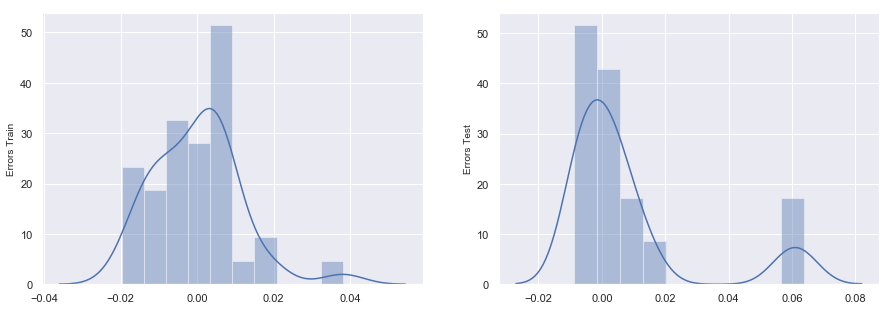

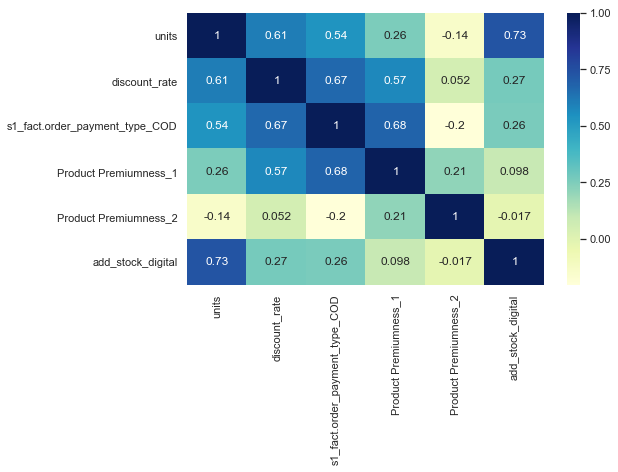

                    0
train r score 0.99622
test r score  0.95605
                 0
rmse_train 0.01122
rmse_test  0.02253


In [338]:
y_train_real_pred, y_test_real_pred, r2_dataframe, rmse_dataframe = predictions_and_residual_analysis_and_rscore(X_train_iter0, 
                                                                                                 y_train,
                                                                                                 X_test,
                                                                                                 y_test,
                                                                                                 model_iter23)
print(r2_dataframe)
print(rmse_dataframe)

### Train Test R Squared Scores show that model is good and efficient 

### Elasticity of  `GMV` (Revenue)
As per economics, elasticity is the measure of how sensitive dependent variable (in our case, revenue) is to a particular independent variable.

<h3><center> $Elasticity_{gmv} = \frac{\frac{\delta{GMV}}{GMV}}{\frac{\delta{feature}}{feature}} $</centre> </h3>


while plotting elasticity, we will know,
1. Whether GMV is directly or indirectly propostional to a particular feature
2. How varying the dependency is?
3. Where exactly the dependency is? and such



Let us look at the elasticity of revenue with our predictors

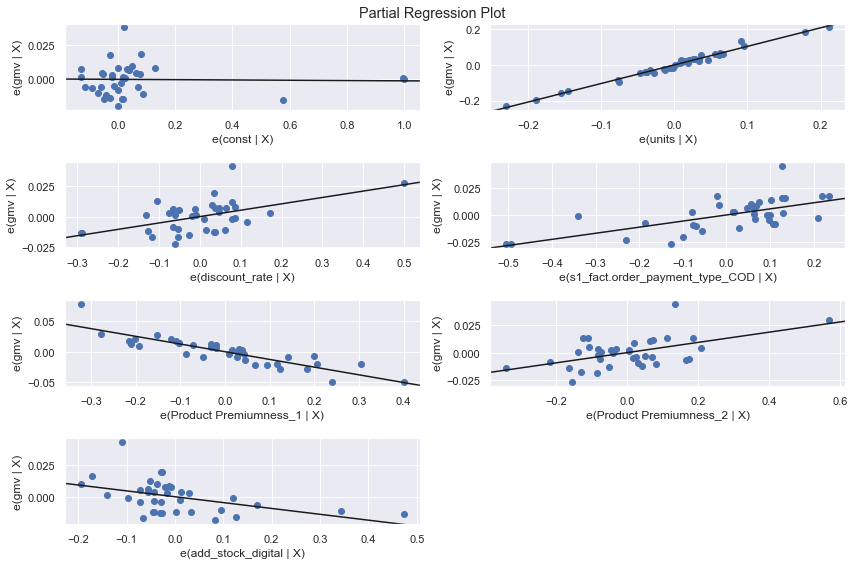

In [339]:
fig = plt.figure(figsize=(12,8))
fig = sm.graphics.plot_partregress_grid(model_iter23, fig=fig)

### Remarks:
It is evident that,
1. Units have a positive and continuous inpact on the gmv
2. Product Premiumness 2 and discount rate have positive impact but only in the mid range GMV only
3. Product premiumness 1 has negative impact but continuous on gmv
4. COD is linearly effecting GMV but highly varying
5. Surprisingly, digital add stock has a negative impact

### Model 2: Multiplicative Model - Audio

In [340]:
from numpy import inf
def log_transformation(dataframe):
    # Step 1: Log Traansform
    df_log = np.log(dataframe)
    # Step 2: Replace inf and -inf with 0
    df_log.replace({inf:0, -inf:0}, inplace = True)
    df_log.fillna(0,inplace = True)
    return(df_log)

In [341]:
# Audio data log transformation
df_audio_log = log_transformation(df_combined_audio)

In [342]:
# Our dataframe is df_combined_audio
df_audio_log.head()

,gmv,units,product_mrp,pay_day,special_sale_dates,discount_rate,delivery_time_status_early delivery,delivery_time_status_late delivery,delivery_time_status_on time,s1_fact.order_payment_type_COD,...,Snow on Grnd (cm),NPS,Stock Index,add_stock_TV,add_stock_digital,add_stock_sponsorship,add_stock_content,add_stock_online,add_stock_affiliates,add_stock_SEM
week_number,,,,,,,,,,,,,,,,,,,,,
1,11.22456,3.52636,11.85841,0.00000,0.00000,-0.89581,3.38139,4.16985,1.77196,1.07881,...,0.00000,4.00003,7.07072,-6.68548,-4.22049,-3.14649,-12.12711,-4.86677,-5.75274,-3.53573
2,14.98423,7.56631,15.52696,0.00000,0.00000,-1.08109,4.41318,2.57869,1.45598,4.34024,...,0.00000,4.00003,7.07072,-2.90766,-0.44656,0.62468,-8.35595,-1.09284,-1.98157,0.23796
3,15.14978,7.71646,15.72071,0.00000,0.00000,-1.04333,4.40976,2.58870,1.49008,4.34911,...,0.00000,4.00003,7.07072,-2.34022,0.02237,1.01773,-7.96289,-0.62391,-1.58852,0.70078
4,15.02920,7.64060,15.61747,0.00000,0.00000,-1.07253,4.41565,2.45020,1.73591,4.37680,...,0.00000,4.00003,7.07072,-2.17062,0.09751,1.02859,-7.95203,-0.53722,-1.57765,0.77017
5,14.69624,7.27725,15.26896,0.00000,0.00000,-1.07260,4.43748,2.31090,1.67797,4.36502,...,0.00000,4.09413,7.09506,-2.22082,-0.05231,0.81409,-8.16653,-0.24006,-1.79216,0.61455


### Univariate and Bivariate Analysis of Continuous Data
1. This analysis is typically performed for continuous features only. So we choose only a few features to do it
2. Selected features include `gmv`, `discount_rate`, `All add stocks`

####  Box Plots: To check Outliers

In [343]:
import matplotlib
column_list = ['gmv', 'product_mrp','discount_rate','add_stock_TV',
               'add_stock_digital', 'add_stock_sponsorship', 'add_stock_content',
               'add_stock_online', 'add_stock_affiliates', 'add_stock_SEM']

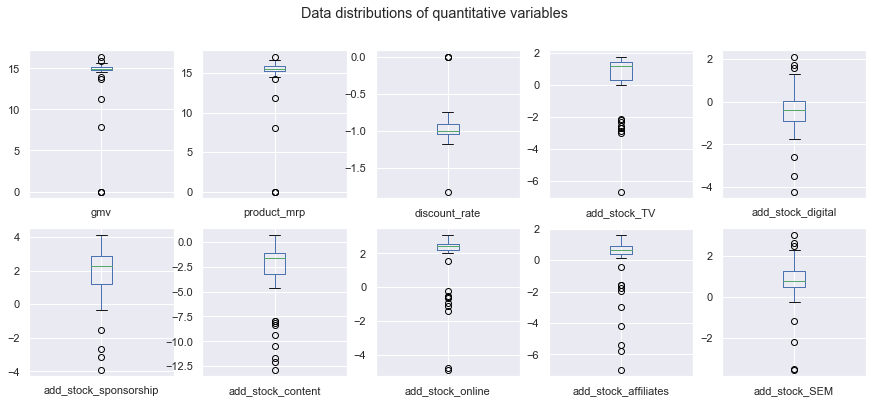

In [344]:
df_audio_log[column_list].plot(kind='box',subplots=True,layout=(2,5),
                                    sharex=False,figsize=(15,6), 
                                    title="Data distributions of quantitative variables")
plt.show()

#### Remarks: 
1. Log transformation has transformed outliers from positive percentile to negative percentile
2. Also concentration of outliers at 0 is due to the replacement of -inf value with 0

####  Scatter Plots (Bivariate Relationship among continuous data) 

<Figure size 720x720 with 0 Axes>

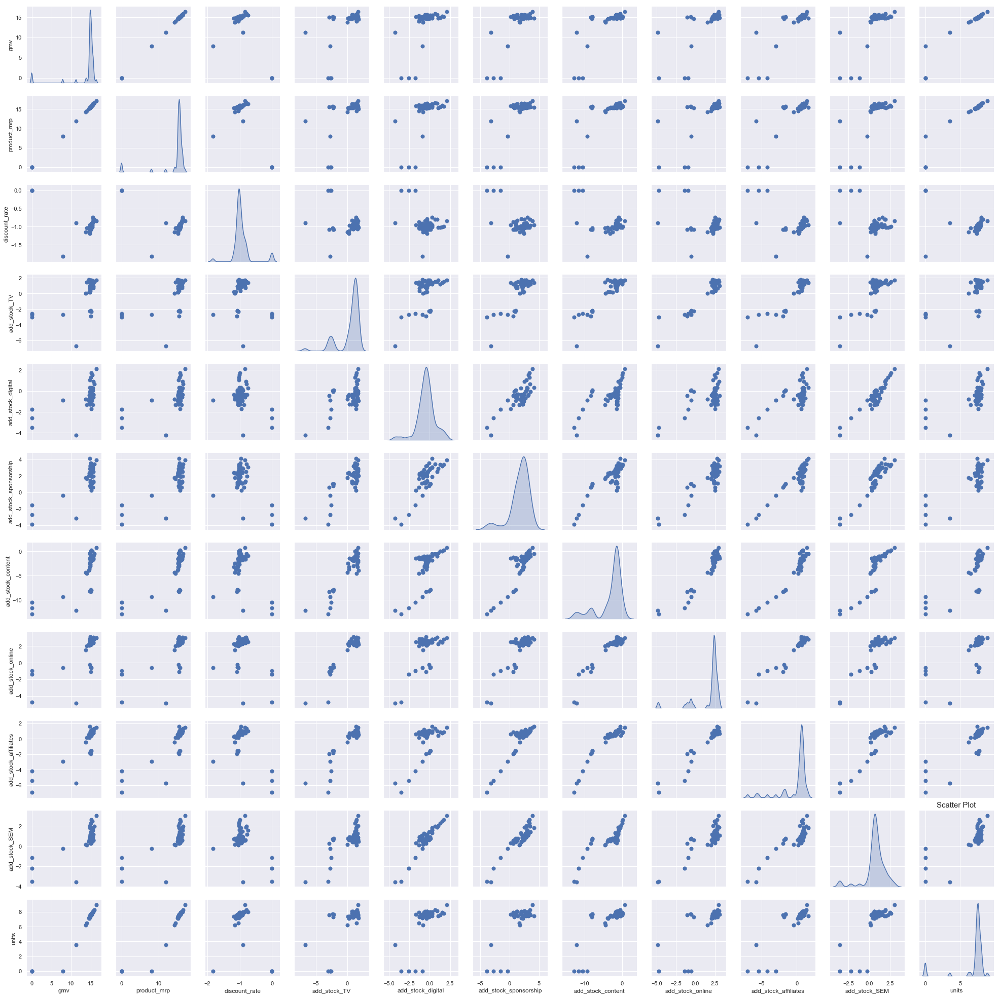

In [345]:
# Draw scatter plot
plt.figure(figsize=(10,10))
sns.set(style="darkgrid")
ax=sns.pairplot(df_audio_log[column_list+['units']],diag_kind ='kde',
               plot_kws=dict(s=50, edgecolor="b", linewidth=1),diag_kws=dict(shade=True))

plt.title('Scatter Plot',   fontsize=15)
#ax.set_xticklabels(ax.(), rotation=65, ha="right",weight="bold",fontsize=15)


plt.show()

#### Remarks:
##### PART - 1
1. Log Transformation was able to show the linearity in relationship more clearly
2. This indicates that the relation ships are exponential in nature
3. For GMV, evident linear relationship is with MRP and units as expected.

##### PART - 2
1. Log `Add Stocks` are clearly linearly related to each other
3. We can understand GMV linearity with `units` because that has a direct relationship.

We will study them while looking at correlation heat map. It is easy to figure out relationships there

####  Heat-Map (Bivariate Relationship among continuous data) 
1. While doing this, we ignored weather components as they are not continuous values.

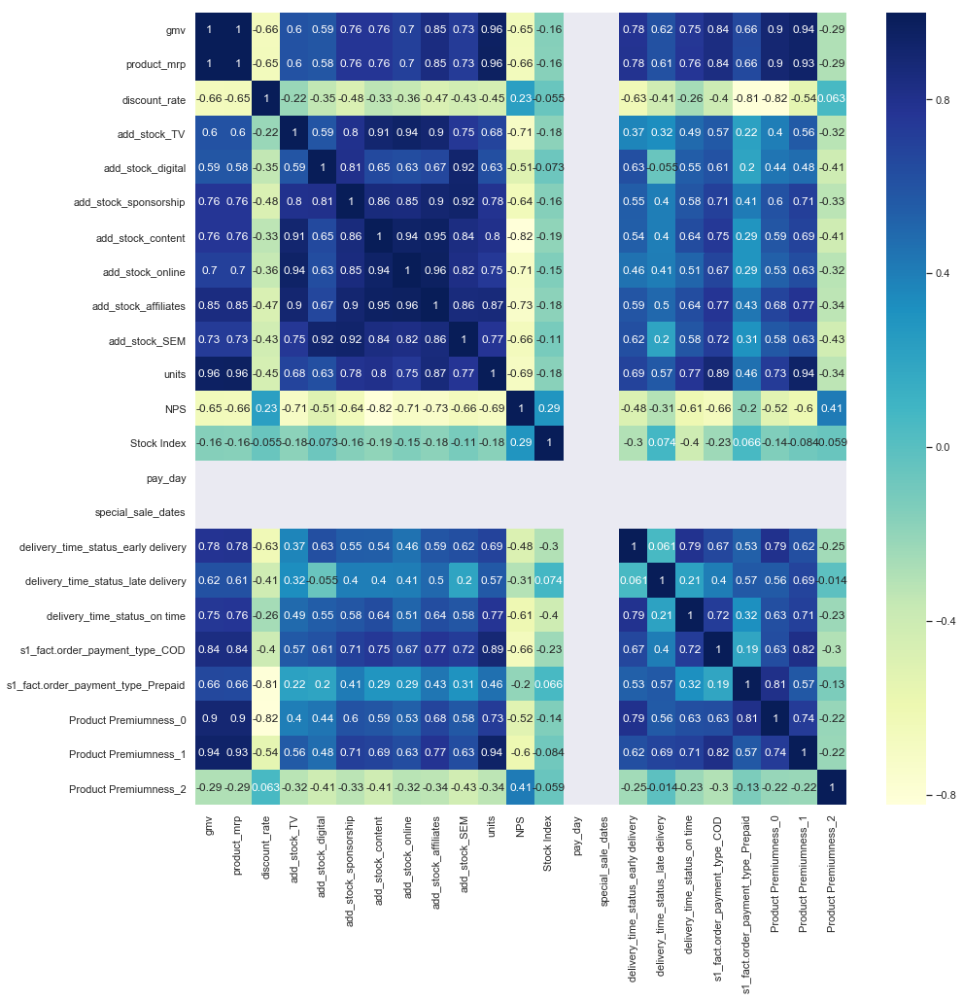

In [346]:
# Check correlation heatmap
plt.figure(figsize=(15,15))
sns.heatmap(df_audio_log[column_list+['units','NPS','Stock Index','pay_day','special_sale_dates',
'delivery_time_status_early delivery','delivery_time_status_late delivery', 'delivery_time_status_on time',
's1_fact.order_payment_type_COD', 's1_fact.order_payment_type_Prepaid','Product Premiumness_0', 
                                      'Product Premiumness_1','Product Premiumness_2']].corr(), 
            annot=True, cmap='YlGnBu')
plt.show()

#### Remarks: Similar to scatter plots reflect here. Let us reiterate the findings
##### PART - 1: Correlations with GMV (Good to have)
1. It is evident that from `gmv` to `units`, features are highly correlated. 
2. `Ontime Delivery` is highly correlated with GMV
3. `All Product Premiumness features` are less correlated wit GMV
4. `Ontime delivery` and `Sale Day` are highly correlated with GMV
5. `Add Stocks` have good correlation with GMV

##### PART - 2: Correlations among features (Multi-collinearity)
1. `Discount Rate` is correlated to `add stocks` and delivery status and product premiumness
2. `Units` has high correlation with `Discount rate`, `MRP` as well as `Add Stocks`

##### PART - 3: Effect of log on smaller numbers
1. Clearly `Pay Day and Special Sales day` being small numerical values transformed to -inf aka 0 due to natural log transformation

Let us see how we can leverage the correlation knowledge, P-Values and VIF to choose features wisely. `Business intuition is extremely important consideration in MMM to keep in mind. Some decissions will be taken ignoring the math rules associated to understand business`

###  Modeling


####  Train-Test Split and Scaling

In [347]:
X_train_ln,y_train_ln,X_test_ln,y_test_ln = split_scale_feature(df_audio_log)

In [348]:
X_train_ln.shape

(37, 31)

####  Recursive Feature Elimination

In [349]:
X_train_ln_iter0 = rfe_function(X_train_ln,y_train_ln,28)

#### Model Evaluation using StatsModel 

In [350]:
# Results of stats model iteration - 1
X_train_column_list, model_iter1, summary, VIF = statsmodel_vif(X_train_ln_iter0,y_train,[])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.970
Model:                            OLS   Adj. R-squared:                  0.865
Method:                 Least Squares   F-statistic:                     9.254
Date:                Mon, 23 Dec 2019   Prob (F-statistic):            0.00140
Time:                        18:43:42   Log-Likelihood:                 75.332
No. Observations:                  37   AIC:                            -92.66
Df Residuals:                       8   BIC:                            -45.95
Df Model:                          28                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
2,product_mrp,22023.53000
1,units,9376.28000
0,const,9045.83000
9,Product Premiumness_0,1431.85000
18,Total Precip (mm),774.93000
16,Total Rain (mm),737.23000
7,s1_fact.order_payment_type_COD,367.12000
4,delivery_time_status_early delivery,266.89000
22,add_stock_TV,253.79000
3,discount_rate,223.63000


#### Remarks: 
1. `Special Sale Day` and `Pay Day` is absolutely 0 in logs
2. Let us remove `Special Sale Day`


In [351]:
# Results of stats model iteration - 2
X_train_column_list, model_iter2, summary, VIF = statsmodel_vif(X_train_ln_iter0,y_train_ln,['product_mrp'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 1.067e+04
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           2.12e-17
Time:                        18:43:45   Log-Likelihood:                 195.41
No. Observations:                  37   AIC:                            -334.8
Df Residuals:                       9   BIC:                            -289.7
Df Model:                          27                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
0,const,4932.78000
17,Total Precip (mm),670.43000
15,Total Rain (mm),622.97000
6,s1_fact.order_payment_type_COD,343.61000
1,units,311.91000
26,add_stock_affiliates,205.89000
21,add_stock_TV,198.21000
27,add_stock_SEM,189.10000
7,s1_fact.order_payment_type_Prepaid,165.23000
8,Product Premiumness_0,133.44000


#### Remarks: 
1. Let us drop `Total Precip (mm)` as it has high VIF and significant p-value

In [352]:
# Results of stats model iteration - 3
X_train_column_list, model_iter3, summary, VIF = statsmodel_vif(X_train_ln_iter0,y_train_ln,
                                                                ['Total Precip (mm)'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 1.201e+04
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           2.08e-19
Time:                        18:43:47   Log-Likelihood:                 194.96
No. Observations:                  37   AIC:                            -335.9
Df Residuals:                      10   BIC:                            -292.4
Df Model:                          26                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
0,const,4873.99000
1,units,306.42000
6,s1_fact.order_payment_type_COD,290.03000
25,add_stock_affiliates,204.05000
20,add_stock_TV,197.64000
26,add_stock_SEM,183.28000
7,s1_fact.order_payment_type_Prepaid,131.45000
24,add_stock_online,127.11000
22,add_stock_sponsorship,104.82000
23,add_stock_content,103.60000


#### Remarks:
Let us drop `s1_fact.order_payment_type_COD` for having high VIF and significant p-value

In [353]:
# Results of stats model iteration - 4
X_train_column_list, model_iter4, summary, VIF = statsmodel_vif(X_train_ln_iter0,y_train_ln,
                                                                ['s1_fact.order_payment_type_COD'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 1.195e+04
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           3.71e-21
Time:                        18:43:50   Log-Likelihood:                 192.37
No. Observations:                  37   AIC:                            -332.7
Df Residuals:                      11   BIC:                            -290.8
Df Model:                          25                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
0,const,3279.92000
24,add_stock_affiliates,201.31000
19,add_stock_TV,167.57000
25,add_stock_SEM,126.80000
23,add_stock_online,119.74000
1,units,116.86000
8,Product Premiumness_1,97.76000
7,Product Premiumness_0,97.53000
21,add_stock_sponsorship,87.35000
22,add_stock_content,66.29000


#### Remarks:
Let us drop `Total Snow (cm)` as it has high p-value

In [354]:
# Results of stats model iteration - 5
X_train_column_list, model_iter5, summary, VIF = statsmodel_vif(X_train_ln_iter0,y_train_ln,['Total Snow (cm)'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 1.356e+04
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           3.11e-23
Time:                        18:43:52   Log-Likelihood:                 192.35
No. Observations:                  37   AIC:                            -334.7
Df Residuals:                      12   BIC:                            -294.4
Df Model:                          24                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
0,const,3259.53000
23,add_stock_affiliates,201.27000
18,add_stock_TV,149.98000
1,units,116.73000
22,add_stock_online,113.71000
24,add_stock_SEM,113.31000
8,Product Premiumness_1,97.74000
7,Product Premiumness_0,92.90000
20,add_stock_sponsorship,82.26000
21,add_stock_content,64.07000


#### Remarks:
1. We are going through the second iteration of dropping one column from each set of features
2. Let us drop `Min Temp (°C)` as it has high p-value

In [355]:
# Results of stats model iteration - 5
X_train_column_list, model_iter5, summary, VIF = statsmodel_vif(X_train_ln_iter0,y_train_ln,['Min Temp (°C)'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 1.531e+04
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           2.45e-25
Time:                        18:43:55   Log-Likelihood:                 192.33
No. Observations:                  37   AIC:                            -336.7
Df Residuals:                      13   BIC:                            -298.0
Df Model:                          23                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
0,const,2895.24000
22,add_stock_affiliates,196.06000
17,add_stock_TV,125.51000
1,units,116.62000
21,add_stock_online,112.25000
8,Product Premiumness_1,97.53000
23,add_stock_SEM,91.53000
7,Product Premiumness_0,90.79000
19,add_stock_sponsorship,81.54000
20,add_stock_content,56.34000


#### Remarks:
2. `Snow on Grnd (cm)` has high P-Value
3. Let us drop `Snow on Grnd (cm)`
4. So far, it is good to note that there is `no significant drop in R Score` by sropping variables 

In [356]:
# Results of stats model iteration - 6
X_train_column_list, model_iter6, summary, VIF = statsmodel_vif(X_train_ln_iter0,y_train_ln,['Snow on Grnd (cm)'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 1.723e+04
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.82e-27
Time:                        18:43:57   Log-Likelihood:                 192.32
No. Observations:                  37   AIC:                            -338.6
Df Residuals:                      14   BIC:                            -301.6
Df Model:                          22                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
0,const,2701.57000
21,add_stock_affiliates,195.99000
1,units,113.45000
20,add_stock_online,111.30000
16,add_stock_TV,100.47000
8,Product Premiumness_1,95.49000
7,Product Premiumness_0,89.88000
22,add_stock_SEM,79.11000
18,add_stock_sponsorship,74.77000
19,add_stock_content,52.88000


#### Remarks:
1. `add_stock_affiliates` has high P Value and VIF
2. It has high correlation with `add_stock_content` which is understandable
3. Though it has good correlation with GMV, 
4. Since we have content add stock so far, we are dropping `add_stock_affiliates`

In [357]:
# Results of stats model iteration - 7
X_train_column_list, model_iter7, summary, VIF = statsmodel_vif(X_train_ln_iter0,y_train_ln,['add_stock_affiliates'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 1.934e+04
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.27e-29
Time:                        18:44:00   Log-Likelihood:                 192.32
No. Observations:                  37   AIC:                            -340.6
Df Residuals:                      15   BIC:                            -305.2
Df Model:                          21                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
0,const,2525.06000
20,add_stock_online,99.27000
1,units,98.04000
8,Product Premiumness_1,95.05000
16,add_stock_TV,88.78000
7,Product Premiumness_0,85.56000
21,add_stock_SEM,70.60000
18,add_stock_sponsorship,68.29000
19,add_stock_content,51.49000
4,delivery_time_status_late delivery,38.61000


#### Remarks:
1. `add_stock_online` has high P-Value as well as VIF.
2. So for now, let us just drop `add_stock_online`

In [358]:
# Results of stats model iteration - 8
X_train_column_list, model_iter8, summary, VIF = statsmodel_vif(X_train_ln_iter0,y_train_ln,['add_stock_online'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 2.164e+04
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           8.47e-32
Time:                        18:44:02   Log-Likelihood:                 192.30
No. Observations:                  37   AIC:                            -342.6
Df Residuals:                      16   BIC:                            -308.8
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
0,const,1979.41000
7,Product Premiumness_0,81.56000
1,units,75.41000
20,add_stock_SEM,70.57000
8,Product Premiumness_1,70.22000
18,add_stock_sponsorship,67.59000
19,add_stock_content,45.25000
4,delivery_time_status_late delivery,37.30000
3,delivery_time_status_early delivery,36.10000
16,add_stock_TV,35.87000


#### Remarks:
Let us drop `NPS` as it has high p-value

In [359]:
# Results of stats model iteration - 9
X_train_column_list, model_iter9, summary, VIF = statsmodel_vif(X_train_ln_iter0,y_train_ln,['NPS'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 2.396e+04
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           5.78e-34
Time:                        18:44:05   Log-Likelihood:                 192.11
No. Observations:                  37   AIC:                            -344.2
Df Residuals:                      17   BIC:                            -312.0
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
0,const,1918.91000
1,units,74.45000
7,Product Premiumness_0,71.66000
19,add_stock_SEM,70.42000
17,add_stock_sponsorship,62.71000
8,Product Premiumness_1,60.43000
18,add_stock_content,42.74000
15,add_stock_TV,34.34000
3,delivery_time_status_early delivery,34.25000
4,delivery_time_status_late delivery,33.46000


#### Remarks:
Let us drop `delivery_time_status_on time` as it has high p-value and also less contribution to GMV

In [360]:
# Results of stats model iteration - 10
X_train_column_list, model_iter10, summary, VIF = statsmodel_vif(X_train_ln_iter0,y_train_ln,['delivery_time_status_on time'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 2.660e+04
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           3.64e-36
Time:                        18:44:07   Log-Likelihood:                 191.99
No. Observations:                  37   AIC:                            -346.0
Df Residuals:                      18   BIC:                            -315.4
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
0,const,919.79000
1,units,70.95000
18,add_stock_SEM,67.50000
16,add_stock_sponsorship,59.69000
6,Product Premiumness_0,49.57000
7,Product Premiumness_1,43.28000
17,add_stock_content,41.79000
3,delivery_time_status_early delivery,33.62000
14,add_stock_TV,31.41000
4,delivery_time_status_late delivery,28.71000


#### Remarks:
1. Let us drop `Total Rain (mm)` as it has significant p-value
2. Presently, thye focus is on dropping columns which has high values in both VIF as well as P

In [361]:
# Results of stats model iteration - 11
X_train_column_list, model_iter11, summary, VIF = statsmodel_vif(X_train_ln_iter0,y_train_ln,['Total Rain (mm)'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 2.917e+04
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           2.46e-38
Time:                        18:44:10   Log-Likelihood:                 191.64
No. Observations:                  37   AIC:                            -347.3
Df Residuals:                      19   BIC:                            -318.3
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
0,const,908.62000
1,units,70.65000
17,add_stock_SEM,65.99000
15,add_stock_sponsorship,57.89000
6,Product Premiumness_0,43.60000
7,Product Premiumness_1,42.94000
16,add_stock_content,41.74000
13,add_stock_TV,31.33000
3,delivery_time_status_early delivery,30.48000
4,delivery_time_status_late delivery,27.35000


#### Remarks:
Let us drop `add_stock_digital` as it has significant p-value and high VIF

In [362]:
# Results of stats model iteration - 12
X_train_column_list, model_iter12, summary, VIF = statsmodel_vif(X_train_ln_iter0,y_train_ln,['add_stock_digital'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 3.091e+04
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           2.27e-40
Time:                        18:44:12   Log-Likelihood:                 190.64
No. Observations:                  37   AIC:                            -347.3
Df Residuals:                      20   BIC:                            -319.9
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
0,const,867.30000
1,units,69.45000
14,add_stock_sponsorship,57.87000
6,Product Premiumness_0,41.84000
7,Product Premiumness_1,40.97000
16,add_stock_SEM,39.16000
15,add_stock_content,35.13000
3,delivery_time_status_early delivery,30.33000
13,add_stock_TV,30.21000
4,delivery_time_status_late delivery,26.55000


#### Remarks:
Let us drop `add_stock_SEM` as it has significant p-value and high VIF

In [363]:
# Results of stats model iteration - 13
X_train_column_list, model_iter13, summary, VIF = statsmodel_vif(X_train_ln_iter0,y_train_ln,['add_stock_SEM'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 3.207e+04
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           2.65e-42
Time:                        18:44:14   Log-Likelihood:                 189.22
No. Observations:                  37   AIC:                            -346.4
Df Residuals:                      21   BIC:                            -320.7
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
0,const,647.52000
1,units,47.07000
6,Product Premiumness_0,38.42000
7,Product Premiumness_1,35.98000
15,add_stock_content,35.07000
13,add_stock_TV,28.28000
14,add_stock_sponsorship,26.65000
3,delivery_time_status_early delivery,25.38000
4,delivery_time_status_late delivery,17.72000
10,Heat Deg Days (°C),10.55000


#### Remarks:
1. Units are consistently high VIF
2. Since we want to retain units for some time
2. Let us drop `delivery_time_status_early delivery`

In [364]:
# Results of stats model iteration - 14
X_train_column_list, model_iter14, summary, VIF = statsmodel_vif(X_train_ln_iter0,y_train_ln,['delivery_time_status_early delivery'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 1.416e+04
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           3.87e-40
Time:                        18:44:16   Log-Likelihood:                 171.97
No. Observations:                  37   AIC:                            -313.9
Df Residuals:                      22   BIC:                            -289.8
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

,Features,VIF
0,const,646.78000
1,units,46.98000
14,add_stock_content,35.06000
6,Product Premiumness_1,28.62000
12,add_stock_TV,26.69000
13,add_stock_sponsorship,26.20000
5,Product Premiumness_0,25.61000
9,Heat Deg Days (°C),9.90000
4,s1_fact.order_payment_type_Prepaid,9.50000
2,discount_rate,8.34000


#### Remarks:
1. Let us select whole set of new features to drop
2. We will drop an add stock to observe the impact on P-Values
3. Let us drop `add_stock_sponsorship`

In [365]:
# Results of stats model iteration - 15
X_train_column_list, model_iter15, summary, VIF = statsmodel_vif(X_train_ln_iter0,y_train_ln,['add_stock_sponsorship'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 1.583e+04
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           3.24e-42
Time:                        18:44:19   Log-Likelihood:                 171.83
No. Observations:                  37   AIC:                            -315.7
Df Residuals:                      23   BIC:                            -293.1
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

,Features,VIF
0,const,645.42000
1,units,41.30000
6,Product Premiumness_1,27.86000
12,add_stock_TV,25.96000
5,Product Premiumness_0,23.63000
13,add_stock_content,22.90000
9,Heat Deg Days (°C),9.89000
4,s1_fact.order_payment_type_Prepaid,8.77000
2,discount_rate,7.30000
8,Max Temp (°C),3.72000


#### Remarks:
1. Let us drop `delivery_time_status_late delivery` as it has high p-value
2. To iterate with a different feature

In [366]:
# Results of stats model iteration - 16
X_train_column_list, model_iter16, summary, VIF = statsmodel_vif(X_train_ln_iter0,y_train_ln,['delivery_time_status_late delivery'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 1.766e+04
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           2.75e-44
Time:                        18:44:21   Log-Likelihood:                 171.59
No. Observations:                  37   AIC:                            -317.2
Df Residuals:                      24   BIC:                            -296.2
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

,Features,VIF
0,const,546.91000
1,units,35.96000
11,add_stock_TV,23.57000
12,add_stock_content,21.83000
5,Product Premiumness_1,20.99000
4,Product Premiumness_0,19.63000
8,Heat Deg Days (°C),9.37000
3,s1_fact.order_payment_type_Prepaid,8.73000
2,discount_rate,5.71000
7,Max Temp (°C),3.71000


#### Remarks:
1. Let us drop `SMax Temp (°C)` as it has significant p-value

In [367]:
# Results of stats model iteration - 17
X_train_column_list, model_iter17, summary, VIF = statsmodel_vif(X_train_ln_iter0,y_train_ln,['Max Temp (°C)'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 1.932e+04
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           3.02e-46
Time:                        18:44:23   Log-Likelihood:                 170.88
No. Observations:                  37   AIC:                            -317.8
Df Residuals:                      25   BIC:                            -298.4
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

,Features,VIF
0,const,448.93000
1,units,35.86000
10,add_stock_TV,20.88000
11,add_stock_content,20.86000
5,Product Premiumness_1,20.70000
4,Product Premiumness_0,19.63000
3,s1_fact.order_payment_type_Prepaid,8.72000
2,discount_rate,5.70000
7,Heat Deg Days (°C),4.95000
8,Cool Deg Days (°C),2.49000


#### Remarks:
1. As a next iteration, let us drop `Stock Index`

In [368]:
# Results of stats model iteration - 18
X_train_column_list, model_iter18, summary, VIF = statsmodel_vif(X_train_ln_iter0,y_train_ln,['Stock Index'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 1.799e+04
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           2.85e-47
Time:                        18:44:26   Log-Likelihood:                 167.08
No. Observations:                  37   AIC:                            -312.2
Df Residuals:                      26   BIC:                            -294.4
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

,Features,VIF
0,const,419.19000
1,units,35.61000
10,add_stock_content,20.78000
9,add_stock_TV,20.76000
5,Product Premiumness_1,20.56000
4,Product Premiumness_0,19.55000
3,s1_fact.order_payment_type_Prepaid,8.71000
2,discount_rate,5.67000
7,Heat Deg Days (°C),4.83000
8,Cool Deg Days (°C),2.48000


#### Remarks
1. To change the feature set, let us drop `Cool Deg Days (°C)` has significant p-value

In [369]:
# Results of stats model iteration - 19
X_train_column_list, model_iter19, summary, VIF = statsmodel_vif(X_train_ln_iter0,y_train_ln,['Cool Deg Days (°C)'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 2.022e+04
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           2.72e-49
Time:                        18:44:28   Log-Likelihood:                 166.59
No. Observations:                  37   AIC:                            -313.2
Df Residuals:                      27   BIC:                            -297.1
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

,Features,VIF
0,const,372.85000
1,units,35.54000
5,Product Premiumness_1,20.40000
4,Product Premiumness_0,19.38000
9,add_stock_content,19.27000
8,add_stock_TV,18.60000
3,s1_fact.order_payment_type_Prepaid,8.38000
2,discount_rate,5.64000
7,Heat Deg Days (°C),3.04000
6,Product Premiumness_2,1.82000


#### Remarks
1. `units` has consistently high VIF
2. Let us drop `units`

In [370]:
# Results of stats model iteration - 20
X_train_column_list, model_iter20, summary, VIF = statsmodel_vif(X_train_ln_iter0,y_train_ln,['units'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.988
Model:                            OLS   Adj. R-squared:                  0.984
Method:                 Least Squares   F-statistic:                     284.0
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.03e-24
Time:                        18:44:31   Log-Likelihood:                 85.054
No. Observations:                  37   AIC:                            -152.1
Df Residuals:                      28   BIC:                            -137.6
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

,Features,VIF
0,const,334.21000
8,add_stock_content,19.21000
7,add_stock_TV,17.24000
3,Product Premiumness_0,11.77000
2,s1_fact.order_payment_type_Prepaid,5.72000
1,discount_rate,4.84000
6,Heat Deg Days (°C),3.04000
4,Product Premiumness_1,2.77000
5,Product Premiumness_2,1.37000


#### Remarks
Let us drop `Heat Deg Days (°C)` as it has significant p-value

In [371]:
# Results of stats model iteration - 21
X_train_column_list, model_iter21, summary, VIF = statsmodel_vif(X_train_ln_iter0,y_train_ln,['Heat Deg Days (°C)'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.988
Model:                            OLS   Adj. R-squared:                  0.985
Method:                 Least Squares   F-statistic:                     330.2
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           6.95e-26
Time:                        18:44:34   Log-Likelihood:                 84.727
No. Observations:                  37   AIC:                            -153.5
Df Residuals:                      29   BIC:                            -140.6
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

,Features,VIF
0,const,249.42000
7,add_stock_content,16.24000
6,add_stock_TV,9.96000
3,Product Premiumness_0,9.21000
2,s1_fact.order_payment_type_Prepaid,5.70000
1,discount_rate,3.76000
4,Product Premiumness_1,2.56000
5,Product Premiumness_2,1.37000


#### Remarks
1. Let us drop `add_stock_content` due to high p-value and VIF

In [372]:
# Results of stats model iteration - 22
X_train_column_list, model_iter22, summary, VIF = statsmodel_vif(X_train_ln_iter0,y_train_ln,['add_stock_content'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.988
Model:                            OLS   Adj. R-squared:                  0.985
Method:                 Least Squares   F-statistic:                     398.2
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           3.35e-27
Time:                        18:44:36   Log-Likelihood:                 84.713
No. Observations:                  37   AIC:                            -155.4
Df Residuals:                      30   BIC:                            -144.1
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

,Features,VIF
0,const,207.98000
3,Product Premiumness_0,5.71000
2,s1_fact.order_payment_type_Prepaid,4.78000
1,discount_rate,3.60000
4,Product Premiumness_1,2.36000
6,add_stock_TV,1.77000
5,Product Premiumness_2,1.23000


#### Remarks
1. Let us drop `discount_rate` due to high p-value

In [373]:
# Results of stats model iteration - 23
X_train_column_list, model_iter23, summary, VIF = statsmodel_vif(X_train_ln_iter0,y_train_ln,['discount_rate'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.987
Model:                            OLS   Adj. R-squared:                  0.985
Method:                 Least Squares   F-statistic:                     486.3
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.79e-28
Time:                        18:44:39   Log-Likelihood:                 84.434
No. Observations:                  37   AIC:                            -156.9
Df Residuals:                      31   BIC:                            -147.2
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

,Features,VIF
0,const,46.01000
2,Product Premiumness_0,4.89000
1,s1_fact.order_payment_type_Prepaid,3.88000
3,Product Premiumness_1,2.28000
5,add_stock_TV,1.76000
4,Product Premiumness_2,1.18000


#### Remarks
1. P-Value is < 0.05 for all features except constant
2. P Value signifies the importance of feature in the model
3. `<0.05` signifies 95% confidance of feature importance
4. In our case, we have very less data as small as 37 points to model the data
5. For this reason, we can slightly loosen the P-Value limits.
6. `So, we feel any P-Value less than 0.075 is a decent bet`. We assume with more data, that P-Value can be controlled to < 0.05.
7. So let us stop modeling here

__Important:__ __We successfully maintained the R Square and Adjusted R Square Scores__

#### 13.3 Residual Analysis of Train Test Data

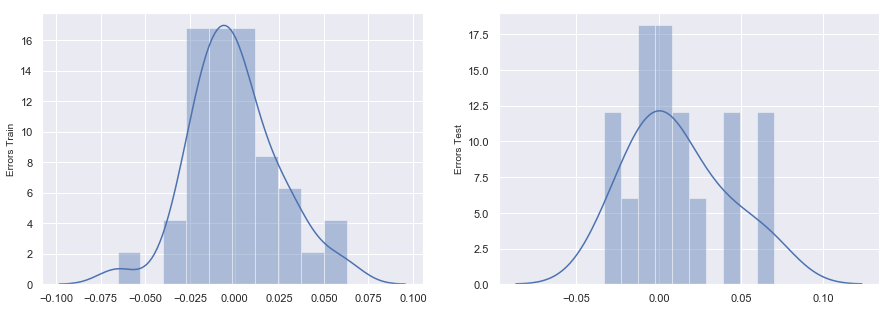

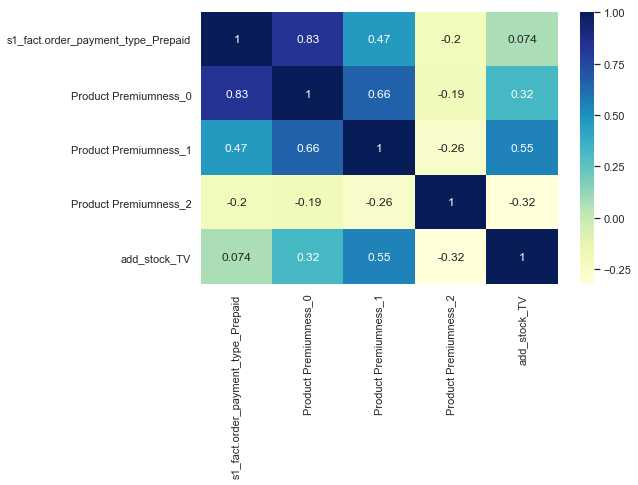

                    0
train r score 0.98741
test r score  0.98036
                 0
rmse_train 0.02470
rmse_test  0.03124


In [374]:
y_train_real_pred, y_test_real_pred, r2_dataframe, rmse_dataframe = predictions_and_residual_analysis_and_rscore(X_train_ln_iter0, 
                                                                                                 y_train_ln,
                                                                                                 X_test_ln,
                                                                                                 y_test_ln,
                                                                                                 model_iter23)
print(r2_dataframe)
print(rmse_dataframe)

### Train Test R2 Score are very good. So multiplicative model is a good contender 

### Elasticity of  `GMV` (Revenue)
As per economics, elasticity is the measure of how sensitive dependent variable (in our case, revenue) is to a particular independent variable.

<h4><center> $Elasticity_{gmv} = \frac{\frac{\delta{GMV}}{GMV}}{\frac{\delta{feature}}{feature}} $</centre> </h4>


while plotting elasticity, we will know,
1. Whether GMV is directly or indirectly propostional to a particular feature
2. How varying the dependency is?
3. Where exactly the dependency is? and such

Let us look at the elasticity of revenue with our predictors

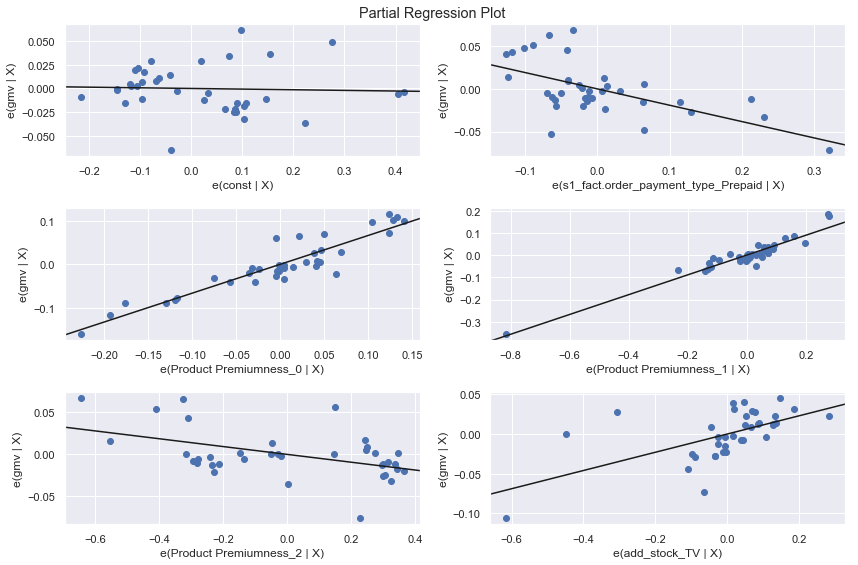

In [376]:
fig = plt.figure(figsize=(12,8))
fig = sm.graphics.plot_partregress_grid(model_iter23, fig=fig)

### Remarks:
It is evident that,
1. Product Premiumness 0 has a positive and substantial impact
3. Product premiumness 1 has positive impact but only on higher side of gmv
4. Add Stock TV has a positive but varying impact that too on higher revenue side of GMV 
5. Constant has almost no impact with product premiumness 2 impacting the gmv slightly negatively

### Model 3 Koyck Models (Output Lag Models)
1. `Koyck Model` is another version of Linear Regression model where output `lag like y(k-1), y(k-2)` is added as a features
2. Choosing how many lags to take is one of the important considerations in this work.
3. In this model, we model using the following sequence of steps
    1. Compute Auto-Correlation to understand the effect of lag. `Choose the lag according to that`
    2. Create and Call a lag function to create lag features
    3. Uni and Multi Variate Analysis
    4. Train Test Split and Scale
    5. Model Building with feature elimination
    6. Model Evaluation

### Compute Auto-Correlation:
1. By definition, Auto-Correlation determines the correlation of a variable with itself with time.
2. If we can find auto correlation of `gmv` with itself.
3. We know how much of past `gmv` is effecting the current `gmv`


Let us have a look at it

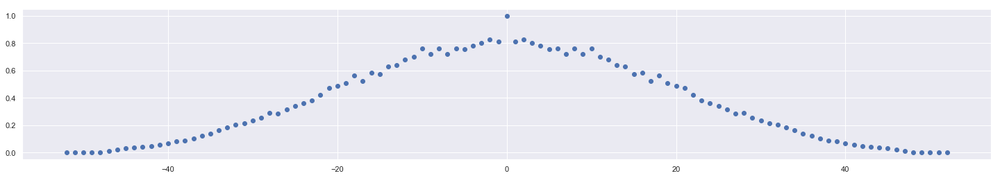

In [377]:
# Auto Correlation Analysis
from pandas.plotting import autocorrelation_plot
gmv = df_combined_audio['gmv']
plt.figure(figsize = (25,4))

plt.acorr(gmv, usevlines=False, normed=True, maxlags=52)
plt.show()

#### Remarks:
1. We can see that `lag GMV` is symmetrical on both sides.
2. We will analyse only one side of the lag Graph. Let us take the positive side
3. Relation between `gmv` and `lag gmv` has a `seasonality or recurring trend` for every 10 lags.
4. So if we take 10 lag features, that will cover the seasonality in all other features too

__We take `10 lag features`__

### Adding Lag GMV to the existing DataFrame

In [378]:
def lag_addition(dataframe, lags, column_name):
    # Copy a dataframe
    dataframe_dup = dataframe.copy()
    # Step 1: Index Collection
    new_index = []
    
    for i in range(0,53):
        new_index.append(list(dict_dates_in_each_week_climate.values())[i][0])
    Temp_df = pd.DataFrame(new_index, columns = ['datetime stamp'])
    Temp_df['datetime stamp'] = pd.to_datetime(Temp_df['datetime stamp'])
    
    # Step 2: Change Index from number to date
    column = dataframe[[column_name]]
    column.set_index(Temp_df['datetime stamp'], inplace = True)
    column.index = pd.to_datetime(column.index)
    
    dataframe_dup.set_index(Temp_df['datetime stamp'], inplace = True)
    dataframe_dup.index = pd.to_datetime(dataframe_dup.index)


    # Step 3: Lag features
    for k in range(1, lags+1):
        dataframe_dup[column_name + ' lag '+ str(k)] = column.shift(k)
    dataframe_dup.fillna(0, inplace = True)
    return(dataframe_dup) 

In [379]:
df_audio_lag = lag_addition(df_combined_audio,10, 'gmv')

In [380]:
df_audio_lag['gmv lag 1'].shape

(53,)

In [381]:
# Our dataframe is df_combined_audio
df_audio_lag.columns

Index(['gmv', 'units', 'product_mrp', 'pay_day', 'special_sale_dates',
       'discount_rate', 'delivery_time_status_early delivery',
       'delivery_time_status_late delivery', 'delivery_time_status_on time',
       's1_fact.order_payment_type_COD', 's1_fact.order_payment_type_Prepaid',
       'Product Premiumness_0', 'Product Premiumness_1',
       'Product Premiumness_2', 'Max Temp (°C)', 'Min Temp (°C)',
       'Mean Temp (°C)', 'Heat Deg Days (°C)', 'Cool Deg Days (°C)',
       'Total Rain (mm)', 'Total Snow (cm)', 'Total Precip (mm)',
       'Snow on Grnd (cm)', 'NPS', 'Stock Index', 'add_stock_TV',
       'add_stock_digital', 'add_stock_sponsorship', 'add_stock_content',
       'add_stock_online', 'add_stock_affiliates', 'add_stock_SEM',
       'gmv lag 1', 'gmv lag 2', 'gmv lag 3', 'gmv lag 4', 'gmv lag 5',
       'gmv lag 6', 'gmv lag 7', 'gmv lag 8', 'gmv lag 9', 'gmv lag 10'],
      dtype='object')

### Univariate and Bivariate Analysis of Lag Data
1. The analysis for all other features was essentially done while performing `linear regression`
2. We will perform the similar analysis for only lags with GMV in this problem
1. This analysis is typically performed for continuous features only. So we choose only a few features to do it
2. Selected features include `gmv`, `discount_rate`, `All add stocks`

####  Box Plots: To check Outliers

In [382]:
import matplotlib
column_list_lag_gmv = ['gmv', 'gmv lag 1', 'gmv lag 2', 'gmv lag 3', 'gmv lag 4', 'gmv lag 5',
       'gmv lag 6', 'gmv lag 7', 'gmv lag 8', 'gmv lag 9', 'gmv lag 10']



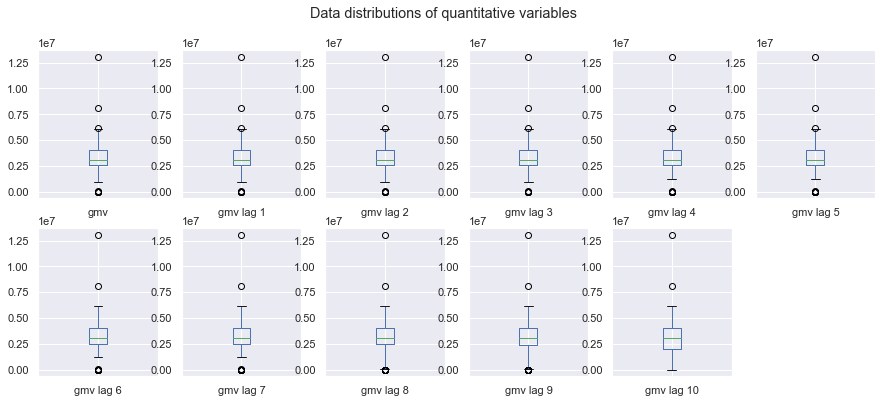

In [383]:
df_audio_lag[column_list_lag_gmv].plot(kind='box',subplots=True,layout=(2,6),
                                    sharex=False,figsize=(15,6), 
                                    title="Data distributions of quantitative variables")
plt.show()

#### Remarks: 
1. There are rarely any outliers. Even if there, they are mostly zeros that we imputed na with. 

#### Scatter Plots (Bivariate Relationship among lag data) 

<Figure size 720x720 with 0 Axes>

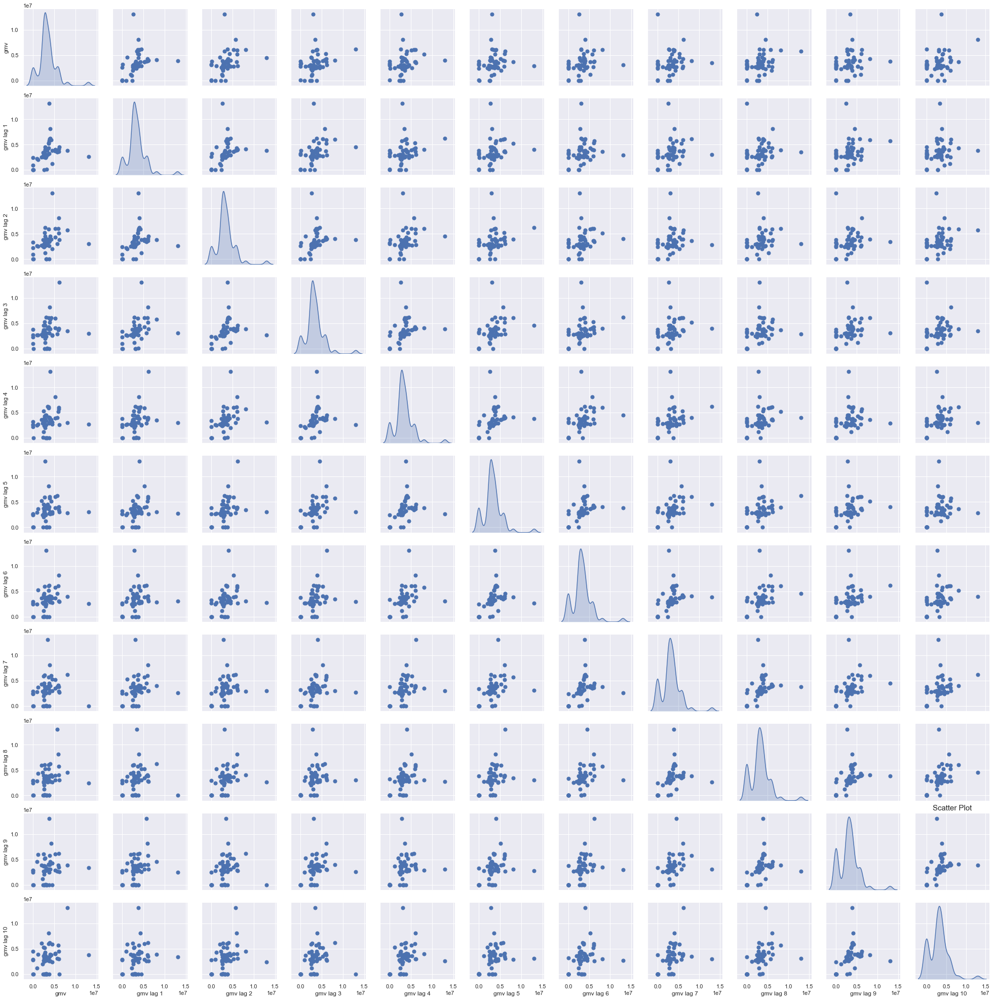

In [384]:
# Draw scatter plot


plt.figure(figsize=(10,10))
sns.set(style="darkgrid")
ax=sns.pairplot(df_audio_lag[column_list_lag_gmv],diag_kind ='kde',
               plot_kws=dict(s=50, edgecolor="b", linewidth=1),diag_kws=dict(shade=True))

plt.title('Scatter Plot',   fontsize=15)
#ax.set_xticklabels(ax.(), rotation=65, ha="right",weight="bold",fontsize=15)


plt.show()

#### Remarks:
##### PART - 1
1. It feels like each lag has a  relation with gmv with heteroskedasticity.
2. This means the variability is increasing with time which is expected

#### Heat-Map (Bivariate Relationship among Lag data) 
1. While doing this, we ignored weather components as they are not continuous values.

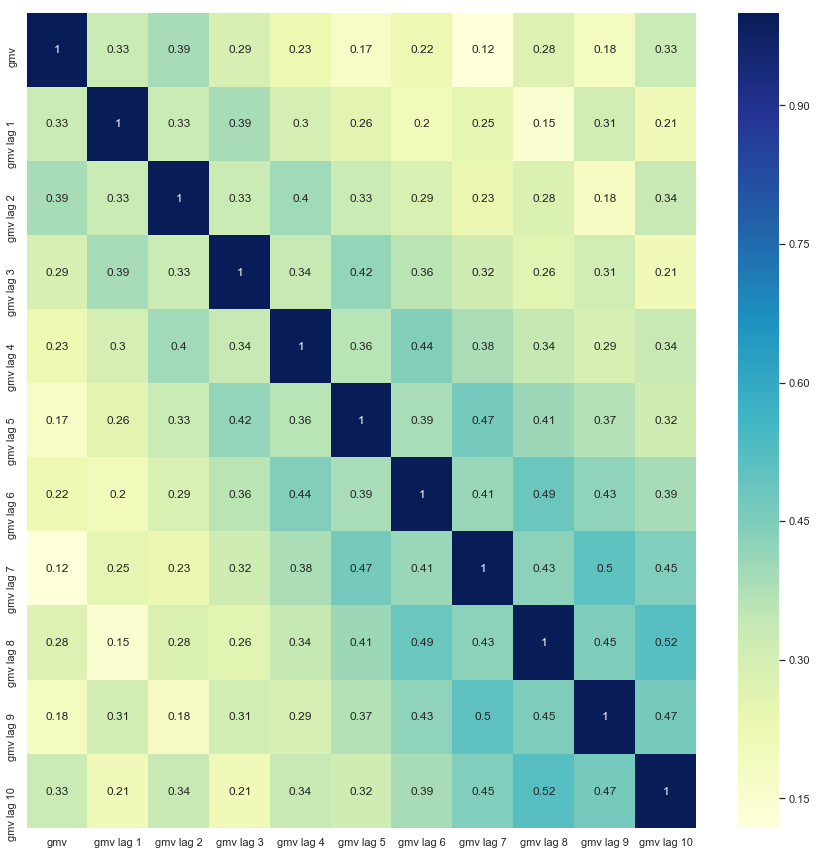

In [385]:
plt.figure(figsize=(15,15))
sns.heatmap(df_audio_lag[column_list_lag_gmv].corr(), 
            annot=True, cmap='YlGnBu')
plt.show()

#### Remarks:
1. We already checked in the auto correlation graph that GMV has decreasing with lag GMV
2. We cannot expect any substantial model difference due to lags because the correlations are not so highlighting

### Modeling


#### Train-Test Split and Scaling

In [386]:
X_train_lag,y_train_lag,X_test_lag,y_test_lag = split_scale_feature(df_audio_lag)

In [387]:
X_train_lag.shape

(37, 41)

####  Recursive Feature Elimination

In [388]:
X_train_lag_iter0 = rfe_function(X_train_lag,y_train_lag,30)

#### Model Building using StatsModel 

In [389]:
# Results of stats model iteration - 1
X_train_column_list, model_iter1, summary, VIF = statsmodel_vif(X_train_lag_iter0,y_train,[])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                     2980.
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           6.32e-12
Time:                        18:51:26   Log-Likelihood:                 184.72
No. Observations:                  37   AIC:                            -309.4
Df Residuals:                       7   BIC:                            -261.1
Df Model:                          29                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
13,Heat Deg Days (°C),inf
12,Mean Temp (°C),inf
14,Cool Deg Days (°C),inf
4,delivery_time_status_early delivery,2849.77000
5,delivery_time_status_late delivery,2716.56000
6,s1_fact.order_payment_type_COD,2412.31000
7,s1_fact.order_payment_type_Prepaid,1601.11000
24,add_stock_SEM,756.87000
11,Min Temp (°C),752.47000
2,product_mrp,505.94000


#### Remarks: 
1. As we discussed earlier, We shall eliminate one from each feature set every time and we iterate the process until we get a decent model
2. We will start with weather
3. `Heat Deg Days (°C)` has highest VIF but less P-Value
4. We still choose to drop `Heat Deg Days (°C)` to handle multi collinearity

In [390]:
# Results of stats model iteration - 2
X_train_column_list, model_iter2, summary, VIF = statsmodel_vif(X_train_lag_iter0,y_train_lag,['Heat Deg Days (°C)'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                     2980.
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           6.32e-12
Time:                        18:51:29   Log-Likelihood:                 184.72
No. Observations:                  37   AIC:                            -309.4
Df Residuals:                       7   BIC:                            -261.1
Df Model:                          29                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
4,delivery_time_status_early delivery,2849.77000
5,delivery_time_status_late delivery,2716.56000
6,s1_fact.order_payment_type_COD,2412.31000
7,s1_fact.order_payment_type_Prepaid,1601.11000
12,Mean Temp (°C),1587.87000
0,const,942.86000
23,add_stock_SEM,756.87000
11,Min Temp (°C),752.47000
2,product_mrp,505.94000
1,units,443.34000


#### Remarks: 
1. In the iteration, we will drop `delivery_time_status_early delivery` which has both high VIF as well as P Value

In [391]:
# Results of stats model iteration - 3
X_train_column_list, model_iter3, summary, VIF = statsmodel_vif(X_train_lag_iter0,y_train_lag,
                                                                ['delivery_time_status_early delivery'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                     2894.
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           2.26e-13
Time:                        18:51:31   Log-Likelihood:                 181.06
No. Observations:                  37   AIC:                            -304.1
Df Residuals:                       8   BIC:                            -257.4
Df Model:                          28                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

,Features,VIF
11,Mean Temp (°C),1465.24000
10,Min Temp (°C),682.09000
0,const,608.47000
22,add_stock_SEM,448.09000
2,product_mrp,408.26000
9,Max Temp (°C),405.62000
1,units,374.11000
18,add_stock_digital,286.70000
20,add_stock_content,173.47000
6,s1_fact.order_payment_type_Prepaid,102.03000


#### Remarks:
1. Let us remove one from add stocks
2. We are dropping `add_stock_sponsorship` since it has both VIF and P Value high

In [392]:
# Results of stats model iteration - 4
X_train_column_list, model_iter4, summary, VIF = statsmodel_vif(X_train_lag_iter0,y_train_lag,
                                                                ['add_stock_sponsorship'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                     3244.
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           4.48e-15
Time:                        18:51:33   Log-Likelihood:                 180.32
No. Observations:                  37   AIC:                            -304.6
Df Residuals:                       9   BIC:                            -259.5
Df Model:                          27                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

,Features,VIF
11,Mean Temp (°C),1420.80000
10,Min Temp (°C),673.30000
0,const,606.72000
2,product_mrp,375.69000
9,Max Temp (°C),374.71000
1,units,338.05000
21,add_stock_SEM,333.62000
18,add_stock_digital,247.97000
19,add_stock_content,172.88000
5,s1_fact.order_payment_type_COD,95.60000


#### Remarks:
1. Now let us remove a lag variable
2. `gmv lag 3` has both high P-Value and well has slightly high VIF.
3. Let us drop `gmv lag 3`

In [393]:
# Results of stats model iteration - 5
X_train_column_list, model_iter5, summary, VIF = statsmodel_vif(X_train_lag_iter0,y_train_lag,
                                                                ['gmv lag 3'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                     3716.
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           7.33e-17
Time:                        18:51:36   Log-Likelihood:                 180.19
No. Observations:                  37   AIC:                            -306.4
Df Residuals:                      10   BIC:                            -262.9
Df Model:                          26                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

,Features,VIF
11,Mean Temp (°C),1253.74000
10,Min Temp (°C),646.31000
0,const,430.98000
2,product_mrp,343.94000
21,add_stock_SEM,333.45000
1,units,310.63000
9,Max Temp (°C),227.81000
18,add_stock_digital,190.23000
5,s1_fact.order_payment_type_COD,86.48000
6,s1_fact.order_payment_type_Prepaid,83.57000


#### Remarks:
1. We are starting off with the second iteration of values.
2. We restart with weather again
3. Let us drop `Mean Temp (°C)` which has high VIF

In [394]:
# Results of stats model iteration - 5
X_train_column_list, model_iter5, summary, VIF = statsmodel_vif(X_train_lag_iter0,y_train_lag,['Mean Temp (°C)'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  0.999
Method:                 Least Squares   F-statistic:                     2147.
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           4.65e-17
Time:                        18:51:38   Log-Likelihood:                 167.55
No. Observations:                  37   AIC:                            -283.1
Df Residuals:                      11   BIC:                            -241.2
Df Model:                          25                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

,Features,VIF
0,const,362.81000
2,product_mrp,342.66000
1,units,310.38000
20,add_stock_SEM,232.81000
9,Max Temp (°C),168.49000
17,add_stock_digital,116.07000
5,s1_fact.order_payment_type_COD,84.65000
6,s1_fact.order_payment_type_Prepaid,83.50000
10,Min Temp (°C),81.76000
18,add_stock_content,74.81000


#### Remarks:
1. Let us drop `product_mrp` which has large collinearity that we can check through VIF
2. Though P Value is less, it is highly unlikely that we can keep `units`, `MRP` and `discount` together
3. Let us drop `product_mrp`

In [395]:
# Results of stats model iteration - 6
X_train_column_list, model_iter6, summary, VIF = statsmodel_vif(X_train_lag_iter0,y_train_lag,['product_mrp'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.998
Method:                 Least Squares   F-statistic:                     915.5
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           3.26e-16
Time:                        18:51:40   Log-Likelihood:                 149.42
No. Observations:                  37   AIC:                            -248.8
Df Residuals:                      12   BIC:                            -208.6
Df Model:                          24                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

,Features,VIF
0,const,339.31000
19,add_stock_SEM,228.08000
8,Max Temp (°C),167.58000
16,add_stock_digital,116.06000
9,Min Temp (°C),81.24000
17,add_stock_content,66.98000
10,Cool Deg Days (°C),23.97000
4,s1_fact.order_payment_type_COD,21.23000
5,s1_fact.order_payment_type_Prepaid,16.78000
15,add_stock_TV,14.73000


#### Remarks:
1. `add_stock_SEM` has high P Value and VIF
2. It has high correlation with `add_stock_content` which is understandable
3. Though it has good correlation with GMV, 
4. Since we have content add stock so far, we are dropping `add_stock_SEM`

In [396]:
# Results of stats model iteration - 7
X_train_column_list, model_iter7, summary, VIF = statsmodel_vif(X_train_lag_iter0,y_train_lag,['add_stock_SEM'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.998
Method:                 Least Squares   F-statistic:                     1019.
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.09e-17
Time:                        18:51:42   Log-Likelihood:                 149.14
No. Observations:                  37   AIC:                            -250.3
Df Residuals:                      13   BIC:                            -211.6
Df Model:                          23                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

,Features,VIF
0,const,334.80000
8,Max Temp (°C),147.68000
9,Min Temp (°C),65.39000
17,add_stock_content,38.25000
16,add_stock_digital,36.70000
10,Cool Deg Days (°C),22.65000
4,s1_fact.order_payment_type_COD,20.72000
5,s1_fact.order_payment_type_Prepaid,16.08000
15,add_stock_TV,14.67000
2,discount_rate,12.14000


#### Remarks:
1. Let us drop `Max Temp (°C)` due to high VIF

In [397]:
# Results of stats model iteration - 8
X_train_column_list, model_iter8, summary, VIF = statsmodel_vif(X_train_lag_iter0,y_train_lag,
                                                                ['Max Temp (°C)'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.998
Method:                 Least Squares   F-statistic:                     687.4
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.12e-17
Time:                        18:51:44   Log-Likelihood:                 139.67
No. Observations:                  37   AIC:                            -233.3
Df Residuals:                      14   BIC:                            -196.3
Df Model:                          22                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

,Features,VIF
0,const,280.98000
16,add_stock_content,18.53000
15,add_stock_digital,18.51000
5,s1_fact.order_payment_type_Prepaid,15.01000
4,s1_fact.order_payment_type_COD,13.96000
14,add_stock_TV,13.50000
8,Min Temp (°C),11.74000
2,discount_rate,11.23000
9,Cool Deg Days (°C),8.79000
12,NPS,7.16000


#### Remarks:
1. Let us drop `add_stock_content` due to high VIF

In [398]:
# Results of stats model iteration - 9
X_train_column_list, model_iter9, summary, VIF = statsmodel_vif(X_train_lag_iter0,y_train_lag,['add_stock_content'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.997
Method:                 Least Squares   F-statistic:                     603.6
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           2.45e-18
Time:                        18:51:46   Log-Likelihood:                 135.13
No. Observations:                  37   AIC:                            -226.3
Df Residuals:                      15   BIC:                            -190.8
Df Model:                          21                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

,Features,VIF
0,const,278.95000
5,s1_fact.order_payment_type_Prepaid,14.77000
14,add_stock_TV,13.50000
4,s1_fact.order_payment_type_COD,12.46000
8,Min Temp (°C),11.74000
2,discount_rate,10.52000
9,Cool Deg Days (°C),8.63000
12,NPS,7.15000
1,units,6.64000
6,Product Premiumness_0,5.80000


#### Remarks:
1. `delivery_time_status_late delivery` has the highest P Value.
2. Since VIF is almost controlled toless than 20
3. We will focus on high P Value
4. Let us drop `delivery_time_status_late delivery`

In [399]:
# Results of stats model iteration - 10
X_train_column_list, model_iter10, summary, VIF = statsmodel_vif(X_train_lag_iter0,y_train_lag,
                                                                 ['delivery_time_status_late delivery'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.997
Method:                 Least Squares   F-statistic:                     675.9
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           9.18e-20
Time:                        18:51:49   Log-Likelihood:                 135.13
No. Observations:                  37   AIC:                            -228.3
Df Residuals:                      16   BIC:                            -194.4
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

,Features,VIF
0,const,195.29000
13,add_stock_TV,12.84000
4,s1_fact.order_payment_type_Prepaid,11.79000
3,s1_fact.order_payment_type_COD,11.77000
7,Min Temp (°C),9.83000
2,discount_rate,9.08000
8,Cool Deg Days (°C),8.07000
11,NPS,6.74000
1,units,6.60000
15,add_stock_online,5.64000


#### Remarks:
1. Let us drop `Stock Index` which has high P Value

In [400]:
# Results of stats model iteration - 11
X_train_column_list, model_iter11, summary, VIF = statsmodel_vif(X_train_lag_iter0,y_train_lag,['Stock Index'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.997
Method:                 Least Squares   F-statistic:                     744.7
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           3.69e-21
Time:                        18:51:52   Log-Likelihood:                 134.85
No. Observations:                  37   AIC:                            -229.7
Df Residuals:                      17   BIC:                            -197.5
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

,Features,VIF
0,const,195.15000
3,s1_fact.order_payment_type_COD,11.72000
4,s1_fact.order_payment_type_Prepaid,11.22000
7,Min Temp (°C),9.76000
12,add_stock_TV,9.56000
2,discount_rate,9.05000
8,Cool Deg Days (°C),7.90000
1,units,6.57000
11,NPS,6.19000
13,add_stock_digital,5.16000


#### Remarks:
1. `gmv lag 2` has consistently high P Value and increasing too
2. Let us drop `gmv lag 2`

In [401]:
# Results of stats model iteration - 12
X_train_column_list, model_iter12, summary, VIF = statsmodel_vif(X_train_lag_iter0,y_train_lag,['gmv lag 2'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.998
Method:                 Least Squares   F-statistic:                     830.4
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.27e-22
Time:                        18:51:54   Log-Likelihood:                 134.81
No. Observations:                  37   AIC:                            -231.6
Df Residuals:                      18   BIC:                            -201.0
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

,Features,VIF
0,const,177.05000
4,s1_fact.order_payment_type_Prepaid,11.22000
3,s1_fact.order_payment_type_COD,11.02000
12,add_stock_TV,9.51000
7,Min Temp (°C),8.67000
2,discount_rate,8.62000
8,Cool Deg Days (°C),7.90000
11,NPS,6.17000
1,units,6.03000
5,Product Premiumness_0,4.76000


#### Remarks:
1. Let us look at weather features again
2. `Total Snow (cm)` has high P Value
3. Let us drop `Total Snow (cm)`

In [402]:
# Results of stats model iteration - 13
X_train_column_list, model_iter13, summary, VIF = statsmodel_vif(X_train_lag_iter0,y_train_lag,['Total Snow (cm)'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.998
Method:                 Least Squares   F-statistic:                     917.2
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           4.53e-24
Time:                        18:51:56   Log-Likelihood:                 134.59
No. Observations:                  37   AIC:                            -233.2
Df Residuals:                      19   BIC:                            -204.2
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

,Features,VIF
0,const,177.04000
4,s1_fact.order_payment_type_Prepaid,11.09000
3,s1_fact.order_payment_type_COD,10.74000
11,add_stock_TV,9.39000
2,discount_rate,8.51000
7,Min Temp (°C),8.42000
8,Cool Deg Days (°C),7.87000
10,NPS,6.16000
1,units,5.96000
13,add_stock_online,4.73000


#### Remarks:
1. Units are consistently high VIF
2. It has correlation with addstocks
3. Since we want to retain units for some time
2. Let us drop `add_stock_digital`

In [403]:
# Results of stats model iteration - 14
X_train_column_list, model_iter14, summary, VIF = statsmodel_vif(X_train_lag_iter0,y_train_lag,['add_stock_digital'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.998
Method:                 Least Squares   F-statistic:                     1025.
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.39e-25
Time:                        18:51:59   Log-Likelihood:                 134.57
No. Observations:                  37   AIC:                            -235.1
Df Residuals:                      20   BIC:                            -207.8
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

,Features,VIF
0,const,168.98000
4,s1_fact.order_payment_type_Prepaid,10.76000
3,s1_fact.order_payment_type_COD,10.49000
7,Min Temp (°C),8.21000
8,Cool Deg Days (°C),7.87000
2,discount_rate,7.54000
11,add_stock_TV,7.37000
10,NPS,5.54000
12,add_stock_online,4.41000
5,Product Premiumness_0,4.28000


#### Remarks:
1. `Min Temp (°C)` has a high P Value and not changing
2. Let us drop `Min Temp (°C)`

In [404]:
# Results of stats model iteration - 15
X_train_column_list, model_iter15, summary, VIF = statsmodel_vif(X_train_lag_iter0,y_train_lag,['Min Temp (°C)'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.998
Method:                 Least Squares   F-statistic:                     1145.
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           4.11e-27
Time:                        18:52:01   Log-Likelihood:                 134.52
No. Observations:                  37   AIC:                            -237.0
Df Residuals:                      21   BIC:                            -211.3
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

,Features,VIF
0,const,84.35000
4,s1_fact.order_payment_type_Prepaid,10.46000
3,s1_fact.order_payment_type_COD,10.30000
2,discount_rate,7.46000
10,add_stock_TV,7.37000
9,NPS,4.86000
11,add_stock_online,4.35000
5,Product Premiumness_0,4.12000
7,Cool Deg Days (°C),3.61000
1,units,3.19000


#### Remarks:
1. `add_stock_TV` has a high P Value, Let us drop it 

In [405]:
# Results of stats model iteration - 16
X_train_column_list, model_iter16, summary, VIF = statsmodel_vif(X_train_lag_iter0,y_train_lag,['add_stock_TV'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.998
Model:                            OLS   Adj. R-squared:                  0.997
Method:                 Least Squares   F-statistic:                     948.3
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           3.12e-27
Time:                        18:52:03   Log-Likelihood:                 128.91
No. Observations:                  37   AIC:                            -227.8
Df Residuals:                      22   BIC:                            -203.7
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

,Features,VIF
0,const,80.68000
3,s1_fact.order_payment_type_COD,10.13000
4,s1_fact.order_payment_type_Prepaid,9.74000
2,discount_rate,7.44000
9,NPS,4.62000
5,Product Premiumness_0,3.80000
7,Cool Deg Days (°C),3.21000
1,units,2.87000
10,add_stock_online,2.61000
12,gmv lag 8,1.78000


#### Remarks:
1. `Lag 9` and `Lag 8` are correlated. We checked that in heat map
2. Both have high P Values
3. Let us drop any one. I would pick `Lag 9`
4. This is because `lag 10` is significant and dropping `Lag 9` handles its collinearity too

In [406]:
# Results of stats model iteration - 17
X_train_column_list, model_iter17, summary, VIF = statsmodel_vif(X_train_lag_iter0,y_train_lag,['gmv lag 9'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.998
Model:                            OLS   Adj. R-squared:                  0.997
Method:                 Least Squares   F-statistic:                     1058.
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.02e-28
Time:                        18:52:05   Log-Likelihood:                 128.75
No. Observations:                  37   AIC:                            -229.5
Df Residuals:                      23   BIC:                            -206.9
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

,Features,VIF
0,const,76.37000
3,s1_fact.order_payment_type_COD,10.10000
4,s1_fact.order_payment_type_Prepaid,9.69000
2,discount_rate,7.43000
9,NPS,4.58000
5,Product Premiumness_0,3.80000
7,Cool Deg Days (°C),3.13000
1,units,2.82000
10,add_stock_online,2.61000
12,gmv lag 8,1.74000


#### Remarks:
1. As a next iteration, let us drop `Cool Deg Days (°C)` due to high P Value

In [407]:
# Results of stats model iteration - 18
X_train_column_list, model_iter18, summary, VIF = statsmodel_vif(X_train_lag_iter0,y_train_lag,['Cool Deg Days (°C)'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.998
Model:                            OLS   Adj. R-squared:                  0.997
Method:                 Least Squares   F-statistic:                     1196.
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           2.88e-30
Time:                        18:52:07   Log-Likelihood:                 128.74
No. Observations:                  37   AIC:                            -231.5
Df Residuals:                      24   BIC:                            -210.5
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

,Features,VIF
0,const,74.09000
3,s1_fact.order_payment_type_COD,9.87000
4,s1_fact.order_payment_type_Prepaid,9.18000
2,discount_rate,7.18000
5,Product Premiumness_0,3.61000
8,NPS,3.46000
1,units,2.66000
9,add_stock_online,2.59000
11,gmv lag 8,1.70000
6,Product Premiumness_2,1.67000


#### Remarks
1. To change the feature set, let us drop `Snow on Grnd (cm)` which has increasing P-Value with each iteration

In [408]:
# Results of stats model iteration - 19
X_train_column_list, model_iter19, summary, VIF = statsmodel_vif(X_train_lag_iter0,y_train_lag,['Snow on Grnd (cm)'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.998
Model:                            OLS   Adj. R-squared:                  0.998
Method:                 Least Squares   F-statistic:                     1352.
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           8.10e-32
Time:                        18:52:09   Log-Likelihood:                 128.64
No. Observations:                  37   AIC:                            -233.3
Df Residuals:                      25   BIC:                            -213.9
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

,Features,VIF
0,const,73.59000
3,s1_fact.order_payment_type_COD,9.83000
4,s1_fact.order_payment_type_Prepaid,9.10000
2,discount_rate,7.14000
5,Product Premiumness_0,3.56000
7,NPS,3.46000
1,units,2.56000
8,add_stock_online,2.54000
6,Product Premiumness_2,1.66000
10,gmv lag 8,1.59000


#### Remarks
1. `gmv lag 5` has a rich  P-Value
2. Let us drop `gmv lag 5`

In [409]:
# Results of stats model iteration - 20
X_train_column_list, model_iter20, summary, VIF = statsmodel_vif(X_train_lag_iter0,y_train_lag,['gmv lag 5'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.998
Model:                            OLS   Adj. R-squared:                  0.998
Method:                 Least Squares   F-statistic:                     1516.
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           2.57e-33
Time:                        18:52:11   Log-Likelihood:                 128.27
No. Observations:                  37   AIC:                            -234.5
Df Residuals:                      26   BIC:                            -216.8
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

,Features,VIF
0,const,68.34000
3,s1_fact.order_payment_type_COD,9.81000
4,s1_fact.order_payment_type_Prepaid,9.08000
2,discount_rate,7.14000
5,Product Premiumness_0,3.47000
7,NPS,3.30000
8,add_stock_online,2.52000
1,units,2.47000
6,Product Premiumness_2,1.63000
10,gmv lag 10,1.50000


#### Remarks
1. Let us drop `add_stock_online` due to high P Value
2. We want to completely control the multi collinearity now

In [410]:
# Results of stats model iteration - 21
X_train_column_list, model_iter21, summary, VIF = statsmodel_vif(X_train_lag_iter0,y_train_lag,['add_stock_online'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.998
Model:                            OLS   Adj. R-squared:                  0.997
Method:                 Least Squares   F-statistic:                     1588.
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           2.18e-34
Time:                        18:52:13   Log-Likelihood:                 126.49
No. Observations:                  37   AIC:                            -233.0
Df Residuals:                      27   BIC:                            -216.9
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

,Features,VIF
0,const,67.09000
3,s1_fact.order_payment_type_COD,9.73000
4,s1_fact.order_payment_type_Prepaid,8.99000
2,discount_rate,7.02000
5,Product Premiumness_0,3.35000
7,NPS,3.14000
1,units,2.20000
6,Product Premiumness_2,1.59000
8,gmv lag 8,1.47000
9,gmv lag 10,1.46000


#### Remarks
1. Let us drop `gmv lag 8` due to increase in P Value

In [411]:
# Results of stats model iteration - 22
X_train_column_list, model_iter22, summary, VIF = statsmodel_vif(X_train_lag_iter0,y_train_lag,['gmv lag 8'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.998
Model:                            OLS   Adj. R-squared:                  0.998
Method:                 Least Squares   F-statistic:                     1802.
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           7.18e-36
Time:                        18:52:15   Log-Likelihood:                 125.97
No. Observations:                  37   AIC:                            -233.9
Df Residuals:                      28   BIC:                            -219.4
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

,Features,VIF
0,const,65.24000
3,s1_fact.order_payment_type_COD,8.93000
4,s1_fact.order_payment_type_Prepaid,8.16000
2,discount_rate,6.46000
5,Product Premiumness_0,3.27000
7,NPS,3.11000
1,units,2.14000
6,Product Premiumness_2,1.58000
8,gmv lag 10,1.32000


#### Remarks
1. `<0.05` signifies 95% confidance of feature importance and we achieved that
2. In our case, we have very less data as small as 37 points to model the data
3. We considered VIF < 10 as a stop point. Due to less data, otherwise model is too sensitive and P Values change drastically
5. So let us stop modeling here

__Important:__ __We successfully maintained the R Square and Adjusted R Square Scores__

####  Residual Analysis of Train Test Data

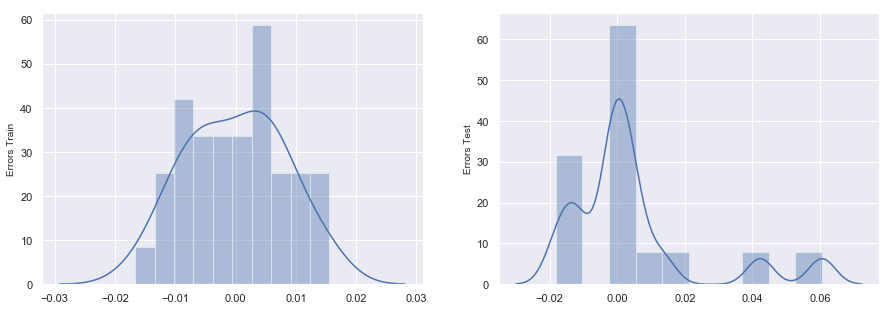

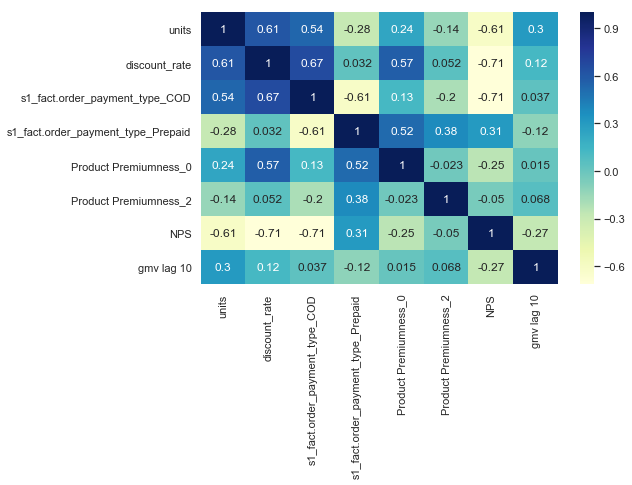

                    0
train r score 0.99806
test r score  0.96445
                 0
rmse_train 0.00804
rmse_test  0.02027


In [412]:
y_train_real_pred, y_test_real_pred, r2_dataframe, rmse_dataframe = predictions_and_residual_analysis_and_rscore(X_train_lag_iter0, 
                                                                                                 y_train_lag,
                                                                                                 X_test_lag,
                                                                                                 y_test_lag,
                                                                                                 model_iter22)
print(r2_dataframe)
print(rmse_dataframe)

#### Train Test R Squared Scores are decent for koyck models

### Elasticity of  `GMV` (Revenue)
As per economics, elasticity is the measure of how sensitive dependent variable (in our case, revenue) is to a particular independent variable.

<h4><center> $Elasticity_{gmv} = \frac{\frac{\delta{GMV}}{GMV}}{\frac{\delta{feature}}{feature}} $</centre> </h4>


while plotting elasticity, we will know,
1. Whether GMV is directly or indirectly propostional to a particular feature
2. How varying the dependency is?
3. Where exactly the dependency is? and such

Let us look at the elasticity of revenue with our predictors

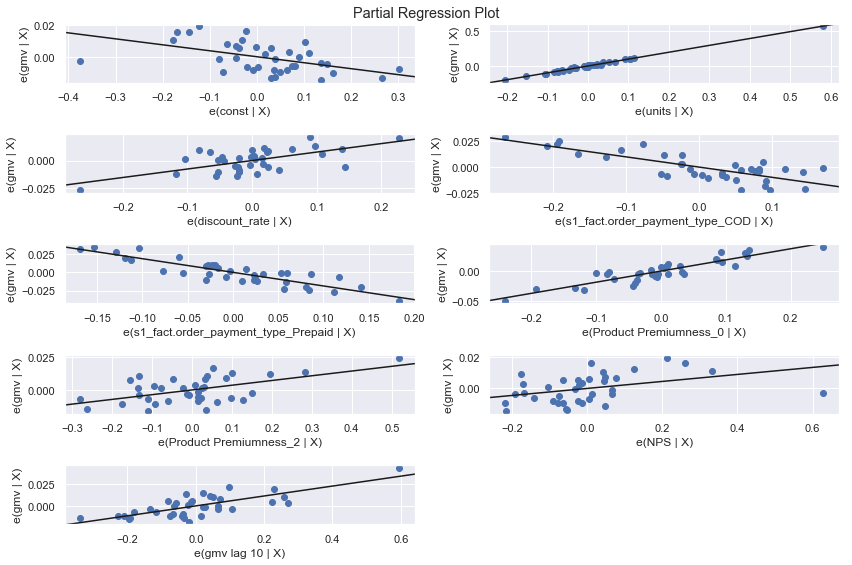

In [413]:
fig = plt.figure(figsize=(12,8))
fig = sm.graphics.plot_partregress_grid(model_iter22, fig=fig)

### Remarks:
It is evident that,
1. Constant and Payment type has a negative impact on the GMV
3. Units and Premiumness 2 has a positive impact but on the lower revenue range
4. Discount rate has an impact on the higher revenue side. This means discount started impacting the revenue only after a threshold 
5. That is expected since some discounts will anyway go into losses.
6. Only after so many purchases does discounted revenue convert to profits
5. NPS also has contribution in the lower end of revenue but highly varying



### Model - 4: Distributed Lag Model
1. Distributed Lag Model is nothing but lag model with lags from both features (X) as well as response variables (Y)
2. In our use case, we will `try and choose the lag distinctly for each feature`
3. In order to do that let us `compute cross correlation between the variables and GMV`

### Compute Cross Correlation :
1. By definition, Cross-Correlation determines the correlation of a variable with others with time.
2. If we can find cross correlation of `gmv` with features.
3. We know how much of effecting the current `gmv` has through lagged features

Let us have a look at it

#### Distributed Lag Model - Home Audio

In [414]:
df_combined_audio.shape

(53, 32)

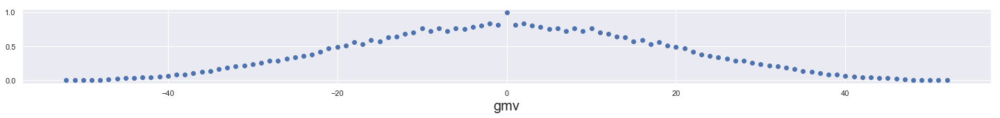

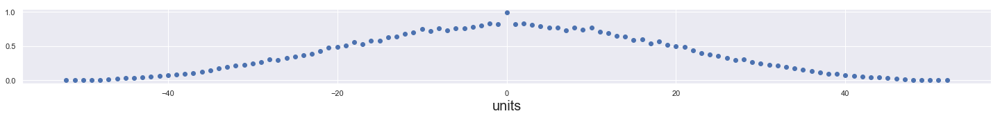

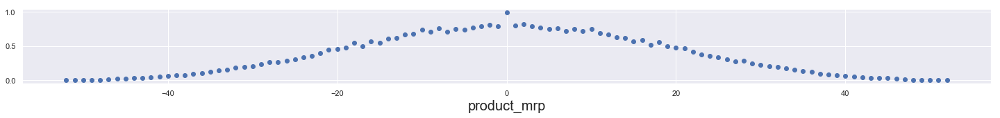

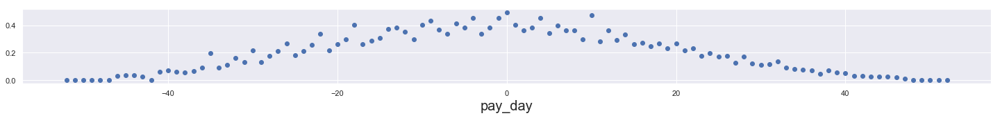

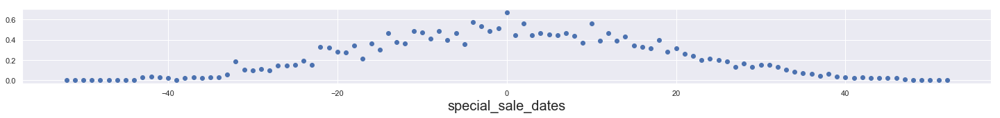

...

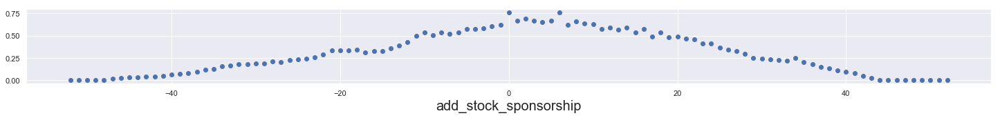

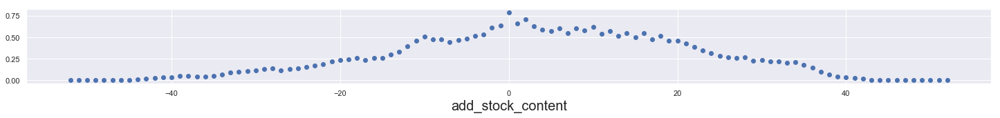

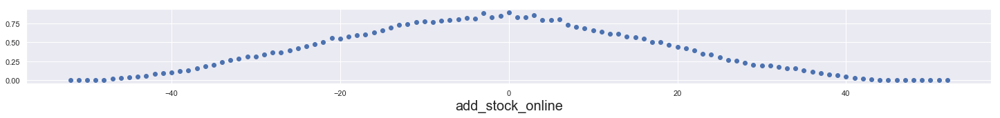

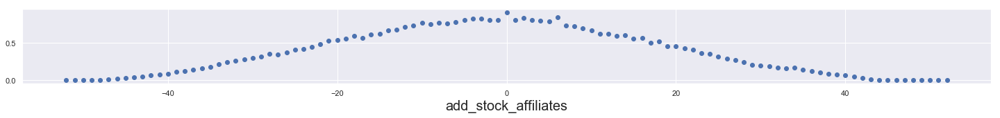

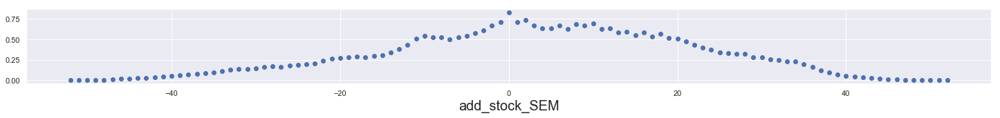

In [415]:
# Auto Correlation Analysis
from pandas.plotting import autocorrelation_plot
for i in list(df_combined_audio.columns):
    plt.figure(figsize = (25,2))
    plt.xcorr(df_combined_audio['gmv'],df_combined_audio[i],usevlines=False, normed=True, maxlags=52)
    plt.xlabel(i, fontsize = 20)
    plt.show()

#### Remarks:
1. As we can see, we computed the auto-correlation and cross correlation of all features with GMV.
2. For choosing the lag, we will lay some ground rules.
3. Any `lag with correlation > 0.75` is strongly correlated and we take those number of lags
4. Any `features with lags with correlation < 0.75` are negligible features in terms of lags but as standard we take 3 lags for them.
5. We ignore other lags.
6. Choice of Lags:
    1. `gmv`: 10
    2. `units`: 10
    3. `product_mrp`: 10
    4. `pay_day`: 3
    5. `special_sale_dates`: 3
    6. `discount_rate`: 7
    7. `delivery_time_status_early delivery`: 3
    8. `delivery_time_status_late delivery`: 3
    9. `delivery_time_status_on time`: 7
    10. `s1_fact.order_payment_type_COD`: 6
    11. `s1_fact.order_payment_type_Prepaid`:3
    12. `Product Premiumness_0`: 6
    13. `Product Premiumness_1`: 6
    14. `Product Premiumness_2`: 3
    15. `Max Temp (°C)`: 3
    16. `Min Temp (°C)`: 3
    17. `Mean Temp (°C)`: 3
    18. `Heat Deg Days (°C)`: 3
    19. `Cool Deg Days (°C)`: 3
    20. `Total Rain (mm)`: 3
    21. `Total Snow (cm)`: 3
    22. `Total Precip (mm)`: 3
    23. `Snow on Grnd (cm)`: 3
    24. `NPS`: 3
    25. `Stock Index`: 3
    26. `add_stock_TV`: 3
    27. `add_stock_digital`: 3 
    28. `add_stock_sponsorship`: 3
    29. `add_stock_content`: 3
    30. `add_stock_online`: 3
    31. `add_stock_affiliates`: 3
    32. `add_stock_SEM`: 3


##### Note-1: All features with lag 3 are mostly because they have < 0.75 correlation with GMV
##### Note-2: Others have good correlation, hence retailed.
##### Note-3: `Since we have most values 3, let us keep the value of lag to be 3 as constant for time being`

### Adding Lag GMV to the existing DataFrame

In [498]:
# Making Lag Disctionary
dict_lag_values = {}
#list_lags = [10,3,10,3,3,7,10,3,7,6,3,6,6,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3]
#len(list_lags)
for i in range(len(list(df_combined_audio.columns))):
    dict_lag_values[list(df_combined_audio.columns)[i]] = 3

In [499]:
# Lag Generation for Distributed Lag Models
df_audio_distlag = df_combined_audio.copy()
for key,value in dict_lag_values.items():
    df_audio_distlag = lag_addition(df_audio_distlag,value, key)


In [500]:
# Cross Checking the Lags
df_audio_distlag[['add_stock_SEM lag 1', 'add_stock_SEM lag 2', 'add_stock_SEM lag 3']].head()

,add_stock_SEM lag 1,add_stock_SEM lag 2,add_stock_SEM lag 3
datetime stamp,,,
2015-07-01,0.00000,0.00000,0.00000
2015-07-06,0.02914,0.00000,0.00000
2015-07-13,1.26866,0.02914,0.00000
2015-07-20,2.01532,1.26866,0.02914
2015-07-27,2.16014,2.01532,1.26866


In [501]:
df_audio_distlag.shape

(53, 128)

###  Univariate and Bivariate Analysis of Lag Data
1. We already made a `correlation analysis for choosing lags`.
2. All lag variables are any way correlated to each other due to their construct

#### Note - 1 Any Plot we make wont actually look good with so many values. We are ignoring Box and Scatter Plots for these

#### Box Plots: To check Outliers
Let us plot an example scatter plot to explain what i mean

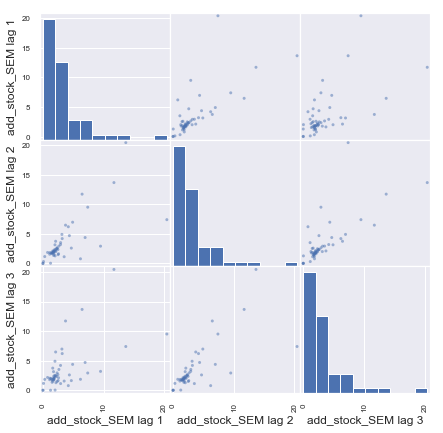

In [502]:
import matplotlib
from pandas.plotting import scatter_matrix
scatter_matrix(df_audio_distlag[['add_stock_SEM lag 1', 'add_stock_SEM lag 2', 'add_stock_SEM lag 3']], 
                  figsize = (7,7))
plt.show()

#### Remarks: All scatter plots will tend to behave same. Linear but with skedacticity (high variance)

#### Remarks:
1. We already checked in the auto correlation graph that GMV has decreasing with lag GMV
2. We cannot expect any substantial model difference due to lags because the correlations are not so highlighting

### Modeling


#### Train-Test Split and Scaling

In [503]:
X_train_distlag,y_train_distlag,X_test_distlag,y_test_distlag = split_scale_feature(df_audio_distlag)

In [504]:
X_train_distlag.shape

(37, 127)

#### Recursive Feature Elimination
1. With only 37 rows, I cannot efford to have more than 1/3rd the features to get good models
2. For this reason, we still keep `our rfe at 30`

In [505]:
X_train_distlag_iter0 = rfe_function(X_train_distlag,y_train_distlag,30)

#### Model Building using StatsModel 

In [506]:
# Results of stats model iteration - 1
X_train_column_list, model_iter1, summary, VIF = statsmodel_vif(X_train_distlag_iter0,y_train,[])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                     4779.
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           4.98e-11
Time:                        19:41:02   Log-Likelihood:                 196.94
No. Observations:                  37   AIC:                            -331.9
Df Residuals:                       6   BIC:                            -281.9
Df Model:                          30                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

,Features,VIF
1,units,816.10000
0,const,785.49000
11,add_stock_SEM,686.69000
2,product_mrp,478.04000
8,add_stock_digital,334.90000
9,add_stock_content,162.09000
30,add_stock_affiliates lag 1,129.71000
10,add_stock_affiliates,94.32000
23,Heat Deg Days (°C) lag 1,93.42000
5,Max Temp (°C),89.18000


#### Remarks: 
1. rfe captured quite a number of lag variables. Let us see how model turns out
2. As step 1, we will drop all columns with high VIF and P Value first
3. Each column from different feature set at a time
4. We are dropping `product_mrp` first

In [507]:
# Results of stats model iteration - 2
X_train_column_list, model_iter2, summary, VIF = statsmodel_vif(X_train_distlag_iter0,y_train_distlag,
                                                                ['product_mrp'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.997
Method:                 Least Squares   F-statistic:                     411.0
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           6.45e-09
Time:                        19:41:09   Log-Likelihood:                 148.08
No. Observations:                  37   AIC:                            -236.2
Df Residuals:                       7   BIC:                            -187.8
Df Model:                          29                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,767.92000
10,add_stock_SEM,685.79000
7,add_stock_digital,289.48000
1,units,221.71000
8,add_stock_content,154.28000
29,add_stock_affiliates lag 1,113.21000
9,add_stock_affiliates,91.39000
4,Max Temp (°C),85.93000
27,add_stock_sponsorship lag 1,44.16000
12,discount_rate lag 1,42.58000


#### Remarks:
1. Let us remove one from add stocks
2. We are dropping `Max Temp (°C)` since it has both VIF 

In [508]:
# Results of stats model iteration - 4
X_train_column_list, model_iter4, summary, VIF = statsmodel_vif(X_train_distlag_iter0,y_train_distlag,
                                                                ['Max Temp (°C)'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.997
Method:                 Least Squares   F-statistic:                     376.2
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           7.83e-10
Time:                        19:41:15   Log-Likelihood:                 143.33
No. Observations:                  37   AIC:                            -228.7
Df Residuals:                       8   BIC:                            -181.9
Df Model:                          28                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,693.17000
9,add_stock_SEM,675.01000
6,add_stock_digital,282.32000
7,add_stock_content,142.57000
1,units,119.31000
8,add_stock_affiliates,80.14000
28,add_stock_affiliates lag 1,77.44000
15,Product Premiumness_0 lag 3,32.65000
11,discount_rate lag 1,32.15000
26,add_stock_sponsorship lag 1,29.44000


#### Remarks:
1. We are starting off with the second iteration of values.
2. Let us drop `add_stock_SEM` which has high VIF

In [509]:
# Results of stats model iteration - 5
X_train_column_list, model_iter5, summary, VIF = statsmodel_vif(X_train_distlag_iter0,y_train_distlag,
                                                                ['add_stock_SEM'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.996
Method:                 Least Squares   F-statistic:                     351.6
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           9.74e-11
Time:                        19:41:23   Log-Likelihood:                 139.23
No. Observations:                  37   AIC:                            -222.5
Df Residuals:                       9   BIC:                            -177.4
Df Model:                          27                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,606.70000
1,units,117.07000
27,add_stock_affiliates lag 1,64.15000
7,add_stock_content,54.68000
6,add_stock_digital,54.49000
8,add_stock_affiliates,54.14000
10,discount_rate lag 1,30.30000
14,Product Premiumness_0 lag 3,30.27000
15,Product Premiumness_1 lag 2,26.93000
25,add_stock_sponsorship lag 1,26.27000


#### Remarks:
1. Let us drop `add_stock_digital lag 3` which has large collinearity that we can check through VIF


In [510]:
# Results of stats model iteration - 6
X_train_column_list, model_iter6, summary, VIF = statsmodel_vif(X_train_distlag_iter0,y_train_distlag,
                                                                ['add_stock_digital lag 3'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.997
Method:                 Least Squares   F-statistic:                     403.6
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           4.79e-12
Time:                        19:41:33   Log-Likelihood:                 139.13
No. Observations:                  37   AIC:                            -224.3
Df Residuals:                      10   BIC:                            -180.8
Df Model:                          26                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,606.70000
1,units,97.15000
26,add_stock_affiliates lag 1,62.79000
7,add_stock_content,54.12000
8,add_stock_affiliates,53.42000
6,add_stock_digital,50.72000
14,Product Premiumness_0 lag 3,30.26000
10,discount_rate lag 1,30.24000
24,add_stock_sponsorship lag 1,26.25000
15,Product Premiumness_1 lag 2,25.77000


#### Remarks:
1. `add_stock_online lag 3` has high P Value


In [511]:
# Results of stats model iteration - 7
X_train_column_list, model_iter7, summary, VIF = statsmodel_vif(X_train_distlag_iter0,y_train_distlag,
                                                                ['add_stock_online lag 3'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.997
Method:                 Least Squares   F-statistic:                     459.8
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           2.21e-13
Time:                        19:41:44   Log-Likelihood:                 139.05
No. Observations:                  37   AIC:                            -226.1
Df Residuals:                      11   BIC:                            -184.2
Df Model:                          25                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,449.80000
1,units,80.07000
8,add_stock_affiliates,53.14000
6,add_stock_digital,50.12000
7,add_stock_content,50.02000
25,add_stock_affiliates lag 1,39.68000
10,discount_rate lag 1,28.03000
14,Product Premiumness_0 lag 3,21.58000
5,NPS,19.20000
15,Product Premiumness_1 lag 2,18.26000


#### Remarks:
1. Let us drop `discount_rate` due to high P Value

In [512]:
# Results of stats model iteration - 8
X_train_column_list, model_iter8, summary, VIF = statsmodel_vif(X_train_distlag_iter0,y_train_distlag,
                                                                ['discount_rate'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.997
Method:                 Least Squares   F-statistic:                     509.6
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.09e-14
Time:                        19:41:54   Log-Likelihood:                 138.59
No. Observations:                  37   AIC:                            -227.2
Df Residuals:                      12   BIC:                            -186.9
Df Model:                          24                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,117.06000
1,units,77.07000
5,add_stock_digital,44.14000
6,add_stock_content,43.59000
24,add_stock_affiliates lag 1,37.86000
7,add_stock_affiliates,31.16000
9,discount_rate lag 1,25.07000
13,Product Premiumness_0 lag 3,21.55000
14,Product Premiumness_1 lag 2,18.08000
23,add_stock_sponsorship lag 1,16.59000


#### Remarks:
1. Let us drop `Total Precip (mm)` due to high P Value

In [513]:
# Results of stats model iteration - 9
X_train_column_list, model_iter9, summary, VIF = statsmodel_vif(X_train_distlag_iter0,y_train_distlag,
                                                                ['Total Precip (mm)'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.997
Method:                 Least Squares   F-statistic:                     555.6
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           5.56e-16
Time:                        19:42:05   Log-Likelihood:                 137.93
No. Observations:                  37   AIC:                            -227.9
Df Residuals:                      13   BIC:                            -189.2
Df Model:                          23                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,106.90000
1,units,56.46000
4,add_stock_digital,43.30000
5,add_stock_content,39.58000
23,add_stock_affiliates lag 1,33.99000
6,add_stock_affiliates,28.66000
12,Product Premiumness_0 lag 3,20.37000
8,discount_rate lag 1,19.01000
13,Product Premiumness_1 lag 2,17.22000
22,add_stock_sponsorship lag 1,16.47000


#### Remarks:
1. `add_stock_content` has the high P Value.
4. Let us drop `add_stock_content`

In [514]:
# Results of stats model iteration - 10
X_train_column_list, model_iter10, summary, VIF = statsmodel_vif(X_train_distlag_iter0,y_train_distlag,
                                                                 ['add_stock_content'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.997
Method:                 Least Squares   F-statistic:                     625.5
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           2.16e-17
Time:                        19:42:14   Log-Likelihood:                 137.92
No. Observations:                  37   AIC:                            -229.8
Df Residuals:                      14   BIC:                            -192.8
Df Model:                          22                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,103.77000
1,units,52.34000
22,add_stock_affiliates lag 1,32.69000
5,add_stock_affiliates,26.08000
4,add_stock_digital,20.69000
11,Product Premiumness_0 lag 3,19.44000
7,discount_rate lag 1,18.55000
21,add_stock_sponsorship lag 1,16.47000
12,Product Premiumness_1 lag 2,16.08000
3,NPS,10.78000


#### Remarks:
1. Let us drop `discount_rate lag 1` which has high P Value

In [515]:
# Results of stats model iteration - 11
X_train_column_list, model_iter11, summary, VIF = statsmodel_vif(X_train_distlag_iter0,y_train_distlag,
                                                                 ['discount_rate lag 1'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.997
Method:                 Least Squares   F-statistic:                     579.3
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           3.34e-18
Time:                        19:42:23   Log-Likelihood:                 134.37
No. Observations:                  37   AIC:                            -224.7
Df Residuals:                      15   BIC:                            -189.3
Df Model:                          21                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,103.22000
21,add_stock_affiliates lag 1,27.72000
1,units,25.73000
10,Product Premiumness_0 lag 3,17.52000
20,add_stock_sponsorship lag 1,14.90000
4,add_stock_digital,13.79000
11,Product Premiumness_1 lag 2,11.79000
3,NPS,10.74000
12,Product Premiumness_1 lag 3,10.27000
15,Mean Temp (°C) lag 2,9.50000


#### Remarks:
1. `Product Premiumness_0 lag 1` has consistently high P Value and increasing too
2. Let us drop `Product Premiumness_0 lag 1`

In [516]:
# Results of stats model iteration - 12
X_train_column_list, model_iter12, summary, VIF = statsmodel_vif(X_train_distlag_iter0,y_train_distlag,
                                                                 ['Product Premiumness_0 lag 1'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.997
Method:                 Least Squares   F-statistic:                     647.2
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.30e-19
Time:                        19:42:32   Log-Likelihood:                 134.33
No. Observations:                  37   AIC:                            -226.7
Df Residuals:                      16   BIC:                            -192.8
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,100.14000
1,units,25.26000
20,add_stock_affiliates lag 1,21.53000
9,Product Premiumness_0 lag 3,13.71000
19,add_stock_sponsorship lag 1,13.43000
4,add_stock_digital,13.31000
3,NPS,9.73000
14,Mean Temp (°C) lag 2,9.33000
10,Product Premiumness_1 lag 2,9.31000
16,Cool Deg Days (°C) lag 1,7.92000


#### Remarks:
1. Let us look at weather features again
2. `add_stock_affiliates lag 1	` has high P Value
3. Let us drop `add_stock_affiliates lag 1	`

In [517]:
# Results of stats model iteration - 13
X_train_column_list, model_iter13, summary, VIF = statsmodel_vif(X_train_distlag_iter0,y_train_distlag,
                                                                 ['add_stock_affiliates lag 1'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.997
Model:                            OLS   Adj. R-squared:                  0.994
Method:                 Least Squares   F-statistic:                     336.6
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           3.08e-18
Time:                        19:42:42   Log-Likelihood:                 120.19
No. Observations:                  37   AIC:                            -200.4
Df Residuals:                      17   BIC:                            -168.2
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,80.66000
1,units,20.92000
4,add_stock_digital,12.80000
9,Product Premiumness_0 lag 3,9.36000
16,Cool Deg Days (°C) lag 1,7.88000
10,Product Premiumness_1 lag 2,7.37000
19,add_stock_sponsorship lag 1,7.14000
15,Heat Deg Days (°C) lag 1,7.08000
3,NPS,6.78000
14,Mean Temp (°C) lag 2,6.30000


#### Remarks:
2. Let us drop `NPS` for high P Value

In [518]:
# Results of stats model iteration - 14
X_train_column_list, model_iter14, summary, VIF = statsmodel_vif(X_train_distlag_iter0,y_train_distlag,
                                                                 ['NPS'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.997
Model:                            OLS   Adj. R-squared:                  0.994
Method:                 Least Squares   F-statistic:                     362.1
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           2.17e-19
Time:                        19:42:51   Log-Likelihood:                 119.48
No. Observations:                  37   AIC:                            -201.0
Df Residuals:                      18   BIC:                            -170.4
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,34.31000
1,units,12.50000
3,add_stock_digital,9.65000
8,Product Premiumness_0 lag 3,9.29000
14,Heat Deg Days (°C) lag 1,6.95000
9,Product Premiumness_1 lag 2,6.63000
13,Mean Temp (°C) lag 2,6.28000
15,Cool Deg Days (°C) lag 1,6.27000
10,Product Premiumness_1 lag 3,4.85000
6,delivery_time_status_early delivery lag 3,4.32000


##### Dropping add_stock_digital

In [519]:
# Results of stats model iteration - 15
X_train_column_list, model_iter15, summary, VIF = statsmodel_vif(X_train_distlag_iter0,y_train_distlag,
                                                                 ['add_stock_digital'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.997
Model:                            OLS   Adj. R-squared:                  0.995
Method:                 Least Squares   F-statistic:                     404.0
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.07e-20
Time:                        19:43:01   Log-Likelihood:                 119.45
No. Observations:                  37   AIC:                            -202.9
Df Residuals:                      19   BIC:                            -173.9
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,34.23000
13,Heat Deg Days (°C) lag 1,6.88000
7,Product Premiumness_0 lag 3,6.46000
14,Cool Deg Days (°C) lag 1,6.02000
12,Mean Temp (°C) lag 2,5.94000
9,Product Premiumness_1 lag 3,4.74000
5,delivery_time_status_early delivery lag 3,4.28000
8,Product Premiumness_1 lag 2,4.19000
1,units,3.93000
3,add_stock_affiliates,3.61000


#### Remarks: `Heat Deg Days (°C) lag 2` is dropped next due to high P Value

In [520]:
# Results of stats model iteration - 16
X_train_column_list, model_iter16, summary, VIF = statsmodel_vif(X_train_distlag_iter0,y_train_distlag,
                                                                 ['Heat Deg Days (°C) lag 1'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.990
Model:                            OLS   Adj. R-squared:                  0.981
Method:                 Least Squares   F-statistic:                     119.5
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           2.57e-16
Time:                        19:43:06   Log-Likelihood:                 94.989
No. Observations:                  37   AIC:                            -156.0
Df Residuals:                      20   BIC:                            -128.6
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,34.19000
13,Cool Deg Days (°C) lag 1,5.13000
12,Mean Temp (°C) lag 2,4.48000
5,delivery_time_status_early delivery lag 3,4.22000
1,units,3.93000
9,Product Premiumness_1 lag 3,3.71000
3,add_stock_affiliates,3.61000
7,Product Premiumness_0 lag 3,3.49000
6,delivery_time_status_on time lag 3,2.98000
15,add_stock_digital lag 2,2.85000


#### Remarks: 
Let us drop `delivery_time_status_on time lag 3` due to high P Value

In [521]:
# Results of stats model iteration - 17
X_train_column_list, model_iter17, summary, VIF = statsmodel_vif(X_train_distlag_iter0,y_train_distlag,
                                                                 ['delivery_time_status_on time lag 3'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.990
Model:                            OLS   Adj. R-squared:                  0.982
Method:                 Least Squares   F-statistic:                     133.3
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           2.25e-17
Time:                        19:43:16   Log-Likelihood:                 94.915
No. Observations:                  37   AIC:                            -157.8
Df Residuals:                      21   BIC:                            -132.1
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,34.18000
12,Cool Deg Days (°C) lag 1,5.13000
11,Mean Temp (°C) lag 2,4.20000
5,delivery_time_status_early delivery lag 3,4.02000
1,units,3.65000
3,add_stock_affiliates,3.56000
6,Product Premiumness_0 lag 3,3.21000
8,Product Premiumness_1 lag 3,2.93000
7,Product Premiumness_1 lag 2,2.80000
14,add_stock_digital lag 2,2.64000


#### Remarks:
let us drop `add_stock_affiliates` due to high P Value

In [522]:
# Results of stats model iteration - 18
X_train_column_list, model_iter18, summary, VIF = statsmodel_vif(X_train_distlag_iter0,y_train_distlag,
                                                                 ['add_stock_affiliates'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.990
Model:                            OLS   Adj. R-squared:                  0.983
Method:                 Least Squares   F-statistic:                     148.2
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.97e-18
Time:                        19:43:25   Log-Likelihood:                 94.742
No. Observations:                  37   AIC:                            -159.5
Df Residuals:                      22   BIC:                            -135.3
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,34.16000
11,Cool Deg Days (°C) lag 1,4.81000
10,Mean Temp (°C) lag 2,3.82000
4,delivery_time_status_early delivery lag 3,3.47000
5,Product Premiumness_0 lag 3,3.20000
7,Product Premiumness_1 lag 3,2.82000
1,units,2.79000
6,Product Premiumness_1 lag 2,2.79000
13,add_stock_digital lag 2,2.16000
12,Stock Index lag 1,2.13000


#### Let us drop `Cool Deg Days (°C) lag 1` due to high P Value

In [523]:
# Results of stats model iteration - 19
X_train_column_list, model_iter19, summary, VIF = statsmodel_vif(X_train_distlag_iter0,y_train_distlag,
                                                                 ['Cool Deg Days (°C) lag 1'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.989
Model:                            OLS   Adj. R-squared:                  0.984
Method:                 Least Squares   F-statistic:                     166.5
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.53e-19
Time:                        19:43:34   Log-Likelihood:                 94.695
No. Observations:                  37   AIC:                            -161.4
Df Residuals:                      23   BIC:                            -138.8
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,34.12000
4,delivery_time_status_early delivery lag 3,3.22000
5,Product Premiumness_0 lag 3,3.17000
7,Product Premiumness_1 lag 3,2.77000
6,Product Premiumness_1 lag 2,2.62000
1,units,2.23000
10,Mean Temp (°C) lag 2,2.17000
12,add_stock_digital lag 2,2.07000
11,Stock Index lag 1,2.00000
8,Product Premiumness_2 lag 1,1.90000


#### Remarks:
Let us drop `pay_day lag 2` due to high P Value

In [524]:
# Results of stats model iteration - 20
X_train_column_list, model_iter20, summary, VIF = statsmodel_vif(X_train_distlag_iter0,y_train_distlag,
                                                                 ['pay_day lag 2'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.989
Model:                            OLS   Adj. R-squared:                  0.983
Method:                 Least Squares   F-statistic:                     178.1
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           2.07e-20
Time:                        19:43:46   Log-Likelihood:                 93.685
No. Observations:                  37   AIC:                            -161.4
Df Residuals:                      24   BIC:                            -140.4
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,34.12000
4,Product Premiumness_0 lag 3,2.96000
3,delivery_time_status_early delivery lag 3,2.83000
6,Product Premiumness_1 lag 3,2.72000
5,Product Premiumness_1 lag 2,2.62000
1,units,2.01000
10,Stock Index lag 1,1.99000
9,Mean Temp (°C) lag 2,1.89000
11,add_stock_digital lag 2,1.82000
2,special_sale_dates,1.80000


#### Remarks: Drop `add_stock_digital lag 2` for high P Value

In [525]:
# Results of stats model iteration - 21
X_train_column_list, model_iter21, summary, VIF = statsmodel_vif(X_train_distlag_iter0,y_train_distlag,
                                                                 ['add_stock_digital lag 2'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.989
Model:                            OLS   Adj. R-squared:                  0.984
Method:                 Least Squares   F-statistic:                     201.7
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.47e-21
Time:                        19:43:53   Log-Likelihood:                 93.625
No. Observations:                  37   AIC:                            -163.2
Df Residuals:                      25   BIC:                            -143.9
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,33.96000
4,Product Premiumness_0 lag 3,2.71000
5,Product Premiumness_1 lag 2,2.61000
6,Product Premiumness_1 lag 3,2.57000
3,delivery_time_status_early delivery lag 3,2.17000
1,units,1.99000
10,Stock Index lag 1,1.98000
2,special_sale_dates,1.68000
9,Mean Temp (°C) lag 2,1.68000
11,add_stock_sponsorship lag 1,1.61000


#### Remarks: Drop `Product Premiumness_2 lag 3` for high P


In [526]:
# Results of stats model iteration - 22
X_train_column_list, model_iter22, summary, VIF = statsmodel_vif(X_train_distlag_iter0,y_train_distlag,
                                                                 ['Product Premiumness_2 lag 3'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.989
Model:                            OLS   Adj. R-squared:                  0.984
Method:                 Least Squares   F-statistic:                     228.8
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.04e-22
Time:                        19:44:03   Log-Likelihood:                 93.470
No. Observations:                  37   AIC:                            -164.9
Df Residuals:                      26   BIC:                            -147.2
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,33.67000
4,Product Premiumness_0 lag 3,2.69000
5,Product Premiumness_1 lag 2,2.58000
6,Product Premiumness_1 lag 3,2.50000
1,units,1.99000
9,Stock Index lag 1,1.95000
3,delivery_time_status_early delivery lag 3,1.94000
2,special_sale_dates,1.65000
10,add_stock_sponsorship lag 1,1.60000
8,Mean Temp (°C) lag 2,1.56000


#### Remarks Drop `Product Premiumness_2 lag 1`

In [527]:
# Results of stats model iteration - 23
X_train_column_list, model_iter23, summary, VIF = statsmodel_vif(X_train_distlag_iter0,y_train_distlag,
                                                                 ['Product Premiumness_2 lag 1'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.988
Model:                            OLS   Adj. R-squared:                  0.985
Method:                 Least Squares   F-statistic:                     255.2
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           9.64e-24
Time:                        19:44:12   Log-Likelihood:                 92.853
No. Observations:                  37   AIC:                            -165.7
Df Residuals:                      27   BIC:                            -149.6
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,33.65000
4,Product Premiumness_0 lag 3,2.69000
5,Product Premiumness_1 lag 2,2.54000
6,Product Premiumness_1 lag 3,2.37000
8,Stock Index lag 1,1.94000
3,delivery_time_status_early delivery lag 3,1.80000
1,units,1.72000
9,add_stock_sponsorship lag 1,1.60000
7,Mean Temp (°C) lag 2,1.53000
2,special_sale_dates,1.52000


#### Remarks Drop `delivery_time_status_early delivery lag 3` for high P

In [528]:
# Results of stats model iteration - 24
X_train_column_list, model_iter24, summary, VIF = statsmodel_vif(X_train_distlag_iter0,y_train_distlag,
                                                                 ['delivery_time_status_early delivery lag 3'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.988
Model:                            OLS   Adj. R-squared:                  0.985
Method:                 Least Squares   F-statistic:                     295.1
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           6.09e-25
Time:                        19:44:21   Log-Likelihood:                 92.685
No. Observations:                  37   AIC:                            -167.4
Df Residuals:                      28   BIC:                            -152.9
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                                  coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
const             

,Features,VIF
0,const,33.62000
4,Product Premiumness_1 lag 2,2.53000
3,Product Premiumness_0 lag 3,2.31000
5,Product Premiumness_1 lag 3,2.20000
7,Stock Index lag 1,1.91000
1,units,1.59000
2,special_sale_dates,1.50000
8,add_stock_sponsorship lag 1,1.46000
6,Mean Temp (°C) lag 2,1.43000


#### Let us drop stock index lag 1

In [529]:
# Results of stats model iteration - 25
X_train_column_list, model_iter25, summary, VIF = statsmodel_vif(X_train_distlag_iter0,y_train_distlag,
                                                                 ['Stock Index lag 1'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.988
Model:                            OLS   Adj. R-squared:                  0.985
Method:                 Least Squares   F-statistic:                     346.4
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           3.51e-26
Time:                        19:44:30   Log-Likelihood:                 92.532
No. Observations:                  37   AIC:                            -169.1
Df Residuals:                      29   BIC:                            -156.2
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                                  coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
const             

,Features,VIF
0,const,19.36000
4,Product Premiumness_1 lag 2,2.51000
3,Product Premiumness_0 lag 3,2.15000
5,Product Premiumness_1 lag 3,1.85000
1,units,1.52000
2,special_sale_dates,1.48000
7,add_stock_sponsorship lag 1,1.45000
6,Mean Temp (°C) lag 2,1.35000


In [530]:
### Let us drop 


# Results of stats model iteration - 25
X_train_column_list, model_iter25, summary, VIF = statsmodel_vif(X_train_distlag_iter0,y_train_distlag,
                                                                 ['Mean Temp (°C) lag 2'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.987
Model:                            OLS   Adj. R-squared:                  0.985
Method:                 Least Squares   F-statistic:                     389.1
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           4.71e-27
Time:                        19:44:38   Log-Likelihood:                 91.223
No. Observations:                  37   AIC:                            -168.4
Df Residuals:                      30   BIC:                            -157.2
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                                  coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
const             

,Features,VIF
0,const,19.35000
4,Product Premiumness_1 lag 2,2.51000
3,Product Premiumness_0 lag 3,2.06000
5,Product Premiumness_1 lag 3,1.73000
1,units,1.49000
6,add_stock_sponsorship lag 1,1.42000
2,special_sale_dates,1.39000


In [531]:
## Let us drop Product Premiumness_1 lag 3 for high P

In [532]:
# Results of stats model iteration - 25
X_train_column_list, model_iter25, summary, VIF = statsmodel_vif(X_train_distlag_iter0,y_train_distlag,
                                                                 ['Product Premiumness_1 lag 3'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.987
Model:                            OLS   Adj. R-squared:                  0.985
Method:                 Least Squares   F-statistic:                     463.0
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           3.80e-28
Time:                        19:44:46   Log-Likelihood:                 90.469
No. Observations:                  37   AIC:                            -168.9
Df Residuals:                      31   BIC:                            -159.3
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                                  coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
const             

,Features,VIF
0,const,14.27000
3,Product Premiumness_0 lag 3,1.54000
4,Product Premiumness_1 lag 2,1.51000
1,units,1.48000
2,special_sale_dates,1.39000
5,add_stock_sponsorship lag 1,1.25000


In [533]:
# Results of stats model iteration - 25
X_train_column_list, model_iter25, summary, VIF = statsmodel_vif(X_train_distlag_iter0,y_train_distlag,
                                                                 ['Product Premiumness_0 lag 3'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.986
Model:                            OLS   Adj. R-squared:                  0.984
Method:                 Least Squares   F-statistic:                     566.6
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           3.34e-29
Time:                        19:44:53   Log-Likelihood:                 89.503
No. Observations:                  37   AIC:                            -169.0
Df Residuals:                      32   BIC:                            -161.0
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                                  coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
const             

,Features,VIF
0,const,12.90000
1,units,1.48000
2,special_sale_dates,1.39000
4,add_stock_sponsorship lag 1,1.11000
3,Product Premiumness_1 lag 2,1.04000


In [538]:
### We will drop premiumness lag 2 due to high P Value
X_train_column_list, model_iter25, summary, VIF = statsmodel_vif(X_train_distlag_iter0,y_train_distlag,
                                                                 ['Product Premiumness_1 lag 2'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.986
Model:                            OLS   Adj. R-squared:                  0.984
Method:                 Least Squares   F-statistic:                     749.1
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           2.07e-30
Time:                        19:46:46   Log-Likelihood:                 88.787
No. Observations:                  37   AIC:                            -169.6
Df Residuals:                      33   BIC:                            -163.1
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                                  coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
const             

,Features,VIF
0,const,3.83000
1,units,1.47000
2,special_sale_dates,1.38000
3,add_stock_sponsorship lag 1,1.08000


#### Remarks
1. `<0.05` signifies 95% confidance of feature importance and we achieved that
2. In our case, we have very less data as small as 37 points to model the data
3. We considered VIF < 10 as a stop point. Due to less data, otherwise model is too sensitive and P Values change drastically
5. So let us stop modeling here

__Important:__ __We successfully maintained the R Square and Adjusted R Square Scores__

#### 13.3 Residual Analysis of Train Test Data

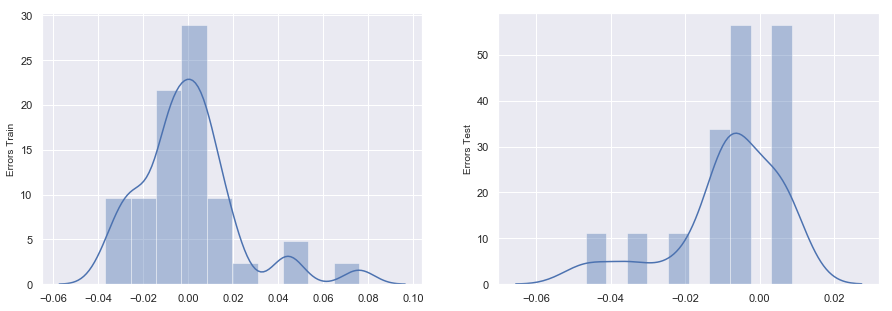

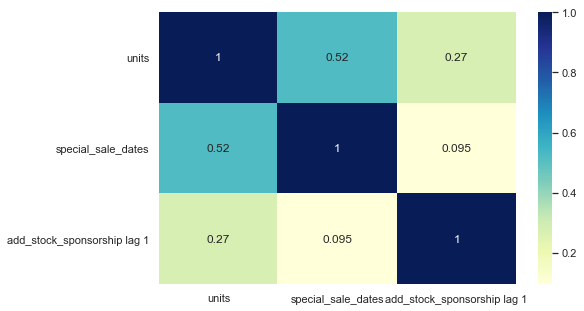

                    0
train r score 0.98553
test r score  0.97565
                 0
rmse_train 0.02196
rmse_test  0.01677


In [539]:
y_train_real_pred, y_test_real_pred, r2_dataframe, rmse_dataframe = predictions_and_residual_analysis_and_rscore(X_train_distlag_iter0, 
                                                                                                 y_train_distlag,
                                                                                                 X_test_distlag,
                                                                                                 y_test_distlag,
                                                                                                 model_iter25)
print(r2_dataframe)
print(rmse_dataframe)

#### Remarks: Train  Test R Square Scores as well as rmse are good. Bu tother models are much better

### Elasticity of  `GMV` (Revenue)
As per economics, elasticity is the measure of how sensitive dependent variable (in our case, revenue) is to a particular independent variable.

<h3><center> $Elasticity_{gmv} = \frac{\frac{\delta{GMV}}{GMV}}{\frac{\delta{feature}}{feature}} $</centre> </h3>


while plotting elasticity, we will know,
1. Whether GMV is directly or indirectly propostional to a particular feature
2. How varying the dependency is?
3. Where exactly the dependency is? and such



Let us look at the elasticity of revenue with our predictors

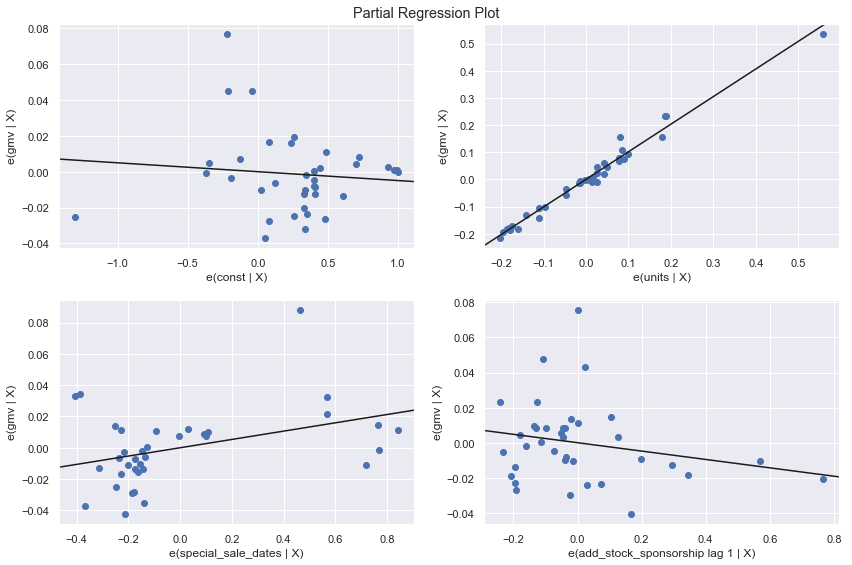

In [540]:
fig = plt.figure(figsize=(12,8))
fig = sm.graphics.plot_partregress_grid(model_iter25, fig=fig)

### Remarks:
It is evident that,
1. Units is explaining the increase in sales ans others hold no meaning.
2. This suggest that model is not efficient one to work with

### Model - 5: Multiplicative Distributed Lag Model
1. Distributed Lag Model is nothing but lag model with lags from both features (X) as well as response variables (Y)
2. In our use case, we will `try and choose the lag distinctly for each feature`
3. In order to do that let us `compute cross correlation between the variables and GMV`

#### Multiplicative Distributed Lag Model - Audio Data

In [542]:
df_audio_distlag.shape

(53, 128)

###  Univariate and Bivariate Analysis of Lag Data
1. The analysis for all other features was essentially done while performing `linear regression`
2. We will perform the similar analysis for only lags with GMV in this problem
3. This analysis is typically performed for continuous features only. So we choose only a few features to do it
4. Selected features include `gmv`, `discount_rate`, `All add stocks`

#### Any Plot we make wont actually look good with so many values. We are ignoring Box and Scatter Plots for these

####  Box Plots: To check Outliers

#### Correlation Charts (Bivariate Relationship among Lag data) 
1. We already did lag correlations in the distributed lag model. Here everything will be same. So we do not look at heat map

### Modeling


In [543]:
df_audio_mult_distlag = log_transformation(df_audio_distlag)

#### Train-Test Split and Scaling

In [544]:
X_train_mult_distlag,y_train_mult_distlag,X_test_mult_distlag,y_test_mult_distlag = split_scale_feature(df_audio_mult_distlag)

In [545]:
X_train_mult_distlag.shape

(37, 127)

####  Recursive Feature Elimination
1. With only 37 rows, I cannot efford to have more than 1/3rd the features to get good models
2. For this reason, we still keep `our rfe at 30`

In [546]:
X_train_mult_distlag_iter0 = rfe_function(X_train_mult_distlag,y_train_mult_distlag,30)

####  Model Building using StatsModel 

In [547]:
# Results of stats model iteration - 1
X_train_column_list, model_iter1, summary, VIF = statsmodel_vif(X_train_mult_distlag_iter0,y_train,[])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.954
Model:                            OLS   Adj. R-squared:                  0.724
Method:                 Least Squares   F-statistic:                     4.142
Date:                Mon, 23 Dec 2019   Prob (F-statistic):             0.0409
Time:                        19:49:46   Log-Likelihood:                 67.370
No. Observations:                  37   AIC:                            -72.74
Df Residuals:                       6   BIC:                            -22.80
Df Model:                          30                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

,Features,VIF
2,product_mrp,17051.51000
1,units,12807.81000
0,const,9303.48000
8,Product Premiumness_0,2352.71000
6,s1_fact.order_payment_type_COD,471.74000
15,add_stock_affiliates,301.83000
14,add_stock_content,222.68000
18,discount_rate lag 3,222.33000
9,Product Premiumness_1,206.15000
29,add_stock_content lag 2,204.75000


#### Remarks: 
1. rfe captured quite a number of lag variables. Let us see how model turns out
2. As step 1, we will drop all columns with high VIF and P Value first
3. Each column from different feature set at a time
4. We are dropping `product_mrp` first

In [548]:
# Results of stats model iteration - 2
X_train_column_list, model_iter2, summary, VIF = statsmodel_vif(X_train_mult_distlag_iter0,y_train_mult_distlag,
                                                                ['product_mrp'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                     6593.
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           3.93e-13
Time:                        19:49:50   Log-Likelihood:                 192.48
No. Observations:                  37   AIC:                            -325.0
Df Residuals:                       7   BIC:                            -276.6
Df Model:                          29                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,4136.85000
1,units,621.34000
14,add_stock_affiliates,276.60000
5,s1_fact.order_payment_type_COD,233.80000
7,Product Premiumness_0,171.10000
13,add_stock_content,158.28000
8,Product Premiumness_1,116.56000
12,add_stock_sponsorship,107.03000
6,s1_fact.order_payment_type_Prepaid,85.73000
28,add_stock_content lag 2,84.09000


#### Remarks: 
1. In the iteration, we will drop `add_stock_affiliates` which has both high VIF as well as P Value

In [549]:
# Results of stats model iteration - 3
X_train_column_list, model_iter3, summary, VIF = statsmodel_vif(X_train_mult_distlag_iter0,y_train_mult_distlag,
                                                                ['add_stock_affiliates'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                     7414.
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           5.25e-15
Time:                        19:49:54   Log-Likelihood:                 191.53
No. Observations:                  37   AIC:                            -325.1
Df Residuals:                       8   BIC:                            -278.3
Df Model:                          28                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,4104.88000
1,units,377.64000
5,s1_fact.order_payment_type_COD,206.98000
7,Product Premiumness_0,158.44000
8,Product Premiumness_1,114.66000
12,add_stock_sponsorship,106.61000
13,add_stock_content,93.03000
6,s1_fact.order_payment_type_Prepaid,81.97000
27,add_stock_content lag 2,71.89000
4,delivery_time_status_on time,70.48000


#### Remarks:
1. Let us remove one from add stocks
2. We are dropping `s1_fact.order_payment_type_COD` since it has both VIF 

In [551]:
# Results of stats model iteration - 4
X_train_column_list, model_iter4, summary, VIF = statsmodel_vif(X_train_mult_distlag_iter0,y_train_mult_distlag,
                                                                ['s1_fact.order_payment_type_COD'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                     5834.
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           3.20e-16
Time:                        19:50:20   Log-Likelihood:                 184.24
No. Observations:                  37   AIC:                            -312.5
Df Residuals:                       9   BIC:                            -267.4
Df Model:                          27                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,4086.42000
1,units,147.61000
6,Product Premiumness_0,106.39000
11,add_stock_sponsorship,105.70000
12,add_stock_content,93.03000
7,Product Premiumness_1,92.45000
27,add_stock_online lag 2,65.65000
26,add_stock_content lag 2,61.96000
15,discount_rate lag 3,50.47000
2,discount_rate,43.85000


#### Remarks:
1. Now let us remove a mult_distlag variable
2. `add_stock_sponsorship	` has both high P-Value and well has slightly high VIF.
3. Let us drop `add_stock_sponsorship	`

In [552]:
# Results of stats model iteration - 5
X_train_column_list, model_iter5, summary, VIF = statsmodel_vif(X_train_mult_distlag_iter0,y_train_mult_distlag,
                                                                ['add_stock_sponsorship'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                     6218.
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           5.60e-18
Time:                        19:51:38   Log-Likelihood:                 182.78
No. Observations:                  37   AIC:                            -311.6
Df Residuals:                      10   BIC:                            -268.1
Df Model:                          26                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,3989.73000
1,units,134.21000
6,Product Premiumness_0,99.73000
7,Product Premiumness_1,81.84000
26,add_stock_online lag 2,65.36000
14,discount_rate lag 3,49.88000
2,discount_rate,43.72000
4,delivery_time_status_on time,36.85000
25,add_stock_content lag 2,36.16000
11,add_stock_content,29.66000


#### Remarks:
1. We are starting off with the second iteration of values.
2. Let us drop `Product Premiumness_0` which has high VIF

In [554]:
# Results of stats model iteration - 5
X_train_column_list, model_iter5, summary, VIF = statsmodel_vif(X_train_mult_distlag_iter0,y_train_mult_distlag,
                                                                ['Product Premiumness_0'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.997
Method:                 Least Squares   F-statistic:                     534.2
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           9.70e-14
Time:                        19:52:14   Log-Likelihood:                 134.89
No. Observations:                  37   AIC:                            -217.8
Df Residuals:                      11   BIC:                            -175.9
Df Model:                          25                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,1546.60000
1,units,126.41000
25,add_stock_online lag 2,54.78000
13,discount_rate lag 3,49.48000
6,Product Premiumness_1,43.65000
24,add_stock_content lag 2,33.51000
10,add_stock_content,29.57000
23,add_stock_sponsorship lag 3,28.70000
4,delivery_time_status_on time,23.55000
11,gmv lag 2,20.64000


#### Remarks:
1. Let us drop `add_stock_online lag 2` which has large collinearity that we can check through VIF


In [556]:
# Results of stats model iteration - 6
X_train_column_list, model_iter6, summary, VIF = statsmodel_vif(X_train_mult_distlag_iter0,y_train_mult_distlag,
                                                                ['add_stock_online lag 2'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.997
Method:                 Least Squares   F-statistic:                     457.5
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           2.07e-14
Time:                        19:52:47   Log-Likelihood:                 129.67
No. Observations:                  37   AIC:                            -209.3
Df Residuals:                      12   BIC:                            -169.1
Df Model:                          24                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,1519.72000
1,units,119.90000
6,Product Premiumness_1,43.23000
24,add_stock_content lag 2,26.54000
13,discount_rate lag 3,26.25000
10,add_stock_content,25.26000
4,delivery_time_status_on time,20.03000
11,gmv lag 2,19.58000
12,discount_rate lag 2,18.60000
15,s1_fact.order_payment_type_COD lag 1,14.83000


#### Remarks:
1. `add_stock_content lag 2` has high P Value


In [557]:
# Results of stats model iteration - 7
X_train_column_list, model_iter7, summary, VIF = statsmodel_vif(X_train_mult_distlag_iter0,y_train_mult_distlag,
                                                                ['add_stock_content lag 2'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.997
Method:                 Least Squares   F-statistic:                     516.4
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           8.93e-16
Time:                        19:53:25   Log-Likelihood:                 129.64
No. Observations:                  37   AIC:                            -211.3
Df Residuals:                      13   BIC:                            -172.6
Df Model:                          23                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,1439.39000
1,units,101.28000
6,Product Premiumness_1,43.05000
10,add_stock_content,21.85000
13,discount_rate lag 3,16.72000
4,delivery_time_status_on time,13.71000
11,gmv lag 2,12.77000
9,add_stock_digital,10.61000
15,s1_fact.order_payment_type_COD lag 1,10.12000
5,s1_fact.order_payment_type_Prepaid,10.12000


#### Remarks:
1. Let us drop `Total Rain (mm)`, NPS due to high P Value

In [559]:
# Results of stats model iteration - 8
X_train_column_list, model_iter8, summary, VIF = statsmodel_vif(X_train_mult_distlag_iter0,y_train_mult_distlag,
                                                                ['Total Rain (mm)','NPS'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.998
Model:                            OLS   Adj. R-squared:                  0.996
Method:                 Least Squares   F-statistic:                     382.8
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           7.38e-17
Time:                        19:54:17   Log-Likelihood:                 119.79
No. Observations:                  37   AIC:                            -195.6
Df Residuals:                      15   BIC:                            -160.1
Df Model:                          21                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,1384.52000
1,units,71.88000
6,Product Premiumness_1,34.52000
8,add_stock_content,20.49000
11,discount_rate lag 3,13.60000
4,delivery_time_status_on time,11.79000
7,add_stock_digital,9.62000
5,s1_fact.order_payment_type_Prepaid,8.91000
2,discount_rate,8.84000
9,gmv lag 2,7.67000


#### Remarks:
1. Let us drop `add_stock_digital` due to high P Value

In [560]:
# Results of stats model iteration - 9
X_train_column_list, model_iter9, summary, VIF = statsmodel_vif(X_train_mult_distlag_iter0,y_train_mult_distlag,
                                                                ['add_stock_digital'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.998
Model:                            OLS   Adj. R-squared:                  0.996
Method:                 Least Squares   F-statistic:                     428.7
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           3.47e-18
Time:                        19:54:52   Log-Likelihood:                 119.78
No. Observations:                  37   AIC:                            -197.6
Df Residuals:                      16   BIC:                            -163.7
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,1367.01000
1,units,56.43000
6,Product Premiumness_1,28.41000
7,add_stock_content,19.37000
10,discount_rate lag 3,13.01000
4,delivery_time_status_on time,11.72000
2,discount_rate,8.84000
5,s1_fact.order_payment_type_Prepaid,8.63000
8,gmv lag 2,7.45000
11,delivery_time_status_late delivery lag 1,7.13000


#### Remarks:
1. `s1_fact.order_payment_type_Prepaid` has the high P Value.
4. Let us drop `s1_fact.order_payment_type_Prepaid`

In [561]:
# Results of stats model iteration - 10
X_train_column_list, model_iter10, summary, VIF = statsmodel_vif(X_train_mult_distlag_iter0,y_train_mult_distlag,
                                                                 ['s1_fact.order_payment_type_Prepaid'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.997
Model:                            OLS   Adj. R-squared:                  0.994
Method:                 Least Squares   F-statistic:                     341.9
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           2.69e-18
Time:                        19:55:04   Log-Likelihood:                 113.54
No. Observations:                  37   AIC:                            -187.1
Df Residuals:                      17   BIC:                            -154.9
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,790.75000
1,units,56.39000
5,Product Premiumness_1,27.62000
6,add_stock_content,19.36000
9,discount_rate lag 3,13.00000
4,delivery_time_status_on time,11.30000
7,gmv lag 2,7.24000
10,delivery_time_status_late delivery lag 1,6.99000
18,add_stock_sponsorship lag 2,6.48000
8,discount_rate lag 2,6.13000


#### Remarks:
1. Let us drop `add_stock_content` which has high P Value

In [562]:
# Results of stats model iteration - 11
X_train_column_list, model_iter11, summary, VIF = statsmodel_vif(X_train_mult_distlag_iter0,y_train_mult_distlag,
                                                                 ['add_stock_content'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.997
Model:                            OLS   Adj. R-squared:                  0.995
Method:                 Least Squares   F-statistic:                     373.3
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.65e-19
Time:                        19:55:37   Log-Likelihood:                 113.11
No. Observations:                  37   AIC:                            -188.2
Df Residuals:                      18   BIC:                            -157.6
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,636.02000
1,units,24.90000
5,Product Premiumness_1,23.39000
4,delivery_time_status_on time,10.99000
8,discount_rate lag 3,7.26000
6,gmv lag 2,6.65000
17,add_stock_sponsorship lag 2,6.28000
9,delivery_time_status_late delivery lag 1,6.10000
7,discount_rate lag 2,6.10000
10,s1_fact.order_payment_type_COD lag 1,4.85000


#### Remarks:
1. `discount_rate lag 3` has consistently high P Value and increasing too
2. Let us drop `discount_rate lag 3`

In [563]:
# Results of stats model iteration - 12
X_train_column_list, model_iter12, summary, VIF = statsmodel_vif(X_train_mult_distlag_iter0,y_train_mult_distlag,
                                                                 ['discount_rate lag 3'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.997
Model:                            OLS   Adj. R-squared:                  0.995
Method:                 Least Squares   F-statistic:                     408.3
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           9.66e-21
Time:                        19:56:31   Log-Likelihood:                 112.71
No. Observations:                  37   AIC:                            -189.4
Df Residuals:                      19   BIC:                            -160.4
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,526.95000
1,units,23.60000
5,Product Premiumness_1,23.38000
4,delivery_time_status_on time,9.92000
8,delivery_time_status_late delivery lag 1,5.64000
6,gmv lag 2,5.15000
16,add_stock_sponsorship lag 2,4.86000
3,delivery_time_status_late delivery,4.74000
7,discount_rate lag 2,4.72000
9,s1_fact.order_payment_type_COD lag 1,4.58000


#### Remarks:
1. Let us look at weather features again
2. `add_stock_sponsorship lag 1` has high P Value
3. Let us drop `add_stock_sponsorship lag 1`

In [564]:
# Results of stats model iteration - 13
X_train_column_list, model_iter13, summary, VIF = statsmodel_vif(X_train_mult_distlag_iter0,y_train_mult_distlag,
                                                                 ['add_stock_sponsorship lag 2'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.997
Model:                            OLS   Adj. R-squared:                  0.995
Method:                 Least Squares   F-statistic:                     450.5
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           5.03e-22
Time:                        19:56:47   Log-Likelihood:                 112.46
No. Observations:                  37   AIC:                            -190.9
Df Residuals:                      20   BIC:                            -163.5
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,358.84000
5,Product Premiumness_1,21.83000
1,units,21.08000
4,delivery_time_status_on time,8.43000
8,delivery_time_status_late delivery lag 1,4.92000
9,s1_fact.order_payment_type_COD lag 1,4.58000
3,delivery_time_status_late delivery,4.53000
12,Mean Temp (°C) lag 3,3.48000
7,discount_rate lag 2,3.30000
11,Mean Temp (°C) lag 2,3.17000


#### Remarks:
2. Let us drop `gmv lag 2` for high P Value

In [565]:
# Results of stats model iteration - 14
X_train_column_list, model_iter14, summary, VIF = statsmodel_vif(X_train_mult_distlag_iter0,y_train_mult_distlag,
                                                                 ['gmv lag 2'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.997
Model:                            OLS   Adj. R-squared:                  0.995
Method:                 Least Squares   F-statistic:                     470.0
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           4.56e-23
Time:                        19:57:42   Log-Likelihood:                 111.15
No. Observations:                  37   AIC:                            -190.3
Df Residuals:                      21   BIC:                            -164.5
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,288.67000
5,Product Premiumness_1,21.37000
1,units,18.90000
4,delivery_time_status_on time,7.42000
3,delivery_time_status_late delivery,4.53000
7,delivery_time_status_late delivery lag 1,4.52000
8,s1_fact.order_payment_type_COD lag 1,4.07000
11,Mean Temp (°C) lag 3,3.48000
10,Mean Temp (°C) lag 2,3.17000
6,discount_rate lag 2,2.77000


#### Remarks:
Let us drop `Mean Temp (°C) lag 2`

In [566]:
# Results of stats model iteration - 15
X_train_column_list, model_iter15, summary, VIF = statsmodel_vif(X_train_mult_distlag_iter0,y_train_mult_distlag,
                                                                 ['Mean Temp (°C) lag 2'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.997
Model:                            OLS   Adj. R-squared:                  0.995
Method:                 Least Squares   F-statistic:                     526.3
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.98e-24
Time:                        19:58:21   Log-Likelihood:                 111.11
No. Observations:                  37   AIC:                            -192.2
Df Residuals:                      22   BIC:                            -168.1
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,284.50000
5,Product Premiumness_1,20.13000
1,units,16.82000
4,delivery_time_status_on time,6.72000
3,delivery_time_status_late delivery,4.10000
7,delivery_time_status_late delivery lag 1,3.78000
8,s1_fact.order_payment_type_COD lag 1,3.61000
10,Mean Temp (°C) lag 3,3.15000
6,discount_rate lag 2,2.76000
9,Mean Temp (°C) lag 1,2.13000


####
Let us drop `s1_fact.order_payment_type_COD lag 1` due to high P value

In [567]:
# Results of stats model iteration - 16
X_train_column_list, model_iter16, summary, VIF = statsmodel_vif(X_train_mult_distlag_iter0,y_train_mult_distlag,
                                                                 ['s1_fact.order_payment_type_COD lag 1'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.997
Model:                            OLS   Adj. R-squared:                  0.995
Method:                 Least Squares   F-statistic:                     582.4
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           9.63e-26
Time:                        19:58:49   Log-Likelihood:                 110.79
No. Observations:                  37   AIC:                            -193.6
Df Residuals:                      23   BIC:                            -171.0
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,253.43000
5,Product Premiumness_1,19.89000
1,units,16.62000
4,delivery_time_status_on time,6.29000
3,delivery_time_status_late delivery,3.56000
9,Mean Temp (°C) lag 3,2.81000
6,discount_rate lag 2,2.59000
7,delivery_time_status_late delivery lag 1,2.30000
8,Mean Temp (°C) lag 1,1.94000
12,Total Precip (mm) lag 3,1.69000


#### Remarks
Let us drop `Mean Temp (°C) lag 3` due to high P Value

In [568]:
# Results of stats model iteration - 17
X_train_column_list, model_iter17, summary, VIF = statsmodel_vif(X_train_mult_distlag_iter0,y_train_mult_distlag,
                                                                 ['Mean Temp (°C) lag 3'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.997
Model:                            OLS   Adj. R-squared:                  0.995
Method:                 Least Squares   F-statistic:                     658.3
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           3.64e-27
Time:                        19:59:34   Log-Likelihood:                 110.79
No. Observations:                  37   AIC:                            -195.6
Df Residuals:                      24   BIC:                            -174.6
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,215.89000
5,Product Premiumness_1,18.48000
1,units,15.71000
4,delivery_time_status_on time,6.26000
3,delivery_time_status_late delivery,3.38000
7,delivery_time_status_late delivery lag 1,2.29000
8,Mean Temp (°C) lag 1,1.87000
9,Cool Deg Days (°C) lag 3,1.62000
6,discount_rate lag 2,1.61000
11,Total Precip (mm) lag 3,1.52000


#### Remarks
Let us drop `Total Snow (cm) lag 3` due to high P Value

In [569]:
# Results of stats model iteration - 18
X_train_column_list, model_iter18, summary, VIF = statsmodel_vif(X_train_mult_distlag_iter0,y_train_mult_distlag,
                                                                 ['Total Snow (cm) lag 3'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.997
Model:                            OLS   Adj. R-squared:                  0.996
Method:                 Least Squares   F-statistic:                     745.0
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.36e-28
Time:                        20:00:18   Log-Likelihood:                 110.71
No. Observations:                  37   AIC:                            -197.4
Df Residuals:                      25   BIC:                            -178.1
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,205.01000
5,Product Premiumness_1,18.32000
1,units,15.47000
4,delivery_time_status_on time,6.26000
3,delivery_time_status_late delivery,3.37000
7,delivery_time_status_late delivery lag 1,2.26000
8,Mean Temp (°C) lag 1,1.87000
9,Cool Deg Days (°C) lag 3,1.62000
6,discount_rate lag 2,1.61000
10,Total Precip (mm) lag 3,1.43000


#### Remarks
Let us drop `add_stock_sponsorship lag 3` due to high P Value

In [570]:
# Results of stats model iteration - 19
X_train_column_list, model_iter19, summary, VIF = statsmodel_vif(X_train_mult_distlag_iter0,y_train_mult_distlag,
                                                                 ['add_stock_sponsorship lag 3'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.997
Model:                            OLS   Adj. R-squared:                  0.996
Method:                 Least Squares   F-statistic:                     848.1
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           4.78e-30
Time:                        20:01:01   Log-Likelihood:                 110.62
No. Observations:                  37   AIC:                            -199.2
Df Residuals:                      26   BIC:                            -181.5
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,176.68000
5,Product Premiumness_1,18.18000
1,units,14.71000
4,delivery_time_status_on time,6.03000
3,delivery_time_status_late delivery,3.37000
7,delivery_time_status_late delivery lag 1,2.24000
8,Mean Temp (°C) lag 1,1.84000
9,Cool Deg Days (°C) lag 3,1.61000
6,discount_rate lag 2,1.57000
10,Total Precip (mm) lag 3,1.42000


#### Remarks
Let us drop `Total Precip (mm) lag 3` due to high P value

In [571]:
# Results of stats model iteration - 20
X_train_column_list, model_iter20, summary, VIF = statsmodel_vif(X_train_mult_distlag_iter0,y_train_mult_distlag,
                                                                 ['Total Precip (mm) lag 3'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.997
Model:                            OLS   Adj. R-squared:                  0.996
Method:                 Least Squares   F-statistic:                     967.1
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.73e-31
Time:                        20:01:34   Log-Likelihood:                 110.40
No. Observations:                  37   AIC:                            -200.8
Df Residuals:                      27   BIC:                            -184.7
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,153.20000
5,Product Premiumness_1,18.08000
1,units,13.88000
4,delivery_time_status_on time,5.40000
3,delivery_time_status_late delivery,3.36000
7,delivery_time_status_late delivery lag 1,2.06000
8,Mean Temp (°C) lag 1,1.73000
9,Cool Deg Days (°C) lag 3,1.58000
6,discount_rate lag 2,1.44000
2,discount_rate,1.32000


#### Remarks
Let us drop `add_stock_sponsorship lag 2` due to high P value

In [572]:
# Results of stats model iteration - 21
X_train_column_list, model_iter21, summary, VIF = statsmodel_vif(X_train_mult_distlag_iter0,y_train_mult_distlag,
                                                                 ['Cool Deg Days (°C) lag 3'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.997
Model:                            OLS   Adj. R-squared:                  0.996
Method:                 Least Squares   F-statistic:                     1063.
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.13e-32
Time:                        20:01:58   Log-Likelihood:                 109.31
No. Observations:                  37   AIC:                            -200.6
Df Residuals:                      28   BIC:                            -186.1
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,111.73000
5,Product Premiumness_1,17.84000
1,units,12.84000
4,delivery_time_status_on time,5.30000
3,delivery_time_status_late delivery,3.28000
7,delivery_time_status_late delivery lag 1,2.06000
8,Mean Temp (°C) lag 1,1.69000
2,discount_rate,1.32000
6,discount_rate lag 2,1.28000


#### Remarks
1. `<0.05` signifies 95% confidance of feature importance and we achieved that
2. In our case, we have very less data as small as 37 points to model the data
3. We considered VIF < 10 as a stop point. Due to less data, otherwise model is too sensitive and P Values change drastically
5. So let us stop modeling here

__Important:__ __We successfully maintained the R Square and Adjusted R Square Scores__

#### Residual Analysis of Train Test Data

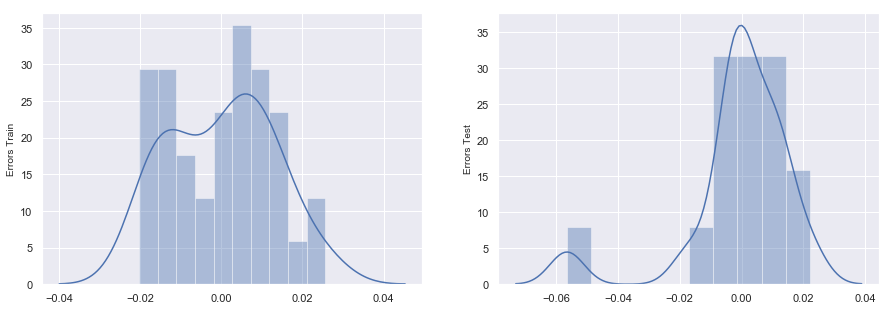

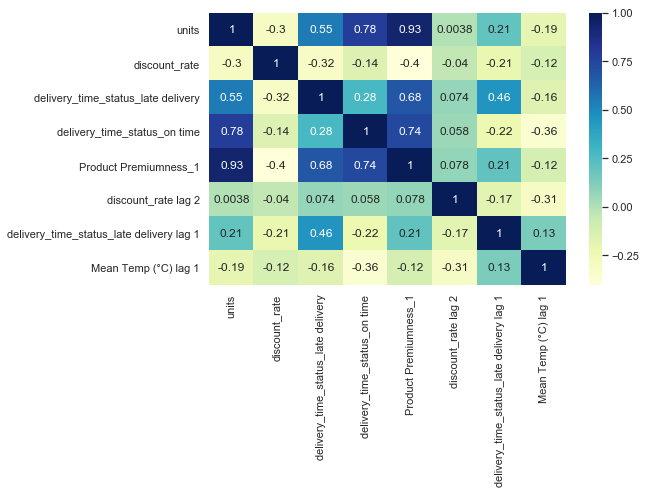

                    0
train r score 0.99672
test r score  0.99413
                 0
rmse_train 0.01261
rmse_test  0.01708


In [573]:
y_train_real_pred, y_test_real_pred, r2_dataframe, rmse_dataframe = predictions_and_residual_analysis_and_rscore(X_train_mult_distlag_iter0, 
                                                                                                 y_train_mult_distlag,
                                                                                                 X_test_mult_distlag,
                                                                                                 y_test_mult_distlag,
                                                                                                 model_iter21)
print(r2_dataframe)
print(rmse_dataframe)

### Train Test Scores are good

### Elasticity of  `GMV` (Revenue)
As per economics, elasticity is the measure of how sensitive dependent variable (in our case, revenue) is to a particular independent variable.

<h3><center> $Elasticity_{gmv} = \frac{\frac{\delta{GMV}}{GMV}}{\frac{\delta{feature}}{feature}} $</centre> </h3>


while plotting elasticity, we will know,
1. Whether GMV is directly or indirectly propostional to a particular feature
2. How varying the dependency is?
3. Where exactly the dependency is? and such



Let us look at the elasticity of revenue with our predictors

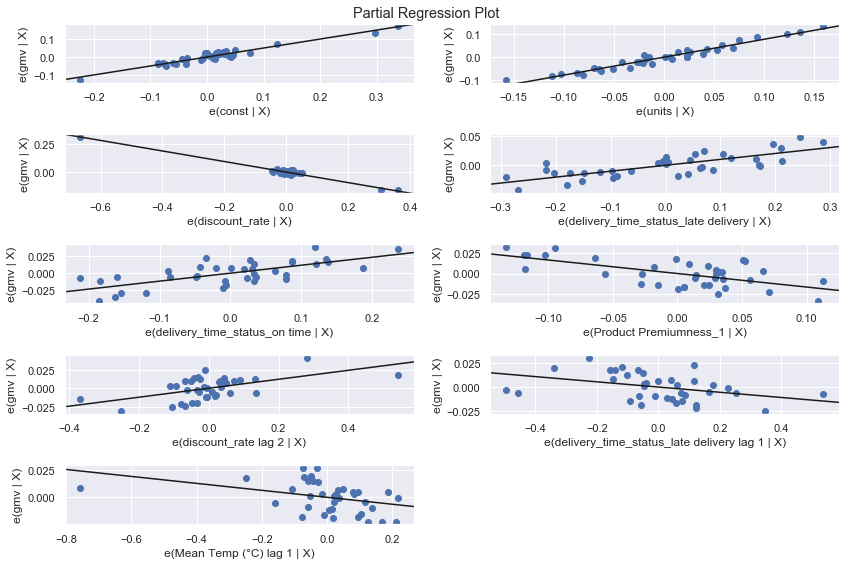

In [574]:
fig = plt.figure(figsize=(12,8))
fig = sm.graphics.plot_partregress_grid(model_iter21, fig=fig)

### Remarks:
It is evident that,
1. Units and late Delivery are directly related
2. Discount rate and constant had very limited impact 
3. Rest all are variance

<h1><center> Camera Accesories </center></h1>

### Model 1: Linear Regression

In [575]:
X_train,y_train,X_test,y_test = split_scale_feature(df_combined_camera)

In [576]:
X_train.shape

(37, 31)

### 13.3 Simple Linear Regression Model 
#### 13.3.1 Recursive Feature Elimination

In [577]:
X_train_iter0 = rfe_function(X_train,y_train,28)

In [578]:
X_train_iter0.columns

Index(['units', 'product_mrp', 'pay_day', 'special_sale_dates',
       'discount_rate', 'delivery_time_status_late delivery',
       'delivery_time_status_on time', 's1_fact.order_payment_type_COD',
       's1_fact.order_payment_type_Prepaid', 'Product Premiumness_0',
       'Product Premiumness_1', 'Product Premiumness_2', 'Max Temp (°C)',
       'Min Temp (°C)', 'Mean Temp (°C)', 'Heat Deg Days (°C)',
       'Cool Deg Days (°C)', 'Total Snow (cm)', 'Total Precip (mm)',
       'Snow on Grnd (cm)', 'NPS', 'Stock Index', 'add_stock_TV',
       'add_stock_digital', 'add_stock_content', 'add_stock_online',
       'add_stock_affiliates', 'add_stock_SEM'],
      dtype='object')

#### 13.3.2 Model Evaluation using StatsModel 

In [579]:
# Results of stats model iteration - 1
X_train_column_list, model_iter1, summary, VIF = statsmodel_vif(X_train_iter0,y_train,[])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.998
Model:                            OLS   Adj. R-squared:                  0.991
Method:                 Least Squares   F-statistic:                     146.2
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           4.96e-09
Time:                        20:06:24   Log-Likelihood:                 118.93
No. Observations:                  37   AIC:                            -181.9
Df Residuals:                       9   BIC:                            -136.8
Df Model:                          27                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

,Features,VIF
8,s1_fact.order_payment_type_COD,inf
9,s1_fact.order_payment_type_Prepaid,inf
11,Product Premiumness_1,4761.38000
10,Product Premiumness_0,4715.51000
28,add_stock_SEM,867.26000
15,Mean Temp (°C),721.66000
24,add_stock_digital,332.10000
14,Min Temp (°C),292.71000
13,Max Temp (°C),226.89000
25,add_stock_content,178.42000


#### Remarks: 
1. Let us start with removing Weather Data with HIgh VIF
2. `Max Temp (°C)` has both high P-Value as well as VIF.
3. Let us drop `Max Temp (°C)`

In [580]:
# Results of stats model iteration - 2
X_train_column_list, model_iter2, summary, VIF = statsmodel_vif(X_train_iter0,y_train,['Max Temp (°C)'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.998
Model:                            OLS   Adj. R-squared:                  0.992
Method:                 Least Squares   F-statistic:                     167.6
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           3.81e-10
Time:                        20:06:27   Log-Likelihood:                 118.81
No. Observations:                  37   AIC:                            -183.6
Df Residuals:                      10   BIC:                            -140.1
Df Model:                          26                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

,Features,VIF
8,s1_fact.order_payment_type_COD,inf
9,s1_fact.order_payment_type_Prepaid,inf
11,Product Premiumness_1,4534.24000
10,Product Premiumness_0,4498.01000
27,add_stock_SEM,859.75000
23,add_stock_digital,328.45000
24,add_stock_content,178.36000
13,Min Temp (°C),175.42000
14,Mean Temp (°C),115.38000
2,product_mrp,76.40000


#### Remarks: 
1. Dropping `Total Precip (mm)` actually helped reduce collinearity in weather features
2. We will re-visit weather again later.
3. Let us see what we can do with `order payment type`. Let us list what do we know about them.
    1. `Payment Type Prepaid` is very less correlated to GMV. We can say effect will be insignificant.
    2. VIF is infinity too
    3. `Payment type COD` has high collinearity with others but we will deal with it later.
4. Let us drop `s1_fact.order_payment_type_Prepaid`

In [581]:
# Results of stats model iteration - 3
X_train_column_list, model_iter3, summary, VIF = statsmodel_vif(X_train_iter0,y_train,
                                                                ['s1_fact.order_payment_type_Prepaid'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.998
Model:                            OLS   Adj. R-squared:                  0.992
Method:                 Least Squares   F-statistic:                     167.6
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           3.81e-10
Time:                        20:06:30   Log-Likelihood:                 118.81
No. Observations:                  37   AIC:                            -183.6
Df Residuals:                      10   BIC:                            -140.1
Df Model:                          26                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

,Features,VIF
0,const,97651.31000
10,Product Premiumness_1,4534.24000
9,Product Premiumness_0,4498.01000
26,add_stock_SEM,859.75000
22,add_stock_digital,328.45000
23,add_stock_content,178.36000
12,Min Temp (°C),175.42000
13,Mean Temp (°C),115.38000
2,product_mrp,76.40000
1,units,74.79000


#### Remarks:
1. `Late Delivery` has very less correlation with `gmv`
2. It also has high P-value
3. So let us drop `delivery_time_status_late delivery`


In [582]:
# Results of stats model iteration - 4
X_train_column_list, model_iter4, summary, VIF = statsmodel_vif(X_train_iter0,y_train,
                                                                ['delivery_time_status_late delivery'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.998
Model:                            OLS   Adj. R-squared:                  0.992
Method:                 Least Squares   F-statistic:                     187.4
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           3.02e-11
Time:                        20:06:33   Log-Likelihood:                 118.38
No. Observations:                  37   AIC:                            -184.8
Df Residuals:                      11   BIC:                            -142.9
Df Model:                          25                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

,Features,VIF
0,const,96709.58000
9,Product Premiumness_1,4518.98000
8,Product Premiumness_0,4481.24000
25,add_stock_SEM,803.54000
21,add_stock_digital,303.65000
22,add_stock_content,167.22000
11,Min Temp (°C),153.78000
12,Mean Temp (°C),108.34000
1,units,74.69000
2,product_mrp,74.43000


#### Remarks:
1. `add_stock_SEM` has more correlation with GMV but with other add stocks too
2. `add_stock_SEM` has high P-Value and VIF
3. Though it has less VIF, it has significantly less impact on GMV to others.
4. So we chose to drop `add_stock_SEM`

In [583]:
# Results of stats model iteration - 5
X_train_column_list, model_iter5, summary, VIF = statsmodel_vif(X_train_iter0,y_train,['add_stock_SEM'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.998
Model:                            OLS   Adj. R-squared:                  0.993
Method:                 Least Squares   F-statistic:                     211.3
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           2.09e-12
Time:                        20:06:36   Log-Likelihood:                 118.25
No. Observations:                  37   AIC:                            -186.5
Df Residuals:                      12   BIC:                            -146.2
Df Model:                          24                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

,Features,VIF
0,const,89024.12000
9,Product Premiumness_1,4221.95000
8,Product Premiumness_0,4181.72000
11,Min Temp (°C),133.70000
12,Mean Temp (°C),108.16000
1,units,67.35000
2,product_mrp,66.31000
22,add_stock_content,61.19000
21,add_stock_digital,50.76000
24,add_stock_affiliates,37.57000


#### Remarks:
1. `Product MRP`, `Discount Rate`, `GMV` and `Units` are highly correlated with each other. 
2. Since Product MRP does not directly associate with GMV than others
3. Let us drop `product_mrp`

In [584]:
# Results of stats model iteration - 5
X_train_column_list, model_iter5, summary, VIF = statsmodel_vif(X_train_iter0,y_train,['product_mrp'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.998
Model:                            OLS   Adj. R-squared:                  0.993
Method:                 Least Squares   F-statistic:                     227.6
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.80e-13
Time:                        20:06:38   Log-Likelihood:                 117.35
No. Observations:                  37   AIC:                            -186.7
Df Residuals:                      13   BIC:                            -148.0
Df Model:                          23                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

,Features,VIF
0,const,88975.98000
8,Product Premiumness_1,4221.32000
7,Product Premiumness_0,4181.63000
10,Min Temp (°C),114.15000
11,Mean Temp (°C),107.52000
21,add_stock_content,56.91000
20,add_stock_digital,45.78000
23,add_stock_affiliates,37.34000
14,Total Snow (cm),30.38000
16,Snow on Grnd (cm),28.09000


#### Remarks:
1. We are going through the second iteration of dropping one column from each set of features
2. `Total Precip (mm)` has high P-Value
3. Let us drop `Total Precip (mm)`
4. So far, it is good to note that there is `no significant drop in R Score` by sropping variables 

In [585]:
# Results of stats model iteration - 6
X_train_column_list, model_iter6, summary, VIF = statsmodel_vif(X_train_iter0,y_train,['Total Precip (mm)'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.997
Model:                            OLS   Adj. R-squared:                  0.994
Method:                 Least Squares   F-statistic:                     251.4
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.25e-14
Time:                        20:06:40   Log-Likelihood:                 117.00
No. Observations:                  37   AIC:                            -188.0
Df Residuals:                      14   BIC:                            -150.9
Df Model:                          22                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

,Features,VIF
0,const,85098.12000
8,Product Premiumness_1,4013.63000
7,Product Premiumness_0,3981.76000
10,Min Temp (°C),108.24000
11,Mean Temp (°C),99.71000
20,add_stock_content,55.12000
19,add_stock_digital,45.44000
14,Total Snow (cm),28.34000
22,add_stock_affiliates,27.77000
15,Snow on Grnd (cm),26.61000


#### Remarks:
1. `add_stock_affiliates` has high P Value and VIF
2. It has high correlation with `add_stock_content` which is understandable
3. Though it has good correlation with GMV, 
4. Since we have content add stock so far, we are dropping `add_stock_affiliates`

In [586]:
# Results of stats model iteration - 7
X_train_column_list, model_iter7, summary, VIF = statsmodel_vif(X_train_iter0,y_train,['add_stock_affiliates'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.997
Model:                            OLS   Adj. R-squared:                  0.994
Method:                 Least Squares   F-statistic:                     277.8
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           8.08e-16
Time:                        20:06:42   Log-Likelihood:                 116.71
No. Observations:                  37   AIC:                            -189.4
Df Residuals:                      15   BIC:                            -154.0
Df Model:                          21                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

,Features,VIF
0,const,80456.29000
8,Product Premiumness_1,3739.09000
7,Product Premiumness_0,3732.39000
10,Min Temp (°C),106.19000
11,Mean Temp (°C),99.40000
20,add_stock_content,34.16000
19,add_stock_digital,29.61000
14,Total Snow (cm),27.57000
15,Snow on Grnd (cm),25.84000
21,add_stock_online,10.06000


#### Remarks:
1. `Min Temp` has high VIF.
2. So for now, let us just drop `Min Temp (°C)`

In [587]:
# Results of stats model iteration - 8
X_train_column_list, model_iter8, summary, VIF = statsmodel_vif(X_train_iter0,y_train,['Min Temp (°C)'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.997
Model:                            OLS   Adj. R-squared:                  0.993
Method:                 Least Squares   F-statistic:                     252.7
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           2.33e-16
Time:                        20:06:46   Log-Likelihood:                 112.87
No. Observations:                  37   AIC:                            -183.7
Df Residuals:                      16   BIC:                            -149.9
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

,Features,VIF
0,const,78692.04000
8,Product Premiumness_1,3669.17000
7,Product Premiumness_0,3661.11000
18,add_stock_digital,21.95000
19,add_stock_content,21.82000
14,Snow on Grnd (cm),18.98000
13,Total Snow (cm),18.97000
10,Mean Temp (°C),15.25000
20,add_stock_online,8.85000
11,Heat Deg Days (°C),7.51000


#### Remarks:
1. Next top 3 features `add stocks`, `discount rate`
2. `Discount rate` is business wise a good feature
3. Having discount rate on board explains the relationship between offers and GMV which is intuitive too
4. We will find an add stock that is highly correlated to discount also with high VIF or P-Value and will drop it.
5. One such add stock is `add_stock_content`
6. Let us drop `add_stock_content`

In [588]:
# Results of stats model iteration - 9
X_train_column_list, model_iter9, summary, VIF = statsmodel_vif(X_train_iter0,y_train,['add_stock_content'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.997
Model:                            OLS   Adj. R-squared:                  0.993
Method:                 Least Squares   F-statistic:                     280.8
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.43e-17
Time:                        20:06:50   Log-Likelihood:                 112.75
No. Observations:                  37   AIC:                            -185.5
Df Residuals:                      17   BIC:                            -153.3
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

,Features,VIF
0,const,78315.23000
8,Product Premiumness_1,3648.14000
7,Product Premiumness_0,3646.01000
13,Total Snow (cm),17.71000
14,Snow on Grnd (cm),17.58000
10,Mean Temp (°C),12.87000
12,Cool Deg Days (°C),7.08000
19,add_stock_online,6.87000
11,Heat Deg Days (°C),6.20000
17,add_stock_TV,6.16000


#### Remarks:
1. Let us try one more time to save `discount rate`
2. `Product Premiumness` is highly correlated to `discount` but insignificant with GMV
3. Let us drop `Product Premiumness_1` and see if `discount_rate has an impact` over it

In [589]:
# Results of stats model iteration - 10
X_train_column_list, model_iter10, summary, VIF = statsmodel_vif(X_train_iter0,y_train,['Product Premiumness_1'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.997
Model:                            OLS   Adj. R-squared:                  0.993
Method:                 Least Squares   F-statistic:                     288.1
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.68e-18
Time:                        20:06:53   Log-Likelihood:                 111.18
No. Observations:                  37   AIC:                            -184.4
Df Residuals:                      18   BIC:                            -153.8
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

,Features,VIF
0,const,174.20000
12,Total Snow (cm),14.91000
13,Snow on Grnd (cm),14.52000
9,Mean Temp (°C),11.79000
16,add_stock_TV,6.16000
10,Heat Deg Days (°C),5.88000
11,Cool Deg Days (°C),5.78000
18,add_stock_online,5.58000
14,NPS,4.04000
7,Product Premiumness_0,3.84000


#### Remarks:
1. Dropping Discount rate has no substantial impact on R2 which is a good thing
1. Let us drop `Cool Deg Days (°C)` for having high VIF and PValue

In [590]:
# Results of stats model iteration - 11
X_train_column_list, model_iter11, summary, VIF = statsmodel_vif(X_train_iter0,y_train,['Cool Deg Days (°C)'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.996
Model:                            OLS   Adj. R-squared:                  0.993
Method:                 Least Squares   F-statistic:                     314.1
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.15e-19
Time:                        20:06:56   Log-Likelihood:                 110.72
No. Observations:                  37   AIC:                            -185.4
Df Residuals:                      19   BIC:                            -156.4
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

,Features,VIF
0,const,147.29000
11,Total Snow (cm),14.50000
12,Snow on Grnd (cm),14.19000
9,Mean Temp (°C),8.19000
15,add_stock_TV,6.02000
10,Heat Deg Days (°C),5.69000
17,add_stock_online,5.56000
7,Product Premiumness_0,3.77000
4,discount_rate,3.47000
13,NPS,3.36000


#### Remarks:
1. Since VIF has been controlled largely.
2. Let us focus on dropping features with high P-Value
3. `NPS` has the highest P-Value

In [591]:
# Results of stats model iteration - 12
X_train_column_list, model_iter12, summary, VIF = statsmodel_vif(X_train_iter0,y_train,['NPS'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.996
Model:                            OLS   Adj. R-squared:                  0.993
Method:                 Least Squares   F-statistic:                     326.2
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.25e-20
Time:                        20:07:00   Log-Likelihood:                 109.36
No. Observations:                  37   AIC:                            -184.7
Df Residuals:                      20   BIC:                            -157.3
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

,Features,VIF
0,const,117.26000
11,Total Snow (cm),14.33000
12,Snow on Grnd (cm),13.98000
9,Mean Temp (°C),7.17000
14,add_stock_TV,5.87000
10,Heat Deg Days (°C),5.60000
16,add_stock_online,5.29000
7,Product Premiumness_0,3.47000
4,discount_rate,3.28000
5,delivery_time_status_on time,2.67000


#### Remarks:
1. One thing to note is `dropping NPS` has a good effect on `constant` VIF
1. Next highest P-Value with a different feature set is `Mean Temp (°C)`
2. Let us drop `Mean Temp (°C)`

In [592]:
# Results of stats model iteration - 13
X_train_column_list, model_iter13, summary, VIF = statsmodel_vif(X_train_iter0,y_train,['Mean Temp (°C)'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.996
Model:                            OLS   Adj. R-squared:                  0.993
Method:                 Least Squares   F-statistic:                     365.3
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           6.34e-22
Time:                        20:07:03   Log-Likelihood:                 109.35
No. Observations:                  37   AIC:                            -186.7
Df Residuals:                      21   BIC:                            -160.9
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

,Features,VIF
0,const,93.45000
10,Total Snow (cm),14.31000
11,Snow on Grnd (cm),13.97000
13,add_stock_TV,5.64000
15,add_stock_online,5.28000
7,Product Premiumness_0,3.34000
4,discount_rate,3.18000
1,units,2.41000
6,s1_fact.order_payment_type_COD,2.36000
5,delivery_time_status_on time,2.21000


#### Remarks:
1. With dropping features with high P-Value, constant is having substantial effect
2. Let us drop `Snow on Grnd (cm)` with high P-Value

In [593]:
# Results of stats model iteration - 14
X_train_column_list, model_iter14, summary, VIF = statsmodel_vif(X_train_iter0,y_train,['Snow on Grnd (cm)'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.996
Model:                            OLS   Adj. R-squared:                  0.994
Method:                 Least Squares   F-statistic:                     409.1
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           3.12e-23
Time:                        20:07:06   Log-Likelihood:                 109.31
No. Observations:                  37   AIC:                            -188.6
Df Residuals:                      22   BIC:                            -164.5
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

,Features,VIF
0,const,92.76000
12,add_stock_TV,5.56000
14,add_stock_online,5.26000
7,Product Premiumness_0,3.27000
4,discount_rate,3.05000
1,units,2.33000
6,s1_fact.order_payment_type_COD,2.22000
5,delivery_time_status_on time,2.21000
3,special_sale_dates,2.15000
9,Heat Deg Days (°C),2.06000


#### Remarks:
1. Let us select whole set of new features to drop
2. Let us drop `Stock Index`

In [594]:
# Results of stats model iteration - 15
X_train_column_list, model_iter15, summary, VIF = statsmodel_vif(X_train_iter0,y_train,['Stock Index'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.996
Model:                            OLS   Adj. R-squared:                  0.994
Method:                 Least Squares   F-statistic:                     456.2
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.57e-24
Time:                        20:07:09   Log-Likelihood:                 109.13
No. Observations:                  37   AIC:                            -190.3
Df Residuals:                      23   BIC:                            -167.7
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

,Features,VIF
0,const,86.69000
13,add_stock_online,5.13000
11,add_stock_TV,5.09000
7,Product Premiumness_0,3.23000
4,discount_rate,2.89000
1,units,2.31000
5,delivery_time_status_on time,2.18000
6,s1_fact.order_payment_type_COD,2.00000
9,Heat Deg Days (°C),2.00000
3,special_sale_dates,1.79000


#### Remarks:
1. Let us drop `discount_rate`
2. To iterate with a different feature

In [595]:
# Results of stats model iteration - 16
X_train_column_list, model_iter16, summary, VIF = statsmodel_vif(X_train_iter0,y_train,['discount_rate'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.996
Model:                            OLS   Adj. R-squared:                  0.994
Method:                 Least Squares   F-statistic:                     509.1
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           7.84e-26
Time:                        20:07:12   Log-Likelihood:                 108.89
No. Observations:                  37   AIC:                            -191.8
Df Residuals:                      24   BIC:                            -170.8
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

,Features,VIF
0,const,28.47000
12,add_stock_online,5.13000
10,add_stock_TV,4.70000
1,units,2.30000
4,delivery_time_status_on time,2.16000
8,Heat Deg Days (°C),1.94000
6,Product Premiumness_0,1.88000
5,s1_fact.order_payment_type_COD,1.82000
3,special_sale_dates,1.78000
11,add_stock_digital,1.74000


#### Remarks:
1. Let us drop `special_sale_dates`
2. Dropping `Stock Index` should have a substantial impact on `constant` assuming that `stock index` is almost constant
3. Let us see if our assumptions are right

In [596]:
# Results of stats model iteration - 17
X_train_column_list, model_iter17, summary, VIF = statsmodel_vif(X_train_iter0,y_train,['special_sale_dates'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.996
Model:                            OLS   Adj. R-squared:                  0.994
Method:                 Least Squares   F-statistic:                     543.5
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           6.85e-27
Time:                        20:07:15   Log-Likelihood:                 107.75
No. Observations:                  37   AIC:                            -191.5
Df Residuals:                      25   BIC:                            -172.2
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

,Features,VIF
0,const,28.45000
11,add_stock_online,5.11000
9,add_stock_TV,4.70000
1,units,2.30000
7,Heat Deg Days (°C),1.93000
5,Product Premiumness_0,1.82000
4,s1_fact.order_payment_type_COD,1.80000
10,add_stock_digital,1.74000
3,delivery_time_status_on time,1.65000
6,Product Premiumness_2,1.38000


#### Remarks:
1. As a next iteration, let us drop `s1_fact.order_payment_type_COD`

In [597]:
# Results of stats model iteration - 18
X_train_column_list, model_iter18, summary, VIF = statsmodel_vif(X_train_iter0,y_train,['s1_fact.order_payment_type_COD'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.996
Model:                            OLS   Adj. R-squared:                  0.994
Method:                 Least Squares   F-statistic:                     583.6
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           6.02e-28
Time:                        20:07:18   Log-Likelihood:                 106.58
No. Observations:                  37   AIC:                            -191.2
Df Residuals:                      26   BIC:                            -173.4
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                                   coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------
const           

,Features,VIF
0,const,14.91000
10,add_stock_online,3.81000
8,add_stock_TV,3.56000
1,units,2.25000
6,Heat Deg Days (°C),1.93000
4,Product Premiumness_0,1.73000
9,add_stock_digital,1.69000
3,delivery_time_status_on time,1.52000
5,Product Premiumness_2,1.34000
7,Total Snow (cm),1.34000


#### Remarks
1. To change the feature set, let us drop `add_stock_TV` which has increasing P-Value with each iteration

In [598]:
# Results of stats model iteration - 19
X_train_column_list, model_iter19, summary, VIF = statsmodel_vif(X_train_iter0,y_train,['add_stock_TV'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.995
Model:                            OLS   Adj. R-squared:                  0.994
Method:                 Least Squares   F-statistic:                     620.3
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           6.72e-29
Time:                        20:07:21   Log-Likelihood:                 105.07
No. Observations:                  37   AIC:                            -190.1
Df Residuals:                      27   BIC:                            -174.0
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                                   coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------
const           

,Features,VIF
0,const,14.66000
9,add_stock_online,2.91000
1,units,2.22000
4,Product Premiumness_0,1.69000
6,Heat Deg Days (°C),1.63000
8,add_stock_digital,1.60000
3,delivery_time_status_on time,1.52000
5,Product Premiumness_2,1.34000
7,Total Snow (cm),1.33000
2,pay_day,1.25000


#### Remarks
1. To change the feature set, let us drop `add_stock_online` which has a high P-Value

In [599]:
# Results of stats model iteration - 20
X_train_column_list, model_iter20, summary, VIF = statsmodel_vif(X_train_iter0,y_train,['add_stock_online'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.995
Model:                            OLS   Adj. R-squared:                  0.994
Method:                 Least Squares   F-statistic:                     714.6
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           2.87e-30
Time:                        20:07:24   Log-Likelihood:                 104.83
No. Observations:                  37   AIC:                            -191.7
Df Residuals:                      28   BIC:                            -177.2
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                                   coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------
const           

,Features,VIF
0,const,14.59000
4,Product Premiumness_0,1.66000
8,add_stock_digital,1.51000
6,Heat Deg Days (°C),1.41000
3,delivery_time_status_on time,1.40000
1,units,1.38000
5,Product Premiumness_2,1.34000
7,Total Snow (cm),1.28000
2,pay_day,1.23000


#### Remarks
1. To change the feature set, let us drop `pay_day` which has a high P-Value

In [600]:
# Results of stats model iteration - 21
X_train_column_list, model_iter21, summary, VIF = statsmodel_vif(X_train_iter0,y_train,['pay_day'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.995
Model:                            OLS   Adj. R-squared:                  0.994
Method:                 Least Squares   F-statistic:                     817.5
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.54e-31
Time:                        20:07:27   Log-Likelihood:                 104.21
No. Observations:                  37   AIC:                            -192.4
Df Residuals:                      29   BIC:                            -179.5
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                                   coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------
const           

,Features,VIF
0,const,13.09000
3,Product Premiumness_0,1.52000
7,add_stock_digital,1.46000
1,units,1.38000
2,delivery_time_status_on time,1.36000
4,Product Premiumness_2,1.34000
5,Heat Deg Days (°C),1.32000
6,Total Snow (cm),1.23000


#### Remarks
1. To change the feature set, let us drop `Total Snow (cm)` which has a high P-Value

In [601]:
# Results of stats model iteration - 22
X_train_column_list, model_iter22, summary, VIF = statsmodel_vif(X_train_iter0,y_train,['Total Snow (cm)'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.995
Model:                            OLS   Adj. R-squared:                  0.994
Method:                 Least Squares   F-statistic:                     925.2
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.22e-32
Time:                        20:07:30   Log-Likelihood:                 103.02
No. Observations:                  37   AIC:                            -192.0
Df Residuals:                      30   BIC:                            -180.8
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                                   coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------
const           

,Features,VIF
0,const,13.08000
3,Product Premiumness_0,1.52000
6,add_stock_digital,1.44000
1,units,1.37000
4,Product Premiumness_2,1.34000
2,delivery_time_status_on time,1.32000
5,Heat Deg Days (°C),1.15000


#### Remarks:
1. P-Value is < 0.05 for almost all features except constant
2. P Value signifies the importance of feature in the model
3. `<0.05` signifies 95% confidance of feature importance
4. In our case, we have very less data as small as 37 points to model the data
5. For this reason, we can slightly loosen the P-Value limits.
6. `So, we feel any P-Value less than 0.075 is a decent bet`. We assume with more data, that P-Value can be controlled to < 0.05.
7. So let us stop modeling here

__Important:__ __We successfully maintained the R Square and Adjusted R Square Scores__

#### 13.3 Residual Analysis of Train Test Data

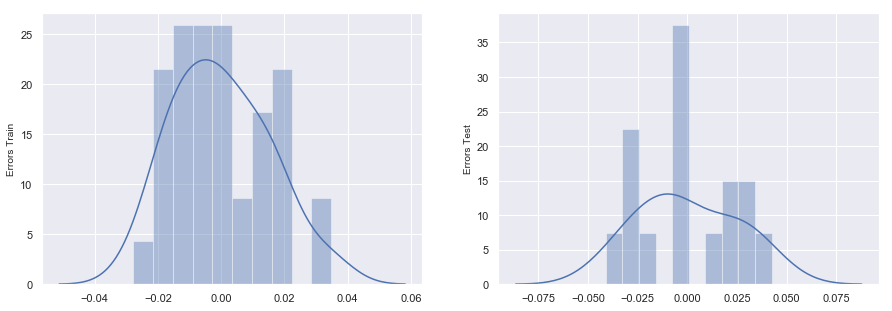

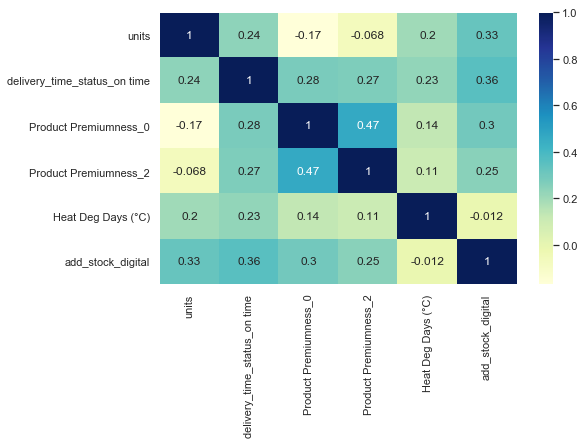

                    0
train r score 0.99462
test r score  0.98110
                 0
rmse_train 0.01495
rmse_test  0.02403


In [602]:
y_train_real_pred, y_test_real_pred, r2_dataframe, rmse_dataframe = predictions_and_residual_analysis_and_rscore(X_train_iter0, 
                                                                                                 y_train,
                                                                                                 X_test,
                                                                                                 y_test,
                                                                                                 model_iter22)
print(r2_dataframe)
print(rmse_dataframe)

__Conclusion:__ Based on R2 for both train and test models, we can conclude that the model's ability explain the variance is very good using the above features. The list of final features are also not highly correlated among themselves

### Elasticity of  `GMV` (Revenue)
As per economics, elasticity is the measure of how sensitive dependent variable (in our case, revenue) is to a particular independent variable.

<h3><center> $Elasticity_{gmv} = \frac{\frac{\delta{GMV}}{GMV}}{\frac{\delta{feature}}{feature}} $</centre> </h3>


while plotting elasticity, we will know,
1. Whether GMV is directly or indirectly propostional to a particular feature
2. How varying the dependency is?
3. Where exactly the dependency is? and such



Let us look at the elasticity of revenue with our predictors

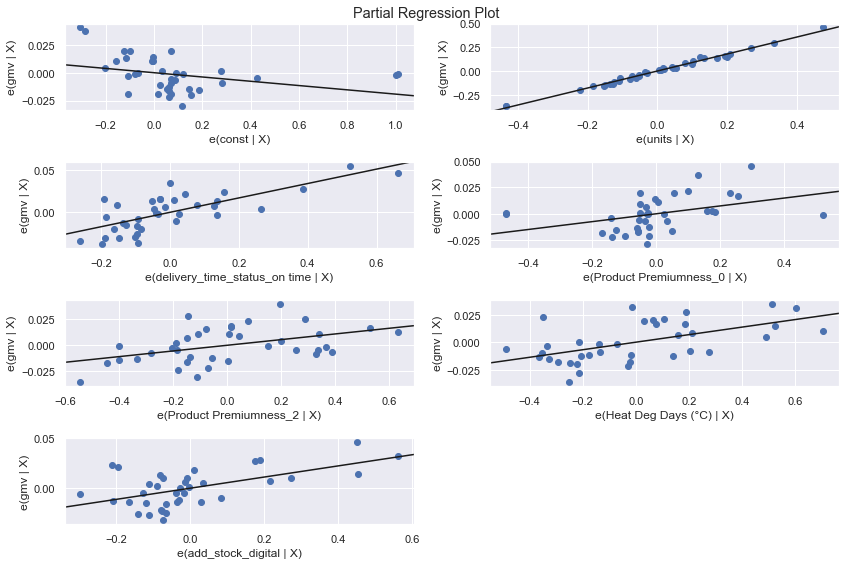

In [603]:
fig = plt.figure(figsize=(12,8))
fig = sm.graphics.plot_partregress_grid(model_iter22, fig=fig)

### Remarks:
It is evident that,
1. All features except constant has positive effect
2. Units is highly influencin GMV
3. Others are positively influencing GMV but with high variance which suggests uncertainity
4. The only good aspect is each feature is less or more positively influencind gmv

### Model 2: Multiplicative Model

In [604]:
# camera data log transformation
df_camera_log = log_transformation(df_combined_camera)

In [605]:
# Our dataframe is df_combined_camera
df_camera_log.head()

,gmv,units,product_mrp,pay_day,special_sale_dates,discount_rate,delivery_time_status_early delivery,delivery_time_status_late delivery,delivery_time_status_on time,s1_fact.order_payment_type_COD,...,Snow on Grnd (cm),NPS,Stock Index,add_stock_TV,add_stock_digital,add_stock_sponsorship,add_stock_content,add_stock_online,add_stock_affiliates,add_stock_SEM
week_number,,,,,,,,,,,,,,,,,,,,,
1,8.92106,3.09104,10.03640,0.00000,0.00000,-0.68717,3.12357,4.34734,0.00000,0.00000,...,0.00000,4.00003,7.07072,-7.48783,-5.02283,-3.94884,-12.92946,-5.66911,-6.55509,-4.33808
2,13.52134,7.62608,14.63487,0.00000,0.00000,-0.72663,4.48499,1.89764,1.53763,4.23001,...,0.00000,4.00003,7.07072,-2.87859,-0.41529,0.65751,-8.32311,-1.06157,-1.94874,0.26937
3,13.55944,7.65964,14.61747,0.00000,0.00000,-0.70423,4.45282,2.07920,1.81376,4.23821,...,0.00000,4.00003,7.07072,-2.38834,-0.03380,0.95443,-8.02620,-0.68008,-1.65182,0.64407
4,13.62229,7.69576,14.62445,0.00000,0.00000,-0.73331,4.47089,1.93174,1.73412,4.25547,...,0.00000,4.00003,7.07072,-2.14673,0.13344,1.07597,-7.90465,-0.50783,-1.53028,0.80695
5,13.16282,7.25700,14.11916,0.00000,0.00000,-0.73463,4.46184,1.95328,1.84080,4.28934,...,0.00000,4.09413,7.09506,-2.21801,-0.05060,0.81237,-8.16825,-0.22527,-1.79388,0.61611


### 14.1 Univariate and Bivariate Analysis of Continuous Data
1. This analysis is typically performed for continuous features only. So we choose only a few features to do it
2. Selected features include `gmv`, `discount_rate`, `All add stocks`

#### 13.1.1 Box Plots: To check Outliers

In [606]:
import matplotlib
column_list = ['gmv', 'product_mrp','discount_rate','add_stock_TV',
               'add_stock_digital', 'add_stock_sponsorship', 'add_stock_content',
               'add_stock_online', 'add_stock_affiliates', 'add_stock_SEM']

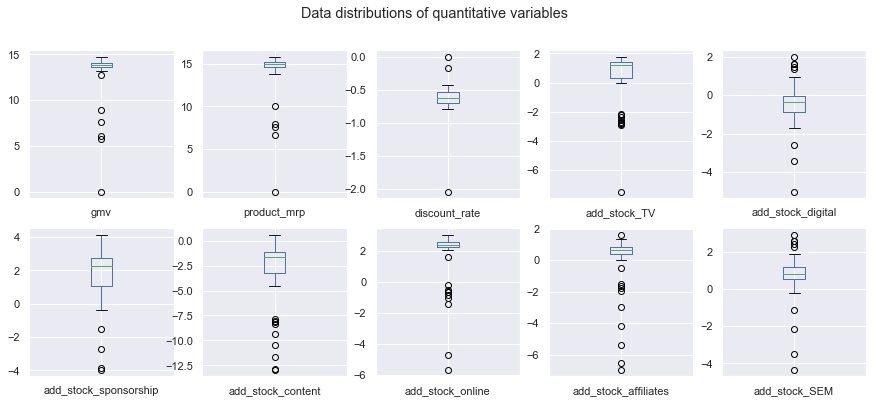

In [607]:
df_camera_log[column_list].plot(kind='box',subplots=True,layout=(2,5),
                                    sharex=False,figsize=(15,6), 
                                    title="Data distributions of quantitative variables")
plt.show()

#### Remarks: 
1. Log transformation has transformed outliers from positive percentile to negative percentile
2. Also concentration of outliers at 0 is due to the replacement of -inf value with 0

#### 13.1.2 Scatter Plots (Bivariate Relationship among continuous data) 

<Figure size 720x720 with 0 Axes>

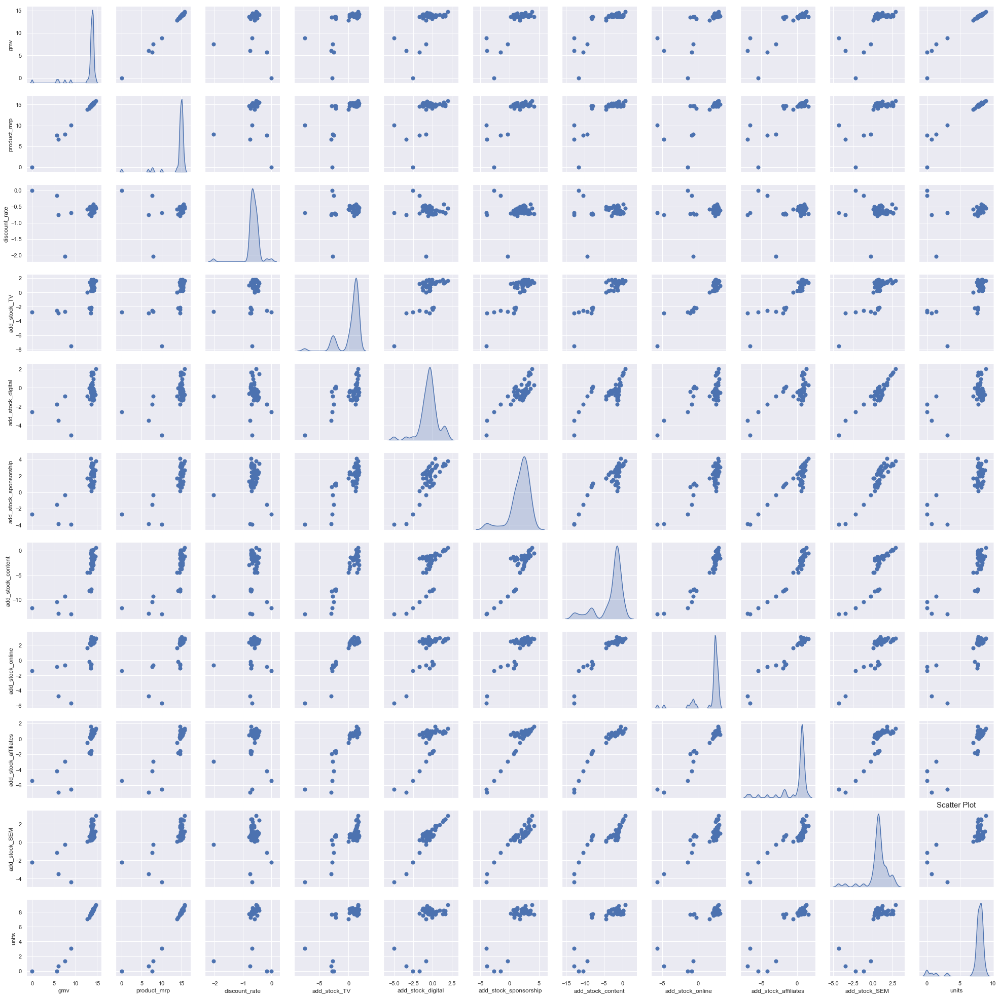

In [608]:
# Draw scatter plot
plt.figure(figsize=(10,10))
sns.set(style="darkgrid")
ax=sns.pairplot(df_camera_log[column_list+['units']],diag_kind ='kde',
               plot_kws=dict(s=50, edgecolor="b", linewidth=1),diag_kws=dict(shade=True))

plt.title('Scatter Plot',   fontsize=15)
#ax.set_xticklabels(ax.(), rotation=65, ha="right",weight="bold",fontsize=15)


plt.show()

#### Remarks:
##### PART - 1
1. Log Transformation was able to show the linearity in relationship more clearly
2. This indicates that the relation ships are exponential in nature
3. For GMV, evident linear relationship is with MRP and units as expected.

##### PART - 2
1. Log `Add Stocks` are clearly linearly related to each other
3. We can understand GMV linearity with `units` because that has a direct relationship.

We will study them while looking at correlation heat map. It is easy to figure out relationships there

#### 13.1.3 Heat-Map (Bivariate Relationship among continuous data) 
1. While doing this, we ignored weather components as they are not continuous values.

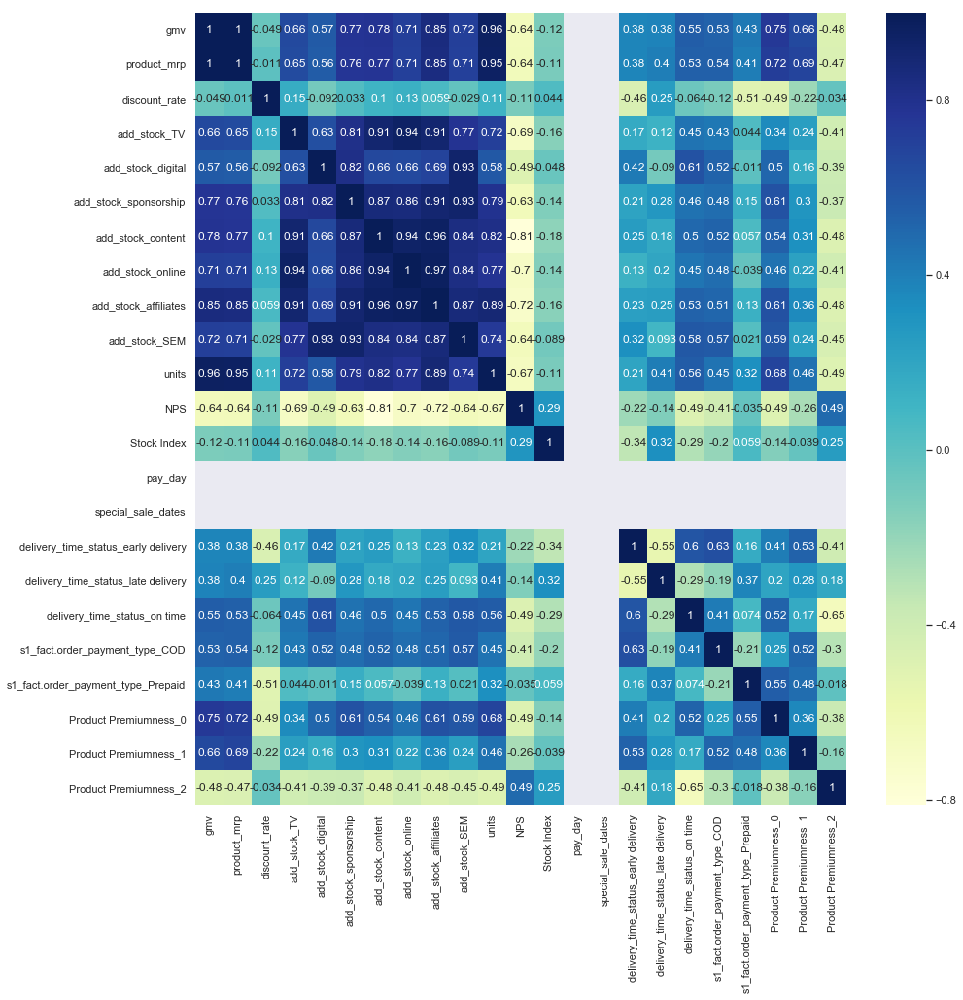

In [609]:
# Check correlation heatmap
plt.figure(figsize=(15,15))
sns.heatmap(df_camera_log[column_list+['units','NPS','Stock Index','pay_day','special_sale_dates',
'delivery_time_status_early delivery','delivery_time_status_late delivery', 'delivery_time_status_on time',
's1_fact.order_payment_type_COD', 's1_fact.order_payment_type_Prepaid','Product Premiumness_0', 
                                      'Product Premiumness_1','Product Premiumness_2']].corr(), 
            annot=True, cmap='YlGnBu')
plt.show()

#### Remarks: Similar to scatter plots reflect here. Let us reiterate the findings
##### PART - 1: Correlations with GMV (Good to have)
1. It is evident that from `gmv` to `units`, features are highly correlated. 
2. `Ontime Delivery` is highly correlated with GMV
3. `Product Premiumness 0 and 1` are highly highly correlated with GMV while 2 is negatively correlated
4. `Ontime delivery` and `Sale Day` are highly correlated with GMV
5. `Add Stocks` have good correlation with GMV

##### PART - 2: Correlations among features (Multi-collinearity)
1. `Discount Rate` is correlated to `add stocks` and delivery status and product premiumness
2. `Units` has high correlation with `MRP` as well as `Add Stocks`

##### PART - 3: Effect of log on smaller numbers
1. Clearly `Pay Day and Special Sales day` being small numerical values transformed to -inf aka 0 due to natural log transformation

Let us see how we can leverage the correlation knowledge, P-Values and VIF to choose features wisely. `Business intuition is extremely important consideration in MMM to keep in mind. Some decissions will be taken ignoring the math rules associated to understand business`

### 14.2 Modeling


#### 13.2.1 Train-Test Split and Scaling

In [610]:
X_train_ln,y_train_ln,X_test_ln,y_test_ln = split_scale_feature(df_camera_log)

In [611]:
X_train_ln.shape

(37, 31)

#### 13.2.2 Recursive Feature Elimination

In [612]:
X_train_ln_iter0 = rfe_function(X_train_ln,y_train_ln,28)

#### 13.3.2 Model Evaluation using StatsModel 

In [613]:
# Results of stats model iteration - 1
X_train_column_list, model_iter1, summary, VIF = statsmodel_vif(X_train_ln_iter0,y_train,[])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.933
Model:                            OLS   Adj. R-squared:                  0.698
Method:                 Least Squares   F-statistic:                     3.969
Date:                Mon, 23 Dec 2019   Prob (F-statistic):             0.0239
Time:                        20:11:13   Log-Likelihood:                 56.306
No. Observations:                  37   AIC:                            -54.61
Df Residuals:                       8   BIC:                            -7.896
Df Model:                          28                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
0,const,15956.07000
19,Total Precip (mm),7700.09000
17,Total Rain (mm),7379.75000
2,product_mrp,1586.56000
1,units,1393.18000
27,add_stock_affiliates,1177.58000
20,Snow on Grnd (cm),627.11000
26,add_stock_online,523.88000
24,add_stock_sponsorship,351.46000
9,Product Premiumness_0,172.95000


#### Remarks: 
Let us remove `Total Precip (mm)` as it has high VIF and significant p-value


In [614]:
# Results of stats model iteration - 2
X_train_column_list, model_iter2, summary, VIF = statsmodel_vif(X_train_ln_iter0,y_train_ln,['Total Precip (mm)'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 1.382e+04
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           6.61e-18
Time:                        20:11:16   Log-Likelihood:                 196.65
No. Observations:                  37   AIC:                            -337.3
Df Residuals:                       9   BIC:                            -292.2
Df Model:                          27                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
0,const,15621.65000
2,product_mrp,1553.46000
1,units,1347.90000
26,add_stock_affiliates,1173.85000
25,add_stock_online,477.83000
23,add_stock_sponsorship,342.29000
27,add_stock_SEM,170.09000
9,Product Premiumness_0,160.37000
21,add_stock_TV,159.55000
22,add_stock_digital,142.39000


#### Remarks: 
Let's remove `Stock Index` as it has high p-value

In [615]:
# Results of stats model iteration - 3
X_train_column_list, model_iter3, summary, VIF = statsmodel_vif(X_train_ln_iter0,y_train_ln,
                                                                ['Stock Index'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 1.592e+04
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           5.09e-20
Time:                        20:11:18   Log-Likelihood:                 196.62
No. Observations:                  37   AIC:                            -339.2
Df Residuals:                      10   BIC:                            -295.8
Df Model:                          26                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
0,const,15449.23000
2,product_mrp,1544.90000
1,units,1293.77000
25,add_stock_affiliates,1017.05000
24,add_stock_online,474.03000
22,add_stock_sponsorship,181.63000
26,add_stock_SEM,168.30000
20,add_stock_TV,155.66000
9,Product Premiumness_0,148.94000
21,add_stock_digital,126.73000


#### Remarks:
Let us drop `Total Rain (mm)` for having high P-value

In [616]:
# Results of stats model iteration - 4
X_train_column_list, model_iter4, summary, VIF = statsmodel_vif(X_train_ln_iter0,y_train_ln,
                                                                ['Total Rain (mm)'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 1.821e+04
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           3.65e-22
Time:                        20:11:23   Log-Likelihood:                 196.62
No. Observations:                  37   AIC:                            -341.2
Df Residuals:                      11   BIC:                            -299.4
Df Model:                          25                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
0,const,12861.95000
2,product_mrp,1525.00000
1,units,1277.15000
24,add_stock_affiliates,728.46000
23,add_stock_online,463.86000
25,add_stock_SEM,164.97000
19,add_stock_TV,154.29000
9,Product Premiumness_0,142.23000
21,add_stock_sponsorship,130.00000
20,add_stock_digital,118.89000


#### Remarks:
1. Let us choose one from delivery status
2. Each time we drop a value, we choose a distinct one, it helps correlated values to reduce multi collinearity
3. Let us drop `delivery_time_status_late delivery`

In [617]:
# Results of stats model iteration - 5
X_train_column_list, model_iter5, summary, VIF = statsmodel_vif(X_train_ln_iter0,y_train_ln,['delivery_time_status_late delivery'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 2.055e+04
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           2.56e-24
Time:                        20:11:25   Log-Likelihood:                 196.49
No. Observations:                  37   AIC:                            -343.0
Df Residuals:                      12   BIC:                            -302.7
Df Model:                          24                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
0,const,10630.54000
2,product_mrp,1524.10000
1,units,1240.58000
23,add_stock_affiliates,684.42000
22,add_stock_online,463.82000
24,add_stock_SEM,162.56000
18,add_stock_TV,151.50000
8,Product Premiumness_0,137.43000
19,add_stock_digital,118.33000
20,add_stock_sponsorship,105.88000


#### Remarks:
Let us drop `Mean Temp (°C)` as it has significant p-value

In [618]:
# Results of stats model iteration - 5
X_train_column_list, model_iter5, summary, VIF = statsmodel_vif(X_train_ln_iter0,y_train_ln,['Mean Temp (°C)'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 2.287e+04
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.81e-26
Time:                        20:11:28   Log-Likelihood:                 196.20
No. Observations:                  37   AIC:                            -344.4
Df Residuals:                      13   BIC:                            -305.7
Df Model:                          23                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
0,const,10274.97000
2,product_mrp,1488.39000
1,units,1197.33000
22,add_stock_affiliates,682.78000
21,add_stock_online,429.83000
23,add_stock_SEM,161.24000
17,add_stock_TV,151.50000
8,Product Premiumness_0,137.22000
18,add_stock_digital,116.12000
19,add_stock_sponsorship,101.10000


#### Remarks:
Let's drop `add_stock_online` as it has hig VIF and significant p-value

In [619]:
# Results of stats model iteration - 6
X_train_column_list, model_iter6, summary, VIF = statsmodel_vif(X_train_ln_iter0,y_train_ln,['add_stock_online'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 2.503e+04
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.33e-28
Time:                        20:11:31   Log-Likelihood:                 195.68
No. Observations:                  37   AIC:                            -345.4
Df Residuals:                      14   BIC:                            -308.3
Df Model:                          22                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
0,const,9077.51000
2,product_mrp,1390.20000
1,units,1091.69000
21,add_stock_affiliates,423.90000
22,add_stock_SEM,160.80000
8,Product Premiumness_0,136.61000
17,add_stock_TV,123.95000
18,add_stock_digital,112.02000
19,add_stock_sponsorship,91.13000
3,discount_rate,65.88000


#### Remarks:
1. `add_stock_sponsorship` has high P Value and VIF
2. It has high correlation with other add_stocks which is understandable
3. Though it has good correlation with GMV, 
4. Since we have content add stock so far, we are dropping `add_stock_sponsorship`

In [620]:
# Results of stats model iteration - 7
X_train_column_list, model_iter7, summary, VIF = statsmodel_vif(X_train_ln_iter0,y_train_ln,['add_stock_sponsorship'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 2.707e+04
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.02e-30
Time:                        20:11:33   Log-Likelihood:                 194.99
No. Observations:                  37   AIC:                            -346.0
Df Residuals:                      15   BIC:                            -310.5
Df Model:                          21                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
0,const,6776.31000
2,product_mrp,1359.49000
1,units,1088.58000
20,add_stock_affiliates,216.25000
21,add_stock_SEM,156.57000
8,Product Premiumness_0,133.42000
17,add_stock_TV,102.99000
18,add_stock_digital,89.49000
19,add_stock_content,55.87000
3,discount_rate,47.32000


#### Remarks:
1. `Product MRP`, `GMV` and `Units` are highly correlated with each other. 
2. Since Product MRP does not directly associate with GMV than others
3. Let us drop `product_mrp`

In [621]:
# Results of stats model iteration - 8
X_train_column_list, model_iter8, summary, VIF = statsmodel_vif(X_train_ln_iter0,y_train_ln,['product_mrp'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 1.717e+04
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           5.41e-31
Time:                        20:11:36   Log-Likelihood:                 184.47
No. Observations:                  37   AIC:                            -326.9
Df Residuals:                      16   BIC:                            -293.1
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
0,const,6404.22000
19,add_stock_affiliates,181.77000
20,add_stock_SEM,143.58000
1,units,125.94000
7,Product Premiumness_0,118.12000
16,add_stock_TV,101.91000
17,add_stock_digital,86.58000
18,add_stock_content,36.40000
8,Product Premiumness_1,33.69000
5,s1_fact.order_payment_type_COD,32.60000


#### Remarks:
1. `add_stock_affiliates` has both high P-Value and VIF
2. Let us drop `add_stock_affiliates`

In [622]:
# Results of stats model iteration - 9
X_train_column_list, model_iter9, summary, VIF = statsmodel_vif(X_train_ln_iter0,y_train_ln,['add_stock_affiliates'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 1.910e+04
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           3.96e-33
Time:                        20:11:38   Log-Likelihood:                 184.37
No. Observations:                  37   AIC:                            -328.7
Df Residuals:                      17   BIC:                            -296.5
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
0,const,6387.80000
1,units,107.60000
7,Product Premiumness_0,99.37000
19,add_stock_SEM,59.53000
16,add_stock_TV,36.14000
18,add_stock_content,35.88000
17,add_stock_digital,35.57000
5,s1_fact.order_payment_type_COD,28.09000
2,discount_rate,27.86000
8,Product Premiumness_1,26.69000


#### Remarks:
Let us drop `'Cool Deg Days (°C)` as it has significant p-value

In [623]:
# Results of stats model iteration - 10
X_train_column_list, model_iter10, summary, VIF = statsmodel_vif(X_train_ln_iter0,y_train_ln,['Cool Deg Days (°C)'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 2.086e+04
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           3.25e-35
Time:                        20:11:41   Log-Likelihood:                 183.94
No. Observations:                  37   AIC:                            -329.9
Df Residuals:                      18   BIC:                            -299.3
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
0,const,5947.05000
1,units,97.95000
7,Product Premiumness_0,85.81000
18,add_stock_SEM,57.77000
16,add_stock_digital,33.76000
17,add_stock_content,29.21000
15,add_stock_TV,26.63000
2,discount_rate,25.91000
5,s1_fact.order_payment_type_COD,25.50000
8,Product Premiumness_1,24.61000


#### Remarks:
1. `Product Premiumness_1` has both high VIF as well as P Value
2. Let us drop `Product Premiumness_1`
3. Presently, thye focus is on dropping columns which has high values in both VIF as well as P

In [624]:
# Results of stats model iteration - 11
X_train_column_list, model_iter11, summary, VIF = statsmodel_vif(X_train_ln_iter0,y_train_ln,['Product Premiumness_1'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 2.298e+04
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           2.37e-37
Time:                        20:11:43   Log-Likelihood:                 183.68
No. Observations:                  37   AIC:                            -331.4
Df Residuals:                      19   BIC:                            -302.4
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
0,const,2060.08000
1,units,50.15000
17,add_stock_SEM,46.27000
15,add_stock_digital,28.56000
16,add_stock_content,22.74000
5,s1_fact.order_payment_type_COD,19.87000
7,Product Premiumness_0,19.30000
2,discount_rate,17.90000
14,add_stock_TV,16.64000
10,Min Temp (°C),13.37000


#### Remarks:
Let us drop `discount_rate` as it has high p-value and VIF

In [625]:
# Results of stats model iteration - 12
X_train_column_list, model_iter12, summary, VIF = statsmodel_vif(X_train_ln_iter0,y_train_ln,['discount_rate'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 2.510e+04
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.82e-39
Time:                        20:11:46   Log-Likelihood:                 183.24
No. Observations:                  37   AIC:                            -332.5
Df Residuals:                      20   BIC:                            -305.1
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
0,const,214.34000
16,add_stock_SEM,45.00000
14,add_stock_digital,28.27000
15,add_stock_content,19.82000
13,add_stock_TV,15.68000
9,Min Temp (°C),12.13000
1,units,11.48000
2,delivery_time_status_early delivery,7.82000
8,Max Temp (°C),7.33000
10,Heat Deg Days (°C),6.98000


#### Remarks:
1. Let us look at weather features again
2. `Max Temp (°C)` has high P Value
3. Let us drop `Max Temp (°C)`

In [626]:
# Results of stats model iteration - 13
X_train_column_list, model_iter13, summary, VIF = statsmodel_vif(X_train_ln_iter0,y_train_ln,['Max Temp (°C)'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 2.567e+04
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           2.75e-41
Time:                        20:11:48   Log-Likelihood:                 181.56
No. Observations:                  37   AIC:                            -331.1
Df Residuals:                      21   BIC:                            -305.3
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
0,const,188.18000
15,add_stock_SEM,43.96000
13,add_stock_digital,25.35000
14,add_stock_content,19.39000
12,add_stock_TV,15.59000
1,units,10.93000
2,delivery_time_status_early delivery,7.64000
3,delivery_time_status_on time,5.84000
4,s1_fact.order_payment_type_COD,5.78000
9,Heat Deg Days (°C),5.46000


#### Remarks:
Let us drop `Min Temp (°C)` as it has significant p-value

In [627]:
# Results of stats model iteration - 14
X_train_column_list, model_iter14, summary, VIF = statsmodel_vif(X_train_ln_iter0,y_train_ln,['Min Temp (°C)'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 2.835e+04
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.87e-43
Time:                        20:11:51   Log-Likelihood:                 181.26
No. Observations:                  37   AIC:                            -332.5
Df Residuals:                      22   BIC:                            -308.4
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
0,const,168.70000
14,add_stock_SEM,43.91000
12,add_stock_digital,23.05000
13,add_stock_content,19.31000
11,add_stock_TV,15.07000
1,units,10.18000
2,delivery_time_status_early delivery,6.97000
3,delivery_time_status_on time,5.66000
4,s1_fact.order_payment_type_COD,4.97000
9,Total Snow (cm),4.89000


#### Remarks:
1. Let us select whole set of new features to drop
2. We will drop an add stock to observe the impact on P-Values
3. Let us drop `add_stock_SEM` as it has high VIF

In [628]:
# Results of stats model iteration - 15
X_train_column_list, model_iter15, summary, VIF = statsmodel_vif(X_train_ln_iter0,y_train_ln,['add_stock_SEM'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 1.294e+04
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           3.27e-41
Time:                        20:11:53   Log-Likelihood:                 164.56
No. Observations:                  37   AIC:                            -301.1
Df Residuals:                      23   BIC:                            -278.6
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
0,const,168.12000
13,add_stock_content,15.51000
11,add_stock_TV,15.03000
1,units,10.09000
2,delivery_time_status_early delivery,6.25000
3,delivery_time_status_on time,5.65000
9,Total Snow (cm),4.89000
4,s1_fact.order_payment_type_COD,4.67000
12,add_stock_digital,4.39000
10,Snow on Grnd (cm),4.33000


#### Remarks:
1. Let us drop `delivery_time_status_on time` as it has significant p-value and it contributes very minimal to GMV

In [629]:
# Results of stats model iteration - 16
X_train_column_list, model_iter16, summary, VIF = statsmodel_vif(X_train_ln_iter0,y_train_ln,['delivery_time_status_on time'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 1.150e+04
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           4.70e-42
Time:                        20:11:56   Log-Likelihood:                 160.11
No. Observations:                  37   AIC:                            -294.2
Df Residuals:                      24   BIC:                            -273.3
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
0,const,167.50000
12,add_stock_content,15.18000
10,add_stock_TV,14.84000
1,units,6.67000
8,Total Snow (cm),4.56000
11,add_stock_digital,4.39000
9,Snow on Grnd (cm),4.22000
3,s1_fact.order_payment_type_COD,4.19000
5,Product Premiumness_0,3.96000
2,delivery_time_status_early delivery,3.41000


#### Remarks:
1. Let us drop `Snow on Grnd (cm)` as it has high p-value

In [630]:
# Results of stats model iteration - 17
X_train_column_list, model_iter17, summary, VIF = statsmodel_vif(X_train_ln_iter0,y_train_ln,['Snow on Grnd (cm)'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 1.292e+04
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           4.62e-44
Time:                        20:11:58   Log-Likelihood:                 159.89
No. Observations:                  37   AIC:                            -295.8
Df Residuals:                      25   BIC:                            -276.5
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
0,const,150.52000
11,add_stock_content,15.09000
9,add_stock_TV,14.83000
1,units,6.47000
10,add_stock_digital,4.37000
3,s1_fact.order_payment_type_COD,3.87000
5,Product Premiumness_0,3.85000
2,delivery_time_status_early delivery,3.41000
4,s1_fact.order_payment_type_Prepaid,3.15000
7,Heat Deg Days (°C),3.13000


#### Remarks:
1. As a next iteration, let us drop `Total Snow (cm)`

In [631]:
# Results of stats model iteration - 18
X_train_column_list, model_iter18, summary, VIF = statsmodel_vif(X_train_ln_iter0,y_train_ln,['Total Snow (cm)'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 1.418e+04
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           6.28e-46
Time:                        20:12:01   Log-Likelihood:                 159.13
No. Observations:                  37   AIC:                            -296.3
Df Residuals:                      26   BIC:                            -278.5
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
0,const,149.03000
10,add_stock_content,15.07000
8,add_stock_TV,14.83000
1,units,6.37000
9,add_stock_digital,4.04000
3,s1_fact.order_payment_type_COD,3.77000
5,Product Premiumness_0,3.76000
2,delivery_time_status_early delivery,3.25000
4,s1_fact.order_payment_type_Prepaid,3.11000
7,Heat Deg Days (°C),3.04000


#### Remarks
1. To change the feature set, let us drop Product Premiumness_2` which has significant P-Value

In [632]:
# Results of stats model iteration - 19
X_train_column_list, model_iter19, summary, VIF = statsmodel_vif(X_train_ln_iter0,y_train_ln,['Product Premiumness_2'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 1.619e+04
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           5.45e-48
Time:                        20:12:04   Log-Likelihood:                 158.94
No. Observations:                  37   AIC:                            -297.9
Df Residuals:                      27   BIC:                            -281.8
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
0,const,128.90000
9,add_stock_content,14.88000
7,add_stock_TV,14.80000
1,units,5.51000
8,add_stock_digital,3.99000
5,Product Premiumness_0,3.73000
3,s1_fact.order_payment_type_COD,3.44000
4,s1_fact.order_payment_type_Prepaid,3.07000
6,Heat Deg Days (°C),2.86000
2,delivery_time_status_early delivery,2.57000


#### Remarks
Let us drop `Heat Deg Days (°C)` as it has high p-value

In [633]:
# Results of stats model iteration - 20
X_train_column_list, model_iter20, summary, VIF = statsmodel_vif(X_train_ln_iter0,y_train_ln,['Heat Deg Days (°C)'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 1.809e+04
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           6.98e-50
Time:                        20:12:06   Log-Likelihood:                 158.14
No. Observations:                  37   AIC:                            -298.3
Df Residuals:                      28   BIC:                            -283.8
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
0,const,128.86000
8,add_stock_content,14.31000
6,add_stock_TV,9.79000
1,units,5.47000
7,add_stock_digital,3.73000
5,Product Premiumness_0,3.69000
3,s1_fact.order_payment_type_COD,3.06000
4,s1_fact.order_payment_type_Prepaid,2.99000
2,delivery_time_status_early delivery,2.14000


#### Remarks
Let's drop `add_stock_digital` as it has significant p-value

In [634]:
# Results of stats model iteration - 21
X_train_column_list, model_iter21, summary, VIF = statsmodel_vif(X_train_ln_iter0,y_train_ln,['add_stock_digital'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 1.980e+04
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.42e-51
Time:                        20:12:09   Log-Likelihood:                 156.69
No. Observations:                  37   AIC:                            -297.4
Df Residuals:                      29   BIC:                            -284.5
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
0,const,128.80000
7,add_stock_content,14.26000
6,add_stock_TV,9.20000
1,units,5.44000
5,Product Premiumness_0,3.41000
3,s1_fact.order_payment_type_COD,3.04000
4,s1_fact.order_payment_type_Prepaid,2.91000
2,delivery_time_status_early delivery,1.82000


#### Remarks
1. Let us drop `s1_fact.order_payment_type_COD` to see its influence on other variables

In [635]:
# Results of stats model iteration - 22
X_train_column_list, model_iter22, summary, VIF = statsmodel_vif(X_train_ln_iter0,y_train_ln,['s1_fact.order_payment_type_COD'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 1.917e+04
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           2.39e-52
Time:                        20:12:11   Log-Likelihood:                 152.61
No. Observations:                  37   AIC:                            -291.2
Df Residuals:                      30   BIC:                            -279.9
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
0,const,57.31000
6,add_stock_content,14.26000
5,add_stock_TV,9.17000
1,units,5.05000
4,Product Premiumness_0,3.37000
3,s1_fact.order_payment_type_Prepaid,1.87000
2,delivery_time_status_early delivery,1.50000


#### Remarks
Let's drop `add_stock_content` as it has high VFI

In [636]:
# Results of stats model iteration - 23
X_train_column_list, model_iter23, summary, VIF = statsmodel_vif(X_train_ln_iter0,y_train_ln,['add_stock_content'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 1.934e+04
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           3.57e-53
Time:                        20:12:14   Log-Likelihood:                 148.79
No. Observations:                  37   AIC:                            -285.6
Df Residuals:                      31   BIC:                            -275.9
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
0,const,48.64000
1,units,4.48000
5,add_stock_TV,2.85000
4,Product Premiumness_0,2.44000
2,delivery_time_status_early delivery,1.48000
3,s1_fact.order_payment_type_Prepaid,1.44000


#### Remarks
1. P-Value is < 0.05 for almost all features except constant
2. P Value signifies the importance of feature in the model
3. `<0.05` signifies 95% confidance of feature importance
4. In our case, we have very less data as small as 37 points to model the data
5. For this reason, we can slightly loosen the P-Value limits.
6. `So, we feel any P-Value less than 0.075 is a decent bet`. We assume with more data, that P-Value can be controlled to < 0.05.
7. So let us stop modeling here

__Important:__ __We successfully maintained the R Square and Adjusted R Square Scores__

#### 13.3 Residual Analysis of Train Test Data

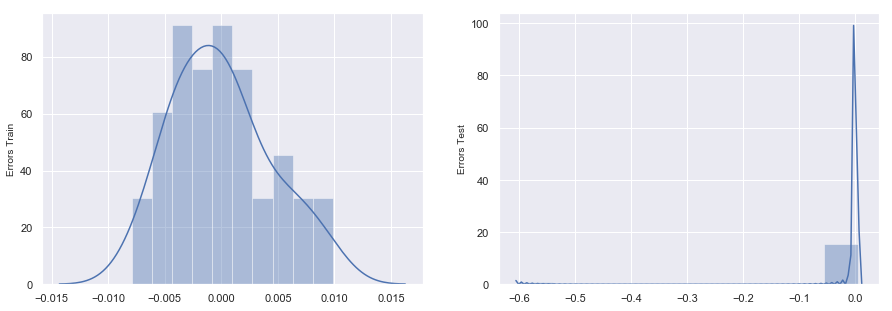

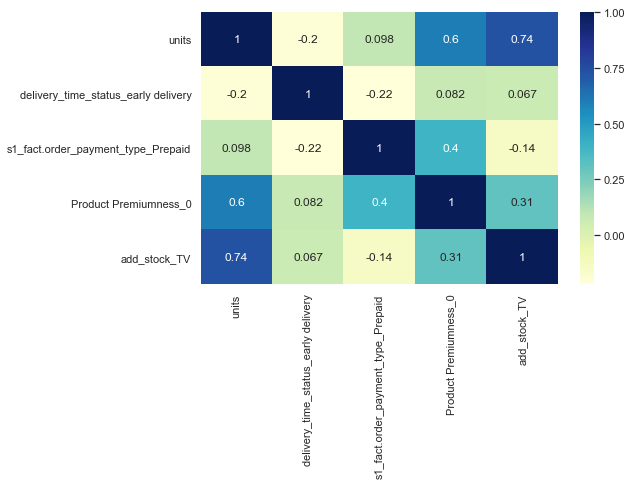

                    0
train r score 0.99968
test r score  0.83860
                 0
rmse_train 0.00434
rmse_test  0.15005


In [637]:
y_train_real_pred, y_test_real_pred, r2_dataframe, rmse_dataframe = predictions_and_residual_analysis_and_rscore(X_train_ln_iter0, 
                                                                                                 y_train_ln,
                                                                                                 X_test_ln,
                                                                                                 y_test_ln,
                                                                                                 model_iter23)
print(r2_dataframe)
print(rmse_dataframe)

### Train Test R Square are high enough but have a large gap making the model high Variance model. We will see if there are any better models in future

### Elasticity of  `GMV` (Revenue)
As per economics, elasticity is the measure of how sensitive dependent variable (in our case, revenue) is to a particular independent variable.

<h3><center> $Elasticity_{gmv} = \frac{\frac{\delta{GMV}}{GMV}}{\frac{\delta{feature}}{feature}} $</centre> </h3>


while plotting elasticity, we will know,
1. Whether GMV is directly or indirectly propostional to a particular feature
2. How varying the dependency is?
3. Where exactly the dependency is? and such



Let us look at the elasticity of revenue with our predictors

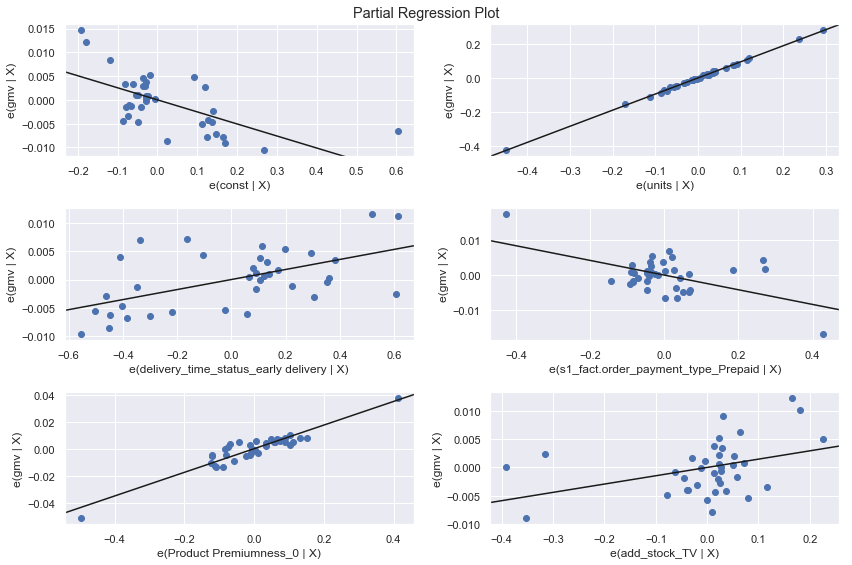

In [638]:
fig = plt.figure(figsize=(12,8))
fig = sm.graphics.plot_partregress_grid(model_iter23, fig=fig)

### Remarks:
It is evident that,
1. Product Premiumness and Units has a good influence on GMV but only after a certain lin=mit of revenue reached
2. Also They wont contribute after an upper limit too
3. Largely the GMV has influence from all features only in its mid range
4. Rest of the features are highly varying
5. Constant and Prepaid delivery has negative influence on gmv

### Model 3: Koyck Model

### Compute Auto-Correlation:
1. By definition, Auto-Correlation determines the correlation of a variable with itself with time.
2. If we can find auto correlation of `gmv` with itself.
3. We know how much of past `gmv` is effecting the current `gmv`


Let us have a look at it

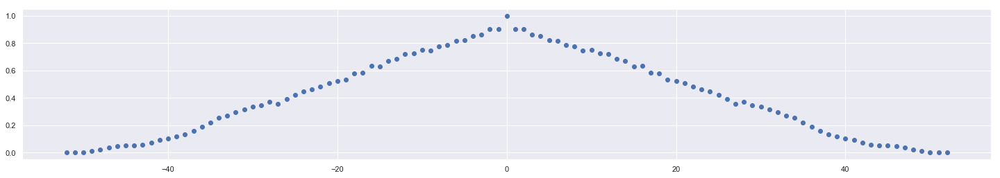

In [639]:
# Auto Correlation Analysis
from pandas.plotting import autocorrelation_plot
gmv = df_combined_camera['gmv']
plt.figure(figsize = (25,4))

plt.acorr(gmv, usevlines=False, normed=True, maxlags=52)
plt.show()

#### Remarks:
1. We can see that `lag GMV` is symmetrical on both sides.
2. We will analyse only one side of the lag Graph. Let us take the positive side
3. Relation between `gmv` and `lag gmv` has a `seasonality or recurring trend` for every 4 lags.
4. So if we take 4 lag features, that will cover the seasonality in all other features too

__We take `4 lag features`__

###  Adding Lag GMV to the existing DataFrame

In [640]:
df_camera_lag = lag_addition(df_combined_camera,4, 'gmv')

In [641]:
df_camera_lag['gmv lag 1'].shape

(53,)

In [642]:
# Our dataframe is df_combined_camera
df_camera_lag.columns

Index(['gmv', 'units', 'product_mrp', 'pay_day', 'special_sale_dates',
       'discount_rate', 'delivery_time_status_early delivery',
       'delivery_time_status_late delivery', 'delivery_time_status_on time',
       's1_fact.order_payment_type_COD', 's1_fact.order_payment_type_Prepaid',
       'Product Premiumness_0', 'Product Premiumness_1',
       'Product Premiumness_2', 'Max Temp (°C)', 'Min Temp (°C)',
       'Mean Temp (°C)', 'Heat Deg Days (°C)', 'Cool Deg Days (°C)',
       'Total Rain (mm)', 'Total Snow (cm)', 'Total Precip (mm)',
       'Snow on Grnd (cm)', 'NPS', 'Stock Index', 'add_stock_TV',
       'add_stock_digital', 'add_stock_sponsorship', 'add_stock_content',
       'add_stock_online', 'add_stock_affiliates', 'add_stock_SEM',
       'gmv lag 1', 'gmv lag 2', 'gmv lag 3', 'gmv lag 4'],
      dtype='object')

###  Univariate and Bivariate Analysis of Lag Data
1. The analysis for all other features was essentially done while performing `linear regression`
2. We will perform the similar analysis for only lags with GMV in this problem
1. This analysis is typically performed for continuous features only. So we choose only a few features to do it
2. Selected features include `gmv`, `discount_rate`, `All add stocks`

#### Box Plots: To check Outliers

In [643]:
import matplotlib
column_list_lag_gmv = ['gmv', 'gmv lag 1', 'gmv lag 2', 'gmv lag 3', 'gmv lag 4']



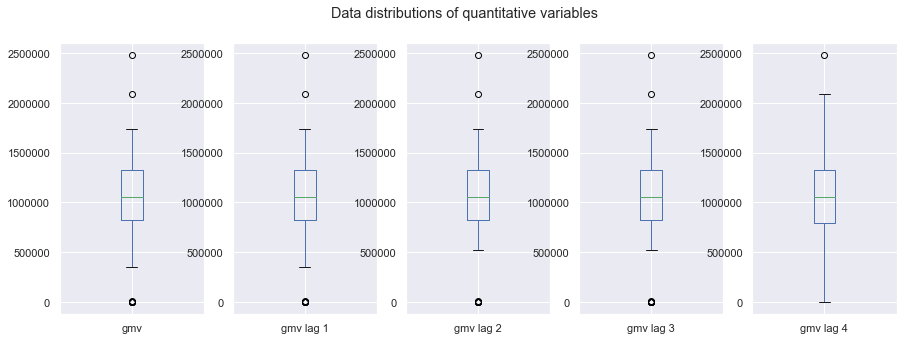

In [644]:
df_camera_lag[column_list_lag_gmv].plot(kind='box',subplots=True,
                                    sharex=False,figsize=(15,5), 
                                    title="Data distributions of quantitative variables")
plt.show()

#### Remarks: 
1. There are rarely any outliers. Even if there, they are mostly zeros that we imputed na with. 

#### Scatter Plots (Bivariate Relationship among lag data) 

<Figure size 720x720 with 0 Axes>

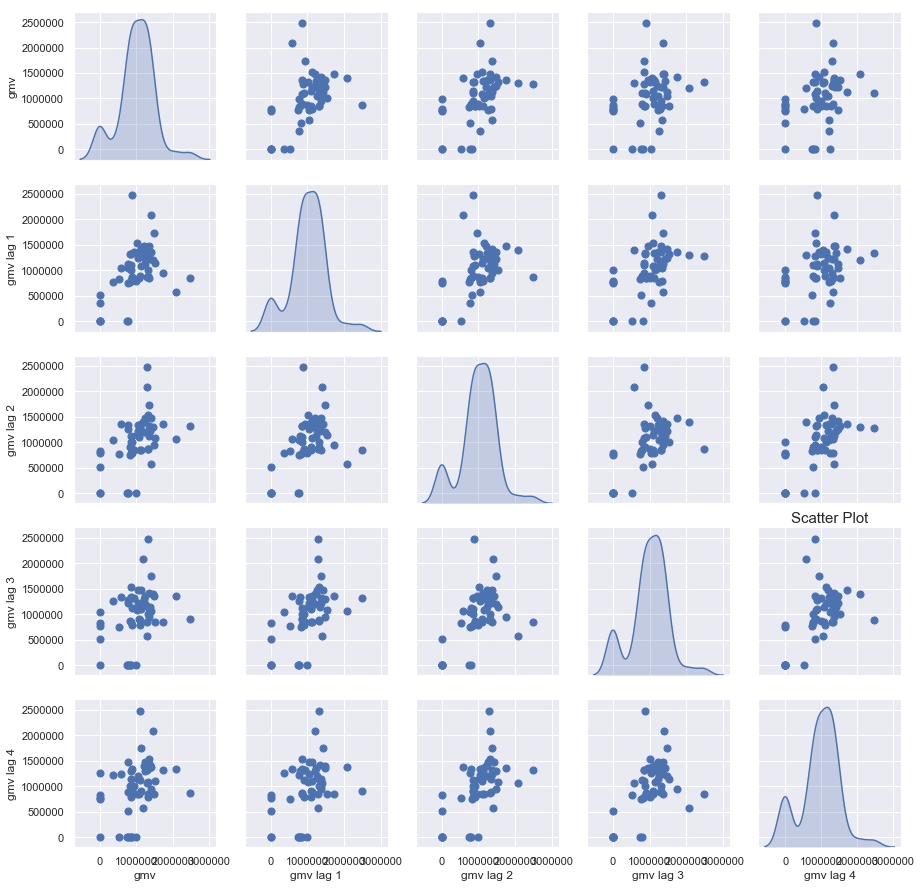

In [645]:
# Draw scatter plot


plt.figure(figsize=(10,10))
sns.set(style="darkgrid")
ax=sns.pairplot(df_camera_lag[column_list_lag_gmv],diag_kind ='kde',
               plot_kws=dict(s=50, edgecolor="b", linewidth=1),diag_kws=dict(shade=True))

plt.title('Scatter Plot',   fontsize=15)
#ax.set_xticklabels(ax.(), rotation=65, ha="right",weight="bold",fontsize=15)


plt.show()

#### Remarks:
##### PART - 1
1. It feels like each lag has a  relation with gmv with heterosedasticity.
2. This means the variability is increasing with time which is expected

####  Heat-Map (Bivariate Relationship among Lag data) 
1. While doing this, we ignored weather components as they are not continuous values.

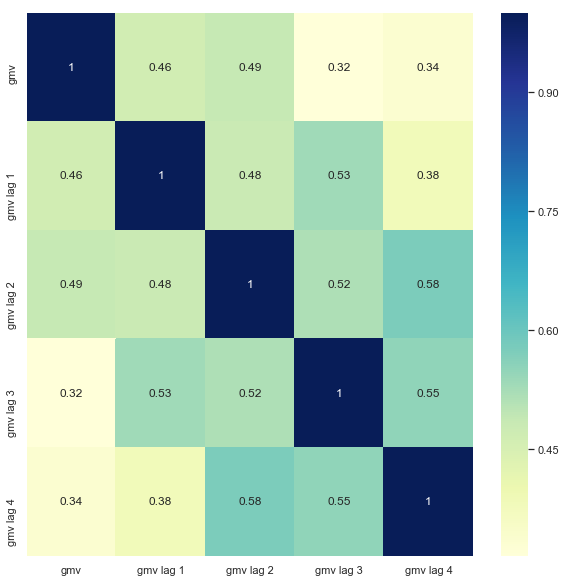

In [646]:
plt.figure(figsize=(10,10))
sns.heatmap(df_camera_lag[column_list_lag_gmv].corr(), 
            annot=True, cmap='YlGnBu')
plt.show()

#### Remarks:
1. We already checked in the auto correlation graph that GMV has decreasing with lag GMV
2. We cannot expect any substantial model difference due to lags because the correlations are not so highlighting

###  Modeling


#### Train-Test Split and Scaling

In [647]:
X_train_lag,y_train_lag,X_test_lag,y_test_lag = split_scale_feature(df_camera_lag)

In [648]:
X_train_lag.shape

(37, 35)

#### Recursive Feature Elimination

In [649]:
X_train_lag_iter0 = rfe_function(X_train_lag,y_train_lag,28)

####  Model Building using StatsModel 

In [650]:
# Results of stats model iteration - 1
X_train_column_list, model_iter1, summary, VIF = statsmodel_vif(X_train_lag_iter0,y_train,[])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.996
Method:                 Least Squares   F-statistic:                     358.0
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           8.99e-11
Time:                        20:16:34   Log-Likelihood:                 135.47
No. Observations:                  37   AIC:                            -214.9
Df Residuals:                       9   BIC:                            -169.8
Df Model:                          27                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
5,s1_fact.order_payment_type_COD,inf
6,s1_fact.order_payment_type_Prepaid,inf
8,Product Premiumness_1,6968.84000
7,Product Premiumness_0,6838.61000
24,add_stock_SEM,1433.78000
3,delivery_time_status_early delivery,1189.71000
4,delivery_time_status_late delivery,1132.53000
12,Mean Temp (°C),824.23000
20,add_stock_digital,713.05000
11,Min Temp (°C),319.31000


#### Remarks: 
1. As we discussed earlier, We shall eliminate one from each feature set every time and we iterate the process until we get a decent model
2. We will start with weather
3. `Mean Temp (°C)` has highest VIF but less P-Value
4. We still choose to drop `Mean Temp (°C)` to handle multi collinearity

In [651]:
# Results of stats model iteration - 2
X_train_column_list, model_iter2, summary, VIF = statsmodel_vif(X_train_lag_iter0,y_train_lag,['Mean Temp (°C)'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.998
Model:                            OLS   Adj. R-squared:                  0.995
Method:                 Least Squares   F-statistic:                     254.2
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           4.79e-11
Time:                        20:16:39   Log-Likelihood:                 126.51
No. Observations:                  37   AIC:                            -199.0
Df Residuals:                      10   BIC:                            -155.5
Df Model:                          26                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
5,s1_fact.order_payment_type_COD,inf
6,s1_fact.order_payment_type_Prepaid,inf
8,Product Premiumness_1,6870.23000
7,Product Premiumness_0,6732.37000
23,add_stock_SEM,1341.57000
3,delivery_time_status_early delivery,1071.70000
4,delivery_time_status_late delivery,1040.99000
19,add_stock_digital,629.12000
20,add_stock_content,194.76000
21,add_stock_online,126.64000


#### Remarks: 
1. In the iteration, we will drop `Snow on Grnd (cm)` which has both high VIF as well as P Value

In [652]:
# Results of stats model iteration - 3
X_train_column_list, model_iter3, summary, VIF = statsmodel_vif(X_train_lag_iter0,y_train_lag,
                                                                ['Snow on Grnd (cm)'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.998
Model:                            OLS   Adj. R-squared:                  0.995
Method:                 Least Squares   F-statistic:                     285.8
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           2.99e-12
Time:                        20:16:42   Log-Likelihood:                 126.18
No. Observations:                  37   AIC:                            -200.4
Df Residuals:                      11   BIC:                            -158.5
Df Model:                          25                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
5,s1_fact.order_payment_type_COD,inf
6,s1_fact.order_payment_type_Prepaid,inf
8,Product Premiumness_1,5767.25000
7,Product Premiumness_0,5644.00000
22,add_stock_SEM,1050.39000
3,delivery_time_status_early delivery,953.11000
4,delivery_time_status_late delivery,900.85000
18,add_stock_digital,567.44000
19,add_stock_content,130.22000
20,add_stock_online,123.53000


#### Remarks:
We are dropping `Product Premiumness_1` since it has both VIF and P Value high

In [653]:
# Results of stats model iteration - 4
X_train_column_list, model_iter4, summary, VIF = statsmodel_vif(X_train_lag_iter0,y_train_lag,
                                                                ['Product Premiumness_1'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.998
Model:                            OLS   Adj. R-squared:                  0.995
Method:                 Least Squares   F-statistic:                     303.2
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           2.42e-13
Time:                        20:16:46   Log-Likelihood:                 124.91
No. Observations:                  37   AIC:                            -199.8
Df Residuals:                      12   BIC:                            -159.6
Df Model:                          24                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
5,s1_fact.order_payment_type_COD,inf
6,s1_fact.order_payment_type_Prepaid,inf
3,delivery_time_status_early delivery,927.13000
21,add_stock_SEM,890.24000
4,delivery_time_status_late delivery,874.90000
17,add_stock_digital,419.22000
18,add_stock_content,126.87000
19,add_stock_online,109.55000
10,Min Temp (°C),77.80000
2,product_mrp,72.04000


#### Remarks:
1. Now let us remove add_stocks
2. `add_stock_affiliates` has both high P-Value and well has slightly high VIF.
3. Let us drop `add_stock_affiliates`

In [654]:
# Results of stats model iteration - 5
X_train_column_list, model_iter5, summary, VIF = statsmodel_vif(X_train_lag_iter0,y_train_lag,
                                                                ['add_stock_affiliates'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.998
Model:                            OLS   Adj. R-squared:                  0.995
Method:                 Least Squares   F-statistic:                     312.6
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           2.31e-14
Time:                        20:16:49   Log-Likelihood:                 123.21
No. Observations:                  37   AIC:                            -198.4
Df Residuals:                      13   BIC:                            -159.8
Df Model:                          23                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
5,s1_fact.order_payment_type_COD,inf
6,s1_fact.order_payment_type_Prepaid,inf
3,delivery_time_status_early delivery,906.06000
20,add_stock_SEM,890.20000
4,delivery_time_status_late delivery,843.33000
17,add_stock_digital,413.74000
18,add_stock_content,122.60000
10,Min Temp (°C),76.76000
2,product_mrp,71.99000
1,units,67.84000


#### Remarks:
Let us drop `product_mrp` which has high VIF and p-values

In [655]:
# Results of stats model iteration - 5
X_train_column_list, model_iter5, summary, VIF = statsmodel_vif(X_train_lag_iter0,y_train_lag,['product_mrp'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.998
Model:                            OLS   Adj. R-squared:                  0.995
Method:                 Least Squares   F-statistic:                     350.3
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.23e-15
Time:                        20:16:52   Log-Likelihood:                 123.13
No. Observations:                  37   AIC:                            -200.3
Df Residuals:                      14   BIC:                            -163.2
Df Model:                          22                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
4,s1_fact.order_payment_type_COD,inf
5,s1_fact.order_payment_type_Prepaid,inf
19,add_stock_SEM,886.16000
2,delivery_time_status_early delivery,568.75000
3,delivery_time_status_late delivery,521.82000
16,add_stock_digital,408.01000
17,add_stock_content,97.04000
18,add_stock_online,59.94000
9,Min Temp (°C),47.44000
8,Max Temp (°C),25.49000


#### Remarks:
Let us drop `Product Premiumness_0` which has high p-value

In [656]:
# Results of stats model iteration - 6
X_train_column_list, model_iter6, summary, VIF = statsmodel_vif(X_train_lag_iter0,y_train_lag,['Product Premiumness_0'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.998
Model:                            OLS   Adj. R-squared:                  0.996
Method:                 Least Squares   F-statistic:                     390.1
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           6.42e-17
Time:                        20:16:55   Log-Likelihood:                 122.98
No. Observations:                  37   AIC:                            -202.0
Df Residuals:                      15   BIC:                            -166.5
Df Model:                          21                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
4,s1_fact.order_payment_type_COD,inf
5,s1_fact.order_payment_type_Prepaid,inf
18,add_stock_SEM,845.68000
2,delivery_time_status_early delivery,508.08000
3,delivery_time_status_late delivery,490.45000
15,add_stock_digital,384.78000
16,add_stock_content,96.51000
8,Min Temp (°C),47.13000
17,add_stock_online,46.93000
7,Max Temp (°C),25.39000


#### Remarks:
1. `add_stock_TV` has high P Value 
2. Since we have content add stock so far, we are dropping `add_stock_TV`

In [657]:
# Results of stats model iteration - 7
X_train_column_list, model_iter7, summary, VIF = statsmodel_vif(X_train_lag_iter0,y_train_lag,['add_stock_TV'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.998
Model:                            OLS   Adj. R-squared:                  0.995
Method:                 Least Squares   F-statistic:                     392.4
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           7.03e-18
Time:                        20:16:57   Log-Likelihood:                 120.99
No. Observations:                  37   AIC:                            -200.0
Df Residuals:                      16   BIC:                            -166.2
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
4,s1_fact.order_payment_type_COD,inf
5,s1_fact.order_payment_type_Prepaid,inf
17,add_stock_SEM,844.65000
2,delivery_time_status_early delivery,508.04000
3,delivery_time_status_late delivery,490.44000
14,add_stock_digital,382.54000
15,add_stock_content,96.41000
8,Min Temp (°C),47.13000
16,add_stock_online,43.36000
7,Max Temp (°C),25.39000


#### Remarks:
1. Let us drop `Min Temp (°C)` due to high VIF

In [658]:
# Results of stats model iteration - 8
X_train_column_list, model_iter8, summary, VIF = statsmodel_vif(X_train_lag_iter0,y_train_lag,
                                                                ['Min Temp (°C)'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.997
Model:                            OLS   Adj. R-squared:                  0.995
Method:                 Least Squares   F-statistic:                     355.0
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.96e-18
Time:                        20:17:00   Log-Likelihood:                 117.08
No. Observations:                  37   AIC:                            -194.2
Df Residuals:                      17   BIC:                            -161.9
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
4,s1_fact.order_payment_type_COD,inf
5,s1_fact.order_payment_type_Prepaid,inf
16,add_stock_SEM,692.04000
2,delivery_time_status_early delivery,504.60000
3,delivery_time_status_late delivery,488.67000
13,add_stock_digital,328.90000
14,add_stock_content,82.39000
15,add_stock_online,39.81000
7,Max Temp (°C),14.15000
11,NPS,10.23000


#### Remarks:
1. Let us drop `Heat Deg Days (°C)` due to high p-value

In [659]:
# Results of stats model iteration - 9
X_train_column_list, model_iter9, summary, VIF = statsmodel_vif(X_train_lag_iter0,y_train_lag,['Heat Deg Days (°C)'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.997
Model:                            OLS   Adj. R-squared:                  0.995
Method:                 Least Squares   F-statistic:                     386.2
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.22e-19
Time:                        20:17:02   Log-Likelihood:                 116.58
No. Observations:                  37   AIC:                            -195.2
Df Residuals:                      18   BIC:                            -164.6
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
4,s1_fact.order_payment_type_COD,inf
5,s1_fact.order_payment_type_Prepaid,inf
15,add_stock_SEM,656.36000
2,delivery_time_status_early delivery,393.51000
3,delivery_time_status_late delivery,372.75000
12,add_stock_digital,327.31000
13,add_stock_content,58.83000
14,add_stock_online,39.71000
10,NPS,10.16000
7,Max Temp (°C),8.49000


#### Remarks:
Let us drop `add_stock_SEM` as it has high VIF

In [660]:
# Results of stats model iteration - 10
X_train_column_list, model_iter10, summary, VIF = statsmodel_vif(X_train_lag_iter0,y_train_lag,
                                                                 ['add_stock_SEM'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.997
Model:                            OLS   Adj. R-squared:                  0.994
Method:                 Least Squares   F-statistic:                     373.7
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           2.23e-20
Time:                        20:17:05   Log-Likelihood:                 113.92
No. Observations:                  37   AIC:                            -191.8
Df Residuals:                      19   BIC:                            -162.8
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
4,s1_fact.order_payment_type_COD,inf
5,s1_fact.order_payment_type_Prepaid,inf
2,delivery_time_status_early delivery,348.47000
3,delivery_time_status_late delivery,328.88000
13,add_stock_content,29.95000
12,add_stock_digital,24.51000
10,NPS,9.01000
8,Cool Deg Days (°C),8.22000
7,Max Temp (°C),8.16000
14,add_stock_online,7.65000


#### Remarks:
1. Let us drop `gmv lag 2` which has high P Value

In [661]:
# Results of stats model iteration - 11
X_train_column_list, model_iter11, summary, VIF = statsmodel_vif(X_train_lag_iter0,y_train_lag,['gmv lag 2'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.997
Model:                            OLS   Adj. R-squared:                  0.995
Method:                 Least Squares   F-statistic:                     417.5
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.07e-21
Time:                        20:17:08   Log-Likelihood:                 113.90
No. Observations:                  37   AIC:                            -193.8
Df Residuals:                      20   BIC:                            -166.4
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
4,s1_fact.order_payment_type_COD,inf
5,s1_fact.order_payment_type_Prepaid,inf
2,delivery_time_status_early delivery,341.47000
3,delivery_time_status_late delivery,326.98000
13,add_stock_content,29.90000
12,add_stock_digital,23.90000
10,NPS,8.19000
8,Cool Deg Days (°C),7.92000
7,Max Temp (°C),7.65000
14,add_stock_online,6.85000


#### Remarks:
Let us drop `Total Snow (cm)`for having high p-value

In [662]:
# Results of stats model iteration - 12
X_train_column_list, model_iter12, summary, VIF = statsmodel_vif(X_train_lag_iter0,y_train_lag,['Total Snow (cm)'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.997
Model:                            OLS   Adj. R-squared:                  0.995
Method:                 Least Squares   F-statistic:                     439.5
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           9.21e-23
Time:                        20:17:10   Log-Likelihood:                 112.76
No. Observations:                  37   AIC:                            -193.5
Df Residuals:                      21   BIC:                            -167.7
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
4,s1_fact.order_payment_type_COD,inf
5,s1_fact.order_payment_type_Prepaid,inf
2,delivery_time_status_early delivery,341.17000
3,delivery_time_status_late delivery,326.95000
12,add_stock_content,29.32000
11,add_stock_digital,23.84000
9,NPS,8.17000
8,Cool Deg Days (°C),7.60000
13,add_stock_online,6.84000
7,Max Temp (°C),6.80000


#### Remarks:
Let us drop `gmv lag 4` as it has high p-value

In [663]:
# Results of stats model iteration - 13
X_train_column_list, model_iter13, summary, VIF = statsmodel_vif(X_train_lag_iter0,y_train_lag,['gmv lag 4'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.997
Model:                            OLS   Adj. R-squared:                  0.995
Method:                 Least Squares   F-statistic:                     490.9
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           4.25e-24
Time:                        20:17:13   Log-Likelihood:                 112.67
No. Observations:                  37   AIC:                            -195.3
Df Residuals:                      22   BIC:                            -171.2
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
4,s1_fact.order_payment_type_COD,inf
5,s1_fact.order_payment_type_Prepaid,inf
2,delivery_time_status_early delivery,295.74000
3,delivery_time_status_late delivery,285.62000
12,add_stock_content,28.26000
11,add_stock_digital,23.61000
9,NPS,7.68000
8,Cool Deg Days (°C),6.76000
13,add_stock_online,6.73000
7,Max Temp (°C),6.24000


#### Remarks:
Let us drop `gmv lag 3` as it has high p-value

In [664]:
# Results of stats model iteration - 14
X_train_column_list, model_iter14, summary, VIF = statsmodel_vif(X_train_lag_iter0,y_train_lag,['gmv lag 3'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.997
Model:                            OLS   Adj. R-squared:                  0.995
Method:                 Least Squares   F-statistic:                     517.2
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           3.75e-25
Time:                        20:17:16   Log-Likelihood:                 111.45
No. Observations:                  37   AIC:                            -194.9
Df Residuals:                      23   BIC:                            -172.3
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
4,s1_fact.order_payment_type_COD,inf
5,s1_fact.order_payment_type_Prepaid,inf
2,delivery_time_status_early delivery,291.80000
3,delivery_time_status_late delivery,282.00000
12,add_stock_content,22.05000
11,add_stock_digital,20.56000
9,NPS,7.57000
8,Cool Deg Days (°C),6.13000
7,Max Temp (°C),5.97000
13,add_stock_online,4.69000


#### Remarks:
Let us drop `NPS` as it has high VIF

In [665]:
# Results of stats model iteration - 15
X_train_column_list, model_iter15, summary, VIF = statsmodel_vif(X_train_lag_iter0,y_train_lag,['NPS'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.996
Model:                            OLS   Adj. R-squared:                  0.993
Method:                 Least Squares   F-statistic:                     443.5
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           4.06e-25
Time:                        20:17:18   Log-Likelihood:                 106.35
No. Observations:                  37   AIC:                            -186.7
Df Residuals:                      24   BIC:                            -165.8
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
4,s1_fact.order_payment_type_COD,inf
5,s1_fact.order_payment_type_Prepaid,inf
3,delivery_time_status_late delivery,242.12000
2,delivery_time_status_early delivery,232.55000
11,add_stock_content,21.59000
10,add_stock_digital,20.32000
7,Max Temp (°C),5.64000
8,Cool Deg Days (°C),5.19000
12,add_stock_online,4.63000
13,gmv lag 1,2.78000


#### Remarks:
1. `add_stock_TV` has a high P Value, Let us drop it 

In [666]:
# Results of stats model iteration - 16
X_train_column_list, model_iter16, summary, VIF = statsmodel_vif(X_train_lag_iter0,y_train_lag,['s1_fact.order_payment_type_Prepaid'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.996
Model:                            OLS   Adj. R-squared:                  0.993
Method:                 Least Squares   F-statistic:                     443.5
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           4.06e-25
Time:                        20:17:21   Log-Likelihood:                 106.35
No. Observations:                  37   AIC:                            -186.7
Df Residuals:                      24   BIC:                            -165.8
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
0,const,1456.83000
3,delivery_time_status_late delivery,242.12000
2,delivery_time_status_early delivery,232.55000
10,add_stock_content,21.59000
9,add_stock_digital,20.32000
6,Max Temp (°C),5.64000
7,Cool Deg Days (°C),5.19000
11,add_stock_online,4.63000
12,gmv lag 1,2.78000
1,units,2.58000


#### Remarks:
Let us drop `s1_fact.order_payment_type_Prepaid` as it has high p-value

In [667]:
# Results of stats model iteration - 17
X_train_column_list, model_iter17, summary, VIF = statsmodel_vif(X_train_lag_iter0,y_train_lag,['Stock Index'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.996
Model:                            OLS   Adj. R-squared:                  0.994
Method:                 Least Squares   F-statistic:                     502.8
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.80e-26
Time:                        20:17:24   Log-Likelihood:                 106.31
No. Observations:                  37   AIC:                            -188.6
Df Residuals:                      25   BIC:                            -169.3
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
0,const,1413.09000
3,delivery_time_status_late delivery,240.72000
2,delivery_time_status_early delivery,229.48000
9,add_stock_content,21.30000
8,add_stock_digital,19.46000
6,Max Temp (°C),5.63000
7,Cool Deg Days (°C),5.19000
10,add_stock_online,4.60000
11,gmv lag 1,2.76000
1,units,2.58000


#### Remarks:
1. As a next iteration, let us drop `Cool Deg Days (°C)` due to high P Value

In [668]:
# Results of stats model iteration - 18
X_train_column_list, model_iter18, summary, VIF = statsmodel_vif(X_train_lag_iter0,y_train_lag,['Cool Deg Days (°C)'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.995
Model:                            OLS   Adj. R-squared:                  0.993
Method:                 Least Squares   F-statistic:                     536.2
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.80e-27
Time:                        20:17:26   Log-Likelihood:                 105.02
No. Observations:                  37   AIC:                            -188.0
Df Residuals:                      26   BIC:                            -170.3
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
0,const,1412.38000
3,delivery_time_status_late delivery,240.48000
2,delivery_time_status_early delivery,229.33000
8,add_stock_content,21.15000
7,add_stock_digital,18.87000
9,add_stock_online,4.59000
10,gmv lag 1,2.68000
1,units,2.56000
6,Max Temp (°C),2.56000
4,s1_fact.order_payment_type_COD,1.65000


In [670]:
### Let us remove COD for high P value

# Results of stats model iteration - 19
X_train_column_list, model_iter19, summary, VIF = statsmodel_vif(X_train_lag_iter0,y_train_lag,['s1_fact.order_payment_type_COD'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.995
Model:                            OLS   Adj. R-squared:                  0.994
Method:                 Least Squares   F-statistic:                     613.9
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           7.74e-29
Time:                        20:18:42   Log-Likelihood:                 104.87
No. Observations:                  37   AIC:                            -189.7
Df Residuals:                      27   BIC:                            -173.6
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
0,const,1350.92000
3,delivery_time_status_late delivery,227.46000
2,delivery_time_status_early delivery,222.47000
7,add_stock_content,20.65000
6,add_stock_digital,17.90000
8,add_stock_online,4.54000
1,units,2.52000
9,gmv lag 1,2.42000
5,Max Temp (°C),1.98000
4,Product Premiumness_2,1.30000


In [671]:
### Let us drop early and late delivery from data
# Results of stats model iteration - 20
X_train_column_list, model_iter20, summary, VIF = statsmodel_vif(X_train_lag_iter0,y_train_lag,
                                                ['delivery_time_status_late delivery','delivery_time_status_early delivery'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.993
Model:                            OLS   Adj. R-squared:                  0.991
Method:                 Least Squares   F-statistic:                     599.5
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.34e-29
Time:                        20:20:18   Log-Likelihood:                 98.503
No. Observations:                  37   AIC:                            -181.0
Df Residuals:                      29   BIC:                            -168.1
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                     0.06

,Features,VIF
0,const,20.01000
5,add_stock_content,17.88000
4,add_stock_digital,14.84000
6,add_stock_online,3.74000
1,units,2.02000
7,gmv lag 1,2.02000
3,Max Temp (°C),1.28000
2,Product Premiumness_2,1.17000


#### Remarks
1. `<0.06` signifies 95% confidance of feature importance and we achieved that
2. In our case, we have very less data as small as 37 points to model the data
3. We considered VIF < 10 as a stop point. Due to less data, otherwise model is too sensitive and P Values change drastically
5. So let us stop modeling here

__Important:__ __We successfully maintained the R Square and Adjusted R Square Scores__

#### 13.3 Residual Analysis of Train Test Data

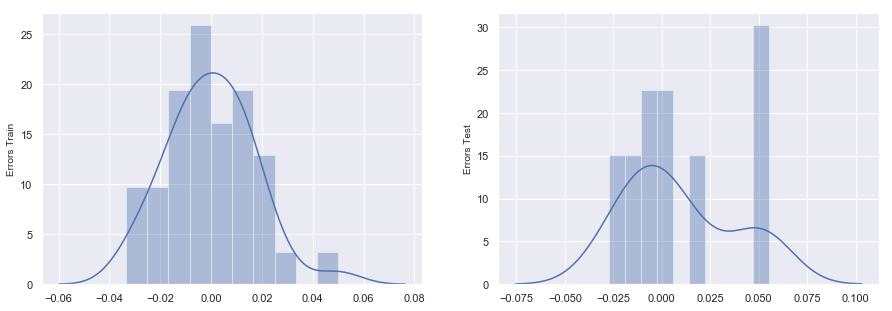

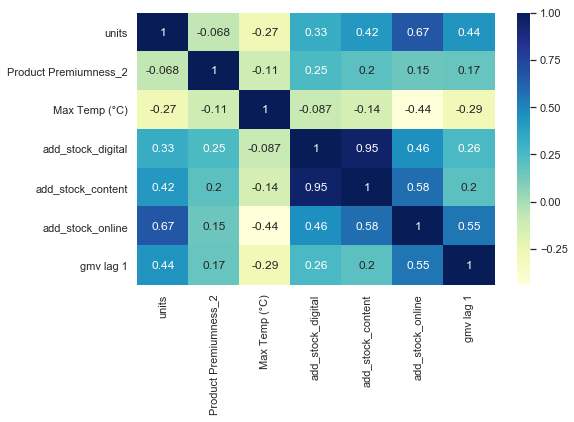

                    0
train r score 0.99314
test r score  0.97325
                 0
rmse_train 0.01689
rmse_test  0.02859


In [672]:
y_train_real_pred, y_test_real_pred, r2_dataframe, rmse_dataframe = predictions_and_residual_analysis_and_rscore(X_train_lag_iter0, 
                                                                                                 y_train_lag,
                                                                                                 X_test_lag,
                                                                                                 y_test_lag,
                                                                                                 model_iter20)
print(r2_dataframe)
print(rmse_dataframe)

### Train Test R Squared Scores are representing high variance models. This model is not appropriate for consideration 

### Elasticity of  `GMV` (Revenue)
As per economics, elasticity is the measure of how sensitive dependent variable (in our case, revenue) is to a particular independent variable.

<h3><center> $Elasticity_{gmv} = \frac{\frac{\delta{GMV}}{GMV}}{\frac{\delta{feature}}{feature}} $</centre> </h3>


while plotting elasticity, we will know,
1. Whether GMV is directly or indirectly propostional to a particular feature
2. How varying the dependency is?
3. Where exactly the dependency is? and such



Let us look at the elasticity of revenue with our predictors

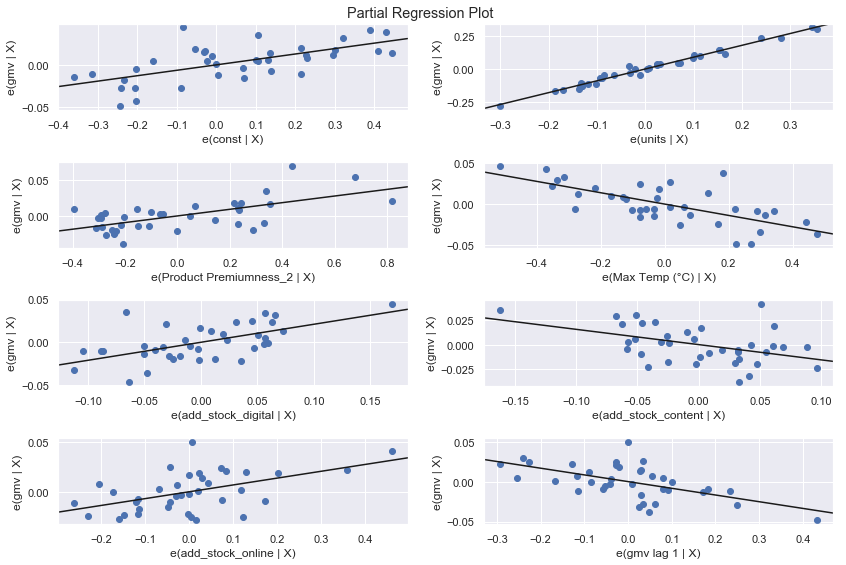

In [673]:
fig = plt.figure(figsize=(12,8))
fig = sm.graphics.plot_partregress_grid(model_iter20, fig=fig)

### Remarks:
It is evident that,
1. Weather (Max Temp) and Lagged GMV have a negative influence on GMV
2. As usual Units had a great influence on GMV
3. Other features also positively influence but variability in elasticity is high

### Model 4: Distribute lag Model 

In [506]:
df_combined_camera.shape

(53, 32)

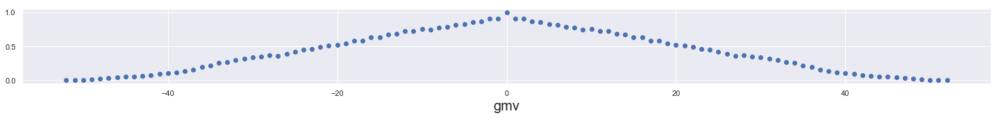

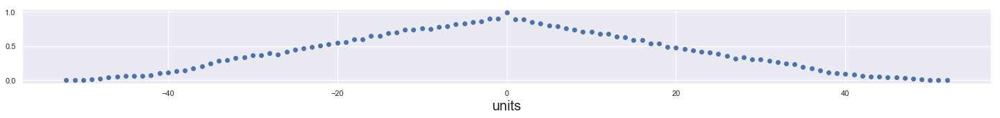

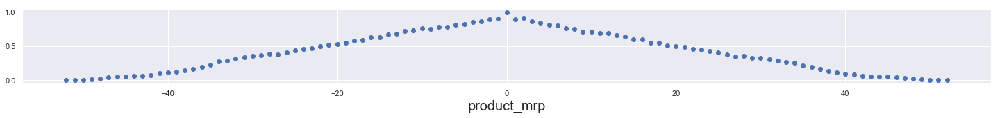

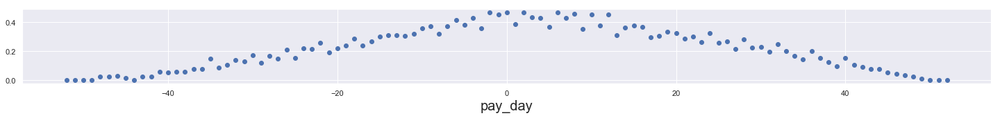

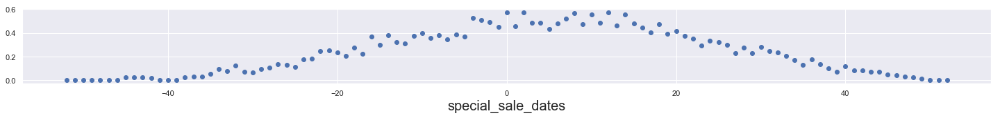

...

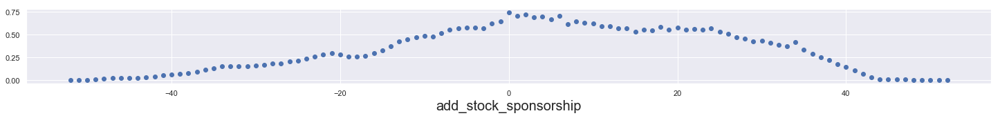

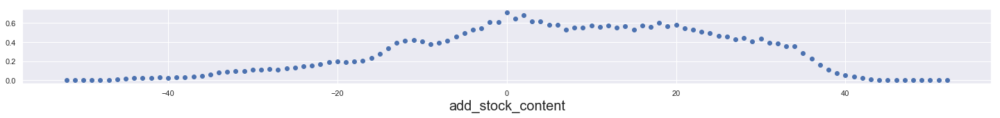

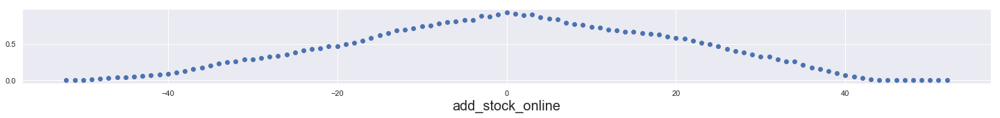

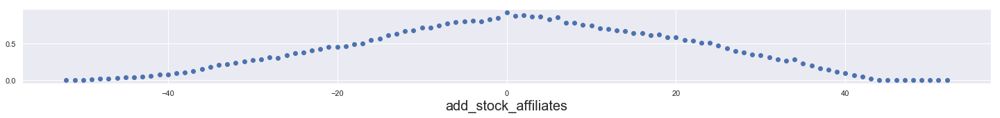

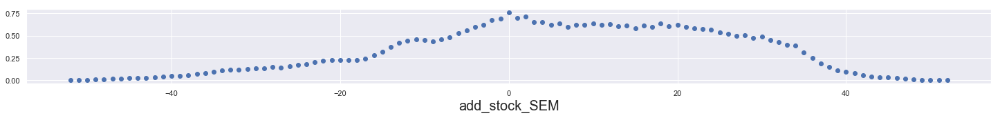

In [674]:
# Auto Correlation Analysis
from pandas.plotting import autocorrelation_plot
for i in list(df_combined_camera.columns):
    plt.figure(figsize = (25,2))
    plt.xcorr(df_combined_camera['gmv'],df_combined_camera[i],usevlines=False, normed=True, maxlags=52)
    plt.xlabel(i, fontsize = 20)
    plt.show()

#### Remarks:
1. As we can see, we computed the auto-correlation and cross correlation of all features with GMV.
2. For choosing the lag, we will lay some ground rules.
3. Any `lag with correlation > 0.75` is strongly correlated and we take those number of lags
4. Any `features with lags with correlation < 0.75` are negligible features in terms of lags but as standard we take 3 lags for them.
5. We ignore other lags.
6. Choice of Lags:
    1. `gmv`: 4
    2. `units`: 3
    3. `product_mrp`: 4
    4. `pay_day`: 3
    5. `special_sale_dates`: 3
    6. `discount_rate`: 7
    7. `delivery_time_status_early delivery`: 10
    8. `delivery_time_status_late delivery`: 3
    9. `delivery_time_status_on time`: 7
    10. `s1_fact.order_payment_type_COD`: 6
    11. `s1_fact.order_payment_type_Prepaid`:3
    12. `Product Premiumness_0`: 6
    13. `Product Premiumness_1`: 6
    14. `Product Premiumness_2`: 3
    15. `Max Temp (°C)`: 3
    16. `Min Temp (°C)`: 3
    17. `Mean Temp (°C)`: 3
    18. `Heat Deg Days (°C)`: 3
    19. `Cool Deg Days (°C)`: 3
    20. `Total Rain (mm)`: 3
    21. `Total Snow (cm)`: 3
    22. `Total Precip (mm)`: 3
    23. `Snow on Grnd (cm)`: 3
    24. `NPS`: 3
    25. `Stock Index`: 3
    26. `add_stock_TV`: 3
    27. `add_stock_digital`: 3 
    28. `add_stock_sponsorship`: 3
    29. `add_stock_content`: 3
    30. `add_stock_online`: 3
    31. `add_stock_affiliates`: 3
    32. `add_stock_SEM`: 3


##### Note-1: All features with lag 3 are mostly because they have < 0.75 correlation with GMV
##### Note-2: Others have good correlation, hence retailed.
#### `Note-3`: Since most of them are 3, we will keep all at 3

### Adding Lag GMV to the existing DataFrame

In [685]:
# Making Lag Disctionary
dict_lag_values = {}
#list_lags = [4,3,4,3,3,7,10,3,7,6,3,6,6,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3]
#len(list_lags)
for i in range(len(list(df_combined_camera.columns))):
    dict_lag_values[list(df_combined_camera.columns)[i]] = 3

In [686]:
# Lag Generation for Distributed Lag Models
df_camera_distlag = df_combined_camera.copy()
for key,value in dict_lag_values.items():
    df_camera_distlag = lag_addition(df_camera_distlag,value, key)


In [687]:
# Cross Checking the Lags
df_camera_distlag[['add_stock_SEM lag 1', 'add_stock_SEM lag 2', 'add_stock_SEM lag 3']].head()

,add_stock_SEM lag 1,add_stock_SEM lag 2,add_stock_SEM lag 3
datetime stamp,,,
2015-07-01,0.00000,0.00000,0.00000
2015-07-06,0.01306,0.00000,0.00000
2015-07-13,1.30914,0.01306,0.00000
2015-07-20,1.90422,1.30914,0.01306
2015-07-27,2.24105,1.90422,1.30914


In [688]:
df_camera_distlag.shape

(53, 128)

### Univariate and Bivariate Analysis of Lag Data
1. We already made a `correlation analysis for choosing lags`.
2. All lag variables are any way correlated to each other due to their construct

#### Note - 1 Any Plot we make wont actually look good with so many values. We are ignoring Box and Scatter Plots for these

#### Box Plots: To check Outliers
Let us plot an example scatter plot to explain what i mean

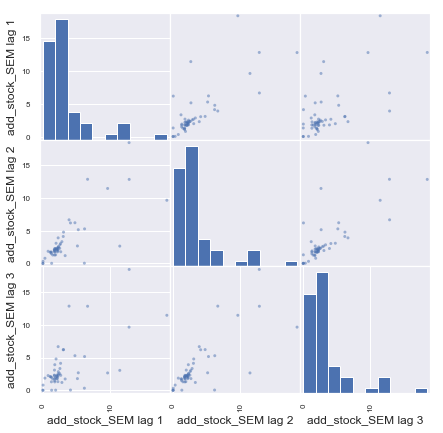

In [689]:
import matplotlib
from pandas.plotting import scatter_matrix
scatter_matrix(df_camera_distlag[['add_stock_SEM lag 1', 'add_stock_SEM lag 2', 'add_stock_SEM lag 3']], 
                  figsize = (7,7))
plt.show()

#### Remarks: All scatter plots will tend to behave same. Linear but with skedacticity (high variance)

#### Remarks:
1. We already checked in the auto correlation graph that GMV has decreasing with lag GMV
2. We cannot expect any substantial model difference due to lags because the correlations are not so highlighting

### Modeling


#### Train-Test Split and Scaling

In [690]:
X_train_distlag,y_train_distlag,X_test_distlag,y_test_distlag = split_scale_feature(df_camera_distlag)

In [691]:
X_train_distlag.shape

(37, 127)

#### Recursive Feature Elimination
1. With only 37 rows, I cannot efford to have more than 1/3rd the features to get good models
2. For this reason, we still keep `our rfe at 30`

In [692]:
X_train_distlag_iter0 = rfe_function(X_train_distlag,y_train_distlag,30)

#### Model Building using StatsModel 

In [693]:
# Results of stats model iteration - 1
X_train_column_list, model_iter1, summary, VIF = statsmodel_vif(X_train_distlag_iter0,y_train,[])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 1.477e+04
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.69e-12
Time:                        20:26:36   Log-Likelihood:                 213.72
No. Observations:                  37   AIC:                            -365.4
Df Residuals:                       6   BIC:                            -315.5
Df Model:                          30                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

,Features,VIF
7,add_stock_digital,1880.75000
10,add_stock_SEM,1376.47000
9,add_stock_affiliates,706.46000
1,units,527.51000
8,add_stock_sponsorship,343.86000
2,product_mrp,175.25000
15,delivery_time_status_late delivery lag 3,58.03000
30,add_stock_online lag 3,42.89000
22,Mean Temp (°C) lag 2,40.69000
29,add_stock_sponsorship lag 3,36.80000


#### Remarks: 
1. rfe captured quite a number of lag variables. Let us see how model turns out
2. As step 1, we will drop all columns with high VIF and P Value first
3. Each column from different feature set at a time
4. We are dropping `add_stock_SEM` first from weather data as it has less influence on GMV and has significant p-value

In [695]:
# Results of stats model iteration - 2
X_train_column_list, model_iter2, summary, VIF = statsmodel_vif(X_train_distlag_iter0,y_train_distlag,
                                                                ['add_stock_SEM'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  0.999
Method:                 Least Squares   F-statistic:                     1617.
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           5.37e-11
Time:                        20:27:11   Log-Likelihood:                 169.32
No. Observations:                  37   AIC:                            -278.6
Df Residuals:                       7   BIC:                            -230.3
Df Model:                          29                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

,Features,VIF
1,units,341.98000
9,add_stock_affiliates,176.55000
8,add_stock_sponsorship,164.03000
2,product_mrp,108.66000
7,add_stock_digital,75.27000
29,add_stock_online lag 3,42.85000
0,const,36.26000
14,delivery_time_status_late delivery lag 3,35.62000
21,Mean Temp (°C) lag 2,35.56000
27,add_stock_TV lag 2,24.28000


#### Remarks: 
1. In this iteration, we will drop `product_mrp` which has P Value and its contribution to GMV is less

In [696]:
# Results of stats model iteration - 3
X_train_column_list, model_iter3, summary, VIF = statsmodel_vif(X_train_distlag_iter0,y_train_distlag,
                                                                ['product_mrp'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.997
Method:                 Least Squares   F-statistic:                     414.8
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           5.31e-10
Time:                        20:27:15   Log-Likelihood:                 141.04
No. Observations:                  37   AIC:                            -224.1
Df Residuals:                       8   BIC:                            -177.4
Df Model:                          28                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

,Features,VIF
7,add_stock_sponsorship,143.35000
8,add_stock_affiliates,136.51000
6,add_stock_digital,52.19000
1,units,51.68000
0,const,36.06000
28,add_stock_online lag 3,31.55000
13,delivery_time_status_late delivery lag 3,26.09000
20,Mean Temp (°C) lag 2,24.33000
26,add_stock_TV lag 2,22.32000
27,add_stock_sponsorship lag 3,16.08000


#### Remarks:
Let's drop `add_stock_sponsorship` for having high p-value

In [699]:
# Results of stats model iteration - 4
X_train_column_list, model_iter4, summary, VIF = statsmodel_vif(X_train_distlag_iter0,y_train_distlag,
                                                                ['add_stock_sponsorship'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.997
Method:                 Least Squares   F-statistic:                     402.5
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           5.31e-11
Time:                        20:28:17   Log-Likelihood:                 137.64
No. Observations:                  37   AIC:                            -219.3
Df Residuals:                       9   BIC:                            -174.2
Df Model:                          27                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

,Features,VIF
1,units,50.95000
0,const,35.95000
27,add_stock_online lag 3,28.77000
12,delivery_time_status_late delivery lag 3,25.89000
19,Mean Temp (°C) lag 2,20.09000
26,add_stock_sponsorship lag 3,16.06000
6,add_stock_digital,14.99000
25,add_stock_TV lag 2,12.10000
7,add_stock_affiliates,10.38000
14,delivery_time_status_on time lag 3,8.26000


#### Remarks:
Let's drop `add_stock_online lag 3` as it has high p-value and VIF

In [700]:
# Results of stats model iteration - 5
X_train_column_list, model_iter5, summary, VIF = statsmodel_vif(X_train_distlag_iter0,y_train_distlag,
                                                                ['add_stock_online lag 3'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.996
Method:                 Least Squares   F-statistic:                     382.0
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           6.31e-12
Time:                        20:29:00   Log-Likelihood:                 134.03
No. Observations:                  37   AIC:                            -214.1
Df Residuals:                      10   BIC:                            -170.6
Df Model:                          26                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,35.81000
1,units,27.74000
12,delivery_time_status_late delivery lag 3,25.44000
19,Mean Temp (°C) lag 2,14.81000
25,add_stock_TV lag 2,11.48000
26,add_stock_sponsorship lag 3,11.25000
7,add_stock_affiliates,9.93000
6,add_stock_digital,8.72000
2,special_sale_dates,6.12000
18,Product Premiumness_2 lag 3,5.91000


#### Remarks:
Let's drop `add_stock_TV lag 2` as it has high p-value and VIF

In [701]:
# Results of stats model iteration - 5
X_train_column_list, model_iter5, summary, VIF = statsmodel_vif(X_train_distlag_iter0,y_train_distlag,
                                                                ['add_stock_TV lag 2'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.996
Method:                 Least Squares   F-statistic:                     381.4
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           6.16e-13
Time:                        20:29:06   Log-Likelihood:                 131.51
No. Observations:                  37   AIC:                            -211.0
Df Residuals:                      11   BIC:                            -169.1
Df Model:                          25                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,35.71000
1,units,26.77000
12,delivery_time_status_late delivery lag 3,25.44000
19,Mean Temp (°C) lag 2,14.38000
7,add_stock_affiliates,9.91000
6,add_stock_digital,8.70000
18,Product Premiumness_2 lag 3,5.86000
2,special_sale_dates,5.69000
15,s1_fact.order_payment_type_COD lag 1,5.42000
10,special_sale_dates lag 2,5.36000


#### Remarks:
1. Let us drop `delivery_time_status_late delivery lag 3` which has high p-value


In [703]:
# Results of stats model iteration - 6
X_train_column_list, model_iter6, summary, VIF = statsmodel_vif(X_train_distlag_iter0,y_train_distlag,
                                                                ['delivery_time_status_late delivery lag 3'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.997
Model:                            OLS   Adj. R-squared:                  0.992
Method:                 Least Squares   F-statistic:                     194.9
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           3.39e-12
Time:                        20:29:40   Log-Likelihood:                 116.76
No. Observations:                  37   AIC:                            -183.5
Df Residuals:                      12   BIC:                            -143.2
Df Model:                          24                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,35.66000
18,Mean Temp (°C) lag 2,6.85000
1,units,6.04000
19,Total Rain (mm) lag 1,4.06000
7,add_stock_affiliates,4.05000
10,special_sale_dates lag 2,3.93000
13,delivery_time_status_on time lag 3,3.80000
4,Heat Deg Days (°C),3.67000
17,Product Premiumness_2 lag 3,3.65000
24,add_stock_sponsorship lag 3,3.57000


#### Remarks:
1. Let's drop `special_sale_dates` has high VIF


In [704]:
# Results of stats model iteration - 7
X_train_column_list, model_iter7, summary, VIF = statsmodel_vif(X_train_distlag_iter0,y_train_distlag,
                                                                ['special_sale_dates'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.997
Model:                            OLS   Adj. R-squared:                  0.992
Method:                 Least Squares   F-statistic:                     202.7
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           3.80e-13
Time:                        20:30:17   Log-Likelihood:                 115.21
No. Observations:                  37   AIC:                            -182.4
Df Residuals:                      13   BIC:                            -143.8
Df Model:                          23                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,35.54000
17,Mean Temp (°C) lag 2,6.55000
1,units,4.65000
6,add_stock_affiliates,3.99000
3,Heat Deg Days (°C),3.57000
23,add_stock_sponsorship lag 3,3.55000
18,Total Rain (mm) lag 1,3.54000
10,special_sale_dates lag 3,3.47000
12,delivery_time_status_on time lag 3,3.41000
20,Total Snow (cm) lag 2,3.40000


#### Remarks:
1. Let us drop `Heat Deg Days (°C)` due to high P Value

In [705]:
# Results of stats model iteration - 8
X_train_column_list, model_iter8, summary, VIF = statsmodel_vif(X_train_distlag_iter0,y_train_distlag,
                                                                ['Heat Deg Days (°C)'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.997
Model:                            OLS   Adj. R-squared:                  0.993
Method:                 Least Squares   F-statistic:                     225.1
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           2.69e-14
Time:                        20:30:52   Log-Likelihood:                 114.96
No. Observations:                  37   AIC:                            -183.9
Df Residuals:                      14   BIC:                            -146.9
Df Model:                          22                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,35.50000
1,units,4.63000
16,Mean Temp (°C) lag 2,4.21000
5,add_stock_affiliates,3.80000
22,add_stock_sponsorship lag 3,3.55000
9,special_sale_dates lag 3,3.47000
17,Total Rain (mm) lag 1,3.37000
11,delivery_time_status_on time lag 3,3.31000
15,Product Premiumness_2 lag 3,3.22000
19,Total Snow (cm) lag 2,3.14000


#### Remarks:
1. Let us drop `s1_fact.order_payment_type_Prepaid lag 3 ` due to high P Value

In [706]:
# Results of stats model iteration - 9
X_train_column_list, model_iter9, summary, VIF = statsmodel_vif(X_train_distlag_iter0,y_train_distlag,
                                                                ['s1_fact.order_payment_type_Prepaid lag 3'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.997
Model:                            OLS   Adj. R-squared:                  0.993
Method:                 Least Squares   F-statistic:                     252.0
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.67e-15
Time:                        20:31:03   Log-Likelihood:                 114.92
No. Observations:                  37   AIC:                            -185.8
Df Residuals:                      15   BIC:                            -150.4
Df Model:                          21                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,35.48000
1,units,4.61000
15,Mean Temp (°C) lag 2,3.88000
5,add_stock_affiliates,3.80000
21,add_stock_sponsorship lag 3,3.55000
16,Total Rain (mm) lag 1,3.35000
11,delivery_time_status_on time lag 3,3.31000
9,special_sale_dates lag 3,3.24000
17,Total Snow (cm) lag 1,3.09000
18,Total Snow (cm) lag 2,2.96000


#### Remarks:
1. `special_sale_dates lag 3` has the high P Value and VIF.
4. Let us drop `special_sale_dates lag 3`

In [707]:
# Results of stats model iteration - 10
X_train_column_list, model_iter10, summary, VIF = statsmodel_vif(X_train_distlag_iter0,y_train_distlag,
                                                                 ['special_sale_dates lag 3'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.997
Model:                            OLS   Adj. R-squared:                  0.993
Method:                 Least Squares   F-statistic:                     243.0
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           3.18e-16
Time:                        20:31:26   Log-Likelihood:                 112.15
No. Observations:                  37   AIC:                            -182.3
Df Residuals:                      16   BIC:                            -148.5
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,35.44000
1,units,4.60000
5,add_stock_affiliates,3.80000
14,Mean Temp (°C) lag 2,3.54000
20,add_stock_sponsorship lag 3,3.51000
15,Total Rain (mm) lag 1,3.31000
16,Total Snow (cm) lag 1,2.95000
3,Total Rain (mm),2.81000
10,delivery_time_status_on time lag 3,2.75000
8,special_sale_dates lag 2,2.69000


#### Remarks:
1. Let us drop `add_stock_digital` which has high P

In [709]:
# Results of stats model iteration - 11
X_train_column_list, model_iter11, summary, VIF = statsmodel_vif(X_train_distlag_iter0,y_train_distlag,
                                                                 ['add_stock_digital'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.992
Model:                            OLS   Adj. R-squared:                  0.984
Method:                 Least Squares   F-statistic:                     115.5
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           2.52e-14
Time:                        20:32:04   Log-Likelihood:                 96.403
No. Observations:                  37   AIC:                            -152.8
Df Residuals:                      17   BIC:                            -120.6
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,35.32000
1,units,4.45000
4,add_stock_affiliates,3.56000
19,add_stock_sponsorship lag 3,3.40000
13,Mean Temp (°C) lag 2,3.30000
14,Total Rain (mm) lag 1,3.07000
15,Total Snow (cm) lag 1,2.94000
9,delivery_time_status_on time lag 3,2.68000
3,Total Rain (mm),2.63000
7,special_sale_dates lag 2,2.54000


#### Remarks:
Let us drop `pay_day lag 1` as it has high p-value

In [710]:
# Results of stats model iteration - 12
X_train_column_list, model_iter12, summary, VIF = statsmodel_vif(X_train_distlag_iter0,y_train_distlag,
                                                                 ['pay_day lag 1'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.992
Model:                            OLS   Adj. R-squared:                  0.985
Method:                 Least Squares   F-statistic:                     128.5
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           2.25e-15
Time:                        20:33:37   Log-Likelihood:                 96.314
No. Observations:                  37   AIC:                            -154.6
Df Residuals:                      18   BIC:                            -124.0
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,35.30000
1,units,4.27000
4,add_stock_affiliates,3.46000
12,Mean Temp (°C) lag 2,3.30000
18,add_stock_sponsorship lag 3,3.28000
13,Total Rain (mm) lag 1,2.97000
14,Total Snow (cm) lag 1,2.91000
8,delivery_time_status_on time lag 3,2.68000
3,Total Rain (mm),2.62000
6,special_sale_dates lag 2,2.54000


#### Remarks:
Let us drop `Total Rain (mm)` as it has high p-value

In [711]:
# Results of stats model iteration - 13
X_train_column_list, model_iter13, summary, VIF = statsmodel_vif(X_train_distlag_iter0,y_train_distlag,
                                                                 ['Total Rain (mm)'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.991
Model:                            OLS   Adj. R-squared:                  0.984
Method:                 Least Squares   F-statistic:                     129.7
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           4.73e-16
Time:                        20:34:10   Log-Likelihood:                 94.450
No. Observations:                  37   AIC:                            -152.9
Df Residuals:                      19   BIC:                            -123.9
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,35.25000
1,units,3.58000
11,Mean Temp (°C) lag 2,3.23000
17,add_stock_sponsorship lag 3,3.19000
5,special_sale_dates lag 2,2.53000
7,delivery_time_status_on time lag 3,2.46000
12,Total Rain (mm) lag 1,2.35000
13,Total Snow (cm) lag 1,2.29000
3,add_stock_affiliates,2.23000
2,delivery_time_status_on time,2.22000


#### Remarks:
2. Let us drop `pay_day lag 3)` for high P Value

In [712]:
# Results of stats model iteration - 14
X_train_column_list, model_iter14, summary, VIF = statsmodel_vif(X_train_distlag_iter0,y_train_distlag,
                                                                 ['pay_day lag 3'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.991
Model:                            OLS   Adj. R-squared:                  0.985
Method:                 Least Squares   F-statistic:                     144.0
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           4.11e-17
Time:                        20:34:44   Log-Likelihood:                 94.309
No. Observations:                  37   AIC:                            -154.6
Df Residuals:                      20   BIC:                            -127.2
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,34.73000
1,units,3.57000
16,add_stock_sponsorship lag 3,3.18000
10,Mean Temp (°C) lag 2,3.04000
6,delivery_time_status_on time lag 3,2.46000
4,special_sale_dates lag 2,2.31000
2,delivery_time_status_on time,2.22000
12,Total Snow (cm) lag 1,2.22000
3,add_stock_affiliates,2.21000
11,Total Rain (mm) lag 1,2.09000


#### Remarks
Let's drop `special_sale_dates lag 2` as it has high p-value

In [713]:
# Results of stats model iteration - 15
X_train_column_list, model_iter15, summary, VIF = statsmodel_vif(X_train_distlag_iter0,y_train_distlag,
                                                                 ['special_sale_dates lag 2'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.991
Model:                            OLS   Adj. R-squared:                  0.985
Method:                 Least Squares   F-statistic:                     157.1
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           4.13e-18
Time:                        20:35:25   Log-Likelihood:                 93.830
No. Observations:                  37   AIC:                            -155.7
Df Residuals:                      21   BIC:                            -129.9
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,34.58000
1,units,3.31000
15,add_stock_sponsorship lag 3,3.09000
9,Mean Temp (°C) lag 2,2.69000
5,delivery_time_status_on time lag 3,2.43000
2,delivery_time_status_on time,2.19000
3,add_stock_affiliates,2.05000
10,Total Rain (mm) lag 1,1.97000
14,Stock Index lag 1,1.89000
6,s1_fact.order_payment_type_COD lag 1,1.88000


#### Remarks
Let us drop `delivery_time_status_on time lag 3` due to high P Value

In [714]:
# Results of stats model iteration - 16
X_train_column_list, model_iter16, summary, VIF = statsmodel_vif(X_train_distlag_iter0,y_train_distlag,
                                                                 ['delivery_time_status_on time lag 3'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.991
Model:                            OLS   Adj. R-squared:                  0.985
Method:                 Least Squares   F-statistic:                     174.8
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           3.32e-19
Time:                        20:36:24   Log-Likelihood:                 93.670
No. Observations:                  37   AIC:                            -157.3
Df Residuals:                      22   BIC:                            -133.2
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,34.48000
14,add_stock_sponsorship lag 3,2.65000
8,Mean Temp (°C) lag 2,2.43000
1,units,2.42000
2,delivery_time_status_on time,2.19000
3,add_stock_affiliates,1.93000
13,Stock Index lag 1,1.83000
9,Total Rain (mm) lag 1,1.75000
5,s1_fact.order_payment_type_COD lag 1,1.73000
4,delivery_time_status_on time lag 1,1.72000


#### Remarks
Let's drop `s1_fact.order_payment_type_Prepaid lag 2` as it has high p-value

In [716]:
# Results of stats model iteration - 17
X_train_column_list, model_iter17, summary, VIF = statsmodel_vif(X_train_distlag_iter0,y_train_distlag,
                                                                 ['s1_fact.order_payment_type_Prepaid lag 2'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.991
Model:                            OLS   Adj. R-squared:                  0.986
Method:                 Least Squares   F-statistic:                     196.6
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           2.32e-20
Time:                        20:37:36   Log-Likelihood:                 93.650
No. Observations:                  37   AIC:                            -159.3
Df Residuals:                      23   BIC:                            -136.7
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                                           coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------


,Features,VIF
0,const,34.48000
13,add_stock_sponsorship lag 3,2.64000
7,Mean Temp (°C) lag 2,2.41000
1,units,2.27000
2,delivery_time_status_on time,2.14000
3,add_stock_affiliates,1.92000
12,Stock Index lag 1,1.73000
4,delivery_time_status_on time lag 1,1.72000
8,Total Rain (mm) lag 1,1.69000
10,Total Snow (cm) lag 2,1.62000


#### Remarks
Let's drop `s1_fact.order_payment_type_COD lag 1` as it has high p-value

In [717]:
# Results of stats model iteration - 18
X_train_column_list, model_iter18, summary, VIF = statsmodel_vif(X_train_distlag_iter0,y_train_distlag,
                                                                 ['s1_fact.order_payment_type_COD lag 1'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.990
Model:                            OLS   Adj. R-squared:                  0.986
Method:                 Least Squares   F-statistic:                     206.2
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           3.66e-21
Time:                        20:38:25   Log-Likelihood:                 92.279
No. Observations:                  37   AIC:                            -158.6
Df Residuals:                      24   BIC:                            -137.6
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

,Features,VIF
0,const,34.27000
12,add_stock_sponsorship lag 3,2.62000
1,units,2.26000
2,delivery_time_status_on time,2.13000
6,Mean Temp (°C) lag 2,2.13000
3,add_stock_affiliates,1.92000
11,Stock Index lag 1,1.72000
10,Total Snow (cm) lag 3,1.62000
7,Total Rain (mm) lag 1,1.60000
4,delivery_time_status_on time lag 1,1.59000


#### Remarks
Let's drop `Product Premiumness_2 lag 3` as it has high VIF and significant p-value

In [718]:
# Results of stats model iteration - 19
X_train_column_list, model_iter19, summary, VIF = statsmodel_vif(X_train_distlag_iter0,y_train_distlag,
                                                                 ['Product Premiumness_2 lag 3'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.990
Model:                            OLS   Adj. R-squared:                  0.986
Method:                 Least Squares   F-statistic:                     231.0
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           2.75e-22
Time:                        20:39:08   Log-Likelihood:                 92.021
No. Observations:                  37   AIC:                            -160.0
Df Residuals:                      25   BIC:                            -140.7
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

,Features,VIF
0,const,34.26000
11,add_stock_sponsorship lag 3,2.38000
1,units,2.19000
5,Mean Temp (°C) lag 2,2.11000
2,delivery_time_status_on time,2.10000
3,add_stock_affiliates,1.90000
10,Stock Index lag 1,1.69000
9,Total Snow (cm) lag 3,1.61000
4,delivery_time_status_on time lag 1,1.59000
6,Total Rain (mm) lag 1,1.57000


#### Remarks
Let's drop `Total Snow (cm) lag 1` as it has high p-value and VIF

In [719]:
# Results of stats model iteration - 20
X_train_column_list, model_iter20, summary, VIF = statsmodel_vif(X_train_distlag_iter0,y_train_distlag,
                                                                 ['Total Snow (cm) lag 1'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.990
Model:                            OLS   Adj. R-squared:                  0.987
Method:                 Least Squares   F-statistic:                     264.3
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.63e-23
Time:                        20:39:42   Log-Likelihood:                 92.020
No. Observations:                  37   AIC:                            -162.0
Df Residuals:                      26   BIC:                            -144.3
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

,Features,VIF
0,const,33.90000
10,add_stock_sponsorship lag 3,2.32000
1,units,2.18000
2,delivery_time_status_on time,2.08000
5,Mean Temp (°C) lag 2,1.99000
3,add_stock_affiliates,1.87000
9,Stock Index lag 1,1.63000
8,Total Snow (cm) lag 3,1.60000
4,delivery_time_status_on time lag 1,1.58000
6,Total Rain (mm) lag 1,1.50000


#### Remarks
Let's drop `Total Rain (mm) lag 1` as it has high p-value and VIF

In [721]:
# Results of stats model iteration - 21
X_train_column_list, model_iter14, summary, VIF = statsmodel_vif(X_train_distlag_iter0,y_train_distlag,
                                                                 ['Total Rain (mm) lag 1'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.990
Model:                            OLS   Adj. R-squared:                  0.987
Method:                 Least Squares   F-statistic:                     303.5
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           9.59e-25
Time:                        20:40:27   Log-Likelihood:                 91.936
No. Observations:                  37   AIC:                            -163.9
Df Residuals:                      27   BIC:                            -147.8
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

,Features,VIF
0,const,33.88000
9,add_stock_sponsorship lag 3,2.30000
1,units,2.16000
2,delivery_time_status_on time,2.07000
5,Mean Temp (°C) lag 2,1.99000
3,add_stock_affiliates,1.87000
8,Stock Index lag 1,1.60000
4,delivery_time_status_on time lag 1,1.54000
6,Total Snow (cm) lag 2,1.45000
7,Total Snow (cm) lag 3,1.26000


#### Remarks
Let's drop `Stock Index lag 1` as it has high p-value

In [722]:
# Results of stats model iteration - 22
X_train_column_list, model_iter14, summary, VIF = statsmodel_vif(X_train_distlag_iter0,y_train_distlag,
                                                                 ['Stock Index lag 1'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.990
Model:                            OLS   Adj. R-squared:                  0.987
Method:                 Least Squares   F-statistic:                     352.0
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           5.32e-26
Time:                        20:41:06   Log-Likelihood:                 91.826
No. Observations:                  37   AIC:                            -165.7
Df Residuals:                      28   BIC:                            -151.2
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

,Features,VIF
0,const,13.34000
8,add_stock_sponsorship lag 3,2.28000
2,delivery_time_status_on time,2.06000
3,add_stock_affiliates,1.86000
1,units,1.84000
5,Mean Temp (°C) lag 2,1.44000
4,delivery_time_status_on time lag 1,1.42000
6,Total Snow (cm) lag 2,1.42000
7,Total Snow (cm) lag 3,1.25000


#### Remarks
Let's drop `add_stock_sponsorship lag 3` as it has high p-value

In [723]:
# Results of stats model iteration - 23
X_train_column_list, model_iter23, summary, VIF = statsmodel_vif(X_train_distlag_iter0,y_train_distlag,
                                                                 ['add_stock_sponsorship lag 3'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.990
Model:                            OLS   Adj. R-squared:                  0.988
Method:                 Least Squares   F-statistic:                     415.7
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           2.57e-27
Time:                        20:41:30   Log-Likelihood:                 91.785
No. Observations:                  37   AIC:                            -167.6
Df Residuals:                      29   BIC:                            -154.7
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

,Features,VIF
0,const,13.15000
3,add_stock_affiliates,1.85000
1,units,1.69000
2,delivery_time_status_on time,1.44000
5,Mean Temp (°C) lag 2,1.41000
6,Total Snow (cm) lag 2,1.31000
4,delivery_time_status_on time lag 1,1.25000
7,Total Snow (cm) lag 3,1.10000


#### Remarks
Let's drop `Total Snow (cm) lag 3` as it has high p-value

In [725]:
# Results of stats model iteration - 24
X_train_column_list, model_iter24, summary, VIF = statsmodel_vif(X_train_distlag_iter0,y_train_distlag,
                                                                 ['Total Snow (cm) lag 3'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.990
Model:                            OLS   Adj. R-squared:                  0.988
Method:                 Least Squares   F-statistic:                     500.1
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.15e-28
Time:                        20:42:13   Log-Likelihood:                 91.726
No. Observations:                  37   AIC:                            -169.5
Df Residuals:                      30   BIC:                            -158.2
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

,Features,VIF
0,const,12.81000
3,add_stock_affiliates,1.85000
1,units,1.69000
2,delivery_time_status_on time,1.44000
5,Mean Temp (°C) lag 2,1.33000
6,Total Snow (cm) lag 2,1.31000
4,delivery_time_status_on time lag 1,1.25000


#### Remarks
Let's drop `Total Snow (cm) lag 2` as it has high p-value

In [726]:
# Results of stats model iteration - 25
X_train_column_list, model_iter25, summary, VIF = statsmodel_vif(X_train_distlag_iter0,y_train_distlag,
                                                                 ['Total Snow (cm) lag 2'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.990
Model:                            OLS   Adj. R-squared:                  0.988
Method:                 Least Squares   F-statistic:                     593.4
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           8.53e-30
Time:                        20:42:44   Log-Likelihood:                 90.919
No. Observations:                  37   AIC:                            -169.8
Df Residuals:                      31   BIC:                            -160.2
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

,Features,VIF
0,const,11.71000
3,add_stock_affiliates,1.84000
1,units,1.69000
2,delivery_time_status_on time,1.41000
4,delivery_time_status_on time lag 1,1.24000
5,Mean Temp (°C) lag 2,1.08000


#### Remarks
Let's drop `Mean Temp (°C) lag 2` as it has high p-value

In [727]:
# Results of stats model iteration - 26
X_train_column_list, model_iter26, summary, VIF = statsmodel_vif(X_train_distlag_iter0,y_train_distlag,
                                                                 ['Mean Temp (°C) lag 2'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.989
Model:                            OLS   Adj. R-squared:                  0.988
Method:                 Least Squares   F-statistic:                     750.5
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           3.95e-31
Time:                        20:43:10   Log-Likelihood:                 90.552
No. Observations:                  37   AIC:                            -171.1
Df Residuals:                      32   BIC:                            -163.0
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

,Features,VIF
0,const,6.43000
3,add_stock_affiliates,1.82000
1,units,1.63000
2,delivery_time_status_on time,1.39000
4,delivery_time_status_on time lag 1,1.22000


#### Remarks
1. `<0.05` signifies 95% confidance of feature importance and we achieved that
2. In our case, we have very less data as small as 37 points to model the data
3. We considered VIF < 10 as a stop point. Due to less data, otherwise model is too sensitive and P Values change drastically
5. So let us stop modeling here

__Important:__ __We successfully maintained the R Square and Adjusted R Square Scores__

#### 13.3 Residual Analysis of Train Test Data

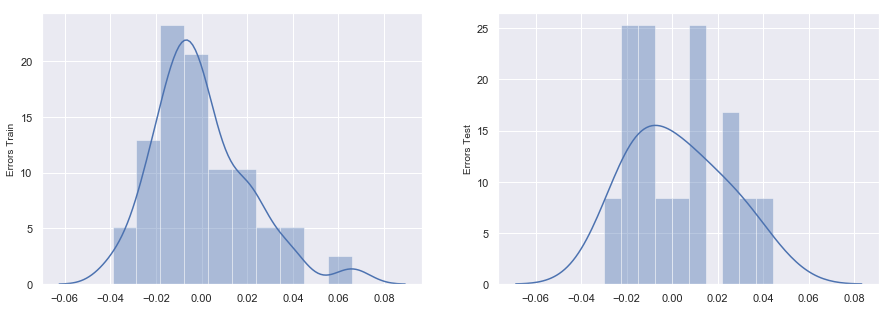

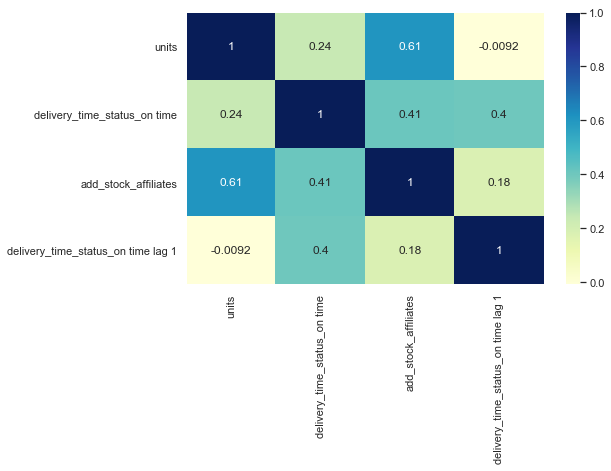

                    0
train r score 0.98945
test r score  0.98580
                 0
rmse_train 0.02094
rmse_test  0.02084


In [728]:
y_train_real_pred, y_test_real_pred, r2_dataframe, rmse_dataframe = predictions_and_residual_analysis_and_rscore(X_train_distlag_iter0, 
                                                                                                 y_train_distlag,
                                                                                                 X_test_distlag,
                                                                                                 y_test_distlag,
                                                                                                 model_iter26)
print(r2_dataframe)
print(rmse_dataframe)

### Train Test R Squared Scores look Promising for Distributed Lag Model

### Elasticity of  `GMV` (Revenue)
As per economics, elasticity is the measure of how sensitive dependent variable (in our case, revenue) is to a particular independent variable.

<h3><center> $Elasticity_{gmv} = \frac{\frac{\delta{GMV}}{GMV}}{\frac{\delta{feature}}{feature}} $</centre> </h3>


while plotting elasticity, we will know,
1. Whether GMV is directly or indirectly propostional to a particular feature
2. How varying the dependency is?
3. Where exactly the dependency is? and such



Let us look at the elasticity of revenue with our predictors

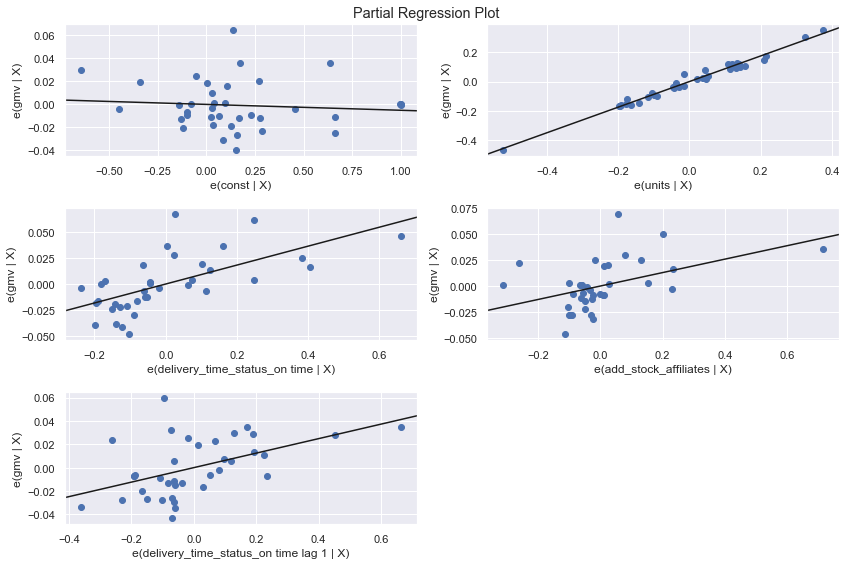

In [729]:
fig = plt.figure(figsize=(12,8))
fig = sm.graphics.plot_partregress_grid(model_iter26, fig=fig)

### Remarks:
It is evident that,
1. All features are positively impacting revenues with units being highlt influential
2. Variance is high in other features
3. This suggests that this model might not be reliable

### Model 5: Multiplicative Distributed Lag Models

In [730]:
df_camera_mult_distlag = log_transformation(df_camera_distlag)

#### Train-Test Split and Scaling

In [731]:
X_train_mult_distlag,y_train_mult_distlag,X_test_mult_distlag,y_test_mult_distlag = split_scale_feature(df_camera_mult_distlag)

In [732]:
X_train_mult_distlag.shape

(37, 127)

#### Recursive Feature Elimination
1. With only 37 rows, I cannot efford to have more than 1/3rd the features to get good models
2. For this reason, we still keep `our rfe at 30`

In [733]:
X_train_mult_distlag_iter0 = rfe_function(X_train_mult_distlag,y_train_mult_distlag,30)

#### Model Building using StatsModel 

In [734]:
# Results of stats model iteration - 1
X_train_column_list, model_iter1, summary, VIF = statsmodel_vif(X_train_mult_distlag_iter0,y_train,[])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.941
Model:                            OLS   Adj. R-squared:                  0.645
Method:                 Least Squares   F-statistic:                     3.182
Date:                Mon, 23 Dec 2019   Prob (F-statistic):             0.0756
Time:                        20:46:47   Log-Likelihood:                 58.657
No. Observations:                  37   AIC:                            -55.31
Df Residuals:                       6   BIC:                            -5.375
Df Model:                          30                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,5039.73000
1,units,3658.97000
2,product_mrp,1687.40000
28,add_stock_content lag 3,1163.67000
29,add_stock_affiliates lag 3,669.40000
7,add_stock_TV,630.09000
8,add_stock_sponsorship,620.42000
21,NPS lag 1,583.27000
11,add_stock_SEM,578.48000
9,add_stock_content,516.49000


#### Remarks: 
1. rfe captured quite a number of lag variables. Let us see how model turns out
2. As step 1, we will drop all columns with high VIF and P Value first
3. Each column from different feature set at a time
4. We are dropping `product_mrp` first as it has high p-value

In [735]:
# Results of stats model iteration - 2
X_train_column_list, model_iter2, summary, VIF = statsmodel_vif(X_train_mult_distlag_iter0,y_train_mult_distlag,
                                                                ['product_mrp'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 2.272e+04
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           5.18e-15
Time:                        20:46:51   Log-Likelihood:                 211.82
No. Observations:                  37   AIC:                            -363.6
Df Residuals:                       7   BIC:                            -315.3
Df Model:                          29                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,3603.28000
1,units,1433.72000
27,add_stock_content lag 3,1160.28000
28,add_stock_affiliates lag 3,669.38000
6,add_stock_TV,626.31000
7,add_stock_sponsorship,612.07000
20,NPS lag 1,550.40000
10,add_stock_SEM,521.69000
8,add_stock_content,449.56000
9,add_stock_affiliates,322.19000


#### Remarks: 
1. In the iteration, we will drop `add_stock_SEM` which has both high P Value

In [736]:
# Results of stats model iteration - 3
X_train_column_list, model_iter3, summary, VIF = statsmodel_vif(X_train_mult_distlag_iter0,y_train_mult_distlag,
                                                                ['add_stock_SEM'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 2.561e+04
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           3.68e-17
Time:                        20:46:56   Log-Likelihood:                 210.92
No. Observations:                  37   AIC:                            -363.8
Df Residuals:                       8   BIC:                            -317.1
Df Model:                          28                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,3589.89000
6,add_stock_TV,611.41000
1,units,565.45000
26,add_stock_content lag 3,465.80000
19,NPS lag 1,335.24000
9,add_stock_affiliates,310.44000
28,add_stock_SEM lag 2,294.88000
27,add_stock_affiliates lag 3,215.98000
7,add_stock_sponsorship,199.98000
8,add_stock_content,181.92000


#### Remarks:
Let's drop `add_stock_TV` as it has high p-value

In [738]:
# Results of stats model iteration - 4
X_train_column_list, model_iter4, summary, VIF = statsmodel_vif(X_train_mult_distlag_iter0,y_train_mult_distlag,
                                                                ['add_stock_TV'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 2.334e+04
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           6.24e-19
Time:                        20:47:40   Log-Likelihood:                 206.35
No. Observations:                  37   AIC:                            -356.7
Df Residuals:                       9   BIC:                            -311.6
Df Model:                          27                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,3023.47000
1,units,464.17000
25,add_stock_content lag 3,363.80000
8,add_stock_affiliates,304.67000
6,add_stock_sponsorship,199.96000
26,add_stock_affiliates lag 3,186.77000
7,add_stock_content,177.46000
9,gmv lag 1,160.33000
19,add_stock_TV lag 1,132.12000
18,NPS lag 1,119.66000


#### Remarks:
Let us drop `add_stock_content lag 3` as it has high p-value

In [739]:
# Results of stats model iteration - 5
X_train_column_list, model_iter5, summary, VIF = statsmodel_vif(X_train_mult_distlag_iter0,y_train_mult_distlag,
                                                                ['add_stock_content lag 3'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 1.399e+04
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           9.71e-20
Time:                        20:48:18   Log-Likelihood:                 194.23
No. Observations:                  37   AIC:                            -334.5
Df Residuals:                      10   BIC:                            -291.0
Df Model:                          26                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,2959.42000
1,units,298.83000
8,add_stock_affiliates,297.75000
6,add_stock_sponsorship,181.00000
7,add_stock_content,177.46000
9,gmv lag 1,144.58000
20,add_stock_TV lag 2,108.43000
18,NPS lag 1,82.44000
19,add_stock_TV lag 1,81.95000
23,add_stock_sponsorship lag 1,79.76000


#### Remarks:
1. We are starting off with the second iteration of values.
2. Let us drop `add_stock_affiliates` which has high p-value

In [740]:
# Results of stats model iteration - 5
X_train_column_list, model_iter5, summary, VIF = statsmodel_vif(X_train_mult_distlag_iter0,y_train_mult_distlag,
                                                                ['add_stock_affiliates'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 1.517e+04
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           9.96e-22
Time:                        20:48:54   Log-Likelihood:                 193.24
No. Observations:                  37   AIC:                            -334.5
Df Residuals:                      11   BIC:                            -292.6
Df Model:                          25                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,2920.11000
7,add_stock_content,167.00000
6,add_stock_sponsorship,158.01000
1,units,135.21000
8,gmv lag 1,128.92000
17,NPS lag 1,82.32000
19,add_stock_TV lag 2,81.38000
24,add_stock_affiliates lag 3,75.14000
18,add_stock_TV lag 1,73.36000
22,add_stock_sponsorship lag 1,71.11000


#### Remarks:
1. Let us drop some add_stocks, to check their influence on other variables
2. Let's drop `add_stock_content` as it has high VIF and significant p-value


In [741]:
# Results of stats model iteration - 6
X_train_column_list, model_iter6, summary, VIF = statsmodel_vif(X_train_mult_distlag_iter0,y_train_mult_distlag,
                                                                ['add_stock_content'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 1.538e+04
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.46e-23
Time:                        20:49:27   Log-Likelihood:                 191.13
No. Observations:                  37   AIC:                            -332.3
Df Residuals:                      12   BIC:                            -292.0
Df Model:                          24                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,2735.68000
1,units,112.22000
7,gmv lag 1,108.93000
6,add_stock_sponsorship,96.08000
18,add_stock_TV lag 2,72.81000
17,add_stock_TV lag 1,72.72000
16,NPS lag 1,72.42000
23,add_stock_affiliates lag 3,69.31000
21,add_stock_sponsorship lag 1,66.76000
24,add_stock_SEM lag 2,55.81000


#### Remarks:
1. Let's drop `gmv lag 1` as it has high P Value


In [742]:
# Results of stats model iteration - 7
X_train_column_list, model_iter7, summary, VIF = statsmodel_vif(X_train_mult_distlag_iter0,y_train_mult_distlag,
                                                                ['gmv lag 1'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 1.738e+04
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.08e-25
Time:                        20:50:12   Log-Likelihood:                 191.13
No. Observations:                  37   AIC:                            -334.3
Df Residuals:                      13   BIC:                            -295.6
Df Model:                          23                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,2155.07000
1,units,107.04000
6,add_stock_sponsorship,79.52000
16,add_stock_TV lag 1,72.47000
17,add_stock_TV lag 2,71.35000
22,add_stock_affiliates lag 3,63.62000
23,add_stock_SEM lag 2,54.09000
20,add_stock_sponsorship lag 1,33.23000
21,add_stock_sponsorship lag 3,32.25000
15,NPS lag 1,31.06000


#### Remarks:
1. Let us drop `add_stock_SEM lag 2` due to high P Value

In [743]:
# Results of stats model iteration - 8
X_train_column_list, model_iter8, summary, VIF = statsmodel_vif(X_train_mult_distlag_iter0,y_train_mult_distlag,
                                                                ['add_stock_SEM lag 2'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 1.951e+04
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           7.63e-28
Time:                        20:50:49   Log-Likelihood:                 191.07
No. Observations:                  37   AIC:                            -336.1
Df Residuals:                      14   BIC:                            -299.1
Df Model:                          22                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,1718.68000
1,units,84.90000
17,add_stock_TV lag 2,71.35000
22,add_stock_affiliates lag 3,63.52000
6,add_stock_sponsorship,62.70000
16,add_stock_TV lag 1,53.51000
15,NPS lag 1,28.44000
20,add_stock_sponsorship lag 1,26.32000
21,add_stock_sponsorship lag 3,25.46000
19,add_stock_digital lag 3,18.79000


#### Remarks:
1. Let us drop `add_stock_TV lag 2` due to high P Value. Also check how weather vriable's effect on others

In [744]:
# Results of stats model iteration - 9
X_train_column_list, model_iter9, summary, VIF = statsmodel_vif(X_train_mult_distlag_iter0,y_train_mult_distlag,
                                                                ['add_stock_TV lag 2'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 2.158e+04
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           5.59e-30
Time:                        20:51:15   Log-Likelihood:                 190.80
No. Observations:                  37   AIC:                            -337.6
Df Residuals:                      15   BIC:                            -302.2
Df Model:                          21                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,1558.32000
1,units,61.21000
6,add_stock_sponsorship,54.06000
16,add_stock_TV lag 1,53.29000
15,NPS lag 1,28.12000
19,add_stock_sponsorship lag 1,24.57000
20,add_stock_sponsorship lag 3,23.99000
21,add_stock_affiliates lag 3,18.72000
18,add_stock_digital lag 3,18.71000
9,s1_fact.order_payment_type_COD lag 3,17.46000


#### Remarks:
Let us drop `Total Precip (mm) lag 1` for its high p-value among add_stocks

In [745]:
# Results of stats model iteration - 10
X_train_column_list, model_iter10, summary, VIF = statsmodel_vif(X_train_mult_distlag_iter0,y_train_mult_distlag,
                                                                 ['Total Precip (mm) lag 1'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 2.398e+04
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           3.73e-32
Time:                        20:51:45   Log-Likelihood:                 190.65
No. Observations:                  37   AIC:                            -339.3
Df Residuals:                      16   BIC:                            -305.5
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,1509.31000
1,units,58.16000
15,add_stock_TV lag 1,50.77000
6,add_stock_sponsorship,40.44000
14,NPS lag 1,24.10000
19,add_stock_sponsorship lag 3,23.90000
18,add_stock_sponsorship lag 1,23.70000
17,add_stock_digital lag 3,17.82000
9,s1_fact.order_payment_type_COD lag 3,17.34000
20,add_stock_affiliates lag 3,16.96000


#### Remarks:
1. Let us drop `add_stock_TV lag 1` which has high P Value and VIF

In [747]:
# Results of stats model iteration - 11
X_train_column_list, model_iter11, summary, VIF = statsmodel_vif(X_train_mult_distlag_iter0,y_train_mult_distlag,
                                                                 ['add_stock_TV lag 1'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 2.567e+04
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           3.21e-34
Time:                        20:52:36   Log-Likelihood:                 189.84
No. Observations:                  37   AIC:                            -339.7
Df Residuals:                      17   BIC:                            -307.5
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,894.83000
6,add_stock_sponsorship,36.29000
1,units,31.70000
18,add_stock_sponsorship lag 3,22.30000
19,add_stock_affiliates lag 3,15.25000
8,delivery_time_status_late delivery lag 1,13.42000
14,NPS lag 1,10.06000
16,add_stock_digital lag 3,8.95000
9,s1_fact.order_payment_type_COD lag 3,8.71000
3,Product Premiumness_0,7.35000


#### Remarks:
1. As we have seen product_mrp has a significant influence on other variables.
2. Let's drop `delivery_time_status_late delivery lag 1` as it has high p-value

In [748]:
# Results of stats model iteration - 12
X_train_column_list, model_iter12, summary, VIF = statsmodel_vif(X_train_mult_distlag_iter0,y_train_mult_distlag,
                                                                 ['delivery_time_status_late delivery lag 1'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 2.853e+04
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.94e-36
Time:                        20:53:11   Log-Likelihood:                 189.74
No. Observations:                  37   AIC:                            -341.5
Df Residuals:                      18   BIC:                            -310.9
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,558.38000
6,add_stock_sponsorship,21.27000
1,units,21.15000
17,add_stock_sponsorship lag 3,19.58000
18,add_stock_affiliates lag 3,13.27000
15,add_stock_digital lag 3,8.20000
8,s1_fact.order_payment_type_COD lag 3,7.02000
7,discount_rate lag 1,4.79000
3,Product Premiumness_0,4.72000
16,add_stock_sponsorship lag 1,4.10000


#### Remarks:
1. Let us look at weather features again
2. `s1_fact.order_payment_type_Prepaid lag 3` has high P Value
3. Let us drop it

In [749]:
# Results of stats model iteration - 13
X_train_column_list, model_iter13, summary, VIF = statsmodel_vif(X_train_mult_distlag_iter0,y_train_mult_distlag,
                                                                 ['s1_fact.order_payment_type_Prepaid lag 3'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 3.168e+04
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.12e-38
Time:                        20:53:46   Log-Likelihood:                 189.62
No. Observations:                  37   AIC:                            -343.2
Df Residuals:                      19   BIC:                            -314.2
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                                           coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------


,Features,VIF
0,const,509.88000
1,units,17.31000
6,add_stock_sponsorship,16.46000
16,add_stock_sponsorship lag 3,12.23000
17,add_stock_affiliates lag 3,10.33000
8,s1_fact.order_payment_type_COD lag 3,6.65000
14,add_stock_digital lag 3,6.34000
3,Product Premiumness_0,4.24000
7,discount_rate lag 1,4.16000
2,delivery_time_status_on time,3.94000


#### Remarks:
2. Let us drop `add_stock_affiliates lag 3` for high P Value

In [750]:
# Results of stats model iteration - 14
X_train_column_list, model_iter14, summary, VIF = statsmodel_vif(X_train_mult_distlag_iter0,y_train_mult_distlag,
                                                                 ['add_stock_affiliates lag 3'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 3.522e+04
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           6.16e-41
Time:                        20:54:40   Log-Likelihood:                 189.51
No. Observations:                  37   AIC:                            -345.0
Df Residuals:                      20   BIC:                            -317.6
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                                           coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------


,Features,VIF
0,const,446.23000
6,add_stock_sponsorship,16.43000
1,units,15.98000
8,s1_fact.order_payment_type_COD lag 3,6.63000
16,add_stock_sponsorship lag 3,6.29000
14,add_stock_digital lag 3,6.17000
3,Product Premiumness_0,4.21000
7,discount_rate lag 1,4.15000
15,add_stock_sponsorship lag 1,3.77000
5,Cool Deg Days (°C),3.60000


#### Remarks
Let's drop `add_stock_digital lag 2` as it has high p-value

In [751]:
# Results of stats model iteration - 15
X_train_column_list, model_iter15, summary, VIF = statsmodel_vif(X_train_mult_distlag_iter0,y_train_mult_distlag,
                                                                 ['add_stock_digital lag 2'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 3.910e+04
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           3.31e-43
Time:                        20:55:15   Log-Likelihood:                 189.34
No. Observations:                  37   AIC:                            -346.7
Df Residuals:                      21   BIC:                            -320.9
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                                           coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------


,Features,VIF
0,const,445.43000
6,add_stock_sponsorship,16.34000
1,units,15.70000
8,s1_fact.order_payment_type_COD lag 3,6.11000
13,add_stock_digital lag 3,5.88000
15,add_stock_sponsorship lag 3,5.71000
3,Product Premiumness_0,4.15000
7,discount_rate lag 1,4.11000
5,Cool Deg Days (°C),3.60000
14,add_stock_sponsorship lag 1,3.58000


#### Remarks
1. As units relted variables are highly correlated with GMV, let's pick anoth variable with high p-value
2. Let's drop `Cool Deg Days (°C) lag 3` as it has hgih p-value

In [752]:
# Results of stats model iteration - 16
X_train_column_list, model_iter16, summary, VIF = statsmodel_vif(X_train_mult_distlag_iter0,y_train_mult_distlag,
                                                                 ['Cool Deg Days (°C) lag 3'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 4.082e+04
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           3.41e-45
Time:                        20:55:38   Log-Likelihood:                 188.00
No. Observations:                  37   AIC:                            -346.0
Df Residuals:                      22   BIC:                            -321.8
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                                           coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------


,Features,VIF
0,const,445.31000
6,add_stock_sponsorship,13.65000
1,units,10.58000
8,s1_fact.order_payment_type_COD lag 3,5.97000
12,add_stock_digital lag 3,5.88000
14,add_stock_sponsorship lag 3,5.71000
3,Product Premiumness_0,4.03000
13,add_stock_sponsorship lag 1,3.53000
7,discount_rate lag 1,3.44000
5,Cool Deg Days (°C),3.35000


#### Remarks
Let us drop `Cool Deg Days (°C) lag 2` due to high P Value

In [753]:
# Results of stats model iteration - 17
X_train_column_list, model_iter17, summary, VIF = statsmodel_vif(X_train_mult_distlag_iter0,y_train_mult_distlag,
                                                                 ['Total Rain (mm) lag 2'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 4.299e+04
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           3.32e-47
Time:                        20:55:59   Log-Likelihood:                 186.77
No. Observations:                  37   AIC:                            -345.5
Df Residuals:                      23   BIC:                            -323.0
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                                           coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------


,Features,VIF
0,const,292.85000
6,add_stock_sponsorship,12.51000
1,units,9.48000
13,add_stock_sponsorship lag 3,5.70000
8,s1_fact.order_payment_type_COD lag 3,5.49000
11,add_stock_digital lag 3,5.45000
3,Product Premiumness_0,3.76000
12,add_stock_sponsorship lag 1,3.24000
5,Cool Deg Days (°C),2.94000
2,delivery_time_status_on time,2.71000


#### Remarks
Let us drop `Total Snow (cm) lag 1` due to high P value

In [754]:
# Results of stats model iteration - 18
X_train_column_list, model_iter18, summary, VIF = statsmodel_vif(X_train_mult_distlag_iter0,y_train_mult_distlag,
                                                                 ['Total Snow (cm) lag 1'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 4.298e+04
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           6.37e-49
Time:                        20:56:36   Log-Likelihood:                 184.50
No. Observations:                  37   AIC:                            -343.0
Df Residuals:                      24   BIC:                            -322.0
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                                           coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------


,Features,VIF
0,const,277.88000
6,add_stock_sponsorship,11.96000
1,units,9.09000
12,add_stock_sponsorship lag 3,5.56000
10,add_stock_digital lag 3,5.45000
8,s1_fact.order_payment_type_COD lag 3,4.95000
3,Product Premiumness_0,3.72000
11,add_stock_sponsorship lag 1,3.12000
5,Cool Deg Days (°C),2.82000
2,delivery_time_status_on time,2.66000


#### Remarks
Let us drop `add_stock_sponsorship` due to high P Value

In [755]:
# Results of stats model iteration - 19
X_train_column_list, model_iter19, summary, VIF = statsmodel_vif(X_train_mult_distlag_iter0,y_train_mult_distlag,
                                                                 ['add_stock_sponsorship'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 4.381e+04
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.09e-50
Time:                        20:57:20   Log-Likelihood:                 182.48
No. Observations:                  37   AIC:                            -341.0
Df Residuals:                      25   BIC:                            -321.6
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                                           coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------


,Features,VIF
0,const,276.15000
11,add_stock_sponsorship lag 3,5.54000
9,add_stock_digital lag 3,5.26000
1,units,4.09000
7,s1_fact.order_payment_type_COD lag 3,3.57000
10,add_stock_sponsorship lag 1,3.09000
2,delivery_time_status_on time,2.65000
3,Product Premiumness_0,2.38000
5,Cool Deg Days (°C),2.36000
8,NPS lag 1,2.26000


#### Remarks
Let us drop `Cool Deg Days (°C)` due to high VIF

In [756]:
# Results of stats model iteration - 20
X_train_column_list, model_iter20, summary, VIF = statsmodel_vif(X_train_mult_distlag_iter0,y_train_mult_distlag,
                                                                 ['Cool Deg Days (°C)'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 4.617e+04
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.36e-52
Time:                        20:57:52   Log-Likelihood:                 180.97
No. Observations:                  37   AIC:                            -339.9
Df Residuals:                      26   BIC:                            -322.2
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                                           coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------


,Features,VIF
0,const,217.34000
10,add_stock_sponsorship lag 3,5.54000
8,add_stock_digital lag 3,4.84000
1,units,4.05000
6,s1_fact.order_payment_type_COD lag 3,2.68000
2,delivery_time_status_on time,2.64000
9,add_stock_sponsorship lag 1,2.33000
3,Product Premiumness_0,2.27000
7,NPS lag 1,2.20000
5,discount_rate lag 1,1.63000


#### Remarks
1. `<0.05` signifies 95% confidance of feature importance and we achieved that
2. In our case, we have very less data as small as 37 points to model the data
3. We considered VIF < 10 as a stop point. Due to less data, otherwise model is too sensitive and P Values change drastically
5. So let us stop modeling here

__Important:__ __We successfully maintained the R Square and Adjusted R Square Scores__

#### 13.3 Residual Analysis of Train Test Data

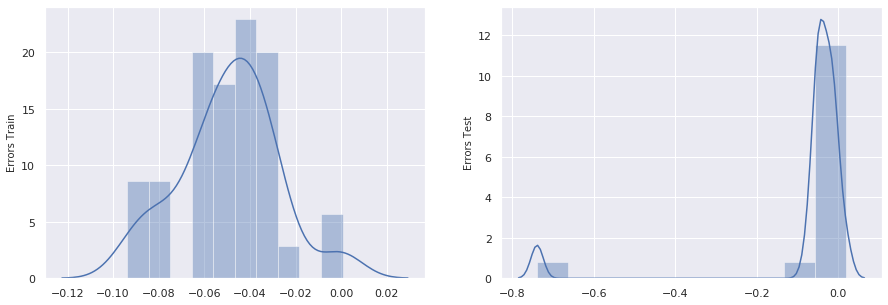

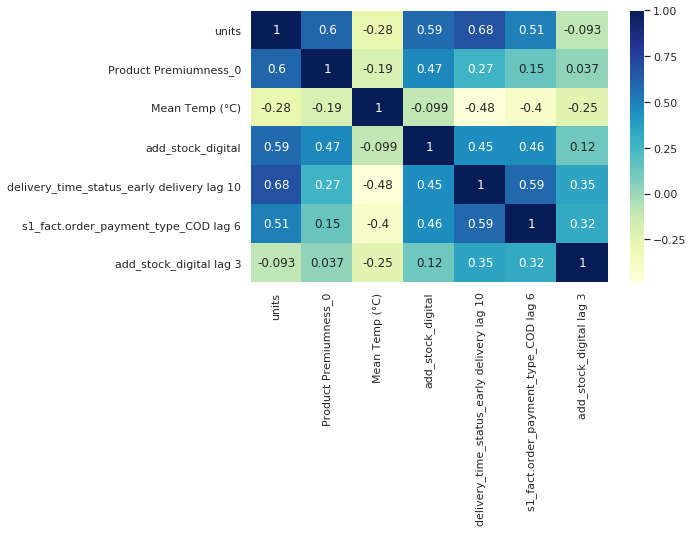

                    0
train r score 0.95099
test r score  0.74497
                 0
rmse_train 0.05364
rmse_test  0.18862


In [603]:
y_train_real_pred, y_test_real_pred, r2_dataframe, rmse_dataframe = predictions_and_residual_analysis_and_rscore(X_train_mult_distlag_iter0, 
                                                                                                 y_train_mult_distlag,
                                                                                                 X_test_mult_distlag,
                                                                                                 y_test_mult_distlag,
                                                                                                 model_iter23)
print(r2_dataframe)
print(rmse_dataframe)

### The model is high variance model due to hgh trin test score gap. We can not take this model as a bench mark

### Elasticity of  `GMV` (Revenue)
As per economics, elasticity is the measure of how sensitive dependent variable (in our case, revenue) is to a particular independent variable.

<h3><center> $Elasticity_{gmv} = \frac{\frac{\delta{GMV}}{GMV}}{\frac{\delta{feature}}{feature}} $</centre> </h3>


while plotting elasticity, we will know,
1. Whether GMV is directly or indirectly propostional to a particular feature
2. How varying the dependency is?
3. Where exactly the dependency is? and such



Let us look at the elasticity of revenue with our predictors

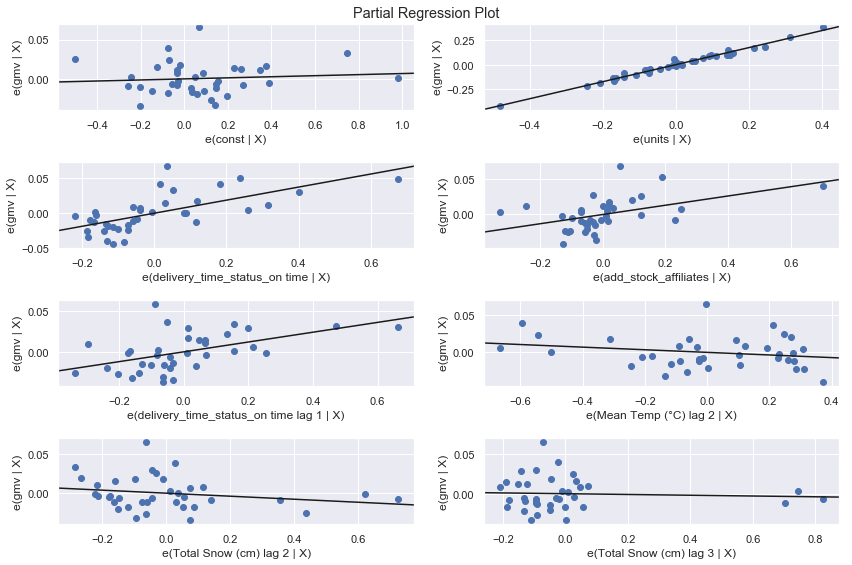

In [757]:
fig = plt.figure(figsize=(12,8))
fig = sm.graphics.plot_partregress_grid(model_iter23, fig=fig)

### Remarks:
It is evident that,
1. Units are as usual effecting positively
2. Weather like snow and temp with lag (previous weeks weather) has a negative influence on GMV
3. All other features arhighly variant had a positive influence on revenue

<h1><center> Gaming Accesories </center></h1>

### Model 1: Linear Regression

In [758]:
# Our dataframe is df_combined_audio
df_combined_game.columns

Index(['gmv', 'units', 'product_mrp', 'pay_day', 'special_sale_dates',
       'discount_rate', 'delivery_time_status_early delivery',
       'delivery_time_status_late delivery', 'delivery_time_status_on time',
       's1_fact.order_payment_type_COD', 's1_fact.order_payment_type_Prepaid',
       'Product Premiumness_0', 'Product Premiumness_1',
       'Product Premiumness_2', 'Max Temp (°C)', 'Min Temp (°C)',
       'Mean Temp (°C)', 'Heat Deg Days (°C)', 'Cool Deg Days (°C)',
       'Total Rain (mm)', 'Total Snow (cm)', 'Total Precip (mm)',
       'Snow on Grnd (cm)', 'NPS', 'Stock Index', 'add_stock_TV',
       'add_stock_digital', 'add_stock_sponsorship', 'add_stock_content',
       'add_stock_online', 'add_stock_affiliates', 'add_stock_SEM'],
      dtype='object')

### Univariate and Bivariate Analysis of Continuous Data
1. This analysis is typically performed for continuous features only. So we choose only a few features to do it
2. Selected features include `gmv`, `discount_rate`, `All add stocks`

#### Box Plots: To check Outliers

In [759]:
import matplotlib
column_list = ['gmv', 'product_mrp','discount_rate','add_stock_TV',
               'add_stock_digital', 'add_stock_sponsorship', 'add_stock_content',
               'add_stock_online', 'add_stock_affiliates', 'add_stock_SEM']

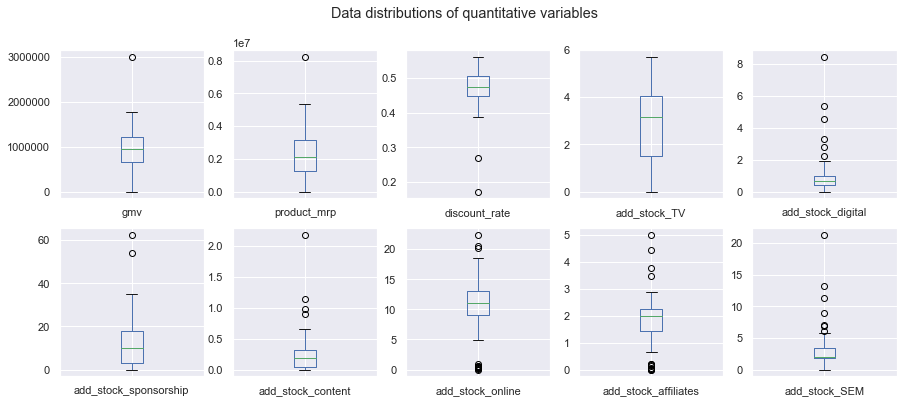

In [760]:
df_combined_game[column_list].plot(kind='box',subplots=True,layout=(2,5),
                                    sharex=False,figsize=(15,6), 
                                    title="Data distributions of quantitative variables")
plt.show()

#### Remarks: 
1. Since we handled outliers at order level, outliers do exist but not prolific.
2. A few assumptions that we took on add stocks might be influencing as outliers. 
3. We have only 53 data points and we dont have the leverage to remove some as outliers anymore.
4. So, let us go ahead with the data at hand

#### Scatter Plots (Bivariate Relationship among continuous data) 

<Figure size 720x720 with 0 Axes>

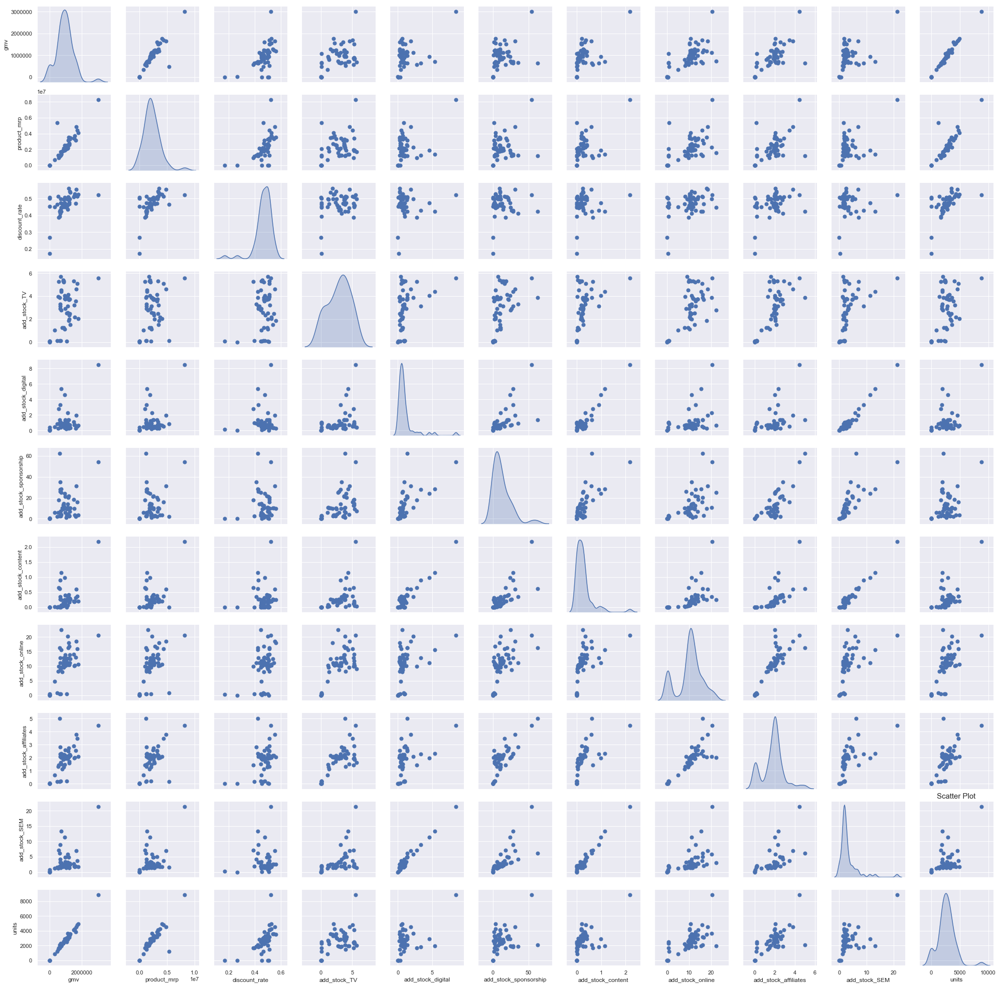

In [761]:
# Draw scatter plot
plt.figure(figsize=(10,10))
sns.set(style="darkgrid")
ax=sns.pairplot(df_combined_game[column_list+['units']],diag_kind ='kde',
               plot_kws=dict(s=50, edgecolor="b", linewidth=1),diag_kws=dict(shade=True))

plt.title('Scatter Plot',   fontsize=15)
#ax.set_xticklabels(ax.(), rotation=65, ha="right",weight="bold",fontsize=15)


plt.show()

#### Remarks:
1. All add stocks have some linear relationship with number of units sold. `Add stocks are collinear to units sold`
2. GMV has linearity with `discount`, `units` and `MRP`. 
3. We can understand GMV linearity with `units` because that has a direct relationship.
4. GMV has linear relationship with add stocks from TV, content, online and affiliates mainly
5. With in add stocks, a few collinearities exist.

We will study them while looking at correlation heat map. It is easy to figure out relationships there

#### Heat-Map (Bivariate Relationship among continuous data) 
1. While doing this, we ignored weather components as they are not continuous values.

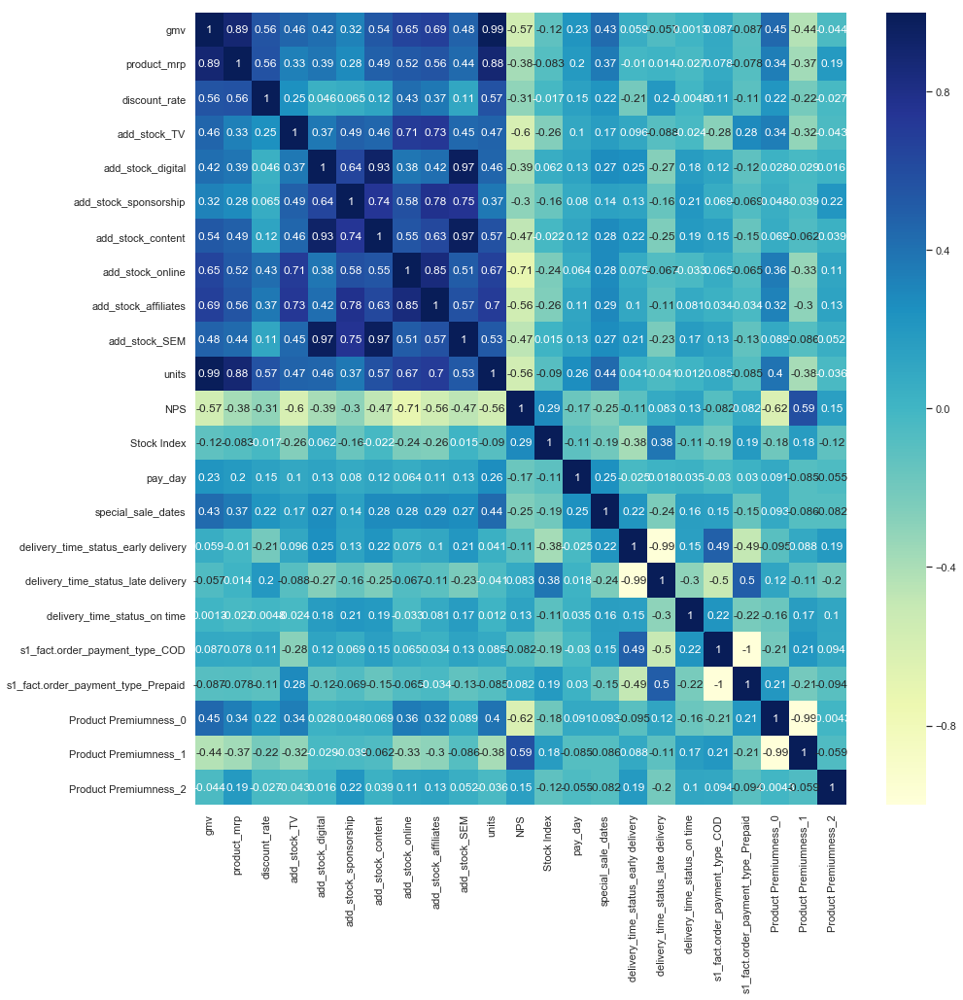

In [762]:
# Check correlation heatmap
plt.figure(figsize=(15,15))
sns.heatmap(df_combined_game[column_list+['units','NPS','Stock Index','pay_day','special_sale_dates',
'delivery_time_status_early delivery','delivery_time_status_late delivery', 'delivery_time_status_on time',
's1_fact.order_payment_type_COD', 's1_fact.order_payment_type_Prepaid','Product Premiumness_0', 'Product Premiumness_1',
'Product Premiumness_2']].corr(), 
            annot=True, cmap='YlGnBu')
plt.show()

#### Remarks: Similar to scatter plots reflect here. Let us reiterate the findings
##### PART - 1: Correlations with GMV (Good to have)
1. It is evident that from `gmv` to `units` and `product_mrp`, features are highly correlated. 
2. `Ontime Delivery` is highly correlated with GMV
3. `All Product Premiumness features` are less or negatively correlated wit GMV
4. `special sales days` are moderately correlated with GMV
5. `Add Stocks` have good correlation with GMV and among themselves

##### PART - 2: Correlations among features (Multi-collinearity)
1. `Discount Rate` is correlated to `add stocks` and delivery status and product premiumness
2. `Units` has high correlation with `Discount rate`, `MRP` as well as `Add Stocks`

Let us see how we can leverage the correlation knowledge, P-Values and VIF to choose features wisely. `Business intuition is extremely important consideration in MMM to keep in mind. Some decissions will be taken ignoring the math rules associated to understand business`

### Modeling
1. The present work is a tiresomely repetititve process since we have to compute 15 Linear regression models in total
2. To avoid redundancy in work, we created 4 re usable functions for an end-to-end linear regression code
3. We will explain each bit of function here and then start using them in future cycles
4. The entire modeling process is divided into 4 parts
    1. Splitting and Scaling Data
    2. Feature Elimination
    3. Modeling
    4. Model Evaluation: To understand goodness of model

In [763]:
X_train,y_train,X_test,y_test = split_scale_feature(df_combined_game)

In [764]:
X_train.shape

(37, 31)

#### Recursive Feature Elimination

In [765]:
X_train_iter0 = rfe_function(X_train,y_train,28)

In [766]:
X_train_iter0.columns

Index(['units', 'product_mrp', 'pay_day', 'discount_rate',
       'delivery_time_status_late delivery', 'delivery_time_status_on time',
       's1_fact.order_payment_type_COD', 's1_fact.order_payment_type_Prepaid',
       'Product Premiumness_0', 'Product Premiumness_1',
       'Product Premiumness_2', 'Max Temp (°C)', 'Min Temp (°C)',
       'Mean Temp (°C)', 'Heat Deg Days (°C)', 'Cool Deg Days (°C)',
       'Total Rain (mm)', 'Total Snow (cm)', 'Total Precip (mm)',
       'Snow on Grnd (cm)', 'NPS', 'Stock Index', 'add_stock_TV',
       'add_stock_digital', 'add_stock_sponsorship', 'add_stock_content',
       'add_stock_affiliates', 'add_stock_SEM'],
      dtype='object')

#### Model Building using StatsModel 

In [767]:
# Results of stats model iteration - 1
X_train_column_list, model_iter1, summary, VIF = statsmodel_vif(X_train_iter0,y_train,[])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.997
Method:                 Least Squares   F-statistic:                     426.0
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           3.36e-13
Time:                        21:04:26   Log-Likelihood:                 137.07
No. Observations:                  37   AIC:                            -222.1
Df Residuals:                      11   BIC:                            -180.3
Df Model:                          25                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

,Features,VIF
14,Mean Temp (°C),inf
19,Total Precip (mm),inf
18,Total Snow (cm),inf
17,Total Rain (mm),inf
16,Cool Deg Days (°C),inf
15,Heat Deg Days (°C),inf
7,s1_fact.order_payment_type_COD,inf
8,s1_fact.order_payment_type_Prepaid,inf
9,Product Premiumness_0,585205.63000
10,Product Premiumness_1,584044.27000


#### Remarks: 
1. Let us start with removing Weather Data with HIgh VIF
2. `Total Precip (mm)` has both high P-Value as well as VIF.
3. Let us drop `Total Precip (mm)`

In [768]:
# Results of stats model iteration - 2
X_train_column_list, model_iter2, summary, VIF = statsmodel_vif(X_train_iter0,y_train,['Total Precip (mm)'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.997
Method:                 Least Squares   F-statistic:                     426.0
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           3.36e-13
Time:                        21:04:29   Log-Likelihood:                 137.07
No. Observations:                  37   AIC:                            -222.1
Df Residuals:                      11   BIC:                            -180.3
Df Model:                          25                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

,Features,VIF
14,Mean Temp (°C),inf
8,s1_fact.order_payment_type_Prepaid,inf
16,Cool Deg Days (°C),inf
15,Heat Deg Days (°C),inf
7,s1_fact.order_payment_type_COD,inf
9,Product Premiumness_0,585205.63000
10,Product Premiumness_1,584044.27000
13,Min Temp (°C),801.13000
27,add_stock_SEM,799.44000
23,add_stock_digital,547.34000


#### Remarks: 
1. Dropping `Total Precip (mm)` not fully reduce collinearity in weather features from infinity. Hence, we will explore it further.
2. Let's drop `Mean Temp (°C)` as it has infinite VIF

In [769]:
# Results of stats model iteration - 3
X_train_column_list, model_iter3, summary, VIF = statsmodel_vif(X_train_iter0,y_train,
                                                                ['Mean Temp (°C)'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.997
Method:                 Least Squares   F-statistic:                     426.0
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           3.36e-13
Time:                        21:04:32   Log-Likelihood:                 137.07
No. Observations:                  37   AIC:                            -222.1
Df Residuals:                      11   BIC:                            -180.3
Df Model:                          25                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

,Features,VIF
7,s1_fact.order_payment_type_COD,inf
8,s1_fact.order_payment_type_Prepaid,inf
9,Product Premiumness_0,585205.63000
10,Product Premiumness_1,584044.27000
14,Heat Deg Days (°C),1448.73000
13,Min Temp (°C),801.13000
26,add_stock_SEM,799.44000
22,add_stock_digital,547.34000
12,Max Temp (°C),445.12000
15,Cool Deg Days (°C),185.66000


#### Remarks: 
1. Dropping `Mean Temp (°C)` not fully reduce collinearity in weather features from infinity. Hence, we will explore it further.
2. Let's drop `Heat Deg Days (°C)` as it has infinite VIF

In [770]:
# Results of stats model iteration - 4
X_train_column_list, model_iter4, summary, VIF = statsmodel_vif(X_train_iter0,y_train,
                                                                ['Heat Deg Days (°C)'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.997
Method:                 Least Squares   F-statistic:                     454.2
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           2.17e-14
Time:                        21:04:35   Log-Likelihood:                 135.89
No. Observations:                  37   AIC:                            -221.8
Df Residuals:                      12   BIC:                            -181.5
Df Model:                          24                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

,Features,VIF
7,s1_fact.order_payment_type_COD,inf
8,s1_fact.order_payment_type_Prepaid,inf
9,Product Premiumness_0,452113.39000
10,Product Premiumness_1,451536.28000
25,add_stock_SEM,669.19000
21,add_stock_digital,390.49000
23,add_stock_content,146.17000
1,units,89.92000
24,add_stock_affiliates,86.17000
2,product_mrp,84.92000


#### Remarks: 
1. Let us see what we can do with `order payment type`. Let us list what do we know about them.
2. `Payment Type COD` is very less correlated to GMV. We can say effect will be insignificant.
3. VIF is infinity too
4. Let us drop `s1_fact.order_payment_type_COD`

In [771]:
# Results of stats model iteration - 5
X_train_column_list, model_iter5, summary, VIF = statsmodel_vif(X_train_iter0,y_train,
                                                                ['s1_fact.order_payment_type_COD'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.997
Method:                 Least Squares   F-statistic:                     454.2
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           2.17e-14
Time:                        21:04:38   Log-Likelihood:                 135.89
No. Observations:                  37   AIC:                            -221.8
Df Residuals:                      12   BIC:                            -181.5
Df Model:                          24                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

,Features,VIF
0,const,9050676.71000
8,Product Premiumness_0,452113.39000
9,Product Premiumness_1,451536.28000
24,add_stock_SEM,669.19000
20,add_stock_digital,390.49000
22,add_stock_content,146.17000
1,units,89.92000
23,add_stock_affiliates,86.17000
2,product_mrp,84.92000
21,add_stock_sponsorship,48.32000


#### Remarks:
1. `discount_rate` has a high p-value
2. So let us drop `discount_rate`


In [772]:
# Results of stats model iteration - 6
X_train_column_list, model_iter6, summary, VIF = statsmodel_vif(X_train_iter0,y_train,
                                                                ['discount_rate'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.997
Method:                 Least Squares   F-statistic:                     513.1
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           9.31e-16
Time:                        21:04:42   Log-Likelihood:                 135.88
No. Observations:                  37   AIC:                            -223.8
Df Residuals:                      13   BIC:                            -185.1
Df Model:                          23                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

,Features,VIF
0,const,8406303.77000
7,Product Premiumness_0,419588.16000
8,Product Premiumness_1,418992.54000
23,add_stock_SEM,667.28000
19,add_stock_digital,381.57000
21,add_stock_content,141.61000
1,units,88.96000
22,add_stock_affiliates,82.33000
2,product_mrp,79.64000
20,add_stock_sponsorship,48.28000


#### Remarks:
1. `delivery_time_status_on time` has low correlation with GMV and also contributes less to overall GMV
2. Though it has less VIF, it has significantly less impact on GMV to others.
4. So we chose to drop `delivery_time_status_on time`

In [773]:
# Results of stats model iteration - 7
X_train_column_list, model_iter7, summary, VIF = statsmodel_vif(X_train_iter0,y_train,['delivery_time_status_on time'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.997
Method:                 Least Squares   F-statistic:                     574.8
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           3.90e-17
Time:                        21:04:44   Log-Likelihood:                 135.79
No. Observations:                  37   AIC:                            -225.6
Df Residuals:                      14   BIC:                            -188.5
Df Model:                          22                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

,Features,VIF
0,const,8091263.13000
6,Product Premiumness_0,403943.47000
7,Product Premiumness_1,403407.11000
22,add_stock_SEM,640.83000
18,add_stock_digital,367.67000
20,add_stock_content,140.62000
1,units,87.69000
2,product_mrp,78.32000
21,add_stock_affiliates,75.28000
19,add_stock_sponsorship,47.25000


#### Remarks:
1. `Product Premiumness_0`has high VIF 
2. Let us drop `Product Premiumness_0`

In [774]:
# Results of stats model iteration - 8
X_train_column_list, model_iter8, summary, VIF = statsmodel_vif(X_train_iter0,y_train,['Product Premiumness_0'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.997
Method:                 Least Squares   F-statistic:                     507.6
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           8.96e-18
Time:                        21:04:47   Log-Likelihood:                 131.36
No. Observations:                  37   AIC:                            -218.7
Df Residuals:                      15   BIC:                            -183.3
Df Model:                          21                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

,Features,VIF
21,add_stock_SEM,576.26000
17,add_stock_digital,346.13000
0,const,118.67000
19,add_stock_content,111.99000
1,units,87.69000
20,add_stock_affiliates,75.22000
2,product_mrp,72.18000
18,add_stock_sponsorship,45.88000
8,Max Temp (°C),33.76000
9,Min Temp (°C),27.31000


#### Remarks:
1. We are going through the second iteration of dropping one column from each set of features
2. `Total Rain (mm)` has high P-Value
3. Let us drop `Total Rain (mm)`
4. So far, it is good to note that there is `no significant drop in R Score` by sropping variables 

In [775]:
# Results of stats model iteration - 9
X_train_column_list, model_iter9, summary, VIF = statsmodel_vif(X_train_iter0,y_train,['Total Rain (mm)'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.997
Method:                 Least Squares   F-statistic:                     567.6
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           3.70e-19
Time:                        21:04:50   Log-Likelihood:                 131.33
No. Observations:                  37   AIC:                            -220.7
Df Residuals:                      16   BIC:                            -186.8
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

,Features,VIF
20,add_stock_SEM,508.77000
16,add_stock_digital,297.53000
0,const,118.66000
18,add_stock_content,110.89000
1,units,85.71000
2,product_mrp,72.12000
19,add_stock_affiliates,45.92000
17,add_stock_sponsorship,40.27000
8,Max Temp (°C),31.30000
9,Min Temp (°C),23.24000


#### Remarks:
1. `add_stock_sponsorship` has high P Value and VIF
2. It has high correlation with `add_stock_sponsorship` which is understandable
3. Though it has good correlation with GMV, 
4. Since we have other adstock variables, we are dropping `add_stock_sponsorship`

In [776]:
# Results of stats model iteration - 10
X_train_column_list, model_iter10, summary, VIF = statsmodel_vif(X_train_iter0,y_train,['add_stock_sponsorship'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.997
Method:                 Least Squares   F-statistic:                     634.1
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.44e-20
Time:                        21:04:53   Log-Likelihood:                 131.31
No. Observations:                  37   AIC:                            -222.6
Df Residuals:                      17   BIC:                            -190.4
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

,Features,VIF
19,add_stock_SEM,506.31000
16,add_stock_digital,296.98000
0,const,118.39000
17,add_stock_content,88.53000
1,units,85.61000
2,product_mrp,68.30000
18,add_stock_affiliates,26.94000
8,Max Temp (°C),26.72000
9,Min Temp (°C),20.79000
15,add_stock_TV,7.56000


#### Remarks:
1. `Snow on Grnd (cm)` has high P-Value
2. So for now, let us just drop `Snow on Grnd (cm)`

In [777]:
# Results of stats model iteration - 11
X_train_column_list, model_iter11, summary, VIF = statsmodel_vif(X_train_iter0,y_train,['Snow on Grnd (cm)'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.997
Method:                 Least Squares   F-statistic:                     708.1
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           5.31e-22
Time:                        21:04:56   Log-Likelihood:                 131.29
No. Observations:                  37   AIC:                            -224.6
Df Residuals:                      18   BIC:                            -194.0
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

,Features,VIF
18,add_stock_SEM,472.04000
15,add_stock_digital,295.24000
0,const,86.00000
1,units,84.45000
2,product_mrp,66.22000
16,add_stock_content,65.38000
8,Max Temp (°C),26.71000
17,add_stock_affiliates,26.71000
9,Min Temp (°C),19.96000
14,add_stock_TV,7.46000


#### Remarks:
Let us drop `NPS` as it has high p-value

In [778]:
# Results of stats model iteration - 12
X_train_column_list, model_iter12, summary, VIF = statsmodel_vif(X_train_iter0,y_train,['NPS'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.997
Method:                 Least Squares   F-statistic:                     785.0
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.98e-23
Time:                        21:04:59   Log-Likelihood:                 131.14
No. Observations:                  37   AIC:                            -226.3
Df Residuals:                      19   BIC:                            -197.3
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

,Features,VIF
17,add_stock_SEM,414.26000
14,add_stock_digital,256.83000
0,const,84.13000
1,units,73.26000
15,add_stock_content,65.37000
2,product_mrp,58.65000
8,Max Temp (°C),26.38000
16,add_stock_affiliates,22.06000
9,Min Temp (°C),19.74000
13,add_stock_TV,6.41000


#### Remarks:
Let us drop `add_stock_TV` as it has high p-value

In [779]:
# Results of stats model iteration - 13
X_train_column_list, model_iter13, summary, VIF = statsmodel_vif(X_train_iter0,y_train,['add_stock_TV'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.997
Method:                 Least Squares   F-statistic:                     872.7
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           6.91e-25
Time:                        21:05:02   Log-Likelihood:                 131.03
No. Observations:                  37   AIC:                            -228.1
Df Residuals:                      20   BIC:                            -200.7
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

,Features,VIF
16,add_stock_SEM,392.75000
13,add_stock_digital,229.69000
0,const,75.12000
1,units,72.33000
14,add_stock_content,65.28000
2,product_mrp,58.63000
8,Max Temp (°C),26.35000
9,Min Temp (°C),19.52000
15,add_stock_affiliates,13.91000
4,delivery_time_status_late delivery,5.73000


#### Remarks:
Let us drop `delivery_time_status_late delivery` as it has high p-value

In [780]:
# Results of stats model iteration - 14
X_train_column_list, model_iter14, summary, VIF = statsmodel_vif(X_train_iter0,y_train,['delivery_time_status_late delivery'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.998
Method:                 Least Squares   F-statistic:                     964.4
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           2.47e-26
Time:                        21:05:06   Log-Likelihood:                 130.78
No. Observations:                  37   AIC:                            -229.6
Df Residuals:                      21   BIC:                            -203.8
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

,Features,VIF
15,add_stock_SEM,358.53000
12,add_stock_digital,190.92000
1,units,71.74000
13,add_stock_content,65.02000
2,product_mrp,58.58000
0,const,57.82000
7,Max Temp (°C),21.95000
8,Min Temp (°C),19.24000
14,add_stock_affiliates,13.78000
9,Cool Deg Days (°C),4.57000


#### Remarks:
Let's drop `Min Temp (°C)` has the highest P-Value

In [781]:
# Results of stats model iteration - 15
X_train_column_list, model_iter15, summary, VIF = statsmodel_vif(X_train_iter0,y_train,['Min Temp (°C)'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.998
Method:                 Least Squares   F-statistic:                     1069.
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           8.33e-28
Time:                        21:05:09   Log-Likelihood:                 130.56
No. Observations:                  37   AIC:                            -231.1
Df Residuals:                      22   BIC:                            -207.0
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

,Features,VIF
14,add_stock_SEM,354.81000
11,add_stock_digital,189.57000
1,units,70.79000
12,add_stock_content,62.34000
2,product_mrp,58.45000
0,const,48.93000
13,add_stock_affiliates,13.72000
7,Max Temp (°C),6.41000
8,Cool Deg Days (°C),4.57000
5,Product Premiumness_1,2.40000


#### Remarks:
Let us drop `Stock Index` as it has high p-value

In [782]:
# Results of stats model iteration - 16
X_train_column_list, model_iter16, summary, VIF = statsmodel_vif(X_train_iter0,y_train,['Stock Index'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.998
Model:                            OLS   Adj. R-squared:                  0.998
Method:                 Least Squares   F-statistic:                     1167.
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           3.33e-29
Time:                        21:05:12   Log-Likelihood:                 129.98
No. Observations:                  37   AIC:                            -232.0
Df Residuals:                      23   BIC:                            -209.4
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

,Features,VIF
13,add_stock_SEM,329.49000
10,add_stock_digital,169.25000
11,add_stock_content,62.34000
1,units,60.56000
2,product_mrp,49.56000
0,const,47.44000
12,add_stock_affiliates,12.38000
7,Max Temp (°C),6.22000
8,Cool Deg Days (°C),4.57000
5,Product Premiumness_1,2.36000


#### Remarks:
1. With dropping features with high P-Value, constant is having substantial effect
2. Let us drop `add_stock_SEM` with high VIF

In [783]:
# Results of stats model iteration - 17
X_train_column_list, model_iter17, summary, VIF = statsmodel_vif(X_train_iter0,y_train,['add_stock_SEM'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.996
Model:                            OLS   Adj. R-squared:                  0.994
Method:                 Least Squares   F-statistic:                     523.1
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           5.66e-26
Time:                        21:05:14   Log-Likelihood:                 112.91
No. Observations:                  37   AIC:                            -199.8
Df Residuals:                      24   BIC:                            -178.9
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

,Features,VIF
1,units,56.37000
2,product_mrp,48.05000
0,const,42.67000
11,add_stock_content,34.59000
10,add_stock_digital,29.07000
12,add_stock_affiliates,6.21000
7,Max Temp (°C),5.35000
8,Cool Deg Days (°C),4.23000
9,Total Snow (cm),1.81000
6,Product Premiumness_2,1.80000


#### Remarks:
1. Let us select whole set of new features to drop
2. We will drop an add stock to observe the impact on P-Values
3. Let us drop `add_stock_content` as it has high p-value

In [784]:
# Results of stats model iteration - 18
X_train_column_list, model_iter18, summary, VIF = statsmodel_vif(X_train_iter0,y_train,['add_stock_content'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.996
Model:                            OLS   Adj. R-squared:                  0.994
Method:                 Least Squares   F-statistic:                     589.5
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           2.50e-27
Time:                        21:05:17   Log-Likelihood:                 112.76
No. Observations:                  37   AIC:                            -201.5
Df Residuals:                      25   BIC:                            -182.2
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

,Features,VIF
0,const,41.61000
1,units,36.31000
2,product_mrp,30.44000
7,Max Temp (°C),5.35000
8,Cool Deg Days (°C),4.23000
11,add_stock_affiliates,3.73000
10,add_stock_digital,2.05000
9,Total Snow (cm),1.81000
6,Product Premiumness_2,1.78000
5,Product Premiumness_1,1.65000


#### Remarks:
1. Let us drop `Total Snow (cm)`
2. To iterate with a different feature and it has significant p-value

In [785]:
# Results of stats model iteration - 19
X_train_column_list, model_iter19, summary, VIF = statsmodel_vif(X_train_iter0,y_train,['Total Snow (cm)'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.996
Model:                            OLS   Adj. R-squared:                  0.994
Method:                 Least Squares   F-statistic:                     638.1
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.90e-28
Time:                        21:05:19   Log-Likelihood:                 111.74
No. Observations:                  37   AIC:                            -201.5
Df Residuals:                      26   BIC:                            -183.8
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

,Features,VIF
0,const,36.23000
1,units,35.41000
2,product_mrp,30.32000
8,Cool Deg Days (°C),3.88000
7,Max Temp (°C),3.79000
10,add_stock_affiliates,3.44000
9,add_stock_digital,2.04000
6,Product Premiumness_2,1.76000
5,Product Premiumness_1,1.63000
3,pay_day,1.28000


#### Remarks:
Let us drop add_stock_digital as it has high p-value

In [786]:
# Results of stats model iteration - 20
X_train_column_list, model_iter20, summary, VIF = statsmodel_vif(X_train_iter0,y_train,['add_stock_digital'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.996
Model:                            OLS   Adj. R-squared:                  0.995
Method:                 Least Squares   F-statistic:                     730.4
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           7.50e-30
Time:                        21:05:21   Log-Likelihood:                 111.59
No. Observations:                  37   AIC:                            -203.2
Df Residuals:                      27   BIC:                            -187.1
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

,Features,VIF
1,units,29.95000
0,const,29.36000
2,product_mrp,26.96000
8,Cool Deg Days (°C),3.40000
9,add_stock_affiliates,3.21000
7,Max Temp (°C),3.14000
6,Product Premiumness_2,1.68000
5,Product Premiumness_1,1.53000
4,s1_fact.order_payment_type_Prepaid,1.27000
3,pay_day,1.26000


#### Remarks:
1. Let's drop `s1_fact.order_payment_type_Prepaid` as it has significant p-value and also correlated less with GMV

In [787]:
# Results of stats model iteration - 21
X_train_column_list, model_iter21, summary, VIF = statsmodel_vif(X_train_iter0,y_train,['s1_fact.order_payment_type_Prepaid'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.996
Model:                            OLS   Adj. R-squared:                  0.994
Method:                 Least Squares   F-statistic:                     783.1
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           8.01e-31
Time:                        21:05:23   Log-Likelihood:                 110.03
No. Observations:                  37   AIC:                            -202.1
Df Residuals:                      28   BIC:                            -187.6
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                     0.07

,Features,VIF
1,units,28.99000
2,product_mrp,26.54000
0,const,23.39000
7,Cool Deg Days (°C),3.21000
8,add_stock_affiliates,3.21000
6,Max Temp (°C),3.10000
5,Product Premiumness_2,1.68000
4,Product Premiumness_1,1.41000
3,pay_day,1.24000


#### Remarks
1. `Product MRP`, `Discount Rate`, `GMV` and `Units` are highly correlated with each other. 
2. Since Product MRP does not directly associate with GMV than others
3. Let us drop `product_mrp`

In [788]:
# Results of stats model iteration - 22
X_train_column_list, model_iter22, summary, VIF = statsmodel_vif(X_train_iter0,y_train,['product_mrp'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.995
Model:                            OLS   Adj. R-squared:                  0.993
Method:                 Least Squares   F-statistic:                     760.9
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           4.33e-31
Time:                        21:05:26   Log-Likelihood:                 106.40
No. Observations:                  37   AIC:                            -196.8
Df Residuals:                      29   BIC:                            -183.9
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                     0.06

,Features,VIF
0,const,21.54000
7,add_stock_affiliates,3.21000
6,Cool Deg Days (°C),3.20000
5,Max Temp (°C),3.09000
1,units,3.07000
4,Product Premiumness_2,1.56000
3,Product Premiumness_1,1.41000
2,pay_day,1.22000


 #### Remarks
 Let us drop `Product Premiumness_2` as it has high p-value

In [789]:
# Results of stats model iteration - 23
X_train_column_list, model_iter23, summary, VIF = statsmodel_vif(X_train_iter0,y_train,['Product Premiumness_2'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.995
Model:                            OLS   Adj. R-squared:                  0.993
Method:                 Least Squares   F-statistic:                     916.2
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.41e-32
Time:                        21:05:28   Log-Likelihood:                 106.36
No. Observations:                  37   AIC:                            -198.7
Df Residuals:                      30   BIC:                            -187.4
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                     0.06

,Features,VIF
0,const,21.25000
5,Cool Deg Days (°C),3.19000
4,Max Temp (°C),3.02000
1,units,2.61000
6,add_stock_affiliates,2.15000
3,Product Premiumness_1,1.40000
2,pay_day,1.18000


 #### Remarks
 Let us drop `pay_day` as it has high p-value

In [790]:
# Results of stats model iteration - 24
X_train_column_list, model_iter24, summary, VIF = statsmodel_vif(X_train_iter0,y_train,['pay_day'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.994
Model:                            OLS   Adj. R-squared:                  0.993
Method:                 Least Squares   F-statistic:                     1061.
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.13e-33
Time:                        21:05:30   Log-Likelihood:                 105.10
No. Observations:                  37   AIC:                            -198.2
Df Residuals:                      31   BIC:                            -188.5
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                     0.06

,Features,VIF
0,const,21.16000
4,Cool Deg Days (°C),3.17000
3,Max Temp (°C),2.98000
1,units,2.41000
5,add_stock_affiliates,2.14000
2,Product Premiumness_1,1.40000


#### Remarks
All the p-values and VIF values are with in the considerable range. Hence, we can proceed with testing the model

#### 13.3 Residual Analysis of Train Test Data

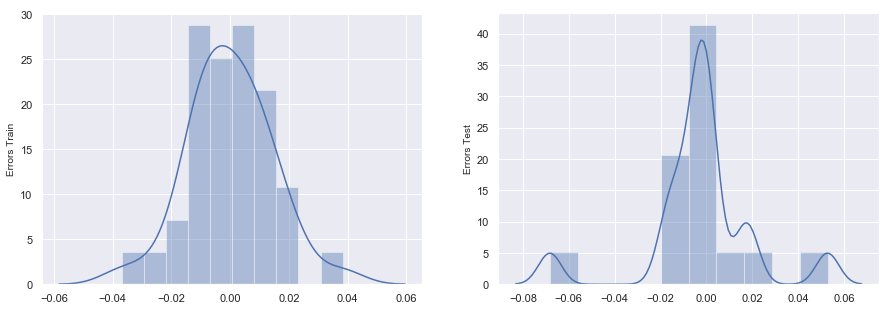

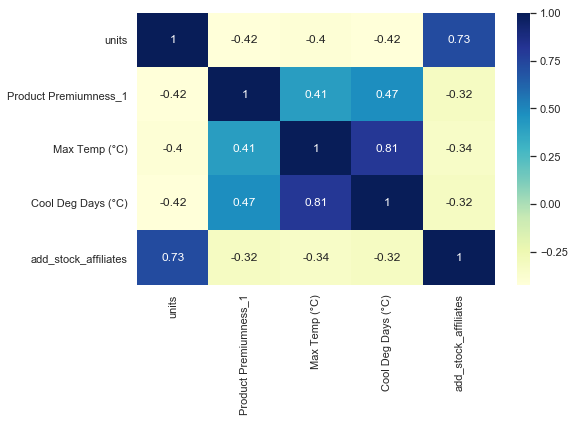

                    0
train r score 0.99419
test r score  0.97166
                 0
rmse_train 0.01413
rmse_test  0.02354


In [791]:
y_train_real_pred, y_test_real_pred, r2_dataframe, rmse_dataframe = predictions_and_residual_analysis_and_rscore(X_train_iter0, 
                                                                                                 y_train,
                                                                                                 X_test,
                                                                                                 y_test,
                                                                                                 model_iter24)
print(r2_dataframe)
print(rmse_dataframe)

### Train Test R Squared Scores are really good. This siple regression model can be a potential best model 

### Elasticity of  `GMV` (Revenue)
As per economics, elasticity is the measure of how sensitive dependent variable (in our case, revenue) is to a particular independent variable.

<h3><center> $Elasticity_{gmv} = \frac{\frac{\delta{GMV}}{GMV}}{\frac{\delta{feature}}{feature}} $</centre> </h3>


while plotting elasticity, we will know,
1. Whether GMV is directly or indirectly propostional to a particular feature
2. How varying the dependency is?
3. Where exactly the dependency is? and such



Let us look at the elasticity of revenue with our predictors

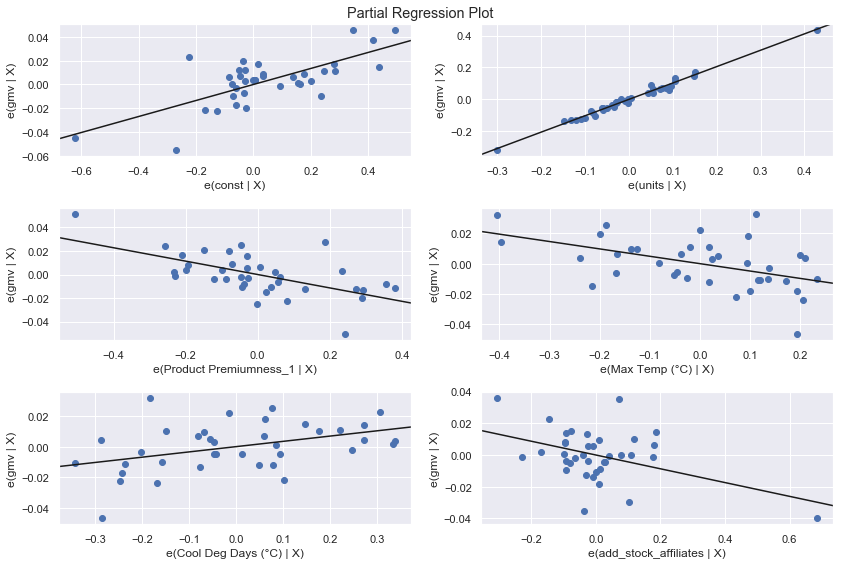

In [792]:
fig = plt.figure(figsize=(12,8))
fig = sm.graphics.plot_partregress_grid(model_iter24, fig=fig)

### Remarks:
It is evident that,
1. Units have a positive and continuous inpact on the gmv
2. Weather anlike Temp and Product Premiumness has effected revenues negatively.
3. Even without any campaigning, GMV is rising after a certain threshold
4. That is the influence of constant on the gmv

### Model 2: Multiplicative Model

In [793]:
# game data log transformation
df_game_log = log_transformation(df_combined_game)

In [794]:
# Our dataframe is df_combined_game
df_game_log.head()

,gmv,units,product_mrp,pay_day,special_sale_dates,discount_rate,delivery_time_status_early delivery,delivery_time_status_late delivery,delivery_time_status_on time,s1_fact.order_payment_type_COD,...,Snow on Grnd (cm),NPS,Stock Index,add_stock_TV,add_stock_digital,add_stock_sponsorship,add_stock_content,add_stock_online,add_stock_affiliates,add_stock_SEM
week_number,,,,,,,,,,,,,,,,,,,,,
1,8.92226,2.94444,9.49957,0.00000,0.00000,-1.31750,3.50656,4.19971,0.00000,0.00000,...,0.00000,4.00003,7.07072,-7.48783,-5.02283,-3.94884,-12.92946,-5.66911,-6.55509,-4.33808
2,13.87989,7.82764,14.54443,0.00000,0.00000,-0.80489,4.08383,3.48859,2.06535,4.28910,...,0.00000,4.00003,7.07072,-2.50961,-0.04579,1.02738,-7.95324,-0.69207,-1.57887,0.63890
3,13.41697,7.74889,14.06681,0.00000,0.00000,-0.74376,4.25863,2.91761,2.37862,4.33909,...,0.00000,4.00003,7.07072,-2.30510,0.01027,0.96356,-8.01706,-0.63601,-1.64269,0.68549
4,13.34695,7.42417,13.94973,0.00000,0.00000,-0.92974,4.42096,2.40228,1.75358,4.36349,...,0.00000,4.00003,7.07072,-2.23148,-0.00645,0.89550,-8.08512,-0.64697,-1.71075,0.66350
5,13.05071,7.08841,15.49724,0.00000,0.00000,-0.76576,4.37306,2.78258,1.51591,4.41172,...,0.00000,4.09413,7.09506,-2.30988,-0.17088,0.68090,-8.29973,-0.13170,-1.92535,0.49451


### Univariate and Bivariate Analysis of Continuous Data
1. This analysis is typically performed for continuous features only. So we choose only a few features to do it
2. Selected features include `gmv`, `discount_rate`, `All add stocks`

#### Box Plots: To check Outliers

In [795]:
import matplotlib
column_list = ['gmv', 'product_mrp','discount_rate','add_stock_TV',
               'add_stock_digital', 'add_stock_sponsorship', 'add_stock_content',
               'add_stock_online', 'add_stock_affiliates', 'add_stock_SEM']

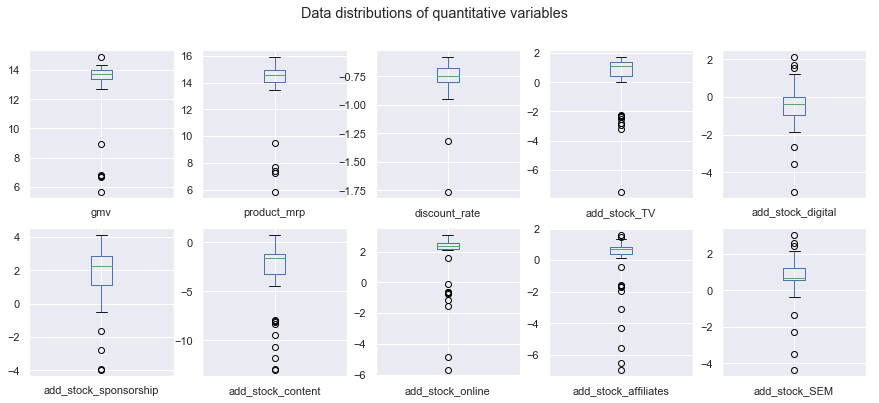

In [796]:
df_game_log[column_list].plot(kind='box',subplots=True,layout=(2,5),
                                    sharex=False,figsize=(15,6), 
                                    title="Data distributions of quantitative variables")
plt.show()

#### Remarks: 
1. Log transformation has transformed outliers from positive percentile to negative percentile
2. Also concentration of outliers at 0 is due to the replacement of -inf value with 0

#### Scatter Plots (Bivariate Relationship among continuous data) 

<Figure size 720x720 with 0 Axes>

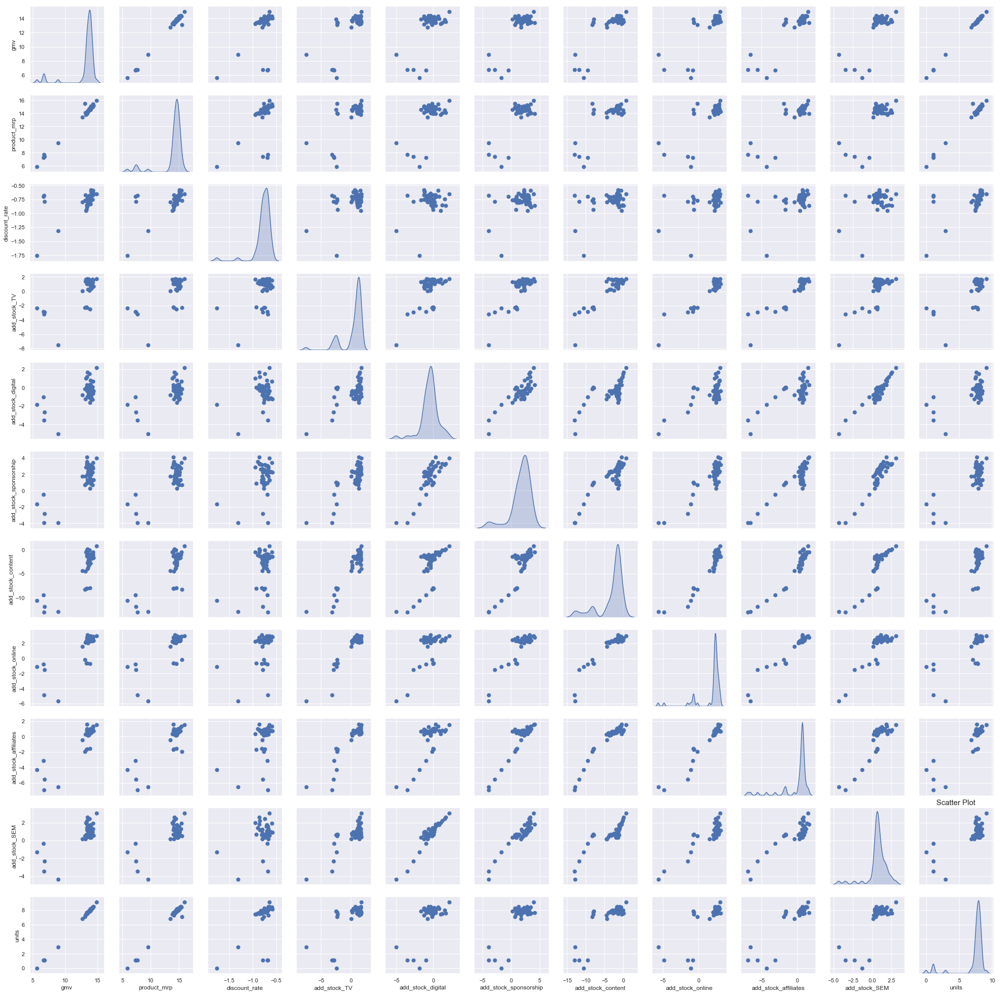

In [797]:
# Draw scatter plot
plt.figure(figsize=(10,10))
sns.set(style="darkgrid")
ax=sns.pairplot(df_game_log[column_list+['units']],diag_kind ='kde',
               plot_kws=dict(s=50, edgecolor="b", linewidth=1),diag_kws=dict(shade=True))

plt.title('Scatter Plot',   fontsize=15)
#ax.set_xticklabels(ax.(), rotation=65, ha="right",weight="bold",fontsize=15)


plt.show()

#### Remarks:
##### PART - 1
1. Log Transformation was able to show the linearity in relationship more clearly
2. This indicates that the relation ships are exponential in nature
3. For GMV, evident linear relationship is with MRP and units as expected.

##### PART - 2
1. Log `Add Stocks` are clearly linearly related to each other
3. We can understand GMV linearity with `units` because that has a direct relationship.

We will study them while looking at correlation heat map. It is easy to figure out relationships there

#### Heat-Map (Bivariate Relationship among continuous data) 
1. While doing this, we ignored weather components as they are not continuous values.

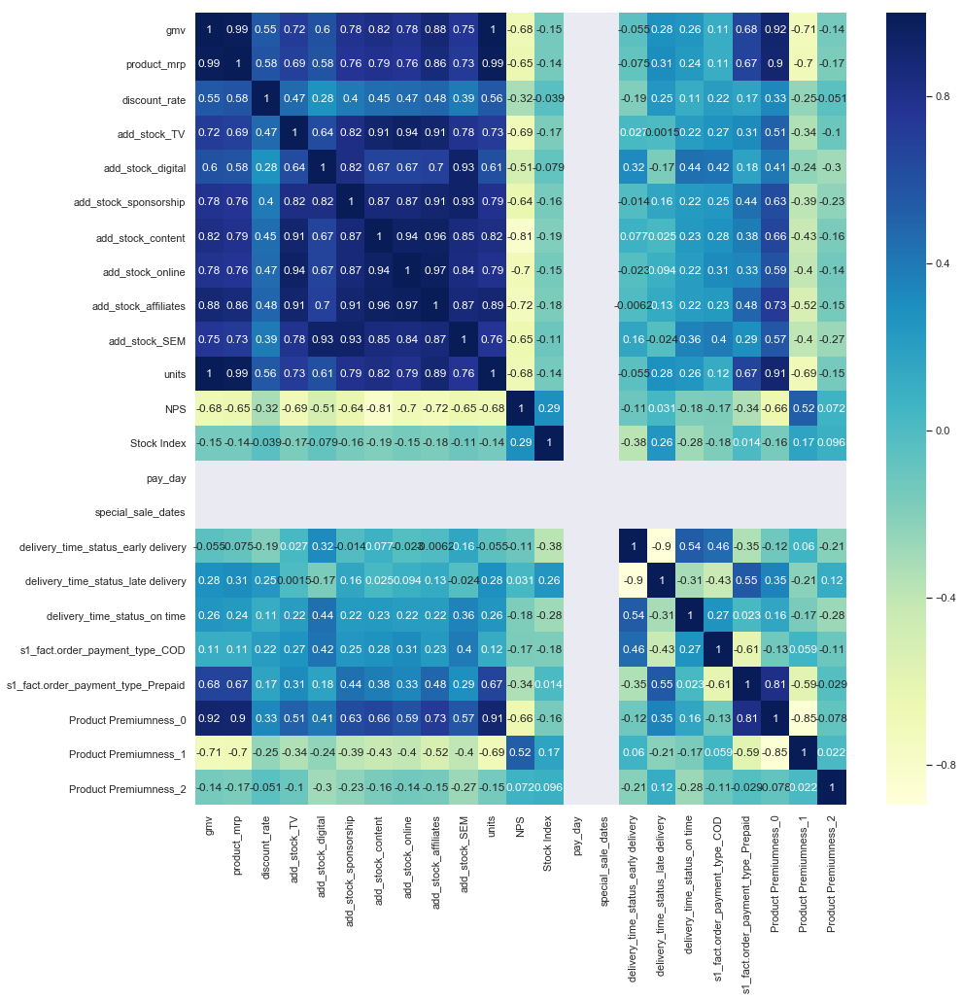

In [798]:
# Check correlation heatmap
plt.figure(figsize=(15,15))
sns.heatmap(df_game_log[column_list+['units','NPS','Stock Index','pay_day','special_sale_dates',
'delivery_time_status_early delivery','delivery_time_status_late delivery', 'delivery_time_status_on time',
's1_fact.order_payment_type_COD', 's1_fact.order_payment_type_Prepaid','Product Premiumness_0', 
                                      'Product Premiumness_1','Product Premiumness_2']].corr(), 
            annot=True, cmap='YlGnBu')
plt.show()

#### Remarks: Similar to scatter plots reflect here. Let us reiterate the findings
##### PART - 1: Correlations with GMV (Good to have)
1. It is evident that from `gmv` to `units`, features are highly correlated. 
3. `All Product Premiumness features 1 and 2` are negatively correlated with GMV, while 0 is highly postively correlated
4. `Ontime delivery` and `Sale Day` are highly correlated with GMV
5. `Add Stocks` have good correlation with GMV

##### PART - 2: Correlations among features (Multi-collinearity)
1. `Discount Rate` is correlated to `add stocks` and delivery status and product premiumness
2. `Units` has high correlation with `Discount rate`, `MRP` as well as `Add Stocks`

##### PART - 3: Effect of log on smaller numbers
1. Clearly `Pay Day and Special Sales day` being small numerical values transformed to -inf aka 0 due to natural log transformation

Let us see how we can leverage the correlation knowledge, P-Values and VIF to choose features wisely. `Business intuition is extremely important consideration in MMM to keep in mind. Some decissions will be taken ignoring the math rules associated to understand business`

### Modeling


#### Train-Test Split and Scaling

In [799]:
X_train_ln,y_train_ln,X_test_ln,y_test_ln = split_scale_feature(df_game_log)

In [800]:
X_train_ln.shape

(37, 31)

#### Recursive Feature Elimination

In [801]:
X_train_ln_iter0 = rfe_function(X_train_ln,y_train_ln,28)

#### Model Evaluation using StatsModel 

In [802]:
# Results of stats model iteration - 1
X_train_column_list, model_iter1, summary, VIF = statsmodel_vif(X_train_ln_iter0,y_train,[])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.969
Model:                            OLS   Adj. R-squared:                  0.859
Method:                 Least Squares   F-statistic:                     8.861
Date:                Mon, 23 Dec 2019   Prob (F-statistic):            0.00163
Time:                        21:09:07   Log-Likelihood:                 73.981
No. Observations:                  37   AIC:                            -89.96
Df Residuals:                       8   BIC:                            -43.25
Df Model:                          28                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
1,units,6184.11000
0,const,5650.63000
2,product_mrp,5230.37000
27,add_stock_affiliates,612.75000
24,add_stock_sponsorship,509.36000
9,Product Premiumness_0,451.36000
28,add_stock_SEM,265.90000
18,Total Precip (mm),211.70000
16,Total Rain (mm),206.62000
8,s1_fact.order_payment_type_Prepaid,194.36000


#### Remarks: 
Let us remove `Min Temp (°C)` as it has high p-value


In [803]:
# Results of stats model iteration - 2
X_train_column_list, model_iter2, summary, VIF = statsmodel_vif(X_train_ln_iter0,y_train_ln,['Min Temp (°C)'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                     4471.
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.06e-15
Time:                        21:09:10   Log-Likelihood:                 173.30
No. Observations:                  37   AIC:                            -290.6
Df Residuals:                       9   BIC:                            -245.5
Df Model:                          27                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
1,units,6115.55000
0,const,5648.51000
2,product_mrp,5081.88000
26,add_stock_affiliates,612.66000
23,add_stock_sponsorship,508.68000
9,Product Premiumness_0,449.72000
17,Total Precip (mm),200.91000
15,Total Rain (mm),198.23000
27,add_stock_SEM,196.74000
8,s1_fact.order_payment_type_Prepaid,188.47000


#### Remarks: 
Let us drop `s1_fact.order_payment_type_COD` as it has high p-value

In [804]:
# Results of stats model iteration - 3
X_train_column_list, model_iter3, summary, VIF = statsmodel_vif(X_train_ln_iter0,y_train_ln,
                                                                ['s1_fact.order_payment_type_COD'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                     5156.
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.43e-17
Time:                        21:09:12   Log-Likelihood:                 173.29
No. Observations:                  37   AIC:                            -292.6
Df Residuals:                      10   BIC:                            -249.1
Df Model:                          26                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
1,units,5717.47000
0,const,5624.12000
2,product_mrp,4870.45000
22,add_stock_sponsorship,470.81000
25,add_stock_affiliates,454.54000
8,Product Premiumness_0,421.29000
16,Total Precip (mm),200.48000
14,Total Rain (mm),197.70000
26,add_stock_SEM,180.97000
24,add_stock_online,140.30000


#### Remarks:
Let us drop `delivery_time_status_late delivery` for having high p-value

In [805]:
# Results of stats model iteration - 4
X_train_column_list, model_iter4, summary, VIF = statsmodel_vif(X_train_ln_iter0,y_train_ln,
                                                                ['delivery_time_status_late delivery'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                     5894.
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.81e-19
Time:                        21:09:14   Log-Likelihood:                 173.28
No. Observations:                  37   AIC:                            -294.6
Df Residuals:                      11   BIC:                            -252.7
Df Model:                          25                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
1,units,5549.78000
0,const,4610.61000
2,product_mrp,4561.06000
21,add_stock_sponsorship,453.86000
24,add_stock_affiliates,445.65000
7,Product Premiumness_0,419.47000
25,add_stock_SEM,176.51000
15,Total Precip (mm),168.41000
13,Total Rain (mm),166.38000
23,add_stock_online,135.70000


#### Remarks:
Let us drop `Total Snow (cm)` as it has high p-value

In [806]:
# Results of stats model iteration - 5
X_train_column_list, model_iter5, summary, VIF = statsmodel_vif(X_train_ln_iter0,y_train_ln,['Total Snow (cm)'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                     6598.
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           2.34e-21
Time:                        21:09:17   Log-Likelihood:                 173.00
No. Observations:                  37   AIC:                            -296.0
Df Residuals:                      12   BIC:                            -255.7
Df Model:                          24                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
1,units,5283.52000
0,const,4589.84000
2,product_mrp,4417.16000
23,add_stock_affiliates,414.58000
20,add_stock_sponsorship,412.71000
7,Product Premiumness_0,343.03000
24,add_stock_SEM,176.35000
22,add_stock_online,135.65000
14,Total Precip (mm),128.10000
13,Total Rain (mm),121.27000


#### Remarks:
Let us drop `Stock Index` for having significant p-value

In [807]:
# Results of stats model iteration - 5
X_train_column_list, model_iter5, summary, VIF = statsmodel_vif(X_train_ln_iter0,y_train_ln,['Stock Index'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                     7439.
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           2.68e-23
Time:                        21:09:19   Log-Likelihood:                 172.95
No. Observations:                  37   AIC:                            -297.9
Df Residuals:                      13   BIC:                            -259.2
Df Model:                          23                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
1,units,5261.17000
0,const,4575.93000
2,product_mrp,4388.27000
22,add_stock_affiliates,381.97000
7,Product Premiumness_0,336.49000
19,add_stock_sponsorship,321.91000
23,add_stock_SEM,149.07000
21,add_stock_online,118.60000
14,Total Precip (mm),88.32000
18,add_stock_digital,78.59000


#### Remarks:
1. `Product MRP`, `GMV` and `Units` are highly correlated with each other. 
2. Since Product MRP does not directly associate with GMV than others
3. Let us drop `product_mrp` 

In [808]:
# Results of stats model iteration - 6
X_train_column_list, model_iter6, summary, VIF = statsmodel_vif(X_train_ln_iter0,y_train_ln,['product_mrp'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                     7768.
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           4.81e-25
Time:                        21:09:21   Log-Likelihood:                 171.56
No. Observations:                  37   AIC:                            -297.1
Df Residuals:                      14   BIC:                            -260.1
Df Model:                          22                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
0,const,1634.44000
21,add_stock_affiliates,306.56000
6,Product Premiumness_0,175.76000
22,add_stock_SEM,148.56000
20,add_stock_online,100.24000
18,add_stock_sponsorship,97.51000
13,Total Precip (mm),78.02000
19,add_stock_content,75.85000
12,Total Rain (mm),70.82000
1,units,67.65000


#### Remarks:
1. `add_stock_affiliates` has high P Value and VIF
2. It has high correlation with `add_stock_content` which is understandable
3. Though it has good correlation with GMV, 
4. Since we have content add stock so far, we are dropping `add_stock_affiliates`

In [809]:
# Results of stats model iteration - 7
X_train_column_list, model_iter7, summary, VIF = statsmodel_vif(X_train_ln_iter0,y_train_ln,['add_stock_affiliates'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                     8183.
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           8.06e-27
Time:                        21:09:27   Log-Likelihood:                 170.38
No. Observations:                  37   AIC:                            -296.8
Df Residuals:                      15   BIC:                            -261.3
Df Model:                          21                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
0,const,1519.19000
6,Product Premiumness_0,169.41000
21,add_stock_SEM,126.48000
18,add_stock_sponsorship,79.04000
19,add_stock_content,75.17000
13,Total Precip (mm),71.19000
1,units,66.74000
12,Total Rain (mm),65.45000
17,add_stock_digital,53.84000
8,Max Temp (°C),44.11000


#### Remarks:
1. `add_stock_digital` has high P-Value as well as VIF.
2. So for now, let us just drop `add_stock_digital`

In [810]:
# Results of stats model iteration - 8
X_train_column_list, model_iter8, summary, VIF = statsmodel_vif(X_train_ln_iter0,y_train_ln,['add_stock_digital'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                     9123.
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           8.49e-29
Time:                        21:09:31   Log-Likelihood:                 170.30
No. Observations:                  37   AIC:                            -298.6
Df Residuals:                      16   BIC:                            -264.8
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
0,const,1515.10000
6,Product Premiumness_0,168.84000
17,add_stock_sponsorship,78.86000
1,units,66.55000
13,Total Precip (mm),58.71000
12,Total Rain (mm),55.35000
18,add_stock_content,53.35000
8,Max Temp (°C),39.67000
19,add_stock_online,36.12000
16,add_stock_TV,30.19000


#### Remarks:
Let us drop `delivery_time_status_on time` as it has high p-value

In [811]:
# Results of stats model iteration - 9
X_train_column_list, model_iter9, summary, VIF = statsmodel_vif(X_train_ln_iter0,y_train_ln,['delivery_time_status_on time'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 1.010e+04
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           8.94e-31
Time:                        21:09:35   Log-Likelihood:                 170.10
No. Observations:                  37   AIC:                            -300.2
Df Residuals:                      17   BIC:                            -268.0
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
0,const,1505.16000
5,Product Premiumness_0,162.09000
16,add_stock_sponsorship,78.85000
1,units,66.10000
12,Total Precip (mm),58.70000
11,Total Rain (mm),55.05000
17,add_stock_content,53.26000
7,Max Temp (°C),39.43000
18,add_stock_online,36.12000
15,add_stock_TV,29.58000


#### Remarks:
Let us drop `Heat Deg Days (°C)` for having significcant p-value

In [812]:
# Results of stats model iteration - 10
X_train_column_list, model_iter10, summary, VIF = statsmodel_vif(X_train_ln_iter0,y_train_ln,['Heat Deg Days (°C)'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 1.078e+04
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.24e-32
Time:                        21:09:38   Log-Likelihood:                 169.25
No. Observations:                  37   AIC:                            -300.5
Df Residuals:                      18   BIC:                            -269.9
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
0,const,1505.10000
5,Product Premiumness_0,147.66000
15,add_stock_sponsorship,68.70000
1,units,62.80000
11,Total Precip (mm),58.34000
10,Total Rain (mm),53.81000
16,add_stock_content,51.16000
7,Max Temp (°C),38.18000
17,add_stock_online,30.64000
18,add_stock_SEM,26.29000


#### Remarks:
2. Let us drop `Snow on Grnd (cm)`
3. Presently, thye focus is on dropping columns which has high values in both VIF as well as P

In [813]:
# Results of stats model iteration - 11
X_train_column_list, model_iter11, summary, VIF = statsmodel_vif(X_train_ln_iter0,y_train_ln,['Snow on Grnd (cm)'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 1.176e+04
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.38e-34
Time:                        21:09:41   Log-Likelihood:                 168.81
No. Observations:                  37   AIC:                            -301.6
Df Residuals:                      19   BIC:                            -272.6
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
0,const,1362.49000
5,Product Premiumness_0,145.14000
14,add_stock_sponsorship,68.64000
1,units,62.33000
15,add_stock_content,50.97000
11,Total Precip (mm),46.82000
10,Total Rain (mm),39.97000
16,add_stock_online,30.64000
17,add_stock_SEM,26.25000
13,add_stock_TV,19.98000


#### Remarks:
Let's drop `Product Premiumness_0` as it has significant p-value

In [814]:
# Results of stats model iteration - 12
X_train_column_list, model_iter12, summary, VIF = statsmodel_vif(X_train_ln_iter0,y_train_ln,['Product Premiumness_0'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 1.179e+04
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           3.48e-36
Time:                        21:09:44   Log-Likelihood:                 166.79
No. Observations:                  37   AIC:                            -299.6
Df Residuals:                      20   BIC:                            -272.2
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
0,const,456.31000
13,add_stock_sponsorship,67.16000
10,Total Precip (mm),46.51000
14,add_stock_content,40.47000
9,Total Rain (mm),39.89000
15,add_stock_online,30.20000
1,units,22.67000
16,add_stock_SEM,21.70000
6,Max Temp (°C),13.59000
12,add_stock_TV,13.35000


#### Remarks:
Let us drop `add_stock_TV` as it has significant p-value

In [815]:
# Results of stats model iteration - 13
X_train_column_list, model_iter13, summary, VIF = statsmodel_vif(X_train_ln_iter0,y_train_ln,['add_stock_TV'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 1.320e+04
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           2.97e-38
Time:                        21:09:48   Log-Likelihood:                 166.78
No. Observations:                  37   AIC:                            -301.6
Df Residuals:                      21   BIC:                            -275.8
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
0,const,456.21000
12,add_stock_sponsorship,66.91000
10,Total Precip (mm),46.33000
9,Total Rain (mm),39.85000
13,add_stock_content,39.26000
1,units,22.43000
14,add_stock_online,21.79000
15,add_stock_SEM,21.65000
6,Max Temp (°C),13.37000
11,NPS,10.47000


#### Remarks:
Let us drop `s1_fact.order_payment_type_Prepaid`as ti has high p-value

In [816]:
# Results of stats model iteration - 14
X_train_column_list, model_iter14, summary, VIF = statsmodel_vif(X_train_ln_iter0,y_train_ln,['s1_fact.order_payment_type_Prepaid'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 1.466e+04
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           2.66e-40
Time:                        21:09:51   Log-Likelihood:                 166.58
No. Observations:                  37   AIC:                            -303.2
Df Residuals:                      22   BIC:                            -279.0
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
0,const,316.54000
11,add_stock_sponsorship,59.24000
9,Total Precip (mm),46.26000
8,Total Rain (mm),39.82000
12,add_stock_content,38.84000
13,add_stock_online,19.68000
14,add_stock_SEM,18.69000
1,units,16.25000
5,Max Temp (°C),13.18000
10,NPS,10.47000


#### Remarks:
1. Let us select whole set of new features to drop
2. Let us drop `Total Precip (mm)` due to its signifivant p-values

In [817]:
# Results of stats model iteration - 15
X_train_column_list, model_iter15, summary, VIF = statsmodel_vif(X_train_ln_iter0,y_train_ln,['Total Precip (mm)'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 1.196e+04
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           8.12e-41
Time:                        21:09:54   Log-Likelihood:                 160.63
No. Observations:                  37   AIC:                            -293.3
Df Residuals:                      23   BIC:                            -270.7
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
0,const,275.63000
10,add_stock_sponsorship,54.10000
11,add_stock_content,38.01000
13,add_stock_SEM,18.25000
12,add_stock_online,17.22000
1,units,13.48000
5,Max Temp (°C),11.33000
9,NPS,8.97000
6,Mean Temp (°C),7.52000
4,Product Premiumness_1,4.00000


#### Remarks:
1. Let us drop `Total Rain (mm)`
2. To iterate with a different feature

In [818]:
# Results of stats model iteration - 16
X_train_column_list, model_iter16, summary, VIF = statsmodel_vif(X_train_ln_iter0,y_train_ln,['Total Rain (mm)'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 1.314e+04
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           9.54e-43
Time:                        21:09:57   Log-Likelihood:                 160.10
No. Observations:                  37   AIC:                            -294.2
Df Residuals:                      24   BIC:                            -273.3
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
0,const,274.54000
9,add_stock_sponsorship,50.04000
10,add_stock_content,35.67000
12,add_stock_SEM,18.17000
11,add_stock_online,15.64000
1,units,13.09000
5,Max Temp (°C),11.19000
6,Mean Temp (°C),7.52000
8,NPS,6.47000
4,Product Premiumness_1,3.68000


#### Remarks:
Let us drop `delivery_time_status_early delivery` as it has significant p-value 

In [819]:
# Results of stats model iteration - 17
X_train_column_list, model_iter17, summary, VIF = statsmodel_vif(X_train_ln_iter0,y_train_ln,['delivery_time_status_early delivery'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 1.492e+04
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           7.61e-45
Time:                        21:10:01   Log-Likelihood:                 160.09
No. Observations:                  37   AIC:                            -296.2
Df Residuals:                      25   BIC:                            -276.8
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                     0.06

,Features,VIF
0,const,203.38000
8,add_stock_sponsorship,49.75000
9,add_stock_content,35.66000
11,add_stock_SEM,14.95000
1,units,12.52000
10,add_stock_online,12.04000
4,Max Temp (°C),10.18000
5,Mean Temp (°C),7.52000
7,NPS,6.35000
3,Product Premiumness_1,3.59000


#### Remarks:
1. As a next iteration, let us drop `Cool Deg Days (°C)`

In [820]:
# Results of stats model iteration - 18
X_train_column_list, model_iter18, summary, VIF = statsmodel_vif(X_train_ln_iter0,y_train_ln,['Cool Deg Days (°C)'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 1.642e+04
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           9.36e-47
Time:                        21:10:04   Log-Likelihood:                 159.36
No. Observations:                  37   AIC:                            -296.7
Df Residuals:                      26   BIC:                            -279.0
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                     0.06

,Features,VIF
0,const,199.49000
7,add_stock_sponsorship,49.74000
8,add_stock_content,35.17000
10,add_stock_SEM,14.95000
1,units,12.44000
9,add_stock_online,11.65000
4,Max Temp (°C),10.18000
5,Mean Temp (°C),7.39000
6,NPS,5.71000
3,Product Premiumness_1,3.58000


#### Remarks
1. To change the feature set, let us drop `add_stock_online` which has increasing P-Value with each iteration

In [821]:
# Results of stats model iteration - 19
X_train_column_list, model_iter19, summary, VIF = statsmodel_vif(X_train_ln_iter0,y_train_ln,['add_stock_online'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 1.812e+04
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.19e-48
Time:                        21:10:07   Log-Likelihood:                 158.54
No. Observations:                  37   AIC:                            -297.1
Df Residuals:                      27   BIC:                            -281.0
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                     0.06

,Features,VIF
0,const,181.78000
7,add_stock_sponsorship,46.24000
8,add_stock_content,30.83000
9,add_stock_SEM,14.94000
1,units,12.00000
4,Max Temp (°C),9.87000
5,Mean Temp (°C),7.34000
6,NPS,5.65000
3,Product Premiumness_1,3.56000
2,discount_rate,1.58000


#### Remarks
1. `Mean Temp (°C)` has a high P-Value
2. Let us drop `Mean Temp (°C)`

In [822]:
# Results of stats model iteration - 20
X_train_column_list, model_iter20, summary, VIF = statsmodel_vif(X_train_ln_iter0,y_train_ln,['Mean Temp (°C)'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 1.951e+04
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           2.42e-50
Time:                        21:10:10   Log-Likelihood:                 157.06
No. Observations:                  37   AIC:                            -296.1
Df Residuals:                      28   BIC:                            -281.6
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                     0.05

,Features,VIF
0,const,147.89000
6,add_stock_sponsorship,35.20000
7,add_stock_content,27.82000
8,add_stock_SEM,12.40000
1,units,11.75000
5,NPS,5.21000
3,Product Premiumness_1,3.55000
4,Max Temp (°C),1.99000
2,discount_rate,1.58000


#### Remarks
Let us drop `add_stock_sponsorship` though it looks like a promising feature at the start

In [823]:
# Results of stats model iteration - 21
X_train_column_list, model_iter21, summary, VIF = statsmodel_vif(X_train_ln_iter0,y_train_ln,['add_stock_sponsorship'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 2.095e+04
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           6.27e-52
Time:                        21:10:15   Log-Likelihood:                 155.26
No. Observations:                  37   AIC:                            -294.5
Df Residuals:                      29   BIC:                            -281.6
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                     0.05

,Features,VIF
0,const,97.45000
6,add_stock_content,15.19000
1,units,10.43000
7,add_stock_SEM,6.25000
5,NPS,3.60000
3,Product Premiumness_1,3.50000
2,discount_rate,1.57000
4,Max Temp (°C),1.35000


#### Remarks
1. Let us drop `Max Temp (°C)` due to increase in P Value

In [824]:
# Results of stats model iteration - 22
X_train_column_list, model_iter22, summary, VIF = statsmodel_vif(X_train_ln_iter0,y_train_ln,['Max Temp (°C)'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 2.430e+04
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           6.81e-54
Time:                        21:10:20   Log-Likelihood:                 154.52
No. Observations:                  37   AIC:                            -295.0
Df Residuals:                      30   BIC:                            -283.8
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                     0.04

,Features,VIF
0,const,90.36000
5,add_stock_content,13.35000
1,units,10.23000
6,add_stock_SEM,5.46000
4,NPS,3.59000
3,Product Premiumness_1,3.27000
2,discount_rate,1.56000


In [825]:
# Results of stats model iteration - 23
X_train_column_list, model_iter23, summary, VIF = statsmodel_vif(X_train_ln_iter0,y_train_ln,['NPS'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 2.746e+04
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.56e-55
Time:                        21:10:23   Log-Likelihood:                 152.81
No. Observations:                  37   AIC:                            -293.6
Df Residuals:                      31   BIC:                            -284.0
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                     0.04

,Features,VIF
0,const,80.95000
1,units,9.98000
4,add_stock_content,9.57000
5,add_stock_SEM,5.36000
3,Product Premiumness_1,2.80000
2,discount_rate,1.56000


#### Remarks
Let us drop `add_stock_content` as it has high p-values

In [826]:
# Results of stats model iteration - 24
X_train_column_list, model_iter24, summary, VIF = statsmodel_vif(X_train_ln_iter0,y_train_ln,['add_stock_content'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 3.528e+04
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           8.29e-58
Time:                        21:10:27   Log-Likelihood:                 152.72
No. Observations:                  37   AIC:                            -295.4
Df Residuals:                      32   BIC:                            -287.4
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                     0.04

,Features,VIF
0,const,59.60000
1,units,6.24000
4,add_stock_SEM,2.99000
3,Product Premiumness_1,2.40000
2,discount_rate,1.56000


#### Remarks
1. P-Value is < 0.05 for almost all features except constant
2. P Value signifies the importance of feature in the model
3. `<0.05` signifies 95% confidance of feature importance
4. In our case, we have very less data as small as 37 points to model the data
5. For this reason, we can slightly loosen the P-Value limits.
6. `So, we feel any P-Value less than 0.075 is a decent bet`. We assume with more data, that P-Value can be controlled to < 0.05.
7. So let us stop modeling here

__Important:__ __We successfully maintained the R Square and Adjusted R Square Scores__

#### Residual Analysis of Train Test Data

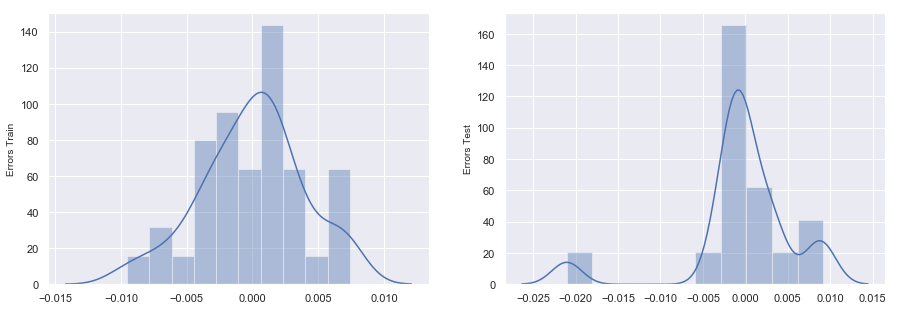

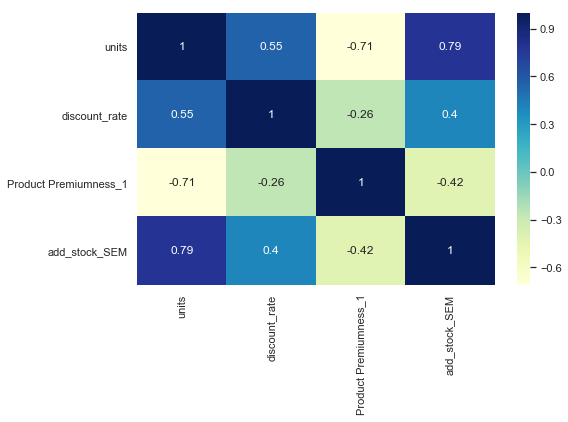

                    0
train r score 0.99977
test r score  0.98333
                 0
rmse_train 0.00390
rmse_test  0.00638


In [827]:
y_train_real_pred, y_test_real_pred, r2_dataframe, rmse_dataframe = predictions_and_residual_analysis_and_rscore(X_train_ln_iter0, 
                                                                                                 y_train_ln,
                                                                                                 X_test_ln,
                                                                                                 y_test_ln,
                                                                                                 model_iter24)
print(r2_dataframe)
print(rmse_dataframe)

### Elasticity of  `GMV` (Revenue)
As per economics, elasticity is the measure of how sensitive dependent variable (in our case, revenue) is to a particular independent variable.

<h3><center> $Elasticity_{gmv} = \frac{\frac{\delta{GMV}}{GMV}}{\frac{\delta{feature}}{feature}} $</centre> </h3>


while plotting elasticity, we will know,
1. Whether GMV is directly or indirectly propostional to a particular feature
2. How varying the dependency is?
3. Where exactly the dependency is? and such



Let us look at the elasticity of revenue with our predictors

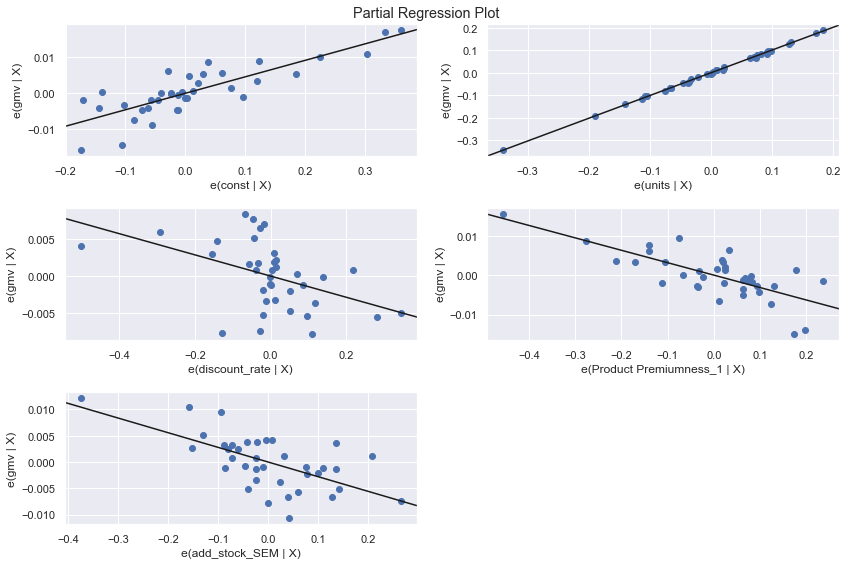

In [828]:
fig = plt.figure(figsize=(12,8))
fig = sm.graphics.plot_partregress_grid(model_iter24, fig=fig)

### Remarks:
It is evident that,
1. Units have a positive and continuous inpact on the gmv
2. Clearly, Without any marketing, GMV is increasing with increasing variance
3. Product Premiumness, Discounts and SEM had surprisingly had negative effect as they are marketing tools as such
4. This actually suggests against a belief that marketing helps
5. This model might not be ideal

### Multiplicative Model for gaming accesories so far turned to be the best but skeptical

### Model 3: Koyck Models

### Compute Auto-Correlation:
1. By definition, Auto-Correlation determines the correlation of a variable with itself with time.
2. If we can find auto correlation of `gmv` with itself.
3. We know how much of past `gmv` is effecting the current `gmv`


Let us have a look at it

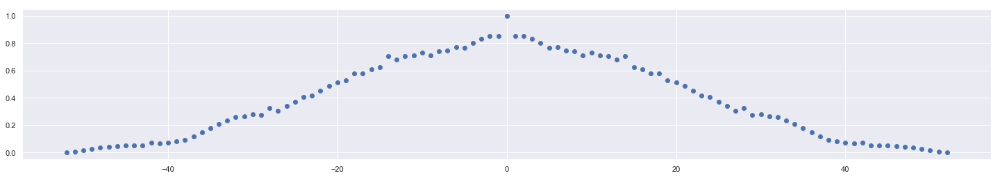

In [829]:
# Auto Correlation Analysis
from pandas.plotting import autocorrelation_plot
gmv = df_combined_game['gmv']
plt.figure(figsize = (25,4))

plt.acorr(gmv, usevlines=False, normed=True, maxlags=52)
plt.show()

#### Remarks:
1. We can see that `lag GMV` is symmetrical on both sides.
2. We will analyse only one side of the lag Graph. Let us take the positive side
3. Relation between `gmv` and `lag gmv` has a `seasonality or recurring trend` for every 5 lags.
4. So if we take 5 lag features, that will cover the seasonality in all other features too

__We take `5 lag features`__

### Adding Lag GMV to the existing DataFrame

In [830]:
df_game_lag = lag_addition(df_combined_game,5, 'gmv')

In [831]:
df_game_lag['gmv lag 1'].shape

(53,)

In [832]:
# Our dataframe is df_combined_camera
df_game_lag.columns

Index(['gmv', 'units', 'product_mrp', 'pay_day', 'special_sale_dates',
       'discount_rate', 'delivery_time_status_early delivery',
       'delivery_time_status_late delivery', 'delivery_time_status_on time',
       's1_fact.order_payment_type_COD', 's1_fact.order_payment_type_Prepaid',
       'Product Premiumness_0', 'Product Premiumness_1',
       'Product Premiumness_2', 'Max Temp (°C)', 'Min Temp (°C)',
       'Mean Temp (°C)', 'Heat Deg Days (°C)', 'Cool Deg Days (°C)',
       'Total Rain (mm)', 'Total Snow (cm)', 'Total Precip (mm)',
       'Snow on Grnd (cm)', 'NPS', 'Stock Index', 'add_stock_TV',
       'add_stock_digital', 'add_stock_sponsorship', 'add_stock_content',
       'add_stock_online', 'add_stock_affiliates', 'add_stock_SEM',
       'gmv lag 1', 'gmv lag 2', 'gmv lag 3', 'gmv lag 4', 'gmv lag 5'],
      dtype='object')

### Univariate and Bivariate Analysis of Lag Data
1. The analysis for all other features was essentially done while performing `linear regression`
2. We will perform the similar analysis for only lags with GMV in this problem
1. This analysis is typically performed for continuous features only. So we choose only a few features to do it
2. Selected features include `gmv`, `discount_rate`, `All add stocks`

#### Box Plots: To check Outliers

In [833]:
import matplotlib
column_list_lag_gmv = ['gmv', 'gmv lag 1', 'gmv lag 2', 'gmv lag 3', 'gmv lag 4', 'gmv lag 5']



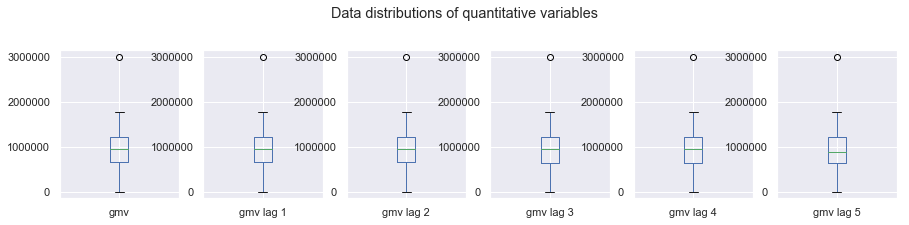

In [834]:
df_game_lag[column_list_lag_gmv].plot(kind='box',subplots=True,layout=(2,6),
                                    sharex=False,figsize=(15,6), 
                                    title="Data distributions of quantitative variables")
plt.show()

#### Remarks: 
1. There are rarely any outliers. Even if there, they are mostly zeros that we imputed na with. 

#### Scatter Plots (Bivariate Relationship among lag data) 

<Figure size 720x720 with 0 Axes>

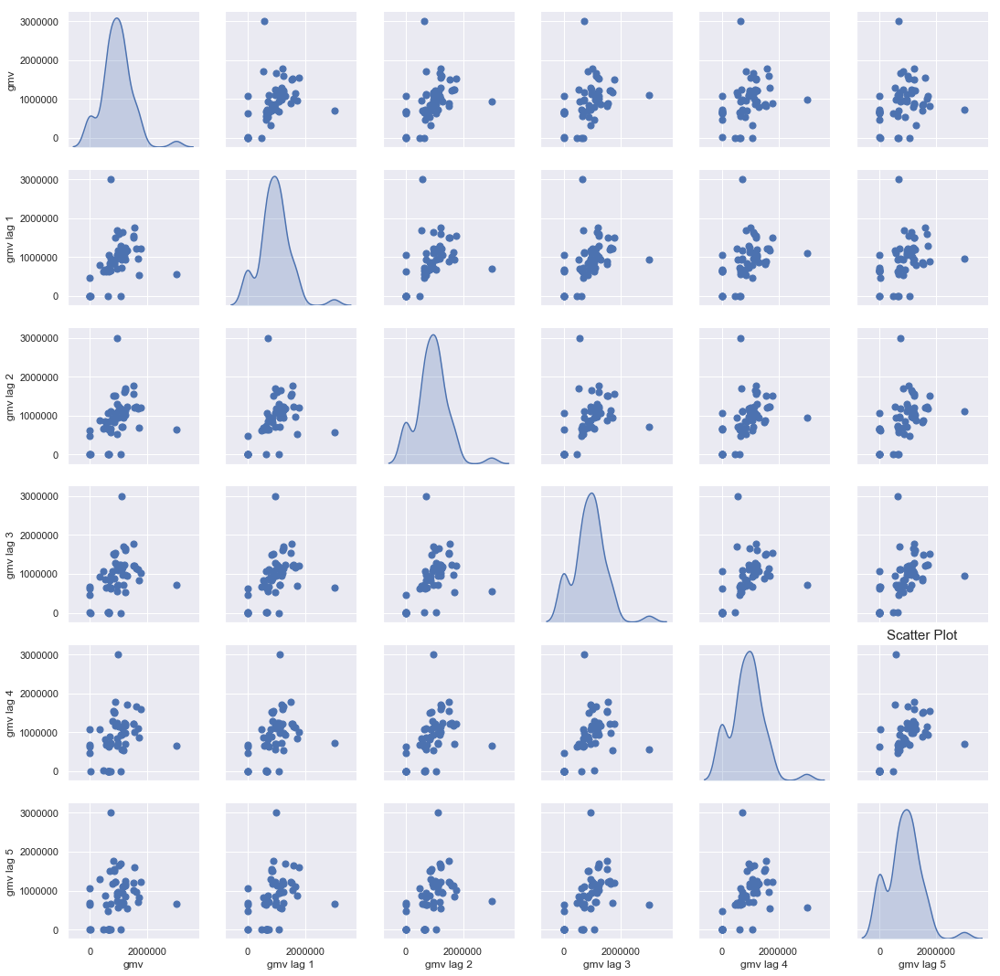

In [835]:
# Draw scatter plot


plt.figure(figsize=(10,10))
sns.set(style="darkgrid")
ax=sns.pairplot(df_game_lag[column_list_lag_gmv],diag_kind ='kde',
               plot_kws=dict(s=50, edgecolor="b", linewidth=1),diag_kws=dict(shade=True))

plt.title('Scatter Plot',   fontsize=15)
#ax.set_xticklabels(ax.(), rotation=65, ha="right",weight="bold",fontsize=15)


plt.show()

#### Remarks:
##### PART - 1
1. It feels like each lag has a  relation with gmv with heterosedasticity.
2. This means the variability is increasing with time which is expected

#### Heat-Map (Bivariate Relationship among Lag data) 
1. While doing this, we ignored weather components as they are not continuous values.

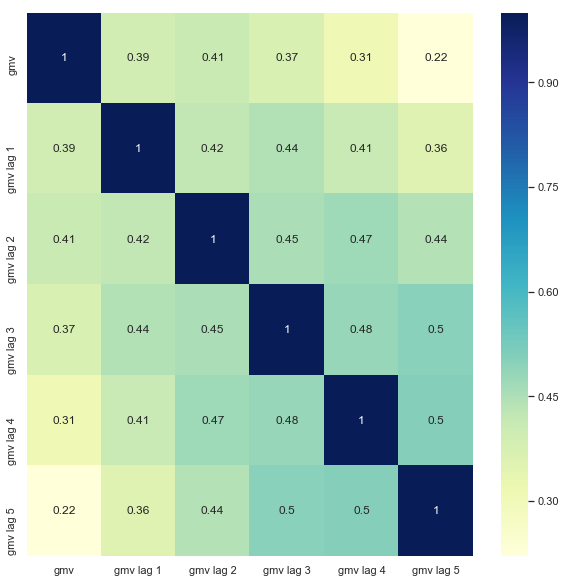

In [836]:
plt.figure(figsize=(10,10))
sns.heatmap(df_game_lag[column_list_lag_gmv].corr(), 
            annot=True, cmap='YlGnBu')
plt.show()

#### Remarks:
1. We already checked in the auto correlation graph that GMV has decreasing with lag GMV
2. We cannot expect any substantial model difference due to lags because the correlations are not so highlighting

### Modeling


#### Train-Test Split and Scaling

In [837]:
X_train_lag,y_train_lag,X_test_lag,y_test_lag = split_scale_feature(df_game_lag)

In [838]:
X_train_lag.shape

(37, 36)

####  Recursive Feature Elimination

In [839]:
X_train_lag_iter0 = rfe_function(X_train_lag,y_train_lag,28)

#### Model Building using StatsModel 

In [840]:
# Results of stats model iteration - 1
X_train_column_list, model_iter1, summary, VIF = statsmodel_vif(X_train_lag_iter0,y_train,[])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  0.999
Method:                 Least Squares   F-statistic:                     973.0
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           5.94e-14
Time:                        21:14:36   Log-Likelihood:                 154.83
No. Observations:                  37   AIC:                            -255.7
Df Residuals:                      10   BIC:                            -212.2
Df Model:                          26                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

,Features,VIF
14,Cool Deg Days (°C),inf
5,s1_fact.order_payment_type_COD,inf
13,Heat Deg Days (°C),inf
6,s1_fact.order_payment_type_Prepaid,inf
12,Mean Temp (°C),inf
8,Product Premiumness_1,585812.26000
7,Product Premiumness_0,585472.03000
24,add_stock_SEM,1300.02000
19,add_stock_digital,1154.06000
11,Min Temp (°C),743.12000


#### Remarks: 
1. As we discussed earlier, We shall eliminate one from each feature set every time and we iterate the process until we get a decent model
2. We will start with weather
3. `Cool Deg Days (°C)` has highest VIF but less P-Value
4. We still choose to drop `Cool Deg Days (°C)` to handle multi collinearity

In [841]:
# Results of stats model iteration - 2
X_train_column_list, model_iter2, summary, VIF = statsmodel_vif(X_train_lag_iter0,y_train_lag,['Cool Deg Days (°C)'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  0.999
Method:                 Least Squares   F-statistic:                     973.0
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           5.94e-14
Time:                        21:14:38   Log-Likelihood:                 154.83
No. Observations:                  37   AIC:                            -255.7
Df Residuals:                      10   BIC:                            -212.2
Df Model:                          26                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

,Features,VIF
5,s1_fact.order_payment_type_COD,inf
6,s1_fact.order_payment_type_Prepaid,inf
8,Product Premiumness_1,585812.26000
7,Product Premiumness_0,585472.03000
12,Mean Temp (°C),2361.32000
23,add_stock_SEM,1300.02000
18,add_stock_digital,1154.06000
11,Min Temp (°C),743.12000
10,Max Temp (°C),582.16000
1,units,347.96000


#### Remarks: 
1. In the iteration, we will drop `s1_fact.order_payment_type_COD` which has significant p-value and VIF as ininity

In [842]:
# Results of stats model iteration - 3
X_train_column_list, model_iter3, summary, VIF = statsmodel_vif(X_train_lag_iter0,y_train_lag,
                                                                ['s1_fact.order_payment_type_COD'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  0.999
Method:                 Least Squares   F-statistic:                     973.0
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           5.94e-14
Time:                        21:14:40   Log-Likelihood:                 154.83
No. Observations:                  37   AIC:                            -255.7
Df Residuals:                      10   BIC:                            -212.2
Df Model:                          26                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

,Features,VIF
0,const,11763594.98000
7,Product Premiumness_1,585812.26000
6,Product Premiumness_0,585472.03000
11,Mean Temp (°C),2361.32000
22,add_stock_SEM,1300.02000
17,add_stock_digital,1154.06000
10,Min Temp (°C),743.12000
9,Max Temp (°C),582.16000
1,units,347.96000
2,product_mrp,317.64000


#### Remarks:
Let's drop `product_mrp` as it has high p-value

In [843]:
# Results of stats model iteration - 4
X_train_column_list, model_iter4, summary, VIF = statsmodel_vif(X_train_lag_iter0,y_train_lag,
                                                                ['product_mrp'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  0.999
Method:                 Least Squares   F-statistic:                     1100.
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.84e-15
Time:                        21:14:43   Log-Likelihood:                 154.61
No. Observations:                  37   AIC:                            -257.2
Df Residuals:                      11   BIC:                            -215.3
Df Model:                          25                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

,Features,VIF
0,const,10560717.10000
6,Product Premiumness_1,526608.43000
5,Product Premiumness_0,526525.95000
10,Mean Temp (°C),2015.49000
21,add_stock_SEM,711.76000
16,add_stock_digital,581.53000
9,Min Temp (°C),558.39000
8,Max Temp (°C),476.15000
20,add_stock_affiliates,207.95000
18,add_stock_content,99.62000


#### Remarks:
1. Now let us remove a lag variable
2. `gmv lag 5` has both high P-Value
3. Let us drop `gmv lag 5`

In [844]:
# Results of stats model iteration - 5
X_train_column_list, model_iter5, summary, VIF = statsmodel_vif(X_train_lag_iter0,y_train_lag,
                                                                ['gmv lag 5'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  0.999
Method:                 Least Squares   F-statistic:                     1232.
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           5.50e-17
Time:                        21:14:48   Log-Likelihood:                 154.34
No. Observations:                  37   AIC:                            -258.7
Df Residuals:                      12   BIC:                            -218.4
Df Model:                          24                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

,Features,VIF
0,const,8630339.36000
5,Product Premiumness_0,429202.30000
6,Product Premiumness_1,429108.85000
10,Mean Temp (°C),1939.21000
21,add_stock_SEM,711.00000
16,add_stock_digital,578.78000
9,Min Temp (°C),516.81000
8,Max Temp (°C),447.61000
20,add_stock_affiliates,182.69000
18,add_stock_content,93.20000


#### Remarks:
Let us drop `add_stock_digital` which has high VIF and significant p-value

In [845]:
# Results of stats model iteration - 5
X_train_column_list, model_iter5, summary, VIF = statsmodel_vif(X_train_lag_iter0,y_train_lag,['add_stock_digital'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  0.999
Method:                 Least Squares   F-statistic:                     1350.
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.75e-18
Time:                        21:14:48   Log-Likelihood:                 153.77
No. Observations:                  37   AIC:                            -259.5
Df Residuals:                      13   BIC:                            -220.9
Df Model:                          23                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

,Features,VIF
0,const,7724187.28000
6,Product Premiumness_1,384696.83000
5,Product Premiumness_0,384552.13000
10,Mean Temp (°C),1190.80000
9,Min Temp (°C),373.07000
8,Max Temp (°C),233.14000
17,add_stock_content,93.05000
20,add_stock_SEM,87.43000
11,Heat Deg Days (°C),73.78000
16,add_stock_sponsorship,51.45000


#### Remarks:
Let us drop `Total Snow (cm)` for having significant p-value

In [846]:
# Results of stats model iteration - 6
X_train_column_list, model_iter6, summary, VIF = statsmodel_vif(X_train_lag_iter0,y_train_lag,['Total Snow (cm)'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  0.999
Method:                 Least Squares   F-statistic:                     1406.
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           7.51e-20
Time:                        21:14:48   Log-Likelihood:                 152.32
No. Observations:                  37   AIC:                            -258.6
Df Residuals:                      14   BIC:                            -221.6
Df Model:                          22                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

,Features,VIF
0,const,7517949.56000
6,Product Premiumness_1,374058.93000
5,Product Premiumness_0,373874.25000
10,Mean Temp (°C),1079.98000
9,Min Temp (°C),281.82000
8,Max Temp (°C),225.43000
16,add_stock_content,93.05000
19,add_stock_SEM,81.79000
11,Heat Deg Days (°C),65.81000
15,add_stock_sponsorship,44.83000


#### Remarks:
Let's drop `Product Premiumness_2` as it has both significant p-value and high VIF

In [847]:
# Results of stats model iteration - 7
X_train_column_list, model_iter7, summary, VIF = statsmodel_vif(X_train_lag_iter0,y_train_lag,['Product Premiumness_2'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  0.999
Method:                 Least Squares   F-statistic:                     1542.
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           2.18e-21
Time:                        21:14:48   Log-Likelihood:                 151.90
No. Observations:                  37   AIC:                            -259.8
Df Residuals:                      15   BIC:                            -224.4
Df Model:                          21                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

,Features,VIF
0,const,5071151.58000
6,Product Premiumness_1,252699.26000
5,Product Premiumness_0,252402.13000
9,Mean Temp (°C),857.15000
8,Min Temp (°C),223.12000
7,Max Temp (°C),199.29000
18,add_stock_SEM,72.09000
15,add_stock_content,65.65000
10,Heat Deg Days (°C),62.14000
14,add_stock_sponsorship,44.26000


#### Remarks:
1. Let us drop `Heat Deg Days (°C)` due to high VIF

In [848]:
# Results of stats model iteration - 8
X_train_column_list, model_iter8, summary, VIF = statsmodel_vif(X_train_lag_iter0,y_train_lag,
                                                                ['Heat Deg Days (°C)'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.999
Method:                 Least Squares   F-statistic:                     1520.
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.42e-22
Time:                        21:14:52   Log-Likelihood:                 149.53
No. Observations:                  37   AIC:                            -257.1
Df Residuals:                      16   BIC:                            -223.2
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

,Features,VIF
0,const,5039792.25000
6,Product Premiumness_1,251513.20000
5,Product Premiumness_0,251256.48000
9,Mean Temp (°C),722.85000
8,Min Temp (°C),221.24000
7,Max Temp (°C),195.09000
17,add_stock_SEM,69.50000
14,add_stock_content,63.46000
13,add_stock_sponsorship,43.52000
16,add_stock_affiliates,43.16000


#### Remarks:
1. Let us drop `pay_day` due to high p-value

In [849]:
# Results of stats model iteration - 9
X_train_column_list, model_iter9, summary, VIF = statsmodel_vif(X_train_lag_iter0,y_train_lag,['pay_day'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.999
Method:                 Least Squares   F-statistic:                     1490.
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.03e-23
Time:                        21:14:55   Log-Likelihood:                 147.09
No. Observations:                  37   AIC:                            -254.2
Df Residuals:                      17   BIC:                            -222.0
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

,Features,VIF
0,const,4475484.48000
5,Product Premiumness_1,223421.45000
4,Product Premiumness_0,223219.10000
8,Mean Temp (°C),630.00000
7,Min Temp (°C),205.95000
6,Max Temp (°C),163.08000
16,add_stock_SEM,68.10000
13,add_stock_content,63.45000
12,add_stock_sponsorship,40.41000
15,add_stock_affiliates,39.32000


#### Remarks:
Let us drop `special_sale_dates` as it has significant p-value

In [850]:
# Results of stats model iteration - 10
X_train_column_list, model_iter10, summary, VIF = statsmodel_vif(X_train_lag_iter0,y_train_lag,
                                                                 ['special_sale_dates'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.999
Method:                 Least Squares   F-statistic:                     1397.
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.19e-24
Time:                        21:14:57   Log-Likelihood:                 143.85
No. Observations:                  37   AIC:                            -249.7
Df Residuals:                      18   BIC:                            -219.1
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

,Features,VIF
0,const,4321216.56000
4,Product Premiumness_1,215830.83000
3,Product Premiumness_0,215635.73000
7,Mean Temp (°C),629.34000
6,Min Temp (°C),205.22000
5,Max Temp (°C),162.59000
15,add_stock_SEM,65.93000
12,add_stock_content,63.42000
11,add_stock_sponsorship,36.92000
14,add_stock_affiliates,36.47000


#### Remarks:
1. Let us drop `Mean Temp (°C)` which has high P Value and high VIF

In [851]:
# Results of stats model iteration - 11
X_train_column_list, model_iter11, summary, VIF = statsmodel_vif(X_train_lag_iter0,y_train_lag,['Mean Temp (°C)'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.998
Model:                            OLS   Adj. R-squared:                  0.996
Method:                 Least Squares   F-statistic:                     602.8
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           2.42e-22
Time:                        21:15:00   Log-Likelihood:                 126.26
No. Observations:                  37   AIC:                            -216.5
Df Residuals:                      19   BIC:                            -187.5
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

,Features,VIF
0,const,4250989.97000
4,Product Premiumness_1,212294.60000
3,Product Premiumness_0,212109.97000
14,add_stock_SEM,65.88000
11,add_stock_content,63.40000
10,add_stock_sponsorship,36.62000
13,add_stock_affiliates,34.97000
6,Min Temp (°C),20.10000
5,Max Temp (°C),19.02000
12,add_stock_online,13.29000


#### Remarks:
Let us drop `Product Premiumness_1` as it has high VIF and significant p-value

In [852]:
# Results of stats model iteration - 12
X_train_column_list, model_iter12, summary, VIF = statsmodel_vif(X_train_lag_iter0,y_train_lag,['Product Premiumness_1'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.998
Model:                            OLS   Adj. R-squared:                  0.996
Method:                 Least Squares   F-statistic:                     629.2
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.80e-23
Time:                        21:15:02   Log-Likelihood:                 124.99
No. Observations:                  37   AIC:                            -216.0
Df Residuals:                      20   BIC:                            -188.6
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

,Features,VIF
0,const,137.11000
13,add_stock_SEM,65.67000
10,add_stock_content,59.94000
9,add_stock_sponsorship,36.61000
12,add_stock_affiliates,32.59000
5,Min Temp (°C),20.08000
4,Max Temp (°C),19.02000
11,add_stock_online,11.48000
6,NPS,8.56000
8,add_stock_TV,5.82000


#### Remarks:
Let us drop `gmv lag 3` as it has high p-value

In [853]:
# Results of stats model iteration - 13
X_train_column_list, model_iter13, summary, VIF = statsmodel_vif(X_train_lag_iter0,y_train_lag,['gmv lag 3'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.998
Model:                            OLS   Adj. R-squared:                  0.997
Method:                 Least Squares   F-statistic:                     704.7
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           6.60e-25
Time:                        21:15:05   Log-Likelihood:                 124.99
No. Observations:                  37   AIC:                            -218.0
Df Residuals:                      21   BIC:                            -192.2
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

,Features,VIF
0,const,135.25000
13,add_stock_SEM,52.73000
10,add_stock_content,48.18000
12,add_stock_affiliates,31.47000
9,add_stock_sponsorship,28.40000
5,Min Temp (°C),18.43000
4,Max Temp (°C),17.36000
6,NPS,8.44000
11,add_stock_online,7.36000
8,add_stock_TV,5.57000


#### Remarks:
Let us drop `add_stock_online` as it has high p-value

In [854]:
# Results of stats model iteration - 14
X_train_column_list, model_iter14, summary, VIF = statsmodel_vif(X_train_lag_iter0,y_train_lag,['add_stock_online'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.998
Model:                            OLS   Adj. R-squared:                  0.997
Method:                 Least Squares   F-statistic:                     787.0
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           2.41e-26
Time:                        21:15:10   Log-Likelihood:                 124.90
No. Observations:                  37   AIC:                            -219.8
Df Residuals:                      22   BIC:                            -195.6
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

,Features,VIF
0,const,107.38000
12,add_stock_SEM,52.64000
10,add_stock_content,47.51000
9,add_stock_sponsorship,28.27000
11,add_stock_affiliates,26.40000
5,Min Temp (°C),17.56000
4,Max Temp (°C),16.05000
6,NPS,5.80000
8,add_stock_TV,5.53000
1,units,5.15000


#### Remarks:
1. `Min Temp (°C)` has a high P Value and not changing
2. Let us drop `Min Temp (°C)`

In [855]:
# Results of stats model iteration - 15
X_train_column_list, model_iter15, summary, VIF = statsmodel_vif(X_train_lag_iter0,y_train_lag,['Min Temp (°C)'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.998
Model:                            OLS   Adj. R-squared:                  0.996
Method:                 Least Squares   F-statistic:                     760.3
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           4.54e-27
Time:                        21:15:12   Log-Likelihood:                 122.07
No. Observations:                  37   AIC:                            -216.1
Df Residuals:                      23   BIC:                            -193.6
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

,Features,VIF
0,const,101.71000
11,add_stock_SEM,52.49000
9,add_stock_content,47.17000
8,add_stock_sponsorship,27.86000
10,add_stock_affiliates,26.19000
5,NPS,5.74000
7,add_stock_TV,5.52000
1,units,4.70000
3,Product Premiumness_0,3.22000
4,Max Temp (°C),3.09000


#### Remarks:
1. `Max Temp (°C)` has a high P Value, Let us drop it 

In [856]:
# Results of stats model iteration - 16
X_train_column_list, model_iter16, summary, VIF = statsmodel_vif(X_train_lag_iter0,y_train_lag,['Max Temp (°C)'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.998
Model:                            OLS   Adj. R-squared:                  0.996
Method:                 Least Squares   F-statistic:                     818.5
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           2.69e-28
Time:                        21:15:15   Log-Likelihood:                 121.17
No. Observations:                  37   AIC:                            -216.3
Df Residuals:                      24   BIC:                            -195.4
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

,Features,VIF
0,const,62.54000
10,add_stock_SEM,52.01000
8,add_stock_content,44.53000
9,add_stock_affiliates,23.62000
7,add_stock_sponsorship,21.11000
4,NPS,5.45000
1,units,4.66000
6,add_stock_TV,4.30000
3,Product Premiumness_0,3.01000
11,gmv lag 1,2.12000


#### Remarks:
Let us drop a`add_stock_sponsorship` as it has high p-value and VIF

In [857]:
# Results of stats model iteration - 17
X_train_column_list, model_iter17, summary, VIF = statsmodel_vif(X_train_lag_iter0,y_train_lag,['add_stock_sponsorship'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.997
Model:                            OLS   Adj. R-squared:                  0.996
Method:                 Least Squares   F-statistic:                     892.7
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.43e-29
Time:                        21:15:17   Log-Likelihood:                 120.41
No. Observations:                  37   AIC:                            -216.8
Df Residuals:                      25   BIC:                            -197.5
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

,Features,VIF
0,const,62.08000
7,add_stock_content,42.29000
9,add_stock_SEM,37.58000
4,NPS,5.05000
8,add_stock_affiliates,4.54000
6,add_stock_TV,3.96000
1,units,3.13000
3,Product Premiumness_0,3.00000
10,gmv lag 1,1.89000
2,s1_fact.order_payment_type_Prepaid,1.67000


#### Remarks:
1. As a next iteration, let us drop `add_stock_content` due to high P Value and high VIF

In [858]:
# Results of stats model iteration - 18
X_train_column_list, model_iter18, summary, VIF = statsmodel_vif(X_train_lag_iter0,y_train_lag,['add_stock_content'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.996
Model:                            OLS   Adj. R-squared:                  0.994
Method:                 Least Squares   F-statistic:                     617.4
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           2.91e-28
Time:                        21:15:20   Log-Likelihood:                 111.13
No. Observations:                  37   AIC:                            -200.3
Df Residuals:                      26   BIC:                            -182.5
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

,Features,VIF
0,const,61.85000
4,NPS,4.96000
7,add_stock_affiliates,4.18000
6,add_stock_TV,3.89000
1,units,3.02000
8,add_stock_SEM,2.70000
3,Product Premiumness_0,2.59000
9,gmv lag 1,1.88000
2,s1_fact.order_payment_type_Prepaid,1.65000
10,gmv lag 4,1.45000


#### Remarks
1. To change the feature set, let us drop `add_stock_SEM` as it has high p-value

In [859]:
# Results of stats model iteration - 19
X_train_column_list, model_iter19, summary, VIF = statsmodel_vif(X_train_lag_iter0,y_train_lag,['add_stock_SEM'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.996
Model:                            OLS   Adj. R-squared:                  0.994
Method:                 Least Squares   F-statistic:                     712.1
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.05e-29
Time:                        21:15:22   Log-Likelihood:                 111.12
No. Observations:                  37   AIC:                            -202.2
Df Residuals:                      27   BIC:                            -186.1
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

,Features,VIF
0,const,56.75000
4,NPS,4.29000
7,add_stock_affiliates,3.99000
6,add_stock_TV,3.84000
1,units,2.80000
3,Product Premiumness_0,2.24000
8,gmv lag 1,1.85000
2,s1_fact.order_payment_type_Prepaid,1.65000
9,gmv lag 4,1.22000
5,Stock Index,1.13000


#### Remarks
Let us drop `NPS` as it has high VIF

In [860]:
# Results of stats model iteration - 20
X_train_column_list, model_iter20, summary, VIF = statsmodel_vif(X_train_lag_iter0,y_train_lag,['NPS'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.994
Model:                            OLS   Adj. R-squared:                  0.992
Method:                 Least Squares   F-statistic:                     580.2
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           5.19e-29
Time:                        21:15:25   Log-Likelihood:                 104.52
No. Observations:                  37   AIC:                            -191.0
Df Residuals:                      28   BIC:                            -176.5
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

,Features,VIF
0,const,18.36000
6,add_stock_affiliates,3.71000
5,add_stock_TV,2.92000
1,units,2.48000
7,gmv lag 1,1.59000
3,Product Premiumness_0,1.52000
2,s1_fact.order_payment_type_Prepaid,1.47000
8,gmv lag 4,1.22000
4,Stock Index,1.12000


#### Remarks
1. Let us drop `add_stock_TV` due to high P Value
2. We want to completely control the multi collinearity now

In [861]:
# Results of stats model iteration - 21
X_train_column_list, model_iter21, summary, VIF = statsmodel_vif(X_train_lag_iter0,y_train_lag,['add_stock_TV'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.994
Model:                            OLS   Adj. R-squared:                  0.993
Method:                 Least Squares   F-statistic:                     686.7
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.90e-30
Time:                        21:15:27   Log-Likelihood:                 104.51
No. Observations:                  37   AIC:                            -193.0
Df Residuals:                      29   BIC:                            -180.1
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

,Features,VIF
0,const,18.32000
1,units,2.47000
5,add_stock_affiliates,2.25000
3,Product Premiumness_0,1.52000
6,gmv lag 1,1.47000
2,s1_fact.order_payment_type_Prepaid,1.23000
7,gmv lag 4,1.21000
4,Stock Index,1.12000


#### Remarks
1. Let us drop `gmv lag 1` due to increase in P Value

In [862]:
# Results of stats model iteration - 22
X_train_column_list, model_iter22, summary, VIF = statsmodel_vif(X_train_lag_iter0,y_train_lag,['gmv lag 1'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.994
Model:                            OLS   Adj. R-squared:                  0.993
Method:                 Least Squares   F-statistic:                     828.3
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           6.32e-32
Time:                        21:15:30   Log-Likelihood:                 104.50
No. Observations:                  37   AIC:                            -195.0
Df Residuals:                      30   BIC:                            -183.7
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

,Features,VIF
0,const,18.24000
1,units,2.47000
5,add_stock_affiliates,2.22000
3,Product Premiumness_0,1.40000
2,s1_fact.order_payment_type_Prepaid,1.18000
4,Stock Index,1.12000
6,gmv lag 4,1.07000


#### Remarks
Let's drop `s1_fact.order_payment_type_Prepaid` as it has high P-value

In [863]:
# Results of stats model iteration - 23
X_train_column_list, model_iter23, summary, VIF = statsmodel_vif(X_train_lag_iter0,y_train_lag,['s1_fact.order_payment_type_Prepaid'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.994
Model:                            OLS   Adj. R-squared:                  0.993
Method:                 Least Squares   F-statistic:                     999.4
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           2.84e-33
Time:                        21:15:32   Log-Likelihood:                 104.00
No. Observations:                  37   AIC:                            -196.0
Df Residuals:                      31   BIC:                            -186.3
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                     0.00

,Features,VIF
0,const,18.24000
1,units,2.38000
4,add_stock_affiliates,2.22000
2,Product Premiumness_0,1.22000
3,Stock Index,1.09000
5,gmv lag 4,1.07000


#### Remarks
1. `<0.05` signifies 95% confidance of feature importance and we achieved that
2. In our case, we have very less data as small as 37 points to model the data
3. We considered VIF < 10 as a stop point. Due to less data, otherwise model is too sensitive and P Values change drastically
5. So let us stop modeling here

__Important:__ __We successfully maintained the R Square and Adjusted R Square Scores__

#### 13.3 Residual Analysis of Train Test Data

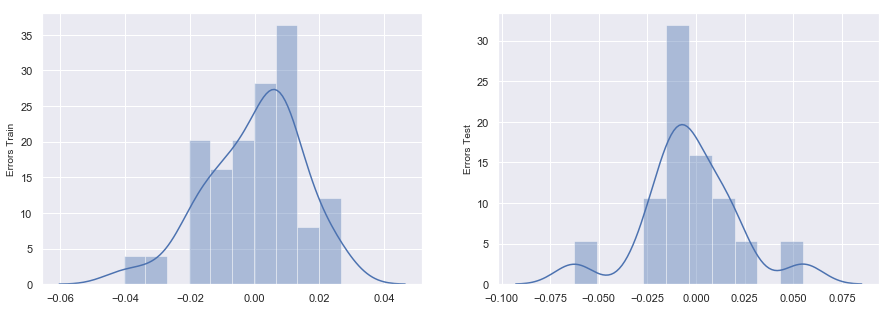

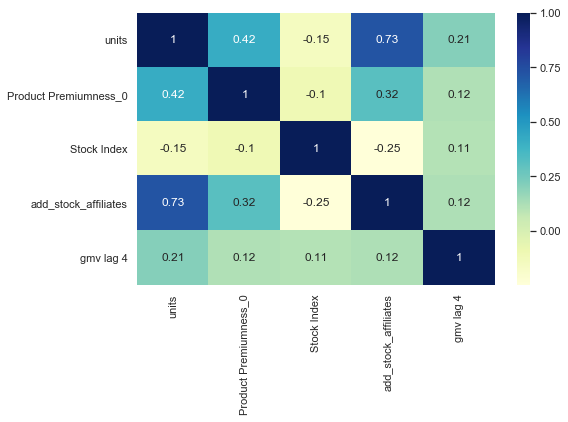

                    0
train r score 0.99383
test r score  0.96867
                 0
rmse_train 0.01456
rmse_test  0.02475


In [864]:
y_train_real_pred, y_test_real_pred, r2_dataframe, rmse_dataframe = predictions_and_residual_analysis_and_rscore(X_train_lag_iter0, 
                                                                                                 y_train_lag,
                                                                                                 X_test_lag,
                                                                                                 y_test_lag,
                                                                                                 model_iter23)
print(r2_dataframe)
print(rmse_dataframe)

__Conclusion:__ Both train and test models have a close R2 values, which shows the accuracy. Units are highly correlated with add_stock_affiliates

### R Squared scores for Koyck model is good but multiplicative model are better

### Elasticity of  `GMV` (Revenue)
As per economics, elasticity is the measure of how sensitive dependent variable (in our case, revenue) is to a particular independent variable.

<h3><center> $Elasticity_{gmv} = \frac{\frac{\delta{GMV}}{GMV}}{\frac{\delta{feature}}{feature}} $</centre> </h3>


while plotting elasticity, we will know,
1. Whether GMV is directly or indirectly propostional to a particular feature
2. How varying the dependency is?
3. Where exactly the dependency is? and such



Let us look at the elasticity of revenue with our predictors

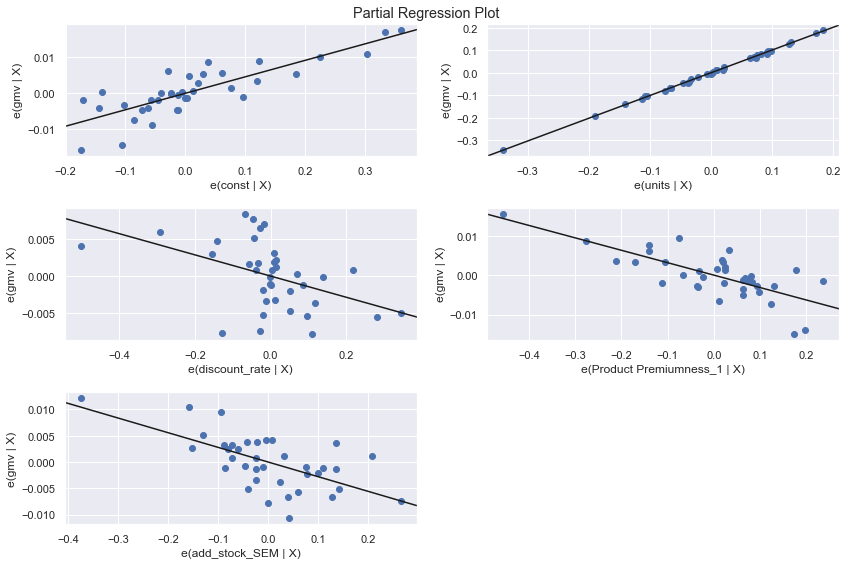

In [865]:
fig = plt.figure(figsize=(12,8))
fig = sm.graphics.plot_partregress_grid(model_iter24, fig=fig)

### Remarks:
It is evident that,
1. Units have a positive and continuous inpact on the gmv
2. Except Units, Other features mostly look irrelavant. 
3. ALso High variannce and decreasing elasticity with GMV

### Model 4: Distributd Lag Model

In [866]:
df_combined_game.shape

(53, 32)

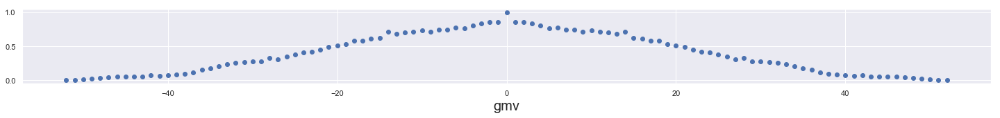

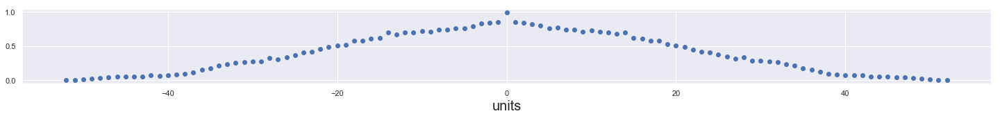

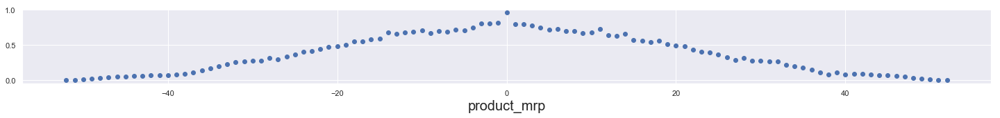

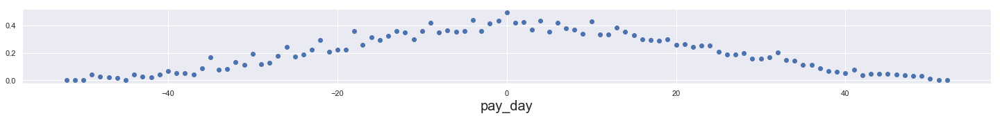

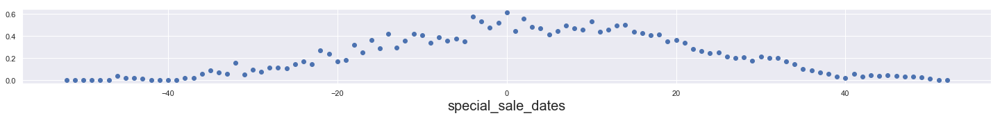

...

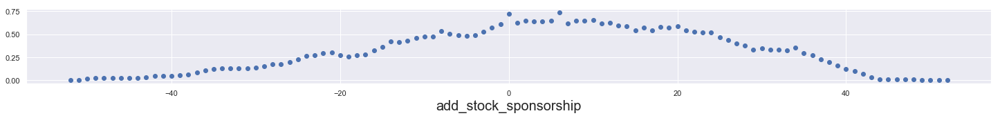

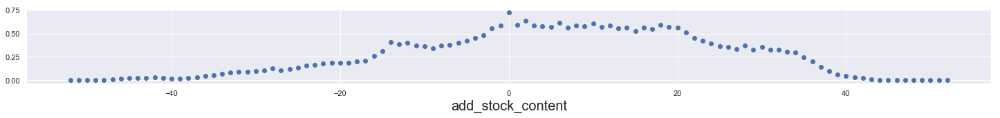

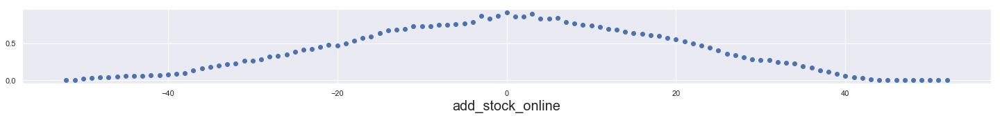

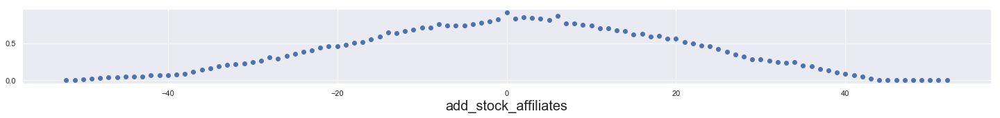

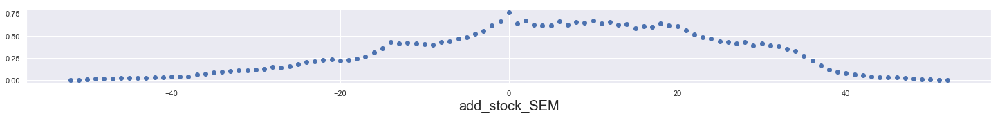

In [867]:
# Auto Correlation Analysis
from pandas.plotting import autocorrelation_plot
for i in list(df_combined_game.columns):
    plt.figure(figsize = (25,2))
    plt.xcorr(df_combined_game['gmv'],df_combined_game[i],usevlines=False, normed=True, maxlags=52)
    plt.xlabel(i, fontsize = 20)
    plt.show()

#### Remarks:
1. As we can see, we computed the auto-correlation and cross correlation of all features with GMV.
2. For choosing the lag, we will lay some ground rules.
3. Any `lag with correlation > 0.75` is strongly correlated and we take those number of lags
4. Any `features with lags with correlation < 0.75` are negligible features in terms of lags but as standard we take 3 lags for them.
5. We ignore other lags.
6. Choice of Lags:
    1. `gmv`: 4
    2. `units`: 3
    3. `product_mrp`: 4
    4. `pay_day`: 3
    5. `special_sale_dates`: 3
    6. `discount_rate`: 7
    7. `delivery_time_status_early delivery`: 10
    8. `delivery_time_status_late delivery`: 3
    9. `delivery_time_status_on time`: 7
    10. `s1_fact.order_payment_type_COD`: 6
    11. `s1_fact.order_payment_type_Prepaid`:3
    12. `Product Premiumness_0`: 6
    13. `Product Premiumness_1`: 6
    14. `Product Premiumness_2`: 3
    15. `Max Temp (°C)`: 3
    16. `Min Temp (°C)`: 3
    17. `Mean Temp (°C)`: 3
    18. `Heat Deg Days (°C)`: 3
    19. `Cool Deg Days (°C)`: 3
    20. `Total Rain (mm)`: 3
    21. `Total Snow (cm)`: 3
    22. `Total Precip (mm)`: 3
    23. `Snow on Grnd (cm)`: 3
    24. `NPS`: 3
    25. `Stock Index`: 3
    26. `add_stock_TV`: 3
    27. `add_stock_digital`: 3 
    28. `add_stock_sponsorship`: 3
    29. `add_stock_content`: 3
    30. `add_stock_online`: 3
    31. `add_stock_affiliates`: 3
    32. `add_stock_SEM`: 3


##### Note-1: All features with lag 3 are mostly because they have < 0.75 correlation with GMV
##### Note-2: Others have good correlation, hence retailed.
#### `Note-3` Since Most have lag 3.. For this work, let us keep it at 3

In [880]:
### Adding Lag GMV to the existing DataFrame

# Making Lag Disctionary
dict_lag_values = {}
list_lags = [4,3,4,3,3,7,10,3,7,6,3,6,6,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3]
#len(list_lags)
for i in range(len(list(df_combined_game.columns))):
    dict_lag_values[list(df_combined_game.columns)[i]] = 3

In [881]:
# Lag Generation for Distributed Lag Models
df_game_distlag = df_combined_game.copy()
for key,value in dict_lag_values.items():
    df_game_distlag = lag_addition(df_game_distlag,value, key)


In [882]:
# Cross Checking the Lags
df_game_distlag[['add_stock_SEM lag 1', 'add_stock_SEM lag 2', 'add_stock_SEM lag 3']].head()

,add_stock_SEM lag 1,add_stock_SEM lag 2,add_stock_SEM lag 3
datetime stamp,,,
2015-07-01,0.00000,0.00000,0.00000
2015-07-06,0.01306,0.00000,0.00000
2015-07-13,1.89440,0.01306,0.00000
2015-07-20,1.98475,1.89440,0.01306
2015-07-27,1.94157,1.98475,1.89440


In [883]:
df_game_distlag.shape

(53, 128)

### 16.3 Univariate and Bivariate Analysis of Lag Data
1. We already made a `correlation analysis for choosing lags`.
2. All lag variables are any way correlated to each other due to their construct

#### Note - 1 Any Plot we make wont actually look good with so many values. We are ignoring Box and Scatter Plots for these

#### 16.3.1 Box Plots: To check Outliers
Let us plot an example scatter plot to explain what i mean

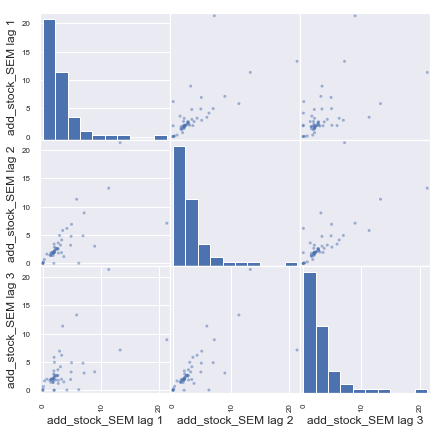

In [884]:
import matplotlib
from pandas.plotting import scatter_matrix
scatter_matrix(df_game_distlag[['add_stock_SEM lag 1', 'add_stock_SEM lag 2', 'add_stock_SEM lag 3']], 
                  figsize = (7,7))
plt.show()

#### Remarks: All scatter plots will tend to behave same. Linear but with skedacticity (high variance)

#### Remarks:
1. We already checked in the auto correlation graph that GMV has decreasing with lag GMV
2. We cannot expect any substantial model difference due to lags because the correlations are not so highlighting

### Modeling


#### Train-Test Split and Scaling

In [885]:
X_train_distlag,y_train_distlag,X_test_distlag,y_test_distlag = split_scale_feature(df_game_distlag)

In [886]:
X_train_distlag.shape

(37, 127)

#### Recursive Feature Elimination
1. With only 37 rows, I cannot efford to have more than 1/3rd the features to get good models
2. For this reason, we still keep `our rfe at 30`

In [887]:
X_train_distlag_iter0 = rfe_function(X_train_distlag,y_train_distlag,30)

#### Model Building using StatsModel 

In [888]:
# Results of stats model iteration - 1
X_train_column_list, model_iter1, summary, VIF = statsmodel_vif(X_train_distlag_iter0,y_train,[])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  0.999
Method:                 Least Squares   F-statistic:                     876.3
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           8.06e-09
Time:                        21:20:10   Log-Likelihood:                 164.99
No. Observations:                  37   AIC:                            -268.0
Df Residuals:                       6   BIC:                            -218.0
Df Model:                          30                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

,Features,VIF
1,units,1695.31000
13,add_stock_SEM,1494.33000
10,add_stock_digital,880.25000
2,product_mrp,469.63000
11,add_stock_content,218.79000
17,delivery_time_status_late delivery lag 3,160.80000
24,Heat Deg Days (°C) lag 1,151.63000
7,Heat Deg Days (°C),119.29000
29,add_stock_online lag 1,111.22000
12,add_stock_affiliates,102.45000


#### Remarks: 
1. rfe captured quite a number of lag variables. Let us see how model turns out
2. As step 1, we will drop all columns with high VIF and P Value first
3. Each column from different feature set at a time
4. We are dropping `add_stock_SEM` first from weather data as it has less influence on GMV and has significant p-value

In [889]:
# Results of stats model iteration - 2
X_train_column_list, model_iter2, summary, VIF = statsmodel_vif(X_train_distlag_iter0,y_train_distlag,
                                                                ['add_stock_SEM'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  0.999
Method:                 Least Squares   F-statistic:                     1004.
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           2.84e-10
Time:                        21:20:20   Log-Likelihood:                 164.02
No. Observations:                  37   AIC:                            -268.0
Df Residuals:                       7   BIC:                            -219.7
Df Model:                          29                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

,Features,VIF
1,units,1694.31000
2,product_mrp,413.93000
11,add_stock_content,210.12000
16,delivery_time_status_late delivery lag 3,137.96000
7,Heat Deg Days (°C),116.43000
28,add_stock_online lag 1,103.64000
10,add_stock_digital,101.69000
23,Heat Deg Days (°C) lag 1,91.79000
29,add_stock_online lag 3,81.10000
4,special_sale_dates,78.77000


#### Remarks: 
1. In this iteration, we will drop `product_mrp` which has P Value

In [890]:
# Results of stats model iteration - 3
X_train_column_list, model_iter3, summary, VIF = statsmodel_vif(X_train_distlag_iter0,y_train_distlag,
                                                                ['product_mrp'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.998
Method:                 Least Squares   F-statistic:                     536.1
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.90e-10
Time:                        21:20:27   Log-Likelihood:                 149.30
No. Observations:                  37   AIC:                            -240.6
Df Residuals:                       8   BIC:                            -193.9
Df Model:                          28                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

,Features,VIF
1,units,495.28000
10,add_stock_content,201.82000
15,delivery_time_status_late delivery lag 3,127.77000
6,Heat Deg Days (°C),80.83000
27,add_stock_online lag 1,78.04000
28,add_stock_online lag 3,76.88000
3,special_sale_dates,54.17000
20,Max Temp (°C) lag 1,45.27000
22,Heat Deg Days (°C) lag 1,42.87000
26,Stock Index lag 2,42.65000


#### Remarks:
Let's drop `add_stock_content` for having high VIF and significant p-value

In [892]:
# Results of stats model iteration - 4
X_train_column_list, model_iter4, summary, VIF = statsmodel_vif(X_train_distlag_iter0,y_train_distlag,
                                                                ['add_stock_content'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.997
Method:                 Least Squares   F-statistic:                     509.1
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.85e-11
Time:                        21:21:26   Log-Likelihood:                 145.50
No. Observations:                  37   AIC:                            -235.0
Df Residuals:                       9   BIC:                            -189.9
Df Model:                          27                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

,Features,VIF
1,units,122.47000
14,delivery_time_status_late delivery lag 3,48.57000
0,const,38.86000
27,add_stock_online lag 3,35.07000
9,add_stock_digital,30.55000
6,Heat Deg Days (°C),30.17000
21,Heat Deg Days (°C) lag 1,26.34000
19,Max Temp (°C) lag 1,22.65000
26,add_stock_online lag 1,20.13000
10,add_stock_affiliates,16.79000


#### Remarks:
Let's drop `delivery_time_status_late delivery lag 3` as it has high p-value

In [893]:
# Results of stats model iteration - 5
X_train_column_list, model_iter5, summary, VIF = statsmodel_vif(X_train_distlag_iter0,y_train_distlag,
                                                                ['delivery_time_status_late delivery lag 3'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.996
Method:                 Least Squares   F-statistic:                     310.0
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.79e-11
Time:                        21:22:37   Log-Likelihood:                 133.68
No. Observations:                  37   AIC:                            -213.4
Df Residuals:                      10   BIC:                            -169.9
Df Model:                          26                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,38.01000
1,units,22.53000
20,Heat Deg Days (°C) lag 1,19.96000
18,Max Temp (°C) lag 1,19.10000
26,add_stock_online lag 3,14.32000
6,Heat Deg Days (°C),13.93000
15,Product Premiumness_0 lag 1,11.33000
10,add_stock_affiliates,8.68000
23,Stock Index lag 1,8.08000
19,Max Temp (°C) lag 2,7.57000


#### Remarks:
Let's drop `special_sale_dates` as it has high VIF

In [894]:
# Results of stats model iteration - 5
X_train_column_list, model_iter5, summary, VIF = statsmodel_vif(X_train_distlag_iter0,y_train_distlag,
                                                                ['special_sale_dates'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.996
Method:                 Least Squares   F-statistic:                     352.2
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           9.53e-13
Time:                        21:23:19   Log-Likelihood:                 133.56
No. Observations:                  37   AIC:                            -215.1
Df Residuals:                      11   BIC:                            -173.2
Df Model:                          25                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,37.90000
17,Max Temp (°C) lag 1,18.89000
19,Heat Deg Days (°C) lag 1,16.96000
25,add_stock_online lag 3,12.68000
1,units,12.36000
5,Heat Deg Days (°C),10.57000
22,Stock Index lag 1,8.03000
18,Max Temp (°C) lag 2,7.29000
23,Stock Index lag 2,6.41000
9,add_stock_affiliates,6.24000


#### Remarks:
1. Let us drop `pay_day` which has high p-value


In [895]:
# Results of stats model iteration - 6
X_train_column_list, model_iter6, summary, VIF = statsmodel_vif(X_train_distlag_iter0,y_train_distlag,
                                                                ['pay_day'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.996
Method:                 Least Squares   F-statistic:                     394.1
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           5.06e-14
Time:                        21:23:57   Log-Likelihood:                 133.27
No. Observations:                  37   AIC:                            -216.5
Df Residuals:                      12   BIC:                            -176.3
Df Model:                          24                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,37.89000
16,Max Temp (°C) lag 1,18.76000
18,Heat Deg Days (°C) lag 1,15.24000
24,add_stock_online lag 3,12.40000
4,Heat Deg Days (°C),8.88000
1,units,8.71000
21,Stock Index lag 1,7.98000
17,Max Temp (°C) lag 2,7.29000
22,Stock Index lag 2,6.22000
2,delivery_time_status_on time,5.77000


#### Remarks:
1. Let's drop `delivery_time_status_on time` as it has high VIF and significant p-value


In [896]:
# Results of stats model iteration - 7
X_train_column_list, model_iter7, summary, VIF = statsmodel_vif(X_train_distlag_iter0,y_train_distlag,
                                                                ['delivery_time_status_on time'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.996
Method:                 Least Squares   F-statistic:                     426.2
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           3.10e-15
Time:                        21:24:44   Log-Likelihood:                 132.45
No. Observations:                  37   AIC:                            -216.9
Df Residuals:                      13   BIC:                            -178.2
Df Model:                          23                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,37.76000
15,Max Temp (°C) lag 1,18.73000
17,Heat Deg Days (°C) lag 1,15.15000
3,Heat Deg Days (°C),8.87000
23,add_stock_online lag 3,8.11000
1,units,7.41000
20,Stock Index lag 1,7.40000
16,Max Temp (°C) lag 2,7.22000
21,Stock Index lag 2,5.51000
12,Product Premiumness_0 lag 1,4.99000


#### Remarks:
1. Let us drop `add_stock_digital` due to high P Value

In [897]:
# Results of stats model iteration - 8
X_train_column_list, model_iter8, summary, VIF = statsmodel_vif(X_train_distlag_iter0,y_train_distlag,
                                                                ['add_stock_digital'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.998
Model:                            OLS   Adj. R-squared:                  0.996
Method:                 Least Squares   F-statistic:                     381.2
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           6.84e-16
Time:                        21:25:00   Log-Likelihood:                 128.20
No. Observations:                  37   AIC:                            -210.4
Df Residuals:                      14   BIC:                            -173.4
Df Model:                          22                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,37.59000
14,Max Temp (°C) lag 1,17.26000
16,Heat Deg Days (°C) lag 1,14.43000
3,Heat Deg Days (°C),8.36000
22,add_stock_online lag 3,8.09000
15,Max Temp (°C) lag 2,7.16000
19,Stock Index lag 1,6.76000
1,units,5.47000
20,Stock Index lag 2,5.45000
11,Product Premiumness_0 lag 1,4.48000


#### Remarks:
1. Let us drop `s1_fact.order_payment_type_COD` due to high P Value and VIF

In [898]:
# Results of stats model iteration - 9
X_train_column_list, model_iter9, summary, VIF = statsmodel_vif(X_train_distlag_iter0,y_train_distlag,
                                                                ['s1_fact.order_payment_type_COD'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.998
Model:                            OLS   Adj. R-squared:                  0.996
Method:                 Least Squares   F-statistic:                     427.9
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           3.21e-17
Time:                        21:25:40   Log-Likelihood:                 128.20
No. Observations:                  37   AIC:                            -212.4
Df Residuals:                      15   BIC:                            -177.0
Df Model:                          21                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,37.59000
13,Max Temp (°C) lag 1,16.04000
15,Heat Deg Days (°C) lag 1,14.09000
2,Heat Deg Days (°C),8.12000
14,Max Temp (°C) lag 2,6.56000
21,add_stock_online lag 3,6.08000
18,Stock Index lag 1,5.93000
19,Stock Index lag 2,4.98000
1,units,4.68000
10,Product Premiumness_0 lag 1,4.01000


#### Remarks:
Let us drop `Heat Deg Days (°C)` for having high p-value

In [899]:
# Results of stats model iteration - 10
X_train_column_list, model_iter10, summary, VIF = statsmodel_vif(X_train_distlag_iter0,y_train_distlag,
                                                                 ['Heat Deg Days (°C)'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.998
Model:                            OLS   Adj. R-squared:                  0.996
Method:                 Least Squares   F-statistic:                     451.8
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           2.29e-18
Time:                        21:26:14   Log-Likelihood:                 127.11
No. Observations:                  37   AIC:                            -212.2
Df Residuals:                      16   BIC:                            -178.4
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,36.76000
12,Max Temp (°C) lag 1,14.62000
14,Heat Deg Days (°C) lag 1,13.32000
20,add_stock_online lag 3,5.94000
17,Stock Index lag 1,5.47000
13,Max Temp (°C) lag 2,5.19000
1,units,4.67000
18,Stock Index lag 2,4.23000
9,Product Premiumness_0 lag 1,3.87000
4,add_stock_affiliates,3.78000


#### Remarks:
1. Let us drop `Total Snow (cm)` which has significant p-value and its contribution to GMV is less

In [900]:
# Results of stats model iteration - 11
X_train_column_list, model_iter11, summary, VIF = statsmodel_vif(X_train_distlag_iter0,y_train_distlag,
                                                                 ['Total Snow (cm)'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.998
Model:                            OLS   Adj. R-squared:                  0.996
Method:                 Least Squares   F-statistic:                     459.2
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           2.22e-19
Time:                        21:26:51   Log-Likelihood:                 125.34
No. Observations:                  37   AIC:                            -210.7
Df Residuals:                      17   BIC:                            -178.5
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,36.73000
11,Max Temp (°C) lag 1,14.62000
13,Heat Deg Days (°C) lag 1,13.32000
19,add_stock_online lag 3,5.82000
16,Stock Index lag 1,5.47000
12,Max Temp (°C) lag 2,5.08000
1,units,4.65000
17,Stock Index lag 2,4.11000
8,Product Premiumness_0 lag 1,3.86000
3,add_stock_affiliates,3.71000


#### Remarks:
Let us drop `add_stock_affiliates` as it has high p-value

In [901]:
# Results of stats model iteration - 12
X_train_column_list, model_iter12, summary, VIF = statsmodel_vif(X_train_distlag_iter0,y_train_distlag,
                                                                 ['add_stock_affiliates'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.998
Model:                            OLS   Adj. R-squared:                  0.996
Method:                 Least Squares   F-statistic:                     459.8
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           2.55e-20
Time:                        21:27:18   Log-Likelihood:                 123.32
No. Observations:                  37   AIC:                            -208.6
Df Residuals:                      18   BIC:                            -178.0
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,36.69000
10,Max Temp (°C) lag 1,14.28000
12,Heat Deg Days (°C) lag 1,13.08000
18,add_stock_online lag 3,5.76000
15,Stock Index lag 1,5.44000
11,Max Temp (°C) lag 2,4.99000
16,Stock Index lag 2,3.98000
7,Product Premiumness_0 lag 1,3.48000
17,add_stock_online lag 1,2.91000
1,units,2.55000


#### Remarks:
Let us drop `pay_day lag 3` as it has slightly above the significant p-value

In [902]:
# Results of stats model iteration - 13
X_train_column_list, model_iter13, summary, VIF = statsmodel_vif(X_train_distlag_iter0,y_train_distlag,
                                                                 ['pay_day lag 3'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.998
Model:                            OLS   Adj. R-squared:                  0.996
Method:                 Least Squares   F-statistic:                     512.8
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.12e-21
Time:                        21:27:56   Log-Likelihood:                 123.28
No. Observations:                  37   AIC:                            -210.6
Df Residuals:                      19   BIC:                            -181.6
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,36.51000
11,Heat Deg Days (°C) lag 1,12.31000
9,Max Temp (°C) lag 1,11.90000
17,add_stock_online lag 3,5.54000
14,Stock Index lag 1,4.84000
10,Max Temp (°C) lag 2,4.78000
15,Stock Index lag 2,3.90000
6,Product Premiumness_0 lag 1,3.35000
16,add_stock_online lag 1,2.89000
1,units,2.53000


#### Remarks:
2. Let us drop `s1_fact.order_payment_type_Prepaid lag 2` for high P Value

In [903]:
# Results of stats model iteration - 14
X_train_column_list, model_iter14, summary, VIF = statsmodel_vif(X_train_distlag_iter0,y_train_distlag,
                                                                 ['s1_fact.order_payment_type_Prepaid lag 2'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.998
Model:                            OLS   Adj. R-squared:                  0.996
Method:                 Least Squares   F-statistic:                     567.7
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           5.03e-23
Time:                        21:28:32   Log-Likelihood:                 123.09
No. Observations:                  37   AIC:                            -212.2
Df Residuals:                      20   BIC:                            -184.8
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                                  coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
const             

,Features,VIF
0,const,36.49000
10,Heat Deg Days (°C) lag 1,12.30000
8,Max Temp (°C) lag 1,11.89000
16,add_stock_online lag 3,5.50000
13,Stock Index lag 1,4.84000
9,Max Temp (°C) lag 2,4.59000
14,Stock Index lag 2,3.64000
5,Product Premiumness_0 lag 1,3.30000
15,add_stock_online lag 1,2.89000
1,units,2.43000


#### Remarks
Let's drop `special_sale_dates lag 2` as it has high p-value

In [904]:
# Results of stats model iteration - 15
X_train_column_list, model_iter15, summary, VIF = statsmodel_vif(X_train_distlag_iter0,y_train_distlag,
                                                                 ['special_sale_dates lag 2'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.998
Model:                            OLS   Adj. R-squared:                  0.996
Method:                 Least Squares   F-statistic:                     622.4
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           2.42e-24
Time:                        21:28:59   Log-Likelihood:                 122.70
No. Observations:                  37   AIC:                            -213.4
Df Residuals:                      21   BIC:                            -187.6
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                                  coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
const             

,Features,VIF
0,const,36.48000
9,Heat Deg Days (°C) lag 1,12.30000
7,Max Temp (°C) lag 1,11.74000
15,add_stock_online lag 3,4.87000
12,Stock Index lag 1,4.84000
8,Max Temp (°C) lag 2,4.04000
13,Stock Index lag 2,3.57000
4,Product Premiumness_0 lag 1,3.22000
14,add_stock_online lag 1,2.68000
1,units,2.41000


#### Remarks
Let's drop `Product Premiumness_2 lag 1` for having high p-value

In [905]:
# Results of stats model iteration - 16
X_train_column_list, model_iter16, summary, VIF = statsmodel_vif(X_train_distlag_iter0,y_train_distlag,
                                                                 ['Product Premiumness_2 lag 1'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.997
Model:                            OLS   Adj. R-squared:                  0.996
Method:                 Least Squares   F-statistic:                     618.0
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           3.41e-25
Time:                        21:29:30   Log-Likelihood:                 120.43
No. Observations:                  37   AIC:                            -210.9
Df Residuals:                      22   BIC:                            -186.7
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                                  coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
const             

,Features,VIF
0,const,36.47000
8,Heat Deg Days (°C) lag 1,12.07000
6,Max Temp (°C) lag 1,11.32000
14,add_stock_online lag 3,4.68000
11,Stock Index lag 1,4.47000
7,Max Temp (°C) lag 2,3.89000
12,Stock Index lag 2,3.56000
4,Product Premiumness_0 lag 1,2.81000
13,add_stock_online lag 1,2.62000
1,units,2.35000


#### Remarks
Let's drop `Max Temp (°C) lag 2` as it has high p-value

In [906]:
# Results of stats model iteration - 17
X_train_column_list, model_iter17, summary, VIF = statsmodel_vif(X_train_distlag_iter0,y_train_distlag,
                                                                 ['Max Temp (°C) lag 2'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.997
Model:                            OLS   Adj. R-squared:                  0.996
Method:                 Least Squares   F-statistic:                     690.6
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.37e-26
Time:                        21:30:00   Log-Likelihood:                 120.29
No. Observations:                  37   AIC:                            -212.6
Df Residuals:                      23   BIC:                            -190.0
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                                  coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
const             

,Features,VIF
0,const,35.42000
6,Max Temp (°C) lag 1,11.20000
7,Heat Deg Days (°C) lag 1,11.10000
13,add_stock_online lag 3,4.49000
10,Stock Index lag 1,4.47000
4,Product Premiumness_0 lag 1,2.71000
11,Stock Index lag 2,2.61000
12,add_stock_online lag 1,2.59000
1,units,2.21000
3,product_mrp lag 3,1.90000


#### Remarks
Let's drop `Stock Index lag 1` as it has high p-value and its contribution to GMV is minimal

In [907]:
# Results of stats model iteration - 18
X_train_column_list, model_iter18, summary, VIF = statsmodel_vif(X_train_distlag_iter0,y_train_distlag,
                                                                 ['Stock Index lag 1'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.997
Model:                            OLS   Adj. R-squared:                  0.996
Method:                 Least Squares   F-statistic:                     765.7
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           5.98e-28
Time:                        21:30:30   Log-Likelihood:                 119.94
No. Observations:                  37   AIC:                            -213.9
Df Residuals:                      24   BIC:                            -192.9
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                                  coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
const             

,Features,VIF
0,const,31.33000
7,Heat Deg Days (°C) lag 1,8.40000
6,Max Temp (°C) lag 1,6.19000
12,add_stock_online lag 3,4.48000
4,Product Premiumness_0 lag 1,2.59000
11,add_stock_online lag 1,2.58000
10,Stock Index lag 2,2.19000
1,units,2.16000
3,product_mrp lag 3,1.89000
9,Snow on Grnd (cm) lag 1,1.74000


#### Remarks
Let's drop `add_stock_online lag 3` as it has high p-value

In [908]:
# Results of stats model iteration - 19
X_train_column_list, model_iter19, summary, VIF = statsmodel_vif(X_train_distlag_iter0,y_train_distlag,
                                                                 ['add_stock_online lag 3'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.997
Model:                            OLS   Adj. R-squared:                  0.996
Method:                 Least Squares   F-statistic:                     855.5
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           2.42e-29
Time:                        21:31:04   Log-Likelihood:                 119.62
No. Observations:                  37   AIC:                            -215.2
Df Residuals:                      25   BIC:                            -195.9
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                                  coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
const             

,Features,VIF
0,const,31.32000
7,Heat Deg Days (°C) lag 1,7.43000
6,Max Temp (°C) lag 1,5.59000
4,Product Premiumness_0 lag 1,2.21000
11,add_stock_online lag 1,2.20000
10,Stock Index lag 2,2.07000
9,Snow on Grnd (cm) lag 1,1.73000
1,units,1.70000
8,Total Snow (cm) lag 3,1.53000
3,product_mrp lag 3,1.40000


#### Remarks
Let's drop `add_stock_online lag 1` as it has high p-value

In [909]:
# Results of stats model iteration - 20
X_train_column_list, model_iter20, summary, VIF = statsmodel_vif(X_train_distlag_iter0,y_train_distlag,
                                                                 ['add_stock_online lag 1'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.997
Model:                            OLS   Adj. R-squared:                  0.996
Method:                 Least Squares   F-statistic:                     899.5
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           2.23e-30
Time:                        21:32:23   Log-Likelihood:                 118.07
No. Observations:                  37   AIC:                            -214.1
Df Residuals:                      26   BIC:                            -196.4
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                                  coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
const             

,Features,VIF
0,const,31.08000
7,Heat Deg Days (°C) lag 1,6.95000
6,Max Temp (°C) lag 1,4.88000
4,Product Premiumness_0 lag 1,1.80000
9,Snow on Grnd (cm) lag 1,1.68000
10,Stock Index lag 2,1.68000
1,units,1.62000
8,Total Snow (cm) lag 3,1.51000
3,product_mrp lag 3,1.39000
2,Snow on Grnd (cm),1.36000


#### Remarks
1. `<0.05` signifies 95% confidance of feature importance and we achieved that
2. In our case, we have very less data as small as 37 points to model the data
3. We considered VIF < 10 as a stop point. Due to less data, otherwise model is too sensitive and P Values change drastically
5. So let us stop modeling here

__Important:__ __We successfully maintained the R Square and Adjusted R Square Scores__

#### 13.3 Residual Analysis of Train Test Data

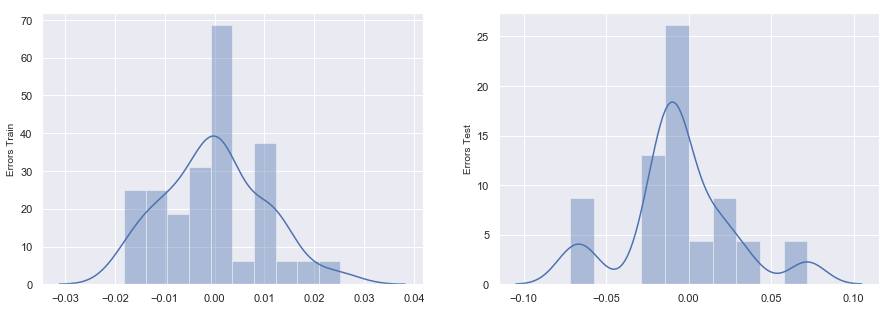

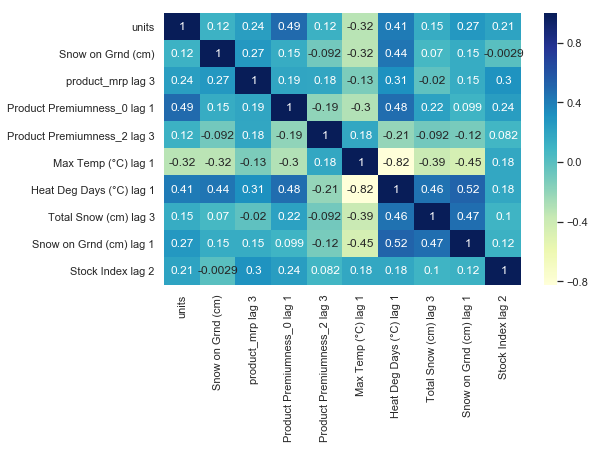

                    0
train r score 0.99712
test r score  0.94373
                 0
rmse_train 0.00995
rmse_test  0.03317


In [910]:
y_train_real_pred, y_test_real_pred, r2_dataframe, rmse_dataframe = predictions_and_residual_analysis_and_rscore(X_train_distlag_iter0, 
                                                                                                 y_train_distlag,
                                                                                                 X_test_distlag,
                                                                                                 y_test_distlag,
                                                                                                 model_iter20)
print(r2_dataframe)
print(rmse_dataframe)

#### This model is good in test r squares but features do not look explainable. Top of that, constant has a high P value suggesting the model changes in every iteration

### Elasticity of  `GMV` (Revenue)
As per economics, elasticity is the measure of how sensitive dependent variable (in our case, revenue) is to a particular independent variable.

<h3><center> $Elasticity_{gmv} = \frac{\frac{\delta{GMV}}{GMV}}{\frac{\delta{feature}}{feature}} $</centre> </h3>


while plotting elasticity, we will know,
1. Whether GMV is directly or indirectly propostional to a particular feature
2. How varying the dependency is?
3. Where exactly the dependency is? and such



Let us look at the elasticity of revenue with our predictors

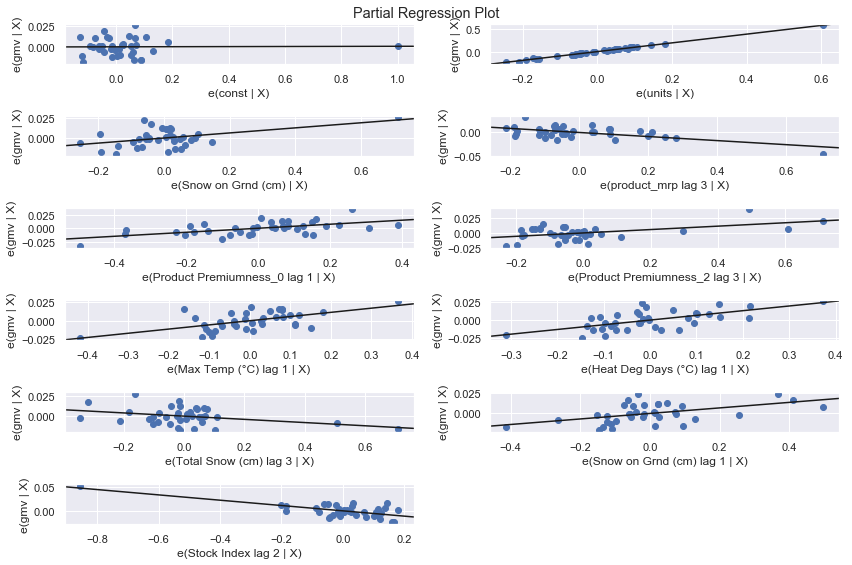

In [912]:
fig = plt.figure(figsize=(12,8))
fig = sm.graphics.plot_partregress_grid(model_iter20, fig=fig)

### Remarks:
It is evident that,
1. Units have a positive and continuous inpact on the gmv
2. Premiumness with lag is also explaining the model well
3. Weather also helped the gmv

### Model 5: Multiplicative Distributed Lag Model

In [914]:
df_game_distlag.shape

(53, 128)

### Univariate and Bivariate Analysis of Lag Data
1. The analysis for all other features was essentially done while performing `linear regression`
2. We will perform the similar analysis for only lags with GMV in this problem
3. This analysis is typically performed for continuous features only. So we choose only a few features to do it
4. Selected features include `gmv`, `discount_rate`, `All add stocks`

#### Any Plot we make wont actually look good with so many values. We are ignoring Box and Scatter Plots for these



### Modeling


In [915]:
df_game_mult_distlag = log_transformation(df_game_distlag)

#### Train-Test Split and Scaling

In [916]:
X_train_mult_distlag,y_train_mult_distlag,X_test_mult_distlag,y_test_mult_distlag = split_scale_feature(df_game_mult_distlag)

In [917]:
X_train_mult_distlag.shape

(37, 127)

#### Recursive Feature Elimination
1. With only 37 rows, I cannot efford to have more than 1/3rd the features to get good models
2. For this reason, we still keep `our rfe at 30`

In [918]:
X_train_mult_distlag_iter0 = rfe_function(X_train_mult_distlag,y_train_mult_distlag,30)

####  Model Building using StatsModel 

In [919]:
# Results of stats model iteration - 1
X_train_column_list, model_iter1, summary, VIF = statsmodel_vif(X_train_mult_distlag_iter0,y_train,[])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.918
Model:                            OLS   Adj. R-squared:                  0.509
Method:                 Least Squares   F-statistic:                     2.246
Date:                Mon, 23 Dec 2019   Prob (F-statistic):              0.158
Time:                        21:40:19   Log-Likelihood:                 56.177
No. Observations:                  37   AIC:                            -50.35
Df Residuals:                       6   BIC:                           -0.4153
Df Model:                          30                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,35498.76000
1,units,8931.23000
2,product_mrp,5489.09000
14,add_stock_TV,1870.48000
5,delivery_time_status_late delivery,1725.35000
28,add_stock_sponsorship lag 3,1565.56000
30,add_stock_SEM lag 2,1161.40000
27,add_stock_digital lag 1,746.74000
4,delivery_time_status_early delivery,738.75000
13,NPS,736.48000


#### Remarks: 
1. rfe captured quite a number of lag variables. Let us see how model turns out
2. As step 1, we will drop all columns with high VIF and P Value first
3. Each column from different feature set at a time
4. We are dropping `product_mrp` first as it has high p-value

In [920]:
# Results of stats model iteration - 2
X_train_column_list, model_iter2, summary, VIF = statsmodel_vif(X_train_mult_distlag_iter0,y_train_mult_distlag,
                                                                ['product_mrp'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 1.726e+04
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.35e-14
Time:                        21:40:23   Log-Likelihood:                 204.26
No. Observations:                  37   AIC:                            -348.5
Df Residuals:                       7   BIC:                            -300.2
Df Model:                          29                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,17313.51000
1,units,8768.13000
13,add_stock_TV,1051.05000
27,add_stock_sponsorship lag 3,974.20000
4,delivery_time_status_late delivery,852.63000
29,add_stock_SEM lag 2,597.40000
14,add_stock_content,454.10000
26,add_stock_digital lag 1,388.33000
28,add_stock_content lag 3,385.74000
12,NPS,340.47000


#### Remarks: 
1. In the iteration, we will drop `NPS` which has both high VIF Value

In [921]:
# Results of stats model iteration - 3
X_train_column_list, model_iter3, summary, VIF = statsmodel_vif(X_train_mult_distlag_iter0,y_train_mult_distlag,
                                                                ['NPS'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                     3654.
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           8.88e-14
Time:                        21:40:28   Log-Likelihood:                 172.42
No. Observations:                  37   AIC:                            -286.8
Df Residuals:                       8   BIC:                            -240.1
Df Model:                          28                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,3438.26000
1,units,557.72000
14,gmv lag 1,138.79000
12,add_stock_TV,107.96000
26,add_stock_sponsorship lag 3,103.84000
15,units lag 3,92.55000
13,add_stock_content,88.86000
4,delivery_time_status_late delivery,87.14000
27,add_stock_content lag 3,68.94000
17,delivery_time_status_late delivery lag 1,67.90000


#### Remarks:
Let's drop `gmv lag 1` as it has high VIF-value

In [923]:
# Results of stats model iteration - 4
X_train_column_list, model_iter4, summary, VIF = statsmodel_vif(X_train_mult_distlag_iter0,y_train_mult_distlag,
                                                                ['gmv lag 1'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                     3833.
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           2.12e-15
Time:                        21:41:16   Log-Likelihood:                 170.45
No. Observations:                  37   AIC:                            -284.9
Df Residuals:                       9   BIC:                            -239.8
Df Model:                          27                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,3432.27000
1,units,557.70000
12,add_stock_TV,106.79000
25,add_stock_sponsorship lag 3,100.13000
13,add_stock_content,85.38000
4,delivery_time_status_late delivery,82.86000
26,add_stock_content lag 3,65.52000
3,delivery_time_status_early delivery,55.67000
5,delivery_time_status_on time,43.72000
20,Heat Deg Days (°C) lag 2,41.44000


#### Remarks:
Let us drop `add_stock_TV` as it has high p-value

In [924]:
# Results of stats model iteration - 5
X_train_column_list, model_iter5, summary, VIF = statsmodel_vif(X_train_mult_distlag_iter0,y_train_mult_distlag,
                                                                ['add_stock_TV'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                     3751.
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           7.00e-17
Time:                        21:41:41   Log-Likelihood:                 167.41
No. Observations:                  37   AIC:                            -280.8
Df Residuals:                      10   BIC:                            -237.3
Df Model:                          26                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,2251.90000
1,units,239.77000
12,add_stock_content,80.89000
4,delivery_time_status_late delivery,46.16000
24,add_stock_sponsorship lag 3,39.71000
3,delivery_time_status_early delivery,38.05000
5,delivery_time_status_on time,33.29000
25,add_stock_content lag 3,30.83000
15,delivery_time_status_late delivery lag 1,29.02000
26,add_stock_SEM lag 2,21.84000


#### Remarks:
1. We are starting off with the second iteration of values.
2. Let us drop `add_stock_content` which has high p-value

In [925]:
# Results of stats model iteration - 5
X_train_column_list, model_iter5, summary, VIF = statsmodel_vif(X_train_mult_distlag_iter0,y_train_mult_distlag,
                                                                ['add_stock_content'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                     4181.
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.19e-18
Time:                        21:42:10   Log-Likelihood:                 166.93
No. Observations:                  37   AIC:                            -281.9
Df Residuals:                      11   BIC:                            -240.0
Df Model:                          25                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,1826.77000
4,delivery_time_status_late delivery,33.72000
3,delivery_time_status_early delivery,30.00000
5,delivery_time_status_on time,29.93000
23,add_stock_sponsorship lag 3,28.75000
24,add_stock_content lag 3,27.85000
1,units,23.78000
18,Heat Deg Days (°C) lag 2,20.06000
12,units lag 3,19.71000
13,discount_rate lag 1,18.45000


#### Remarks:
1. Let us drop some add_stocks, to check their influence on other variables
2. Let's drop `add_stock_SEM lag 2` as it has high VIF and significant p-value


In [926]:
# Results of stats model iteration - 6
X_train_column_list, model_iter6, summary, VIF = statsmodel_vif(X_train_mult_distlag_iter0,y_train_mult_distlag,
                                                                ['add_stock_SEM lag 2'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                     4747.
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.69e-20
Time:                        21:42:43   Log-Likelihood:                 166.91
No. Observations:                  37   AIC:                            -283.8
Df Residuals:                      12   BIC:                            -243.5
Df Model:                          24                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,1380.71000
4,delivery_time_status_late delivery,31.82000
3,delivery_time_status_early delivery,29.45000
23,add_stock_sponsorship lag 3,28.72000
24,add_stock_content lag 3,27.85000
5,delivery_time_status_on time,24.37000
18,Heat Deg Days (°C) lag 2,19.94000
12,units lag 3,19.21000
1,units,18.79000
14,delivery_time_status_late delivery lag 1,15.60000


#### Remarks:
1. Let's drop `add_stock_digital lag 1` as it has high P Value


In [928]:
# Results of stats model iteration - 7
X_train_column_list, model_iter7, summary, VIF = statsmodel_vif(X_train_mult_distlag_iter0,y_train_mult_distlag,
                                                                ['add_stock_digital lag 1'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                     5334.
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           2.32e-22
Time:                        21:43:37   Log-Likelihood:                 166.80
No. Observations:                  37   AIC:                            -285.6
Df Residuals:                      13   BIC:                            -246.9
Df Model:                          23                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,1256.94000
3,delivery_time_status_early delivery,28.04000
4,delivery_time_status_late delivery,25.99000
23,add_stock_content lag 3,21.12000
22,add_stock_sponsorship lag 3,20.55000
5,delivery_time_status_on time,19.66000
1,units,16.63000
14,delivery_time_status_late delivery lag 1,15.59000
18,Heat Deg Days (°C) lag 2,11.99000
13,discount_rate lag 1,9.69000


#### Remarks:
1. Let us drop `add_stock_sponsorship lag 3` due to high P Value

In [929]:
# Results of stats model iteration - 8
X_train_column_list, model_iter8, summary, VIF = statsmodel_vif(X_train_mult_distlag_iter0,y_train_mult_distlag,
                                                                ['add_stock_sponsorship lag 3'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                     5945.
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           3.13e-24
Time:                        21:44:15   Log-Likelihood:                 166.61
No. Observations:                  37   AIC:                            -287.2
Df Residuals:                      14   BIC:                            -250.2
Df Model:                          22                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,1092.64000
3,delivery_time_status_early delivery,19.74000
5,delivery_time_status_on time,19.18000
4,delivery_time_status_late delivery,18.28000
1,units,16.45000
14,delivery_time_status_late delivery lag 1,15.54000
18,Heat Deg Days (°C) lag 2,11.99000
13,discount_rate lag 1,9.68000
6,s1_fact.order_payment_type_Prepaid,8.27000
17,Max Temp (°C) lag 3,7.24000


#### Remarks:
1. Let us drop `Product Premiumness_2 lag 3` due to high P Value. Also check how weather vriable's effect on others

In [930]:
# Results of stats model iteration - 9
X_train_column_list, model_iter9, summary, VIF = statsmodel_vif(X_train_mult_distlag_iter0,y_train_mult_distlag,
                                                                ['Product Premiumness_2 lag 3'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                     6673.
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           3.72e-26
Time:                        21:45:11   Log-Likelihood:                 166.61
No. Observations:                  37   AIC:                            -289.2
Df Residuals:                      15   BIC:                            -253.8
Df Model:                          21                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,1057.55000
3,delivery_time_status_early delivery,19.73000
5,delivery_time_status_on time,18.96000
4,delivery_time_status_late delivery,18.28000
1,units,16.37000
14,delivery_time_status_late delivery lag 1,15.27000
17,Heat Deg Days (°C) lag 2,11.51000
13,discount_rate lag 1,9.67000
6,s1_fact.order_payment_type_Prepaid,8.20000
16,Max Temp (°C) lag 3,7.23000


#### Remarks:
Let us drop `units lag 3` for its high p-value among add_stocks

In [931]:
# Results of stats model iteration - 10
X_train_column_list, model_iter10, summary, VIF = statsmodel_vif(X_train_mult_distlag_iter0,y_train_mult_distlag,
                                                                 ['units lag 3'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                     7470.
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           4.20e-28
Time:                        21:45:50   Log-Likelihood:                 166.60
No. Observations:                  37   AIC:                            -291.2
Df Residuals:                      16   BIC:                            -257.4
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,1057.28000
3,delivery_time_status_early delivery,19.54000
5,delivery_time_status_on time,18.95000
4,delivery_time_status_late delivery,18.25000
1,units,15.63000
13,delivery_time_status_late delivery lag 1,15.13000
16,Heat Deg Days (°C) lag 2,10.53000
12,discount_rate lag 1,9.57000
6,s1_fact.order_payment_type_Prepaid,7.69000
7,Product Premiumness_1,6.15000


#### Remarks:
1. Let us drop discount_rate

In [933]:
# Results of stats model iteration - 11
X_train_column_list, model_iter11, summary, VIF = statsmodel_vif(X_train_mult_distlag_iter0,y_train_mult_distlag,
                                                                 ['discount_rate'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                     7336.
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.35e-29
Time:                        21:46:46   Log-Likelihood:                 164.20
No. Observations:                  37   AIC:                            -288.4
Df Residuals:                      17   BIC:                            -256.2
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,991.49000
2,delivery_time_status_early delivery,18.94000
3,delivery_time_status_late delivery,17.68000
1,units,15.36000
4,delivery_time_status_on time,14.81000
12,delivery_time_status_late delivery lag 1,9.50000
11,discount_rate lag 1,9.25000
15,Heat Deg Days (°C) lag 2,8.62000
5,s1_fact.order_payment_type_Prepaid,7.35000
14,Max Temp (°C) lag 3,5.48000


#### Remarks:
1. As we have seen product_mrp has a significant influence on other variables.
2. Let's drop `Cool Deg Days (°C)` as it has high p-value

In [934]:
# Results of stats model iteration - 12
X_train_column_list, model_iter12, summary, VIF = statsmodel_vif(X_train_mult_distlag_iter0,y_train_mult_distlag,
                                                                 ['Cool Deg Days (°C)'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                     8169.
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.50e-31
Time:                        21:47:22   Log-Likelihood:                 164.13
No. Observations:                  37   AIC:                            -290.3
Df Residuals:                      18   BIC:                            -259.7
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,952.79000
2,delivery_time_status_early delivery,18.78000
3,delivery_time_status_late delivery,17.67000
1,units,14.62000
4,delivery_time_status_on time,14.01000
11,delivery_time_status_late delivery lag 1,9.09000
10,discount_rate lag 1,8.74000
5,s1_fact.order_payment_type_Prepaid,7.21000
14,Heat Deg Days (°C) lag 2,7.00000
13,Max Temp (°C) lag 3,5.36000


#### Remarks:
1. Let us look at weather features again
2. `Cool Deg Days (°C) lag 2` has high P Value
3. Let us drop `Cool Deg Days (°C) lag 2`

In [935]:
# Results of stats model iteration - 13
X_train_column_list, model_iter13, summary, VIF = statsmodel_vif(X_train_mult_distlag_iter0,y_train_mult_distlag,
                                                                 ['Cool Deg Days (°C) lag 2'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                     8453.
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           3.17e-33
Time:                        21:48:04   Log-Likelihood:                 162.70
No. Observations:                  37   AIC:                            -289.4
Df Residuals:                      19   BIC:                            -260.4
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,812.87000
2,delivery_time_status_early delivery,18.22000
3,delivery_time_status_late delivery,17.17000
1,units,14.58000
4,delivery_time_status_on time,14.00000
11,delivery_time_status_late delivery lag 1,9.09000
10,discount_rate lag 1,8.74000
5,s1_fact.order_payment_type_Prepaid,7.21000
13,Max Temp (°C) lag 3,5.15000
6,Product Premiumness_1,4.67000


#### Remarks:
2. Let us drop `Product Premiumness_2 lag 1` for high P Value

In [936]:
# Results of stats model iteration - 14
X_train_column_list, model_iter14, summary, VIF = statsmodel_vif(X_train_mult_distlag_iter0,y_train_mult_distlag,
                                                                 ['Product Premiumness_2 lag 1'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                     8833.
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           6.25e-35
Time:                        21:48:36   Log-Likelihood:                 161.45
No. Observations:                  37   AIC:                            -288.9
Df Residuals:                      20   BIC:                            -261.5
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,729.66000
2,delivery_time_status_early delivery,18.22000
3,delivery_time_status_late delivery,17.14000
1,units,13.12000
4,delivery_time_status_on time,11.27000
11,delivery_time_status_late delivery lag 1,7.77000
10,discount_rate lag 1,7.09000
5,s1_fact.order_payment_type_Prepaid,7.02000
12,Max Temp (°C) lag 3,4.93000
6,Product Premiumness_1,4.55000


#### Remarks
Let's drop `delivery_time_status_on time` as it has high p-value

In [937]:
# Results of stats model iteration - 15
X_train_column_list, model_iter15, summary, VIF = statsmodel_vif(X_train_mult_distlag_iter0,y_train_mult_distlag,
                                                                 ['delivery_time_status_on time'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                     9529.
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           9.05e-37
Time:                        21:49:10   Log-Likelihood:                 160.75
No. Observations:                  37   AIC:                            -289.5
Df Residuals:                      21   BIC:                            -263.7
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,574.88000
2,delivery_time_status_early delivery,18.13000
3,delivery_time_status_late delivery,17.14000
1,units,9.87000
4,s1_fact.order_payment_type_Prepaid,6.59000
11,Max Temp (°C) lag 3,4.87000
5,Product Premiumness_1,4.55000
12,Heat Deg Days (°C) lag 2,4.15000
14,Snow on Grnd (cm) lag 3,3.46000
10,delivery_time_status_late delivery lag 1,3.29000


#### Remarks
1. As units relted variables are highly correlated with GMV, let's pick anoth variable with high p-value
2. Let's drop `Total Snow (cm)` as it has hgih p-value

In [939]:
# Results of stats model iteration - 16
X_train_column_list, model_iter16, summary, VIF = statsmodel_vif(X_train_mult_distlag_iter0,y_train_mult_distlag,
                                                                 ['Total Snow (cm)'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 1.012e+04
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.56e-38
Time:                        21:50:29   Log-Likelihood:                 159.74
No. Observations:                  37   AIC:                            -289.5
Df Residuals:                      22   BIC:                            -265.3
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,464.05000
2,delivery_time_status_early delivery,16.11000
3,delivery_time_status_late delivery,15.58000
1,units,8.45000
4,s1_fact.order_payment_type_Prepaid,5.27000
5,Product Premiumness_1,4.54000
10,Max Temp (°C) lag 3,4.44000
11,Heat Deg Days (°C) lag 2,3.92000
13,Snow on Grnd (cm) lag 3,3.44000
6,Mean Temp (°C),3.23000


#### Remarks
Let us drop `discount_rate lag 1` due to high P Value

In [940]:
# Results of stats model iteration - 17
X_train_column_list, model_iter17, summary, VIF = statsmodel_vif(X_train_mult_distlag_iter0,y_train_mult_distlag,
                                                                 ['discount_rate lag 1'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 1.095e+04
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           2.25e-40
Time:                        21:50:58   Log-Likelihood:                 158.99
No. Observations:                  37   AIC:                            -290.0
Df Residuals:                      23   BIC:                            -267.4
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,439.56000
2,delivery_time_status_early delivery,15.42000
3,delivery_time_status_late delivery,13.97000
1,units,8.35000
9,Max Temp (°C) lag 3,4.15000
4,s1_fact.order_payment_type_Prepaid,4.13000
5,Product Premiumness_1,3.94000
10,Heat Deg Days (°C) lag 2,3.82000
12,Snow on Grnd (cm) lag 3,3.22000
6,Mean Temp (°C),3.18000


#### Remarks
Let us drop `Total Precip (mm)` with high P Value

In [941]:
# Results of stats model iteration - 18
X_train_column_list, model_iter18, summary, VIF = statsmodel_vif(X_train_mult_distlag_iter0,y_train_mult_distlag,
                                                                 ['Total Precip (mm)'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 1.142e+04
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           5.16e-42
Time:                        21:51:33   Log-Likelihood:                 157.50
No. Observations:                  37   AIC:                            -289.0
Df Residuals:                      24   BIC:                            -268.1
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

,Features,VIF
0,const,437.70000
2,delivery_time_status_early delivery,15.18000
3,delivery_time_status_late delivery,13.65000
1,units,8.20000
4,s1_fact.order_payment_type_Prepaid,4.03000
8,Max Temp (°C) lag 3,3.96000
5,Product Premiumness_1,3.92000
9,Heat Deg Days (°C) lag 2,3.45000
6,Mean Temp (°C),3.17000
7,delivery_time_status_late delivery lag 1,2.90000


#### Remarks: Let us drop `delivery_time_status_late delivery lag 1` due to high P Value

In [942]:
# Results of stats model iteration - 19
X_train_column_list, model_iter19, summary, VIF = statsmodel_vif(X_train_mult_distlag_iter0,y_train_mult_distlag,
                                                                 ['delivery_time_status_late delivery lag 1'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 1.222e+04
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           9.21e-44
Time:                        21:52:03   Log-Likelihood:                 156.40
No. Observations:                  37   AIC:                            -288.8
Df Residuals:                      25   BIC:                            -269.5
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
0,const,271.32000
3,delivery_time_status_late delivery,11.53000
2,delivery_time_status_early delivery,9.33000
1,units,6.37000
5,Product Premiumness_1,3.88000
7,Max Temp (°C) lag 3,3.73000
4,s1_fact.order_payment_type_Prepaid,3.50000
8,Heat Deg Days (°C) lag 2,3.40000
6,Mean Temp (°C),3.17000
10,Snow on Grnd (cm) lag 3,2.62000


In [943]:
# Results of stats model iteration - 20
X_train_column_list, model_iter20, summary, VIF = statsmodel_vif(X_train_mult_distlag_iter0,y_train_mult_distlag,
                                                                 ['Max Temp (°C) lag 3'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 1.351e+04
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.18e-45
Time:                        21:52:37   Log-Likelihood:                 155.76
No. Observations:                  37   AIC:                            -289.5
Df Residuals:                      26   BIC:                            -271.8
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Features,VIF
0,const,251.43000
3,delivery_time_status_late delivery,9.47000
2,delivery_time_status_early delivery,8.07000
7,Heat Deg Days (°C) lag 2,3.33000
4,s1_fact.order_payment_type_Prepaid,3.17000
1,units,3.09000
6,Mean Temp (°C),2.87000
5,Product Premiumness_1,2.63000
10,add_stock_content lag 3,1.73000
9,Snow on Grnd (cm) lag 3,1.61000


#### Remarks: 
Let us drop `delivery_time_status_early delivery` due to high P value

In [944]:
# Results of stats model iteration - 21
X_train_column_list, model_iter21, summary, VIF = statsmodel_vif(X_train_mult_distlag_iter0,y_train_mult_distlag,
                                                                 ['delivery_time_status_early delivery'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 1.498e+04
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.56e-47
Time:                        21:53:10   Log-Likelihood:                 155.02
No. Observations:                  37   AIC:                            -290.0
Df Residuals:                      27   BIC:                            -273.9
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

,Features,VIF
0,const,123.15000
3,s1_fact.order_payment_type_Prepaid,3.03000
6,Heat Deg Days (°C) lag 2,3.01000
1,units,2.81000
5,Mean Temp (°C),2.79000
4,Product Premiumness_1,2.63000
2,delivery_time_status_late delivery,1.81000
9,add_stock_content lag 3,1.73000
8,Snow on Grnd (cm) lag 3,1.57000
7,Total Snow (cm) lag 1,1.51000


In [945]:
# Let us drop add stock content lag 3
# Results of stats model iteration - 21
X_train_column_list, model_iter21, summary, VIF = statsmodel_vif(X_train_mult_distlag_iter0,y_train_mult_distlag,
                                                                 ['add_stock_content lag 3'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 1.682e+04
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           1.94e-49
Time:                        21:54:32   Log-Likelihood:                 154.31
No. Observations:                  37   AIC:                            -290.6
Df Residuals:                      28   BIC:                            -276.1
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

,Features,VIF
0,const,118.76000
3,s1_fact.order_payment_type_Prepaid,2.88000
6,Heat Deg Days (°C) lag 2,2.88000
1,units,2.77000
5,Mean Temp (°C),2.76000
4,Product Premiumness_1,2.56000
2,delivery_time_status_late delivery,1.80000
8,Snow on Grnd (cm) lag 3,1.56000
7,Total Snow (cm) lag 1,1.50000


In [946]:
# Let us drop delivery_time_status_late delivery
# Results of stats model iteration - 21
X_train_column_list, model_iter21, summary, VIF = statsmodel_vif(X_train_mult_distlag_iter0,y_train_mult_distlag,
                                                                 ['delivery_time_status_late delivery'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 1.888e+04
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           2.84e-51
Time:                        21:55:22   Log-Likelihood:                 153.33
No. Observations:                  37   AIC:                            -290.7
Df Residuals:                      29   BIC:                            -277.8
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

,Features,VIF
0,const,115.24000
1,units,2.76000
5,Heat Deg Days (°C) lag 2,2.70000
3,Product Premiumness_1,2.54000
4,Mean Temp (°C),2.33000
2,s1_fact.order_payment_type_Prepaid,2.30000
7,Snow on Grnd (cm) lag 3,1.55000
6,Total Snow (cm) lag 1,1.47000


In [947]:
# Let us drop Mean Temp (°C)
# Results of stats model iteration - 21
X_train_column_list, model_iter21, summary, VIF = statsmodel_vif(X_train_mult_distlag_iter0,y_train_mult_distlag,
                                                                 ['Mean Temp (°C)'])
print(summary)
VIF

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 2.155e+04
Date:                Mon, 23 Dec 2019   Prob (F-statistic):           4.11e-53
Time:                        21:56:15   Log-Likelihood:                 152.30
No. Observations:                  37   AIC:                            -290.6
Df Residuals:                      30   BIC:                            -279.3
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

,Features,VIF
0,const,85.51000
1,units,2.76000
3,Product Premiumness_1,2.53000
2,s1_fact.order_payment_type_Prepaid,2.30000
6,Snow on Grnd (cm) lag 3,1.55000
5,Total Snow (cm) lag 1,1.47000
4,Heat Deg Days (°C) lag 2,1.42000


#### Remarks
1. `<0.05` signifies 95% confidance of feature importance and we achieved that
2. In our case, we have very less data as small as 37 points to model the data
3. We considered VIF < 10 as a stop point. Due to less data, otherwise model is too sensitive and P Values change drastically
5. So let us stop modeling here
6. __Ignore the high VIF in constant because constant will always have some dependent values__

__Important:__ __We successfully maintained the R Square and Adjusted R Square Scores__

#### 13.3 Residual Analysis of Train Test Data

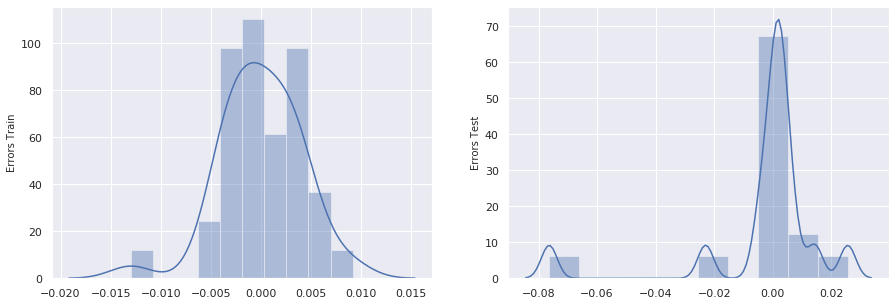

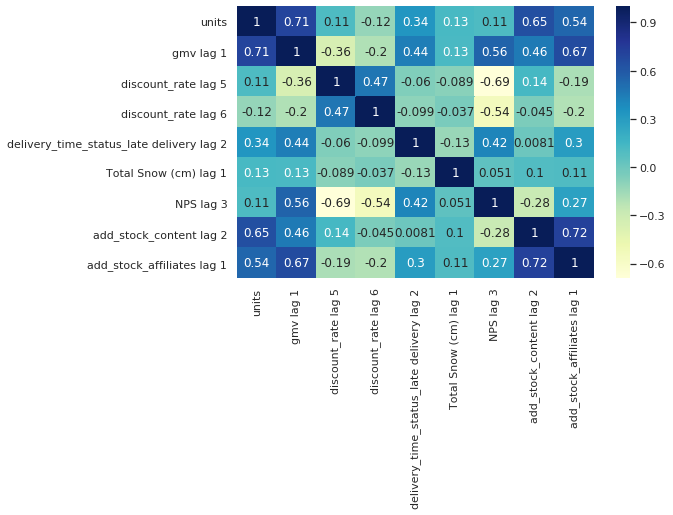

                    0
train r score 0.99977
test r score  0.81118
                 0
rmse_train 0.00396
rmse_test  0.02147


In [836]:
y_train_real_pred, y_test_real_pred, r2_dataframe, rmse_dataframe = predictions_and_residual_analysis_and_rscore(X_train_mult_distlag_iter0, 
                                                                                                 y_train_mult_distlag,
                                                                                                 X_test_mult_distlag,
                                                                                                 y_test_mult_distlag,
                                                                                                 model_iter21)
print(r2_dataframe)
print(rmse_dataframe)

#### There is high variance in the train test scores. This is not the best model for gaming

### Elasticity of  `GMV` (Revenue)
As per economics, elasticity is the measure of how sensitive dependent variable (in our case, revenue) is to a particular independent variable.

<h3><center> $Elasticity_{gmv} = \frac{\frac{\delta{GMV}}{GMV}}{\frac{\delta{feature}}{feature}} $</centre> </h3>


while plotting elasticity, we will know,
1. Whether GMV is directly or indirectly propostional to a particular feature
2. How varying the dependency is?
3. Where exactly the dependency is? and such

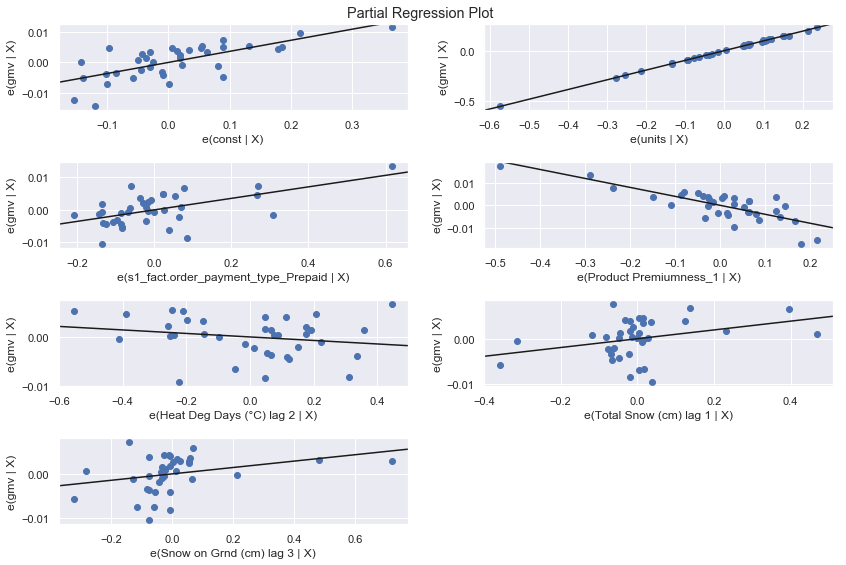

In [948]:
fig = plt.figure(figsize=(12,8))
fig = sm.graphics.plot_partregress_grid(model_iter21, fig=fig)

In [ ]:
### Remarks:
It is evident that,
1. Units have a positive and continuous inpact on the gmv
2. Every Other feature is highly variant positive relation which is not reliable

## Conclusions

1. In each category we estimated models, estimates are always reasonable
2. But we can say `Linear and Multiplicative models` performed well even when other modesl have more test R Squsre scores
3. We come to this conclusion because other models are highly unstable and a slight change in lags is actually changing the model itself
4. This suggests it is better to go for simpler models unless we find the reason for unstability in other lagged models
5. Koyck models are some other models that are reasonable
6. `Highly unreliable are distributed lag and multiplicative distributed lag models`
7. Linear and Multiplicative regression are the best models we got
8. `Units` sold has been the clear winner in explaining GMV